## Sales forecasting
## This notebook uses the *Case2_Market data.xlsx*, *Case2_Sales data.csv* and *Case2_Test Set Template.csv* datasets

Master Degree Program in Data Science and Advanced Analytics

**Group C** </br>
Carolina Caldeira 20230440</br>
Gonçalo Caldeirinha 20230469</br>
Madalena Figueirinhas 20230436</br>
Martyna Kmiecik 20230452</br>
Alina Metzger 20230998</br>

- **Data Provided:**
  - Daily sales data per product group (GCK) from October 2018 to April 2022.
  - Monthly sales forecast test period from May 2022 to February 2023.
  - Macro-economic indices relevant to Siemens' business environment.

**China:**
 - Code: 156
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO156``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP156``
 - Electrical Equipment:
         - Producer Prices: ``PRI27156_org``
         - Production: ``NONE``
 - Machinery and equipment n.e.c. (Production): ``NONE``

**France:**
 - Code: 250
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO250``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP250``
 - Electrical Equipment:
         - Producer Prices: ``PRI27250_org``
         - Production: ``PRO27250_org``
 - Machinery and equipment n.e.c. (Production): ``PRO28250_org``

**Germany:**
 - Code: 276
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO276``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP276``
 - Electrical Equipment:
         - Producer Prices: ``PRI27276_org``
         - Production: ``PRO27276_org``
 - Machinery and equipment n.e.c. (Production): ``PRO28276_org``

**Italy:**
 - Code: 380
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO380``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP380``
 - Electrical Equipment:
         - Producer Prices: ``PRI27380_org``
         - Production: ``PRO27380_org``
 - Machinery and equipment n.e.c. (Production): ``PRO28380_org``

**Japan:**
 - Code: 392
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO392``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP392``
 - Electrical Equipment:
         - Producer Prices: ``NONE``
         - Production: ``PRO27392_org``
 - Machinery and equipment n.e.c. (Production): ``PRO28392_org``

**Switzerland:**
 - Code: 756
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO756``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP756``
 - Electrical Equipment:
         - Producer Prices: ``NONE``
         - Production: ``PRO27756_org``
 - Machinery and equipment n.e.c. (Production): ``PRO28756_org``

**United Kingdom:**
 - Code: 826
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO826``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP826``
 - Electrical Equipment:
         - Producer Prices: ``PRI27826_org``
         - Production: ``PRO27756_org``
 - Machinery and equipment n.e.c. (Production): ``PRO28826_org``

**United States:**
 - Code: 840
 - Production Index Machinery & Electricals: ``MAB_ELE_PRO840``
 - Shipments Index Machinery & Electricals: ``MAB_ELE_SHP840``
 - Electrical Equipment:
         - Producer Prices: ``PRI27840_org``
         - Production: ``NONE``
 - Machinery and equipment n.e.c. (Production): ``PRO28840_org``
 - EUR in LCU: WKLWEUR840_org

**Worldwide Indicators:**
 - Price of Base Metals:  ``RohiBASEMET1000_org``
 - Price of Energy: ``RohiENERGY1000_org``
 - Price of Metals & Minerals: ``RohiMETMIN1000_org``
 - Natural Gas Index: World: ``RohiNATGAS1000_org``
 - Crude Oil Average Price: ``RohCRUDE_PETRO1000_org``
 - Copper Price: ``RohCOPPER1000_org``
 - Electrical Equipment:
         - Producer Prices: ``NONE``
         - Production: ``PRO271000_org``
 - Machinery and equipment n.e.c. (Production): ``PRO271000_org``

# 1. Import the needed libraries

In [1]:
import pandas as pd 
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
#.transpose!pip install openpyxl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, RobustScaler
from sklearn.impute import KNNImputer
from sklearn.neighbors import NearestNeighbors
from sklearn.linear_model import LogisticRegression, LassoCV, RidgeCV, Ridge
from sklearn.feature_selection import RFE, SelectKBest, chi2, f_regression, RFE, SelectFromModel, mutual_info_classif
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, RobustScaler
from sklearn.impute import KNNImputer
from sklearn.neighbors import NearestNeighbors

from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from xgboost import XGBRegressor

from sklearn.feature_selection import mutual_info_regression

from sklearn.linear_model import LogisticRegression, LassoCV, RidgeCV, Ridge
import warnings
warnings.filterwarnings('ignore')

from prophet import Prophet


In [2]:
# Set option to display all rows or columns
pd.set_option('display.max_rows', None)  # Replace None with a specific number if you want to limit the display to a certain number of rows
pd.set_option('display.max_columns', None)  # Replace None with a specific number if you want to limit the display to a certain number of columns

# To display the full content of each cell without truncation
pd.set_option('display.max_colwidth', None)  # Replace None with a specific number if you want to limit the cell content length


In [3]:
# Ensure that the display does not limite the number of columns shown when the Dataframe is displayed
pd.set_option('display.max_columns', None)

In [4]:
# Setting the font sizes of subplots, heatmaps and plots
# Setting the text colour of plots
subPlots_Title_fontSize = 12
subPlots_xAxis_fontSize = 10
subPlots_yAxis_fontSize = 10
subPlots_label_fontSize = 10
heatmaps_text_fontSize = 8

plots_Title_fontSize = 14
plots_Title_textColour = 'black'

plots_Legend_fontSize = 12
plots_Legend_textColour = 'black'

plots_barTexts_fontSize = 8

# 2. Import data

In [5]:
test_data = pd.read_csv('Case2_Test Set Template.csv', sep=";")
test_data_copy = test_data.copy()
test_data_template = test_data.copy()
test_data.head()

,Month Year,Mapped_GCK,Sales_EUR
0,Mai 22,#3,NaN
1,Jun 22,#3,NaN
2,Jul 22,#3,NaN
3,Aug 22,#3,NaN
4,Sep 22,#3,NaN


In [6]:
sales_data = pd.read_csv('Case2_Sales data.csv', sep=";")
data_copy = sales_data.copy()
sales_data.tail()

,DATE,Mapped_GCK,Sales_EUR
9797,23.08.2019,#12,0
9798,23.08.2019,#36,1015
9799,12.08.2019,#12,0
9800,28.08.2019,#8,"43763,91"
9801,27.08.2019,#8,0


In [7]:
market_data = pd.read_excel('Case2_Market data.xlsx')
market_copy = market_data.copy()
market_data.head()

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
3,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779

# 3.Data Exploration

The next step is to explore our data: while this is not the focus for this class, we are just going to check if we don't have missing values and what is the type of data that we have.

In [8]:
# check test data information
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Month Year  140 non-null    object 
 1   Mapped_GCK  140 non-null    object 
 2   Sales_EUR   0 non-null      float64
dtypes: float64(1), object(2)
memory usage: 3.4+ KB


## 3.1 SALES dataset

In [9]:
# check sales data information
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DATE        9802 non-null   object
 1   Mapped_GCK  9802 non-null   object
 2   Sales_EUR   9802 non-null   object
dtypes: object(3)
memory usage: 229.9+ KB


In [10]:
# check for missing values on the sales data
sales_data.isna().sum()

DATE          0
Mapped_GCK    0
Sales_EUR     0
dtype: int64

In [11]:
# check for duplicated values on the sales data
sales_data.duplicated().value_counts()

False    9802
Name: count, dtype: int64

In [12]:
#Convert 'Sales_EUR' to float
sales_data['Sales_EUR'] = sales_data['Sales_EUR'].str.replace(',', '.')
sales_data['Sales_EUR'] = sales_data['Sales_EUR'].astype(float)

#Convert 'DATE' to Date Time
sales_data['DATE'] = pd.to_datetime(sales_data['DATE'], format='%d.%m.%Y')

In [13]:
# Summary statistics for all variables
sales_data.describe(include='all').T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
DATE,9802,NaN,NaN,NaN,2020-07-19 17:55:48.785961984,2018-10-01 00:00:00,2019-08-30 00:00:00,2020-07-26 12:00:00,2021-06-09 00:00:00,2022-04-30 00:00:00,NaN
Mapped_GCK,9802,14,#1,1179,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sales_EUR,9802.0,NaN,NaN,NaN,272785.686663,-506381.17,0.0,0.0,0.0,41127988.02,2230789.1619


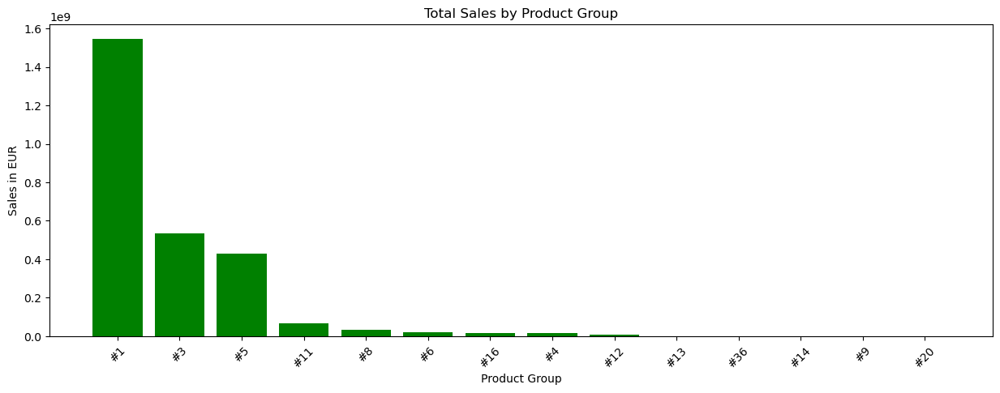

In [14]:
# Group sales_data by 'Mapped_GCK' and aggregate the sales in EUR --> It sums all the sales under each 'Mapped_GCK' category
product_group_sales = sales_data.groupby('Mapped_GCK').agg({'Sales_EUR': 'sum'}).reset_index().sort_values(by='Sales_EUR', ascending=False)

# Setting the figure size for the plot --> ensure its large enough
plt.figure(figsize=(15, 5))

# Creating a bar chart to visualize the total sales by product group
plt.bar(product_group_sales['Mapped_GCK'], product_group_sales['Sales_EUR'], color='g')
# Add a title
plt.title('Total Sales by Product Group')
# Label the x-axis
plt.xlabel('Product Group')
# Label the y-axis
plt.ylabel('Sales in EUR')
plt.xticks(rotation=45) #rotate the x label --> ensure readability
plt.show()

In [15]:
# check the first 5 rows of the sales data
sales_data.head()

,DATE,Mapped_GCK,Sales_EUR
0,2018-10-01,#1,0.0
1,2018-10-02,#1,0.0
2,2018-10-03,#1,0.0
3,2018-10-04,#1,0.0
4,2018-10-05,#1,0.0


- Some products had a much higher total sales (``Sales_EUR``) value when compared to others, this is the case of ``GDK_1``, ``GDK_3`` and ``GDK_5``.

In [16]:
# Aggregate sales data by month so we can se the general month trends
sales_data_monthly = sales_data.resample('M', on='DATE').sum(numeric_only=True)
sales_data_monthly.index = sales_data_monthly.index.to_period('M').to_timestamp()

In [17]:
# check the first five rows of the monthly sales data
sales_data_monthly.head()

,Sales_EUR
DATE,
2018-10-01,49471370.83
2018-11-01,30760578.47
2018-12-01,61312068.79
2019-01-01,51360149.23
2019-02-01,54336933.67


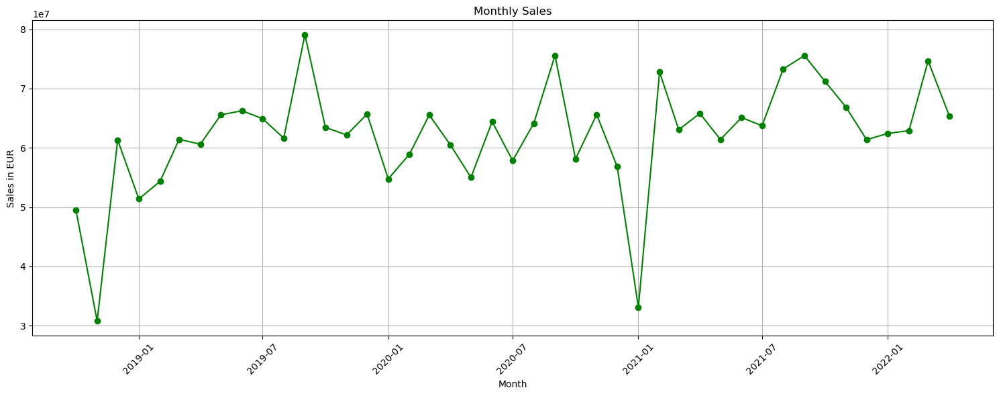

In [18]:
# Setting the figure size for the plot --> ensure its large enough
plt.figure(figsize=(15, 6))

# Plotting the monthly sales data
plt.plot(sales_data_monthly.index, sales_data_monthly['Sales_EUR'], marker='o', linestyle='-', color='g')
# Add a title
plt.title('Monthly Sales')
# Label x-axis
plt.xlabel('Month')
# Label y-axis
plt.ylabel('Sales in EUR')
# Add grid --> better visualization of the values 
plt.grid(True)
plt.xticks(rotation=45) #rotate the x label --> ensure readability
# Adjust the layout --> improve presentation of the plot
plt.tight_layout()
plt.show()

- It might be helpful to look into specific years or months more closely, identify any outliers or significant spikes in sales, and understand the context around them.
- The analysis of total sales per month shows that there are significant peaks in certain months where sales have fallen significantly.
- There are also days when there are negative sales. We need to figure out what might have happened and how we will deal with these figures, if necessary.

In [19]:
def aggregated_sales(df):
    # Convert DATE to 'month_year' --> aggregate data on a monthly basis
    df['month_year'] = pd.to_datetime(df['DATE'], format='%d.%m.%Y').dt.to_period('M')
    
    # Group by 'month_year' and 'Mapped_GCK'
    # 'Sales_EUR' for each group are summed and then unstack to get the desired shape, filling the missing values to maintain consistency
    result_df = df.groupby(['month_year', 'Mapped_GCK'])['Sales_EUR'].sum().unstack(fill_value=0)
    
    # Rename the columns as required --> 'GDK_(specific number)' format
    result_df.columns = [f'GDK_{col.strip("#")}' for col in result_df.columns]
    # All 0 values are replaced with 1 --> for analysis purposes
    result_df = result_df.replace(0, 1)
    
    return result_df

### Creating a sales data set where each column is a product

In [20]:
# Apply the function 'aggregated_sales' created above on the sales data
monthly_sales = aggregated_sales(sales_data)
# Select the columns to keep on 'monthly_sales' dataframe
monthly_sales = monthly_sales[['GDK_1','GDK_3','GDK_4','GDK_5','GDK_6','GDK_8','GDK_9','GDK_11','GDK_12','GDK_13','GDK_14',
                               'GDK_16','GDK_20','GDK_36']]
# Show the first five rows
monthly_sales.head()

,GDK_1,GDK_3,GDK_4,GDK_5,GDK_6,GDK_8,GDK_9,GDK_11,GDK_12,GDK_13,GDK_14,GDK_16,GDK_20,GDK_36
month_year,,,,,,,,,,,,,,
2018-10,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.0,333196.87,4563.14,6474.60
2018-11,5140760.00,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.0,1377694.32,5798.14,21617.61
2018-12,37889612.12,8736859.39,430100.96,6947507.31,999472.69,271490.71,1.00,1226122.00,17880.60,15655.18,1.0,4762524.66,918.65,13924.52
2019-01,27728148.35,10705300.63,484173.88,8233205.07,598874.10,381400.15,1487.00,2216391.74,21484.00,27198.29,1686.4,942957.19,2398.04,15444.39
2019-02,34793163.53,10167796.86,620031.80,6879250.99,542037.52,368475.57,3234.28,610456.60,34214.74,32638.63,19196.3,257765.04,620.66,8051.15


### 3.1.1 Plots

In [21]:
# Function that takes a dataframe of aggregated sales data and plot it over time, each line is a group
def plot_aggregated_sales(aggregated_sales_df):
    # Setting the figure size for the plot --> ensure its large enough
    plt.figure(figsize=(15, 7)) 
    # Loop through each column in the dataframe, each column is a different product group, and plot its sales over time
    # Index is the time dimension
    for column in aggregated_sales_df.columns:
        plt.plot(aggregated_sales_df.index.astype(str), aggregated_sales_df[column], marker='o', label=column)

    # Add a title
    plt.title('Aggregated Sales Over Time')
    # Label x-axis
    plt.xlabel('Month_Year')
    # Label y-axis
    plt.ylabel('Sales (EUR)')
    plt.xticks(rotation=45)  #rotate the x-axis labels --> better readability
    plt.legend()  #add a legend --> to distinguish the product lines
    plt.tight_layout()  #adjust the layout --> to fit the labels
    #plt.grid(True)  #add grid --> better readability
    plt.show()

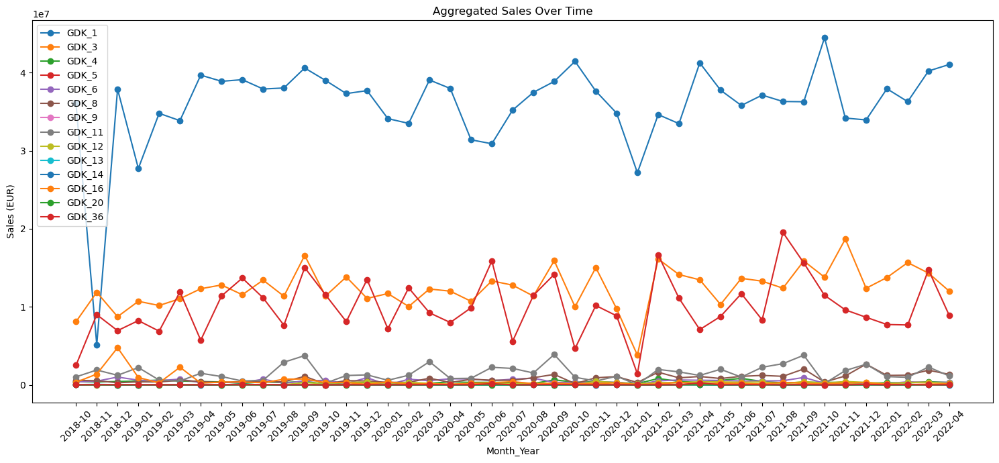

In [22]:
plot_aggregated_sales(monthly_sales)

In [23]:
# Function that takes a dataframe of aggregated sales data and a list of specific GCKs to plot 
# Generates a line plot for each of the selected GCKs, presenting their sales over time
def plot_selected_gcks(aggregated_sales_df, selected_gcks):
    # Setting the figure size for the plot --> ensure its large enough
    plt.figure(figsize=(15, 7))  
    # Iterate through the list of selected GCKs to only plot those specified
    for gck in selected_gcks:
        # Construct the column name by appending 'GDK_' prefix to each GCK value
        col_name = f'GDK_{gck}'  
        # Check if the column name exists in the dataframe
        if col_name in aggregated_sales_df.columns:
            # Plot the sales data for the selected GCK
            plt.plot(aggregated_sales_df.index.astype(str), aggregated_sales_df[col_name], marker='o', label=col_name)

    # Add a title
    plt.title('Aggregated Sales for Selected GCKs Over Time')
    # Label x-axis
    plt.xlabel('Month_Year')
    # Label y-axis
    plt.ylabel('Sales (EUR)')
    plt.xticks(rotation=45)  #rotate the x-axis labels --> better readability
    plt.legend()  #add a legend --> to distinguish the product lines
    plt.tight_layout()  #adjust the layout --> to fit the labels
    #plt.grid(True)  #add grid --> better readability
    plt.show()

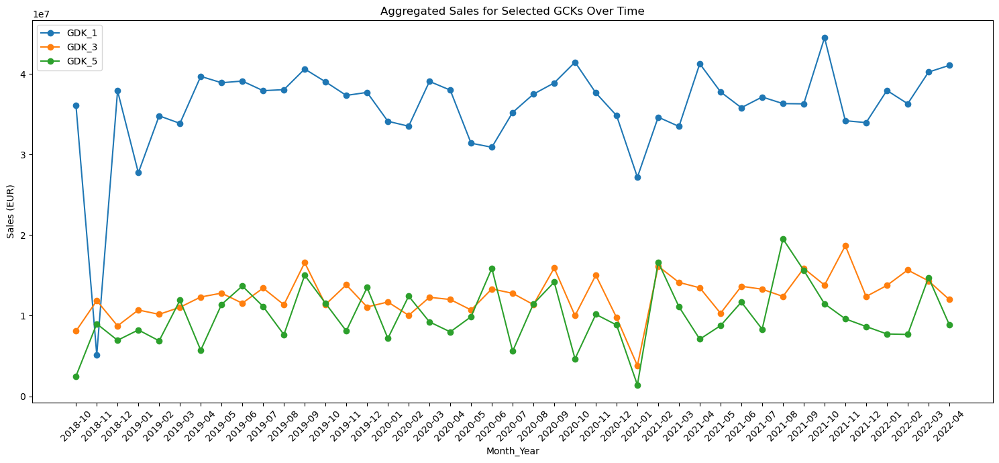

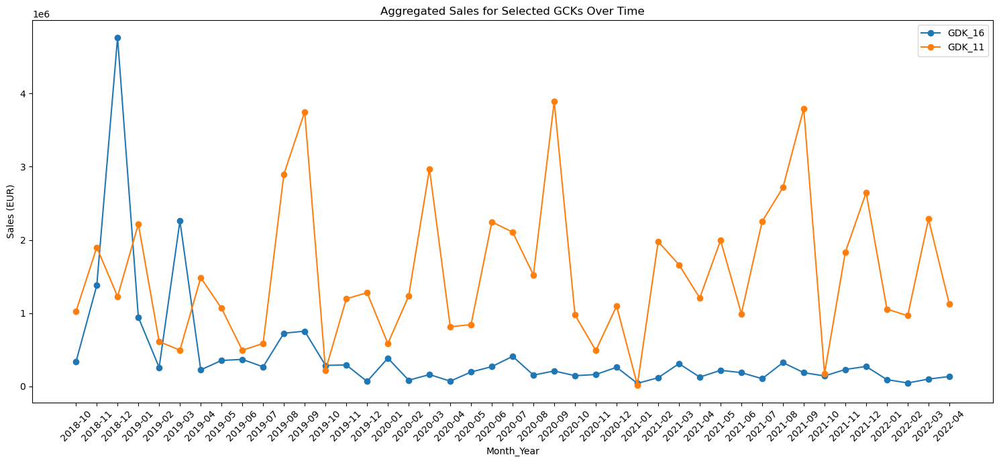

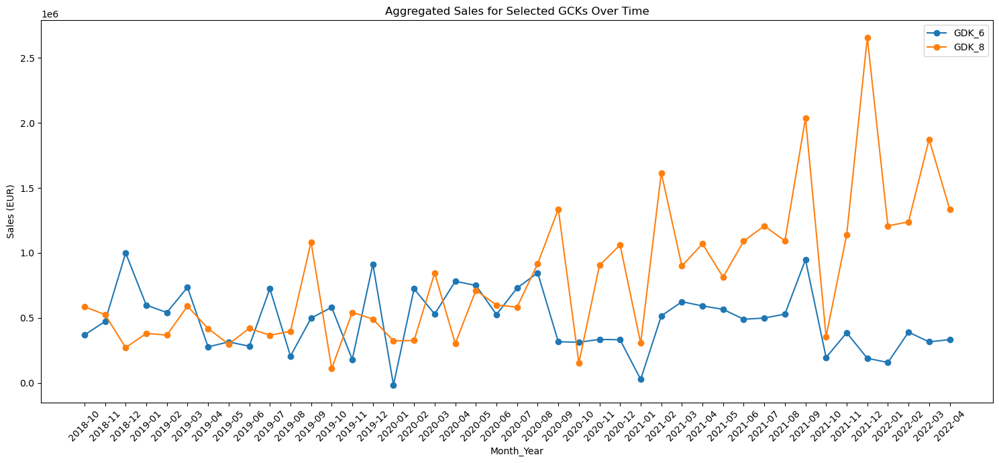

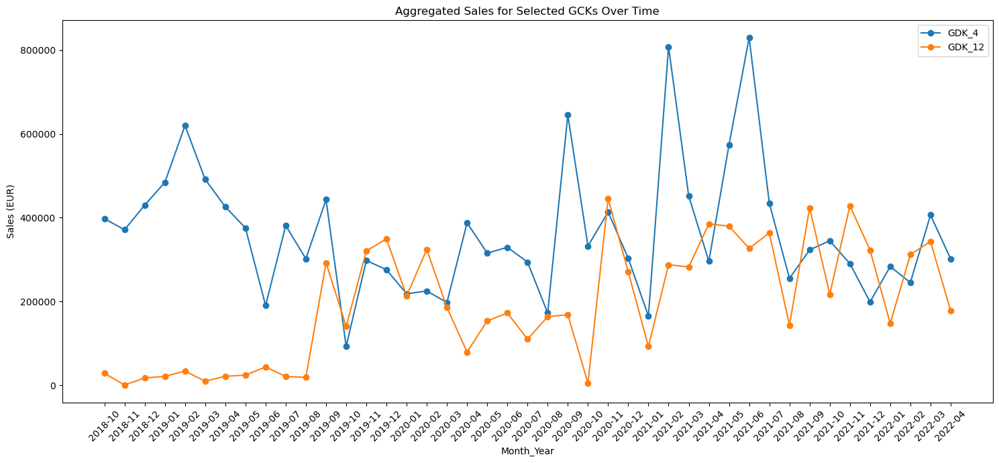

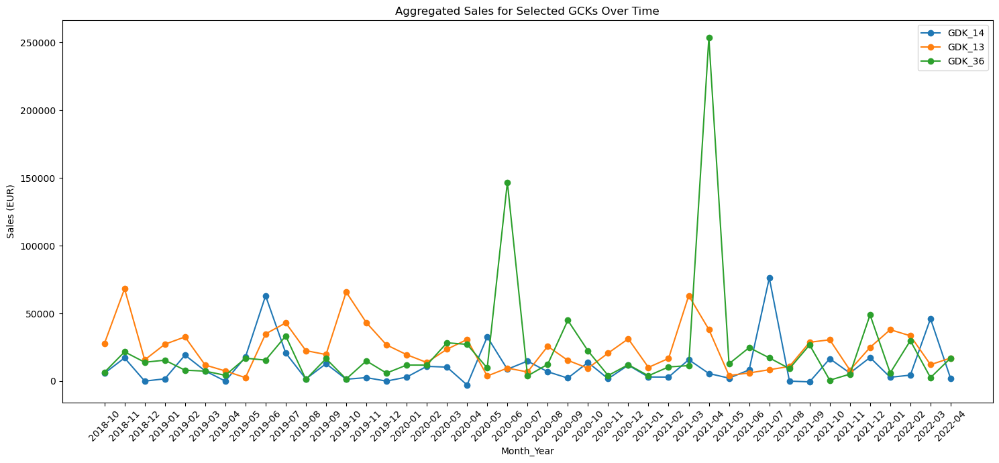

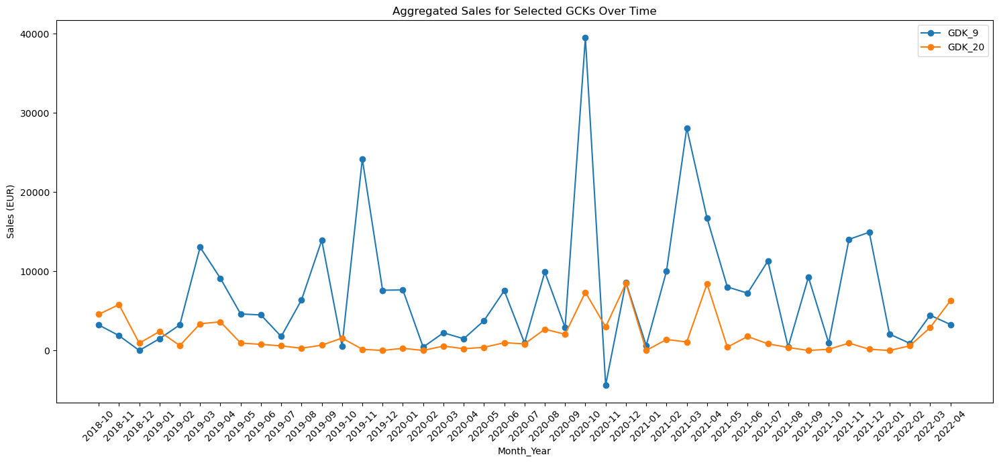

In [24]:
# Create different groups of GCKs and apply the previous function to generate separate plots for each group
# Allows for specific analysis of sales trends within each specific subset of GCKs
gcks_1 = [1, 3, 5]
gcks_2 = [16, 11]
gcks_3 = [6, 8]
gcks_4 = [4, 12]
gcks_5 = [14, 13, 36]
gcks_6 = [9, 20]

plot_selected_gcks(monthly_sales, gcks_1)
plot_selected_gcks(monthly_sales, gcks_2)
plot_selected_gcks(monthly_sales, gcks_3)
plot_selected_gcks(monthly_sales, gcks_4)
plot_selected_gcks(monthly_sales, gcks_5)
plot_selected_gcks(monthly_sales, gcks_6)

## 3.2 MARKET dataset
The market data is structured with numerous macroeconomic indicators, including production and shipments indices for machinery and electricals across different countries, as well as specific indices for various sectors within multiple geographies.

In [25]:
# display a dataframe with no limit in the number of columns shown
pd.set_option('display.max_columns', None)

In [26]:
# check market data information
market_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221 entries, 0 to 220
Data columns (total 48 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Unnamed: 0           221 non-null    object
 1   China                221 non-null    object
 2   China.1              221 non-null    object
 3   France               221 non-null    object
 4   France.1             221 non-null    object
 5   Germany              221 non-null    object
 6   Germany.1            221 non-null    object
 7   Italy                221 non-null    object
 8   Italy.1              221 non-null    object
 9   Japan                221 non-null    object
 10  Japan.1              221 non-null    object
 11  Switzerland          220 non-null    object
 12  Switzerland.1        220 non-null    object
 13  United Kingdom       221 non-null    object
 14  United Kingdom.1     203 non-null    object
 15  United States        221 non-null    object
 16  United S

In [27]:
# check the first 3 rows of the market data
market_data.head(3)

,Unnamed: 0,China,China.1,France,France.1,Germany,Germany.1,Italy,Italy.1,Japan,Japan.1,Switzerland,Switzerland.1,United Kingdom,United Kingdom.1,United States,United States.1,Europe,Europe.1,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Producer Prices,Producer Prices.1,Producer Prices.2,Producer Prices.3,Producer Prices.4,Producer Prices.5,production index,production index.1,production index.2,production index.3,production index.4,production index.5,production index.6,production index.7,production index.8,production index.9,production index.10,production index.11,production index.12,production index.13,production index.14,production index.15
0,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132


In [28]:
# Define the data as a dictionary
country_data = {
    'China': {
        'Code': '156',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO156',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP156',
        'Electrical Equipment Producer Prices': 'PRI27156_org'
    },
    'France': {
        'Code': '250',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO250',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP250',
        'Electrical Equipment Producer Prices': 'PRI27250_org',
        'Electrical Equipment Production': 'PRO27250_org',
        'Machinery and equipment n.e.c. (Production)': 'PRO28250_org'
    },
    'Germany': {
        'Code': '276',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO276',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP276',
        'Electrical Equipment Producer Prices': 'PRI27276_org',
        'Electrical Equipment Production': 'PRO27276_org',
        'Machinery and equipment n.e.c. (Production)': 'PRO28276_org'
    },
    'Italy': {
        'Code': '380',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO380',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP380',
        'Electrical Equipment Producer Prices': 'PRI27380_org',
        'Electrical Equipment Production': 'PRO27380_org',
        'Machinery and equipment n.e.c. (Production)': 'PRO28380_org'
    },
    'Japan': {
        'Code': '392',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO392',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP392',
        'Electrical Equipment Production': 'PRO27392_org',
        'Machinery and equipment n.e.c. (Production)': 'PRO28392_org'
    },
    'Switzerland': {
        'Code': '756',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO756',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP756',
        'Electrical Equipment Production': 'PRO27756_org',
        'Machinery and equipment n.e.c. (Production)': 'PRO28756_org'
    },
    'United Kingdom': {
        'Code': '826',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO826',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP826',
        'Electrical Equipment Producer Prices': 'PRI27826_org',
        'Electrical Equipment Production': 'PRO27826_org',
        'Machinery and equipment n.e.c. (Production)': 'PRO28826_org'
    },
    'United States': {
        'Code': '840',
        'Production Index Machinery & Electricals': 'MAB_ELE_PRO840',
        'Shipments Index Machinery & Electricals': 'MAB_ELE_SHP840',
        'Electrical Equipment Producer Prices': 'PRI27840_org',
        'Machinery and equipment n.e.c. (Production)': 'PRO28840_org',
        'EUR in LCU': 'WKLWEUR840_org'
    }    
}

# Define the world indicators as another dictionary
world_indicators = {
    'Price of Base Metals': 'RohiBASEMET1000_org',
    'Price of Energy': 'RohiENERGY1000_org',
    'Price of Metals & Minerals': 'RohiMETMIN1000_org',
    'Natural Gas Index': 'RohiNATGAS1000_org',
    'Crude Oil Average Price': 'RohCRUDE_PETRO1000_org',
    'Copper Price': 'RohCOPPER1000_org',
    'Electrical Equipment Producer Prices': None,
    'Electrical Equipment Production': 'PRO271000_org',
    'Machinery and equipment n.e.c. Production': 'PRO271000_org'
}

# Combine both dictionaries into two DataFrames: 'df_countries', 'df_world_indicators'
df_countries = pd.DataFrame.from_dict(country_data, orient='index')
df_world_indicators = pd.DataFrame(world_indicators, index=['Worldwide Indicators'])

In [29]:
df_countries

,Code,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Electrical Equipment Producer Prices,Electrical Equipment Production,Machinery and equipment n.e.c. (Production),EUR in LCU
China,156,MAB_ELE_PRO156,MAB_ELE_SHP156,PRI27156_org,NaN,NaN,NaN
France,250,MAB_ELE_PRO250,MAB_ELE_SHP250,PRI27250_org,PRO27250_org,PRO28250_org,NaN
Germany,276,MAB_ELE_PRO276,MAB_ELE_SHP276,PRI27276_org,PRO27276_org,PRO28276_org,NaN
Italy,380,MAB_ELE_PRO380,MAB_ELE_SHP380,PRI27380_org,PRO27380_org,PRO28380_org,NaN
Japan,392,MAB_ELE_PRO392,MAB_ELE_SHP392,NaN,PRO27392_org,PRO28392_org,NaN
Switzerland,756,MAB_ELE_PRO756,MAB_ELE_SHP756,NaN,PRO27756_org,PRO28756_org,NaN
United Kingdom,826,MAB_ELE_PRO826,MAB_ELE_SHP826,PRI27826_org,PRO27826_org,PRO28826_org,NaN
United States,840,MAB_ELE_PRO840,MAB_ELE_SHP840,PRI27840_org,NaN,PRO28840_org,WKLWEUR840_org


In [30]:
# Set the header to be the second row of the market data
new_header = market_data.iloc[1] 
# Create 'market2' by skipping the first two rows of the market data
market2 = market_data[2:] 
# Set the columns of 'market2' to be the header
market2.columns = new_header

market2 = market2.copy()
market2

1,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
2,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
3,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
4,2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,NaN,93.440903,NaN,103.484955,100.16909,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
5,2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.378729,79.598021,110.6452,74.591883,108.425887,87.463813,101.275727,84.485767,51.230356,53.590898,46.468392,99.04452,47.517121,36.278433,1.2007,80.798828,80.757423,93.852425,NaN,93.546127,NaN,103.643944,99.581436,96.391954,105.885359,131.988998,101.990361,116.64975,88.082901,117.899216,NaN,66.4145,119.269534,143.860535,101.60871,96.616508,84.675552
6,2004m6,27.009138,27.009138,133.785737,106.641482,99.010814,95.10874,136.424935,110.889719,120.33292,119.61638,85.13495,79.455239,122.02096,82.343346,110.569933,97.364496,112.057197,96.963294,52.876331,50.799575,47.803913,98.636267,44.967605,35.65738,1.2138,80.91349,80.552711,93.956467,NaN,93.440903,NaN,106.062668,109.27771,98.990373,118.252278,132.988922,122.136575,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.45871,95.401802
7,2004m7,23.590959,23.590959,117.405904,89.302781,94.200318,89.646239,140.351467,106.133436,118.140547,116.438941,84.324925,78.702987,112.620947,77.109447,104.538671,84.691023,104.089388,88.061626,54.771829,53.953416,49.341893,95.775539,47.939813,37.272915,1.2266,80.974838,80.552711,94.060524,NaN,93.440903,NaN,99.118011,102.110336,96.391954,108.951537,135.588715,118.880825,122.030464,95.682213,115.277336,NaN,63.546099,119.269534,151.288528,116.631115,109.915596,91.48259
8,2004m8,24.280597,24.280597,79.137033,71.798962,82.804844,80.197268,54.397252,49.046004,106.243773,107.615706,83.514901,77.950734,102.724312,70.849033,107.164223,88.294735,80.476626,71.158884,54.087599,58.14188,48.786719,89.649886,53.243495,37.772771,1.2176,81.121933,80.962135,94.268616,NaN,93.440903,NaN,100.78627,90.885391,93.793535,97.095648,53.495544,109.858584,79.492393,83.246979,119.799347,NaN,65.815603,112.922862,56.467911,98.873136,78.561462,81.993988
9,2004m9,25.989

In [31]:
# Convert date column string to date format (YYYY-MM)
market2['date'] = market2['date'].str.strip()
market2['date'] = pd.to_datetime(market2['date'], format='%Ym%m')
market2['date'] = market2['date'].dt.strftime('%Y-%m')

# Rename the column name 'date' to 'DATE'
market2 = market2.rename(columns={'date': 'DATE'})

# Iterate through the columns in market2
for col in market2.columns:
    # If the column data type is object and not the 'DATE' column
    if market2[col].dtype == 'object' and col != 'DATE':
        # Convert to float
        market2[col] = market2[col].astype(float)

# Convert the 'DATE' column to datetime format
market2['DATE'] = pd.to_datetime(market2['DATE'])
# Set 'DATE' as the index
market2.set_index('DATE', inplace=True)

# market2.index = market2.index.to_period('M')

# list of new column names that are intended to substitute the existing ones --> for interpretation and clarity
new_col = ['CHN_MC_EL_PROD','CHN_MC_EL_SHIP','FRA_MC_EL_PROD','FRA_MC_EL_SHIP','DEU_MC_EL_PROD','DEU_MC_EL_SHIP','ITA_MC_EL_PROD'
,'ITA_MC_EL_SHIP','JPN_MC_EL_PROD','JPN_MC_EL_SHIP','CHE_MC_EL_PROD','CHE_MC_EL_SHIP','GBR_MC_EL_PROD','GBR_MC_EL_SHIP'
,'USA_MC_EL_PROD','USA_MC_EL_SHIP','EU_MC_EL_PROD','EU_MC_EL_SHIP','WRL_BASE_METAL_PRICE','WRL_ENERGY_PRICE'
,'WRL_METAL_MINERAL_PRICE','WRL_GAS','WRL_AVG_OIL_PRICE','WRL_COPPER_PRICE','USA_EUR_LCU','USA_EE_PRODUCER_PRICE'
,'GBR_EE_PRODUCER_PRICE','ITA_EE_PRODUCER_PRICE','FRA_EE_PRODUCER_PRICE','DEU_EE_PRODUCER_PRICE','CHN_EE_PRODUCER_PRICE'
,'USA_MC_EQ_PROD','WRL_MC_EQ_PROD','CHE_MC_EQ_PROD','GBR_MC_EQ_PROD','ITA_MC_EQ_PROD','JPN_MC_EQ_PROD','FRA_MC_EQ_PROD'
,'DEU_MC_EQ_PROD','USA_EE_PROD','WRL_EE_PROD','CHE_EE_PROD','GBR_EE_PROD','ITA_EE_PROD','JPN_EE_PROD','FRA_EE_PROD',
 'DEU_EE_PROD']

# Iterate over the range of the number of columns in market2
for i in range(len(market2.columns)):
    # Rename each column name by replacing the existing one by the correspondent in the 'new_col' list
    market2.rename(columns={market2.columns[i]: new_col[i]}, inplace=True)

# check the first five rows of market2
market2.head(5)

1,CHN_MC_EL_PROD,CHN_MC_EL_SHIP,FRA_MC_EL_PROD,FRA_MC_EL_SHIP,DEU_MC_EL_PROD,DEU_MC_EL_SHIP,ITA_MC_EL_PROD,ITA_MC_EL_SHIP,JPN_MC_EL_PROD,JPN_MC_EL_SHIP,CHE_MC_EL_PROD,CHE_MC_EL_SHIP,GBR_MC_EL_PROD,GBR_MC_EL_SHIP,USA_MC_EL_PROD,USA_MC_EL_SHIP,EU_MC_EL_PROD,EU_MC_EL_SHIP,WRL_BASE_METAL_PRICE,WRL_ENERGY_PRICE,WRL_METAL_MINERAL_PRICE,WRL_GAS,WRL_AVG_OIL_PRICE,WRL_COPPER_PRICE,USA_EUR_LCU,USA_EE_PRODUCER_PRICE,GBR_EE_PRODUCER_PRICE,ITA_EE_PRODUCER_PRICE,FRA_EE_PRODUCER_PRICE,DEU_EE_PRODUCER_PRICE,CHN_EE_PRODUCER_PRICE,USA_MC_EQ_PROD,WRL_MC_EQ_PROD,CHE_MC_EQ_PROD,GBR_MC_EQ_PROD,ITA_MC_EQ_PROD,JPN_MC_EQ_PROD,FRA_MC_EQ_PROD,DEU_MC_EQ_PROD,USA_EE_PROD,WRL_EE_PROD,CHE_EE_PROD,GBR_EE_PROD,ITA_EE_PROD,JPN_EE_PROD,FRA_EE_PROD,DEU_EE_PROD
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-02-01,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,110.495272,91.221862,89.987275,111.353812,73.601265,107.601400,79.240230,97.122911,80.098530,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.100000,106.191977,116.790276,110.890034,118.274109,80.829010,117.723991,NaN,81.100000,120.706516,141.510864,106.161262,102.077057,85.913200
2004-03-01,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.627480,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,NaN,76.690307,138.309550,152.880234,140.288741,117.225685,97.670815
2004-04-01,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,NaN,93.440903,NaN,103.484955,100.169090,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,NaN,71.552403,115.557330,137.796875,106.271197,105.335777,87.253983
2004-05-01,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.378729,79.598021,110.645200,74.591883,108.425887,87.463813,101.275727,84.485767,51.230356,53.590898,46.468392,99.044520,47.517121,36.278433,1.2007,80.798828,80.757423,93.852425,NaN,93.546127,NaN,103.643944,99.581436,96.391954,105.885359,131.988998,101.990361,116.649750,88.082901,117.899216,NaN,66.414500,119.269534,143.860535,101.608710,96.616508,84.675552
2004-06-01,27.009138,27.009138,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,119.616380,85.134950,79.455239,122.020960,82.343346,110.569933,97.364496,112.057197,96.963294,52.876331,50.799575,47.803913,98.636267,44.967605,35.657380,1.2138,80.913490,80.552711,93.956467,NaN,93.440903,NaN,106.062668,109.277710,98.990373,118.252278,132.988922,122.136575,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.458710,95.401802


In [32]:
# check for missing values in market2
market2.isna().sum()

1
CHN_MC_EL_PROD              0
CHN_MC_EL_SHIP              0
FRA_MC_EL_PROD              0
FRA_MC_EL_SHIP              0
DEU_MC_EL_PROD              0
DEU_MC_EL_SHIP              0
ITA_MC_EL_PROD              0
ITA_MC_EL_SHIP              0
JPN_MC_EL_PROD              0
JPN_MC_EL_SHIP              0
CHE_MC_EL_PROD              1
CHE_MC_EL_SHIP              1
GBR_MC_EL_PROD              0
GBR_MC_EL_SHIP             18
USA_MC_EL_PROD              0
USA_MC_EL_SHIP              1
EU_MC_EL_PROD               0
EU_MC_EL_SHIP               0
WRL_BASE_METAL_PRICE        0
WRL_ENERGY_PRICE            0
WRL_METAL_MINERAL_PRICE     0
WRL_GAS                     0
WRL_AVG_OIL_PRICE           0
WRL_COPPER_PRICE            0
USA_EUR_LCU                 0
USA_EE_PRODUCER_PRICE       0
GBR_EE_PRODUCER_PRICE      18
ITA_EE_PRODUCER_PRICE       0
FRA_EE_PRODUCER_PRICE      35
DEU_EE_PRODUCER_PRICE       0
CHN_EE_PRODUCER_PRICE      23
USA_MC_EQ_PROD              0
WRL_MC_EQ_PROD              0
CHE_MC_E

**Missing values:**
  - MAB_ELE_PRO756, MAB_ELE_SHP756, MAB_ELE_SHP840, PRO28756_org  and PRO27756_org-> 1
  - PRO271000_org -> 11
  - MAB_ELE_SHP826 and PRI27826_org -> 18
  - PRI27156_org -> 23
  - PRI27250_org -> 35

In [33]:
# check for duplicated values in market2
market2.duplicated().value_counts()

False    219
Name: count, dtype: int64

In [34]:
# Splitting the market2 DataFrame into four parts: columns 1-17, 18-23, 25-30, 32-48
Production_and_Shipment_Index_Machinery_Electricals = market2.iloc[:, 0:18]  #columns 1-17
Prices_Indexes = market2.iloc[:, 18:24]  #columns 18-23
Producer_Prices_Electrical_equipment = market2.iloc[:, 25:31]  #columns 25-30
Production_index_Machinery_equipment = market2.iloc[:, 32:49]  #columns 32-48

### 3.2.1 Production and Shipment Index Machinery Electrical

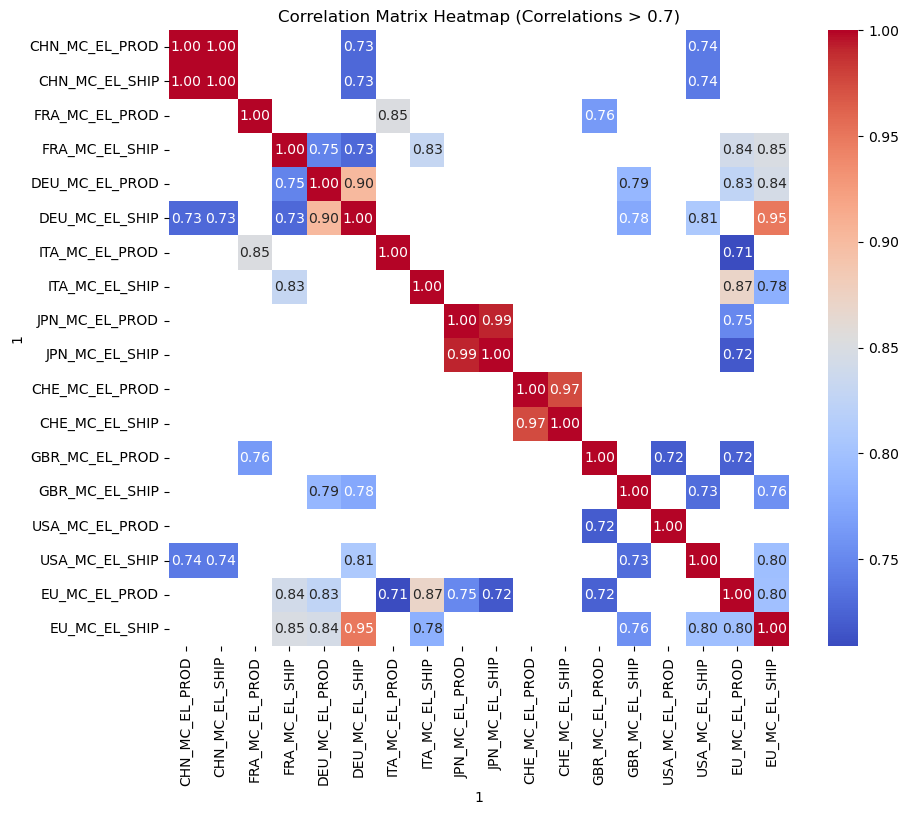

In [35]:
# Calculate the Pearson correlation coefficient between all pairs of columns
correlation_prod_ship = Production_and_Shipment_Index_Machinery_Electricals.corr(method='pearson')

# Create a mask to hide correlations that are 0.7 or below --> only correlations greater than 0.7 will appear in the heatmap
mask = correlation_prod_ship <= 0.7
# Setting the figure size for the plot --> ensure its large enough
plt.figure(figsize=(10, 8))

# Create the heatmap using the mask parameter
# 'annot=True' --> displays the correlation values in each cell of the heatmap;
# 'fmt=".2f"' formats these numbers to two decimal places, 'cmap='coolwarm'' sets the color scheme;
# 'cbar=True' includes a color bar --> interpretation of the color intensity
heatmap = sns.heatmap(correlation_prod_ship, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, mask=mask)
# Add a title
plt.title('Correlation Matrix Heatmap (Correlations > 0.7)')
plt.show()

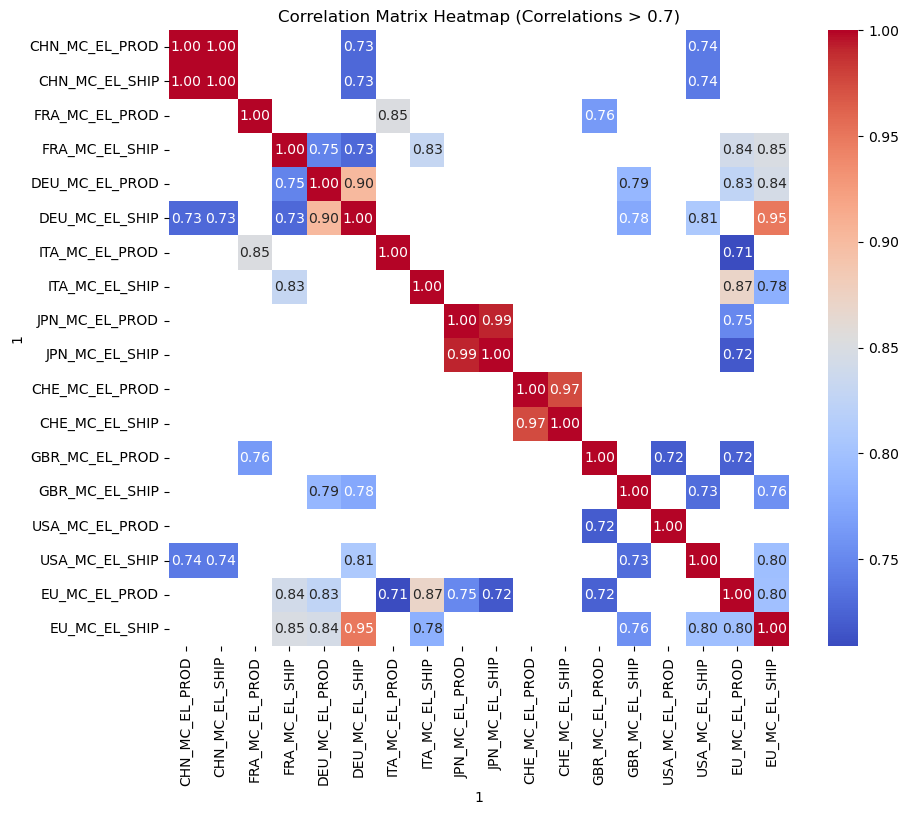

In [36]:
correlation_prod_ship = Production_and_Shipment_Index_Machinery_Electricals.corr(method='pearson')

mask = correlation_prod_ship <= 0.7

# Setting the figure size for the plot --> ensure its large enough
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(correlation_prod_ship, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, mask=mask)
# Add a title
plt.title('Correlation Matrix Heatmap (Correlations > 0.7)')
plt.show()

### 3.2.2 Prices Indexes

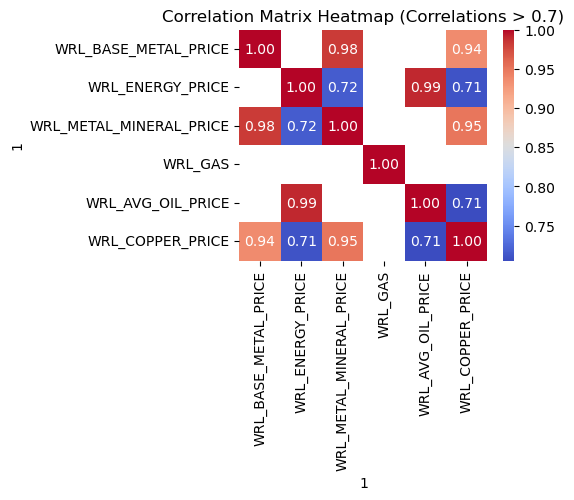

In [37]:
# Calculate the Pearson correlation coefficient between all pairs of columns
correlation_prices = Prices_Indexes.corr(method='pearson')

# Create a mask to hide correlations that are 0.7 or below --> only correlations greater than 0.7 will appear in the heatmap
mask = correlation_prices <= 0.7
# Setting the figure size for the plot
plt.figure(figsize=(4, 3))

# Create the heatmap using the mask parameter
# 'annot=True' --> displays the correlation values in each cell of the heatmap;
# 'fmt=".2f"' formats these numbers to two decimal places, 'cmap='coolwarm'' sets the color scheme;
# 'cbar=True' includes a color bar --> interpretation of the color intensity
heatmap = sns.heatmap(correlation_prices, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, mask=mask)
# Add a title
plt.title('Correlation Matrix Heatmap (Correlations > 0.7)')
plt.show()

### 3.2.3 Producer Prices Electrical Equipment

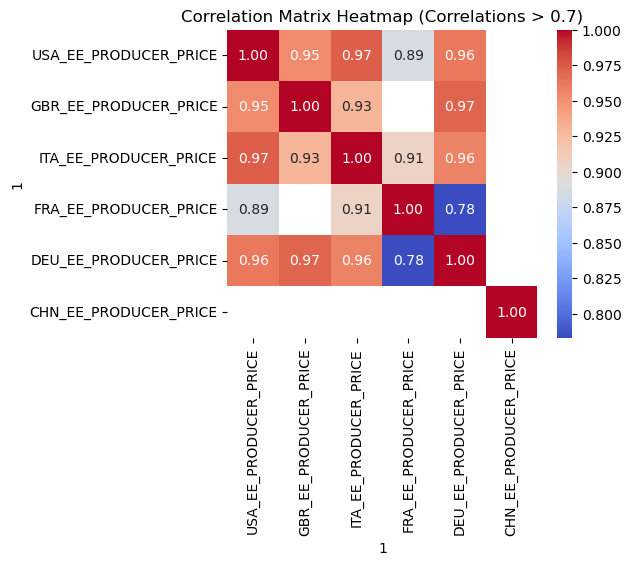

In [38]:
# Calculate the Pearson correlation coefficient between all pairs of columns
correlation_prices_el = Producer_Prices_Electrical_equipment.corr(method='pearson')

# Create a mask to hide correlations that are 0.7 or below --> only correlations greater than 0.7 will appear in the heatmap
mask = correlation_prices_el <= 0.7
# Setting the figure size for the plot 
plt.figure(figsize=(5, 4))

# Create the heatmap using the mask parameter
# 'annot=True' --> displays the correlation values in each cell of the heatmap;
# 'fmt=".2f"' formats these numbers to two decimal places, 'cmap='coolwarm'' sets the color scheme;
# 'cbar=True' includes a color bar --> interpretation of the color intensity
heatmap = sns.heatmap(correlation_prices_el, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, mask=mask)
plt.title('Correlation Matrix Heatmap (Correlations > 0.7)')
plt.show()

### 3.2.4 Production Index Machinery Equipment

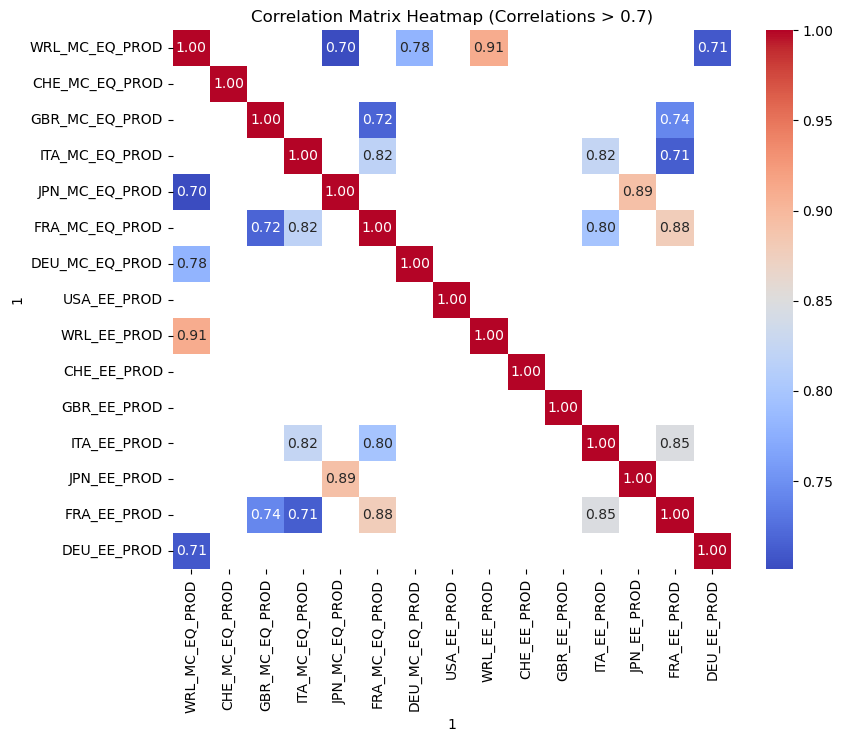

In [39]:
# Calculate the Pearson correlation coefficient between all pairs of columns
correlation_mach = Production_index_Machinery_equipment.corr(method='pearson')

# Create a mask to hide correlations that are 0.7 or below --> only correlations greater than 0.7 will appear in the heatmap
mask = correlation_mach <= 0.7
# Setting the figure size for the plot --> ensure its large enough
plt.figure(figsize=(9, 7))

# Create the heatmap using the mask parameter
# 'annot=True' --> displays the correlation values in each cell of the heatmap;
# 'fmt=".2f"' formats these numbers to two decimal places, 'cmap='coolwarm'' sets the color scheme;
# 'cbar=True' includes a color bar --> interpretation of the color intensity
heatmap = sns.heatmap(correlation_mach, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, mask=mask)
# Add a title
plt.title('Correlation Matrix Heatmap (Correlations > 0.7)')
plt.show()

### 3.2.5 Germany's market

In [40]:
# Filter 'df_countries' to only include rows where the column 'Code' = '276' (Germany)
df_countries[df_countries['Code'] == '276']

,Code,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Electrical Equipment Producer Prices,Electrical Equipment Production,Machinery and equipment n.e.c. (Production),EUR in LCU
Germany,276,MAB_ELE_PRO276,MAB_ELE_SHP276,PRI27276_org,PRO27276_org,PRO28276_org,NaN


In [41]:
# Copy 'market2' and reset its index
market2_df = market2.copy().reset_index()
# List of columns for analyzing the German market
_cols = ['DATE', 'DEU_MC_EL_PROD', 'DEU_MC_EL_SHIP', 'DEU_EE_PRODUCER_PRICE', 'DEU_MC_EQ_PROD', 'DEU_EE_PROD']

# Extract only the columns listed above from 'market2_df' and store them on a new DataFrame: 'germany_market' 
germany_market = market2_df[_cols]

# Create a dictionary mapping old column names to new one --> more descriptive
renamed_columns = {
    'DATE': 'Date',
    'DEU_MC_EL_PROD': 'Production_Index',
    'DEU_MC_EL_SHIP': 'Shipments_Index',
    'DEU_EE_PRODUCER_PRICE': 'Producer_Prices',
    'DEU_EE_PROD': 'Electrical_Equipment_Prod',
    'DEU_MC_EQ_PROD': 'Machinery_Equipment_Prod'
}

# Rename the columns of 'germany_market' according to the dictionary: 'renamed_columns'
germany_market = germany_market[_cols].rename(columns=renamed_columns)
# Set 'Date' as the index
germany_market = germany_market.set_index('Date')
# Show the first 5 rows of the DataFrame: 'germany_market'
germany_market.head()

1,Production_Index,Shipments_Index,Producer_Prices,Machinery_Equipment_Prod,Electrical_Equipment_Prod
Date,,,,,
2004-02-01,82.623037,79.452532,93.230453,80.829010,85.913200
2004-03-01,100.556582,97.012918,93.335678,102.130104,97.670815
2004-04-01,89.653203,84.932358,93.440903,90.961426,87.253983
2004-05-01,86.880571,82.372794,93.546127,88.082901,84.675552
2004-06-01,99.010814,95.108740,93.440903,100.978699,95.401802


In [42]:
# check the germany_market DataFrame information
germany_market.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 219 entries, 2004-02-01 to 2022-04-01
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Production_Index           219 non-null    float64
 1   Shipments_Index            219 non-null    float64
 2   Producer_Prices            219 non-null    float64
 3   Machinery_Equipment_Prod   219 non-null    float64
 4   Electrical_Equipment_Prod  219 non-null    float64
dtypes: float64(5)
memory usage: 10.3 KB


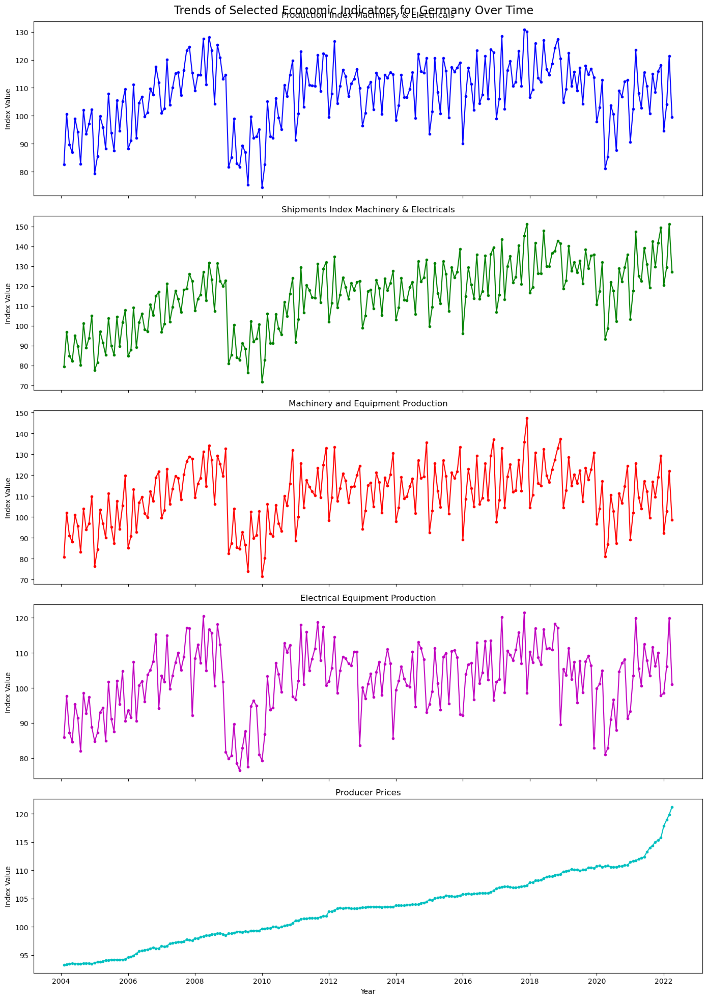

In [43]:
# Plotting each of the selected columns of the german market over time
# 5 subplots each one representing a indicator
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(14, 20), sharex=True)

# Title for the entire figure
fig.suptitle('Trends of Selected Economic Indicators for Germany Over Time', fontsize=16)

# List of the column names and their respective titles to plot
columns_to_plot = [
    ('Production_Index', 'Production Index Machinery & Electricals'),
    ('Shipments_Index', 'Shipments Index Machinery & Electricals'),
    ('Machinery_Equipment_Prod', 'Machinery and Equipment Production'),
    ('Electrical_Equipment_Prod', 'Electrical Equipment Production'),
    ('Producer_Prices', 'Producer Prices')
]

# Define a list of colors to use for each plot 
_color=['b', 'g', 'r', 'm', 'c']

# Loop through each column to plot
for ax, (column, title), i in zip(axs, columns_to_plot, _color):
        # Plot the data, converting the column values to float for plotting
        ax.plot(germany_market.index, germany_market[column].astype(float), marker='o', markersize=3, color=i)
        # Set title
        ax.set_title(title)
        # Label y-axis
        ax.set_ylabel('Index Value')
        #ax.grid(True) #add grid --> better readability

# Improving layout and setting a common x-axis label
plt.xlabel('Year')
plt.tight_layout()

plt.show()

In [44]:
# Reset indexes from 'sales_data_monthly' and 'germany_market'
# 'germany_market' --> moves the 'Date' from the index to a regular column and a new integer index is automatically generated
sales_data_monthly = sales_data_monthly.reset_index()
germany_market = germany_market.reset_index()
# Show the first five rows of the 'germany_market' DataFrame
germany_market.head()

1,Date,Production_Index,Shipments_Index,Producer_Prices,Machinery_Equipment_Prod,Electrical_Equipment_Prod
0,2004-02-01,82.623037,79.452532,93.230453,80.829010,85.913200
1,2004-03-01,100.556582,97.012918,93.335678,102.130104,97.670815
2,2004-04-01,89.653203,84.932358,93.440903,90.961426,87.253983
3,2004-05-01,86.880571,82.372794,93.546127,88.082901,84.675552
4,2004-06-01,99.010814,95.108740,93.440903,100.978699,95.401802


In [45]:
# Filter data from 'sales_data_monthly' to include only rows higher or equal to February 1, 2004 --> stored in b
b = sales_data_monthly[sales_data_monthly['DATE'] >= '2004-02-01']

# Merge the sales data with the market data on the date (german)
merged_data = pd.merge(germany_market, b, left_on='Date', right_on='DATE', how='inner')

# Dropping the extra 'DATE' column
merged_data.drop('DATE', axis=1, inplace=True)

# Calculate the pearson correlation matrix for numeric columns (exclude 'Date') in 'merged_data'
# '.astype(float)' ensures all data is treated as numeric for the correlation calculation
correlation_matrix = merged_data.drop('Date', axis=1).astype(float).corr(method='pearson')

# Extract the correlation values of each market indicator with Sales_EUR in descending order
correlations_with_sales = correlation_matrix['Sales_EUR'].sort_values(ascending=False)

# Show results
correlations_with_sales

Sales_EUR                    1.000000
Producer_Prices              0.319128
Shipments_Index              0.251424
Production_Index             0.099867
Electrical_Equipment_Prod    0.099676
Machinery_Equipment_Prod     0.083966
Name: Sales_EUR, dtype: float64

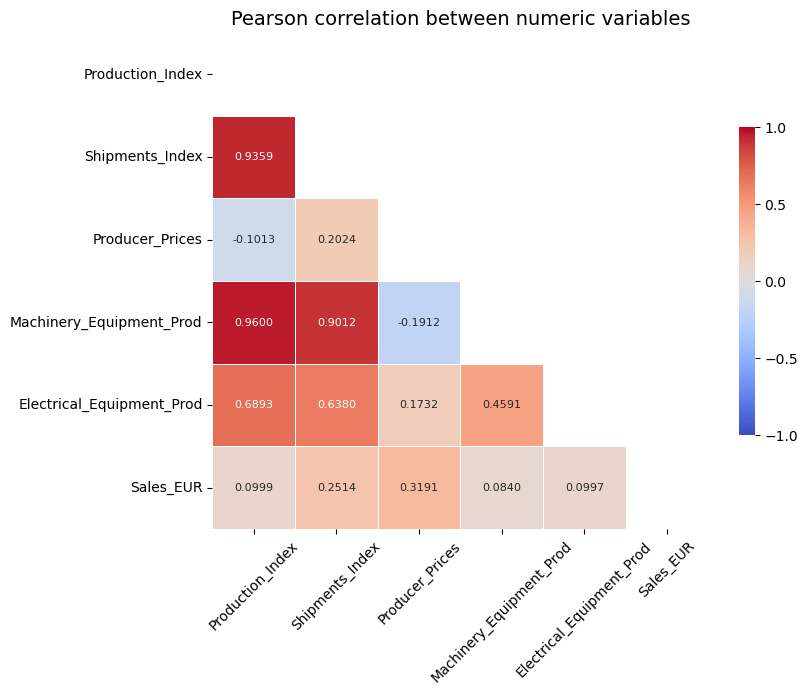

In [46]:
# Create a pearson correlation heatmap between numeric variables

# Create a mask for the upper triangle of the matrix --> avoid redundant information in the heatmap
mask = np.zeros_like(correlation_matrix, dtype=bool)
mask[np.triu_indices_from(mask)]= True

# Setting the figure size for the plot --> ensure its large enough
fig , ax = plt.subplots(figsize=(8, 10))
# Draw the heatmap
heatmap = sns.heatmap(correlation_matrix,
                      mask = mask, #apply the mask
                      square = True, #ensure square-shaped cells
                      linewidths = .5, #width of the lines that divide each cell
                      cmap = 'coolwarm', #colormap choice to visualize the correlation values
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]}, #customize the colorbar
                      fmt='.4f',
                      vmin = -1, #minimum value of the color scale
                      vmax = 1, #maximum value of the color scale
                      annot = True,
                      annot_kws = {'size': heatmaps_text_fontSize})

# Add a title
plt.title("Pearson correlation between numeric variables", fontsize=plots_Title_fontSize)
# Label y-axis
ax.set_yticklabels(correlation_matrix.columns, rotation = 0)
# Label x-axis
ax.set_xticklabels(correlation_matrix.columns, rotation = 45)
sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

# 4. Preprocessing

## 4.1 Treating sales data

In [47]:
# Check the first five rows from the 'monthly_sales' DataFrame
monthly_sales.head()

,GDK_1,GDK_3,GDK_4,GDK_5,GDK_6,GDK_8,GDK_9,GDK_11,GDK_12,GDK_13,GDK_14,GDK_16,GDK_20,GDK_36
month_year,,,,,,,,,,,,,,
2018-10,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.0,333196.87,4563.14,6474.60
2018-11,5140760.00,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.0,1377694.32,5798.14,21617.61
2018-12,37889612.12,8736859.39,430100.96,6947507.31,999472.69,271490.71,1.00,1226122.00,17880.60,15655.18,1.0,4762524.66,918.65,13924.52
2019-01,27728148.35,10705300.63,484173.88,8233205.07,598874.10,381400.15,1487.00,2216391.74,21484.00,27198.29,1686.4,942957.19,2398.04,15444.39
2019-02,34793163.53,10167796.86,620031.80,6879250.99,542037.52,368475.57,3234.28,610456.60,34214.74,32638.63,19196.3,257765.04,620.66,8051.15


In [48]:
# Step 1: Generate a complete list of monthly periods: 'all_months'
all_months = pd.period_range(start='2018-10', end='2022-04', freq='M')

# Step 2: Extract the list of months from your DataFrame: 'existing_months'
existing_months = pd.PeriodIndex(monthly_sales.index, freq='M')

# Step 3: Find the difference between all and the existing
missing_months = set(all_months) - set(existing_months)

print(f"The missing months are: {sorted(list(missing_months))}")

The missing months are: []


In [49]:
from statsmodels.tsa.stattools import adfuller

# Loop through each column in 'monthly_sales' DataFrame
for column in  monthly_sales.columns:
    print ('Results of Dickey-Fuller Test:')
    print(column) #print the name of the current column 
    
    # Perform the Dickey-Fuller test on the current column
    dftest = adfuller(monthly_sales[column], autolag='AIC')
    # Extract the first four results of the test --> Test Statistics, p-value, #Lags Used, Number of observations used
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])

    # Loop through the dictionary containing the critical values of the test --> add them
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    # Print the results of the current column
    print (dfoutput)

Results of Dickey-Fuller Test:
GDK_1
Test Statistic                -6.002443e+00
p-value                        1.645124e-07
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64
Results of Dickey-Fuller Test:
GDK_3
Test Statistic                -6.590291e+00
p-value                        7.142768e-09
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64
Results of Dickey-Fuller Test:
GDK_4
Test Statistic                 -5.319293
p-value                         0.000005
#Lags Used                      0.000000
Number of Observations Used    42.000000
Critical Value (1%)            -3.596636
Critical Value (5%)            -2.9332

In [50]:
# Convert the index of 'monthly_sales' to a Date Time Index
monthly_sales.index = monthly_sales.index.to_timestamp()

In [51]:
# check the first five rows from 'monthly_sales'
monthly_sales.head()

,GDK_1,GDK_3,GDK_4,GDK_5,GDK_6,GDK_8,GDK_9,GDK_11,GDK_12,GDK_13,GDK_14,GDK_16,GDK_20,GDK_36
month_year,,,,,,,,,,,,,,
2018-10-01,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.0,333196.87,4563.14,6474.60
2018-11-01,5140760.00,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.0,1377694.32,5798.14,21617.61
2018-12-01,37889612.12,8736859.39,430100.96,6947507.31,999472.69,271490.71,1.00,1226122.00,17880.60,15655.18,1.0,4762524.66,918.65,13924.52
2019-01-01,27728148.35,10705300.63,484173.88,8233205.07,598874.10,381400.15,1487.00,2216391.74,21484.00,27198.29,1686.4,942957.19,2398.04,15444.39
2019-02-01,34793163.53,10167796.86,620031.80,6879250.99,542037.52,368475.57,3234.28,610456.60,34214.74,32638.63,19196.3,257765.04,620.66,8051.15


### 4.1.1 Adding new features related to date

In [52]:
# Reset 'monthly_sales' index
monthly_sales.reset_index(inplace=True)

In [53]:
# Convert 'month_year' column to datetime format
monthly_sales['month_year'] = pd.to_datetime(monthly_sales['month_year'])

# Extract the month from the 'month_year' column and add to a new variable: 'Month'
# Extract the quarter from the 'month_year' column and add to a new variable: 'Quarter'
monthly_sales['Month'] = monthly_sales['month_year'].dt.month
monthly_sales['Quarter'] = monthly_sales['month_year'].dt.quarter

In [54]:
# Extract the names of the columns in 'monthly_sales'
monthly_sales.columns

Index(['month_year', 'GDK_1', 'GDK_3', 'GDK_4', 'GDK_5', 'GDK_6', 'GDK_8',
       'GDK_9', 'GDK_11', 'GDK_12', 'GDK_13', 'GDK_14', 'GDK_16', 'GDK_20',
       'GDK_36', 'Month', 'Quarter'],
      dtype='object')

In [55]:
# Set 'month_year' as the index
monthly_sales.set_index('month_year', inplace=True)

### 4.1.2 Treating outliers for sales

Results for GDK_1:
ADF Statistic: -6.002443
p-value: 0.000000


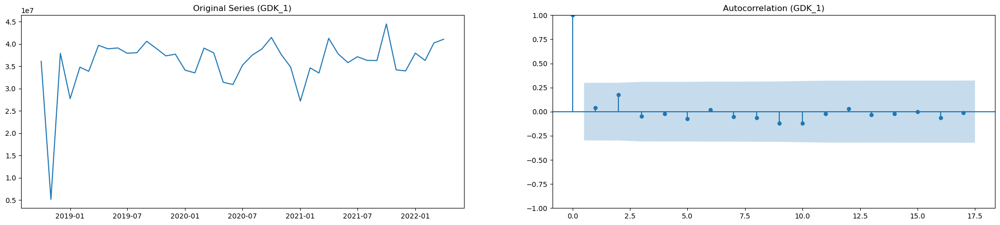

Results for GDK_3:
ADF Statistic: -6.590291
p-value: 0.000000


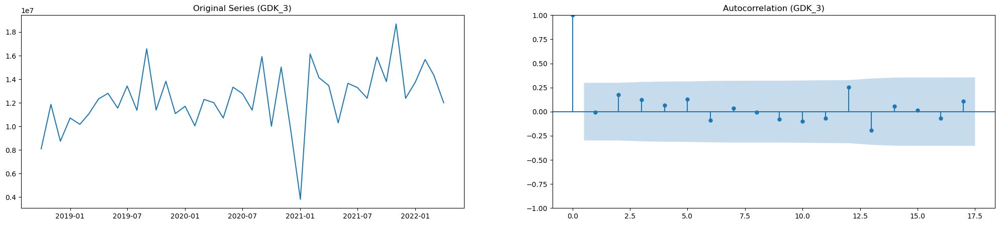

Results for GDK_4:
ADF Statistic: -5.319293
p-value: 0.000005


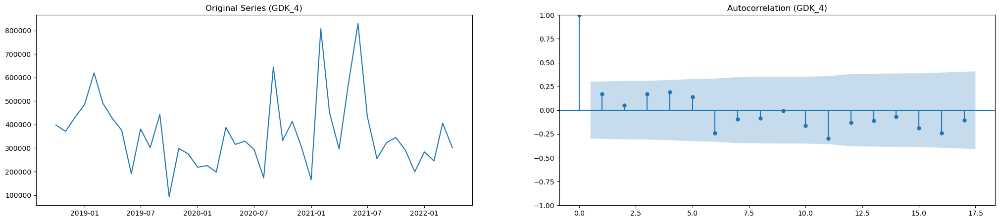

Results for GDK_5:
ADF Statistic: -7.636228
p-value: 0.000000


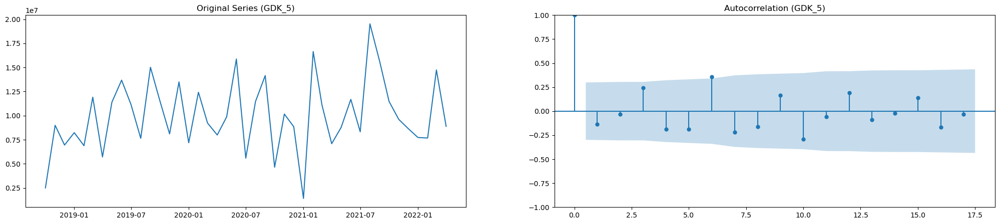

Results for GDK_6:
ADF Statistic: -3.477762
p-value: 0.008577


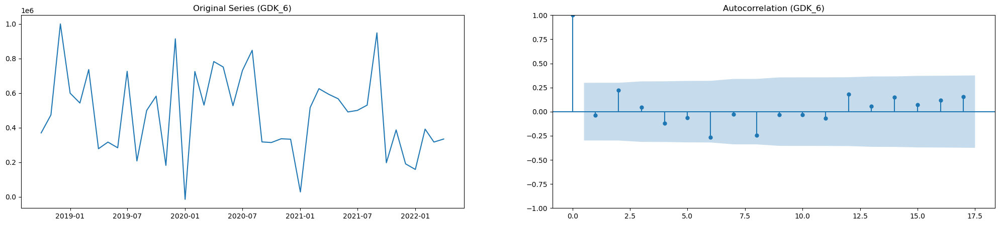

Results for GDK_8:
ADF Statistic: 2.340859
p-value: 0.998980


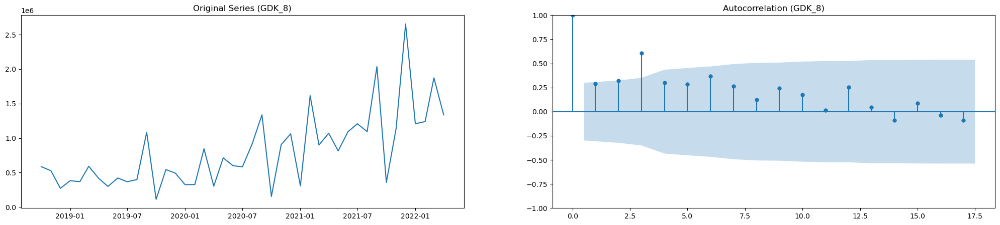

Results for GDK_9:
ADF Statistic: -7.013526
p-value: 0.000000


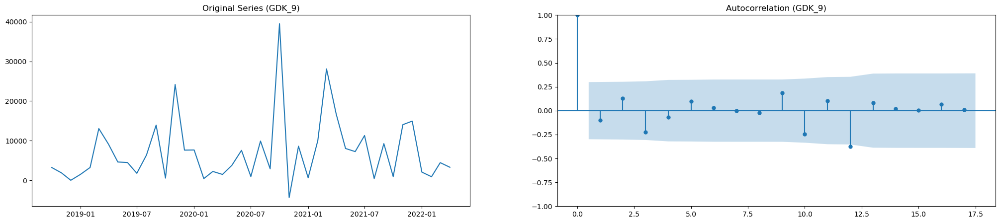

Results for GDK_11:
ADF Statistic: -5.577923
p-value: 0.000001


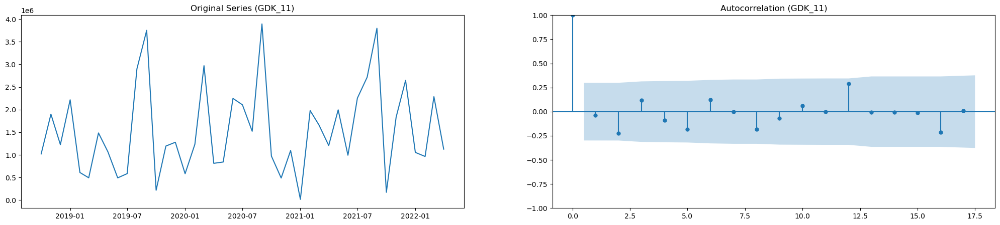

Results for GDK_12:
ADF Statistic: -3.869337
p-value: 0.002272


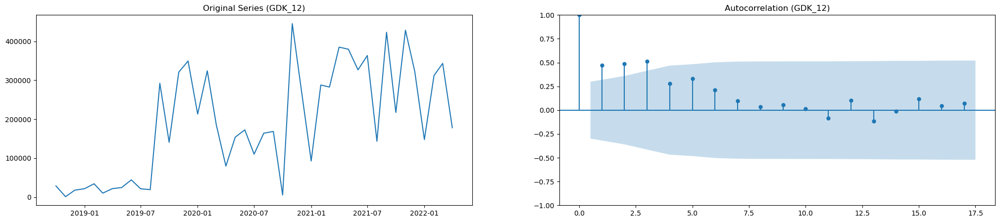

Results for GDK_13:
ADF Statistic: -3.254199
p-value: 0.017054


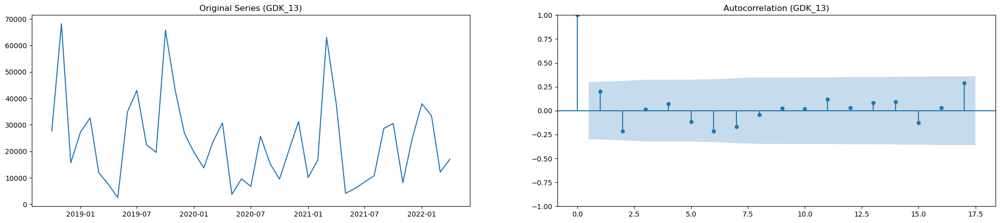

Results for GDK_14:
ADF Statistic: -6.871806
p-value: 0.000000


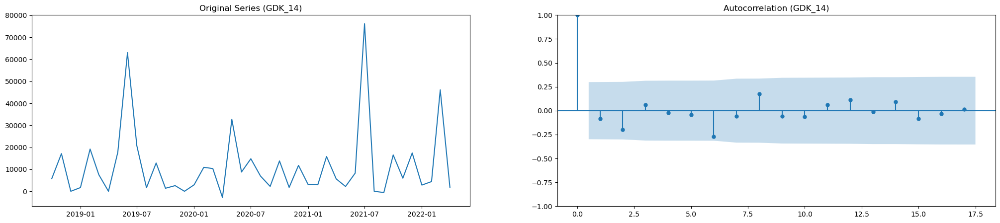

Results for GDK_16:
ADF Statistic: -6.367204
p-value: 0.000000


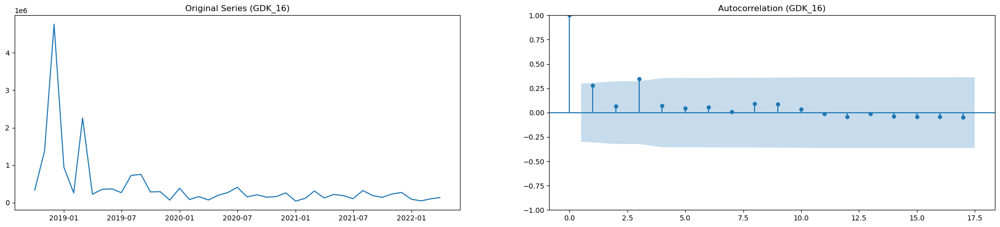

Results for GDK_20:
ADF Statistic: -3.125201
p-value: 0.024744


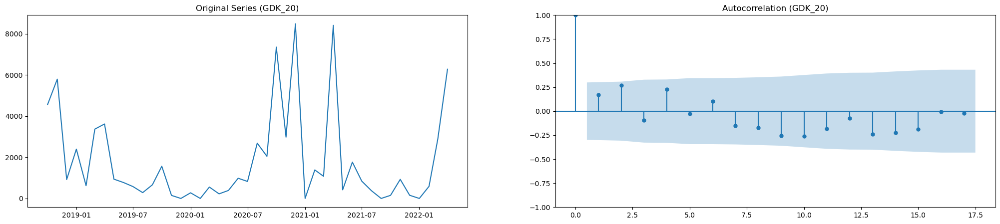

Results for GDK_36:
ADF Statistic: -7.000027
p-value: 0.000000


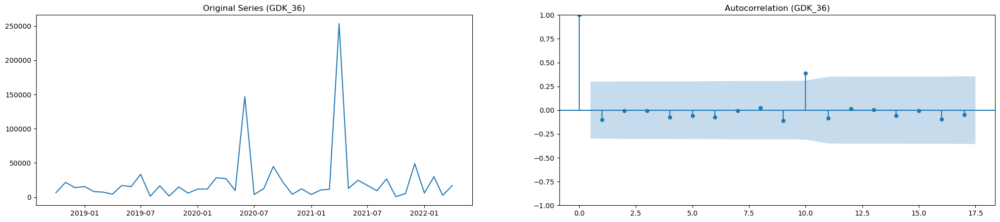

In [56]:
# Check stationarity and Flag outliers

# Select the column numbers to analyze stationarity
GDKnumbers = [1,3,4,5,6,8,9,11,12,13,14,16,20,36] 

# Create a copy to work on
df = monthly_sales.copy()
# Sort the dataframe by index --> ensure its in chronological order
df.sort_index(inplace=True)

# Iterate through the column numbers selected
for i in GDKnumbers:
    column = f'GDK_{i}' #construct the column name based on the numbers
    df1 = df[[column]][0::]  #select all the rows of the column

    # Perform the Augmented Dickey-Fuller test to check for stationarity
    result = adfuller(df1[column])
    # Print the ADF statistic and p-value for the test
    print(f'Results for {column}:')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    
    # Set up subplots, for each column, plotting the original time series and its autocorrelation
    fig, axes = plt.subplots(1, 2, figsize=(25, 5))
    
    # Plot the original time series data
    axes[0].plot(df1.index, df1[column])
    axes[0].set_title(f'Original Series ({column})')
    # Plot the autocorrelation function of the time series
    plot_acf(df1[column], ax=axes[1])
    axes[1].set_title(f'Autocorrelation ({column})')
    
    # Display the plots
    plt.show()

# p-value smaaller than 0.05 --> significant --> the series is stationary --> no need for differenciation

**Observed outliers (dates):**
- gdk_1: 11.2018
- gdk 3: 01.2021
- gdk_9: 10.2020
- gdk_36: 06.2020; 04.2021
- gdk_16: the values until april 2019 will be the mean of the rest

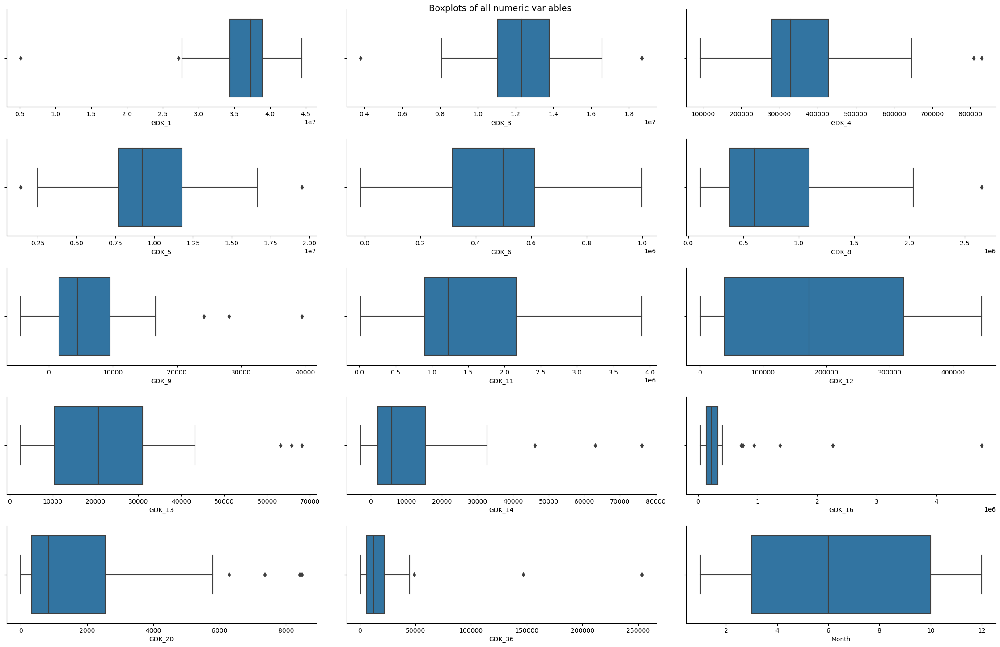

In [57]:
# Boxplots

# Initialize a figure with 5 rows and 3 columns of subplots
fig, ax = plt.subplots(5, 3, figsize=(23,15))
# Iterate through each column in the DataFrame and its corresponding subplot axis
for var, subplot in zip(df, ax.flatten()):
    # Create a boxplot for the variable and assign it to the subplot axis
    g = sns.boxplot(data=df,
                 x=var,
                 ax=subplot)

# Adjust the layout --> prevent overlap and ensure clarity
plt.tight_layout(pad=3.0, h_pad=2.0)
# Remove the top and right spines --> cleaner visualization
sns.despine()

# Set global customization for labels and font sizes
plt.rc('axes', labelsize=subPlots_label_fontSize)
plt.rc('font', size=plots_Title_fontSize)
# Add a title
fig.suptitle("Boxplots of all numeric variables", fontsize=plots_Title_fontSize)

plt.show()

In [58]:
# Update observed outliers
monthly_sales.at['2018-11-01', 'GDK_1'] = 27180432.94
monthly_sales.at['2021-01-01', 'GDK_3'] = 8089465.96
monthly_sales.at['2020-10-01', 'GDK_9'] = 28108.88
monthly_sales.at['2020-06-01', 'GDK_36'] = 48933.5
monthly_sales.at['2021-04-01', 'GDK_36'] = 48933.5

# for GDK_16 --> set the first six values equal to the mean of the entire column
monthly_sales.loc[monthly_sales.index[:6], 'GDK_16'] = monthly_sales['GDK_16'].mean()

In [59]:
monthly_sales

,GDK_1,GDK_3,GDK_4,GDK_5,GDK_6,GDK_8,GDK_9,GDK_11,GDK_12,GDK_13,GDK_14,GDK_16,GDK_20,GDK_36,Month,Quarter
month_year,,,,,,,,,,,,,,,,
2018-10-01,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.00,427701.760698,4563.14,6474.60,10,4
2018-11-01,27180432.94,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.00,427701.760698,5798.14,21617.61,11,4
2018-12-01,37889612.12,8736859.39,430100.96,6947507.31,999472.69,271490.71,1.00,1226122.00,17880.60,15655.18,1.00,427701.760698,918.65,13924.52,12,4
2019-01-01,27728148.35,10705300.63,484173.88,8233205.07,598874.10,381400.15,1487.00,2216391.74,21484.00,27198.29,1686.40,427701.760698,2398.04,15444.39,1,1
2019-02-01,34793163.53,10167796.86,620031.80,6879250.99,542037.52,368475.57,3234.28,610456.60,34214.74,32638.63,19196.30,427701.760698,620.66,8051.15,2,1
2019-03-01,33856803.04,11040544.57,491643.59,11914313.63,735604.23,591288.36,13050.61,493999.81,10118.00,11890.00,7535.25,427701.760698,3369.55,7373.42,3,1
2019-04-01,39688292.01,12317479.75,426221.34,5714462.48,277575.12,418899.90,9119.65,1484281.60,21813.27,7488.54,1.00,224501.900000,3619.63,4280.25,4,2
2019-05-01,38897974.29,12798945.18,375671.57,11389673.26,315978.77,298806.84,4614.08,1066063.90,24468.00,2550.31,17771.40,353451.540000,938.90,16905.32,5,2
2019-06-01,39106750.23,11546452.19,190721.15,13681879.16,282963.19,420707.73,4488.09,492133.20,44255.68,34849.21,63017.71,367425.380000,772.94,15516.22,6,2


#### Creating individual datasets for each product

In [60]:
df_gdk_1 = monthly_sales[['GDK_1', 'Quarter', 'Month']].copy()
df_gdk_3 = monthly_sales[['GDK_3', 'Quarter', 'Month']].copy()
df_gdk_4 = monthly_sales[['GDK_4', 'Quarter', 'Month']].copy()
df_gdk_5 = monthly_sales[['GDK_5', 'Quarter', 'Month']].copy()
df_gdk_6 = monthly_sales[['GDK_6', 'Quarter', 'Month']].copy()
df_gdk_8 = monthly_sales[['GDK_8', 'Quarter', 'Month']].copy()
df_gdk_9 = monthly_sales[['GDK_9', 'Quarter', 'Month']].copy()
df_gdk_11 = monthly_sales[['GDK_11', 'Quarter', 'Month']].copy()
df_gdk_12 = monthly_sales[['GDK_12', 'Quarter', 'Month']].copy()
df_gdk_13 = monthly_sales[['GDK_13', 'Quarter', 'Month']].copy()
df_gdk_14 = monthly_sales[['GDK_14', 'Quarter', 'Month']].copy()
df_gdk_16 = monthly_sales[['GDK_16', 'Quarter', 'Month']].copy()
df_gdk_20 = monthly_sales[['GDK_20', 'Quarter', 'Month']].copy()
df_gdk_36 = monthly_sales[['GDK_36', 'Quarter', 'Month']].copy()

In [61]:
# check the first 10 rows of the dataset of GDK_9
df_gdk_9.head(10)

,GDK_9,Quarter,Month
month_year,,,
2018-10-01,3219.32,4,10
2018-11-01,1875.90,4,11
2018-12-01,1.00,4,12
2019-01-01,1487.00,1,1
2019-02-01,3234.28,1,2
2019-03-01,13050.61,1,3
2019-04-01,9119.65,2,4
2019-05-01,4614.08,2,5
2019-06-01,4488.09,2,6


### 4.1.3 Adding new features related to the sales

In [62]:
# Calculate and add features 'GDK_ Rolling_Mean_3' and 'GDK_ Growth_Rate' to each product dataset
# Fill any NaN values that were introduced by the rolling mean and percentage change calculations

df_gdk_1['GDK_1_Rolling_Mean_3'] = df_gdk_1['GDK_1'].rolling(window=3).mean()
df_gdk_1['GDK_1_Growth_Rate'] = df_gdk_1['GDK_1'].pct_change().mul(100)
df_gdk_1.fillna(method='bfill', inplace=True)

df_gdk_3['GDK_3_Rolling_Mean_3'] = df_gdk_3['GDK_3'].rolling(window=3).mean()
df_gdk_3['GDK_3_Growth_Rate'] = df_gdk_3['GDK_3'].pct_change().mul(100)
df_gdk_3.fillna(method='bfill', inplace=True)

df_gdk_4['GDK_4_Rolling_Mean_3'] = df_gdk_4['GDK_4'].rolling(window=3).mean()
df_gdk_4['GDK_4_Growth_Rate'] = df_gdk_4['GDK_4'].pct_change().mul(100)
df_gdk_4.fillna(method='bfill', inplace=True)

df_gdk_5['GDK_5_Rolling_Mean_3'] = df_gdk_5['GDK_5'].rolling(window=3).mean()
df_gdk_5['GDK_5_Growth_Rate'] = df_gdk_5['GDK_5'].pct_change().mul(100)
df_gdk_5.fillna(method='bfill', inplace=True)

df_gdk_6['GDK_6_Rolling_Mean_3'] = df_gdk_6['GDK_6'].rolling(window=3).mean()
df_gdk_6['GDK_6_Growth_Rate'] = df_gdk_6['GDK_6'].pct_change().mul(100)
df_gdk_6.fillna(method='bfill', inplace=True)

df_gdk_8['GDK_8_Rolling_Mean_3'] = df_gdk_8['GDK_8'].rolling(window=3).mean()
df_gdk_8['GDK_8_Growth_Rate'] = df_gdk_8['GDK_8'].pct_change().mul(100)
df_gdk_8.fillna(method='bfill', inplace=True)

df_gdk_9['GDK_9_Rolling_Mean_3'] = df_gdk_9['GDK_9'].rolling(window=3).mean()
df_gdk_9['GDK_9_Growth_Rate'] = df_gdk_9['GDK_9'].pct_change().mul(100)
df_gdk_9.fillna(method='bfill', inplace=True)

df_gdk_11['GDK_11_Rolling_Mean_3'] = df_gdk_11['GDK_11'].rolling(window=3).mean()
df_gdk_11['GDK_11_Growth_Rate'] = df_gdk_11['GDK_11'].pct_change().mul(100)
df_gdk_11.fillna(method='bfill', inplace=True)

df_gdk_12['GDK_12_Rolling_Mean_3'] = df_gdk_12['GDK_12'].rolling(window=3).mean()
df_gdk_12['GDK_12_Growth_Rate'] = df_gdk_12['GDK_12'].pct_change().mul(100)
df_gdk_12.fillna(method='bfill', inplace=True)

df_gdk_13['GDK_13_Rolling_Mean_3'] = df_gdk_13['GDK_13'].rolling(window=3).mean()
df_gdk_13['GDK_13_Growth_Rate'] = df_gdk_13['GDK_13'].pct_change().mul(100)
df_gdk_13.fillna(method='bfill', inplace=True)

df_gdk_14['GDK_14_Rolling_Mean_3'] = df_gdk_14['GDK_14'].rolling(window=3).mean()
df_gdk_14['GDK_14_Growth_Rate'] = df_gdk_14['GDK_14'].pct_change().mul(100)
df_gdk_14.fillna(method='bfill', inplace=True)

df_gdk_16['GDK_16_Rolling_Mean_3'] = df_gdk_16['GDK_16'].rolling(window=3).mean()
df_gdk_16['GDK_16_Growth_Rate'] = df_gdk_16['GDK_16'].pct_change().mul(100)
df_gdk_16.fillna(method='bfill', inplace=True)

df_gdk_20['GDK_20_Rolling_Mean_3'] = df_gdk_20['GDK_20'].rolling(window=3).mean()
df_gdk_20['GDK_20_Growth_Rate'] = df_gdk_20['GDK_20'].pct_change().mul(100)
df_gdk_20.fillna(method='bfill', inplace=True)

df_gdk_36['GDK_36_Rolling_Mean_3'] = df_gdk_36['GDK_36'].rolling(window=3).mean()
df_gdk_36['GDK_36_Growth_Rate'] = df_gdk_36['GDK_36'].pct_change().mul(100)
df_gdk_36.fillna(method='bfill', inplace=True)

In [63]:
# check the first 5 rows of the dataset of GDK_36
df_gdk_36.head()

,GDK_36,Quarter,Month,GDK_36_Rolling_Mean_3,GDK_36_Growth_Rate
month_year,,,,,
2018-10-01,6474.60,4,10,14005.576667,233.883329
2018-11-01,21617.61,4,11,14005.576667,233.883329
2018-12-01,13924.52,4,12,14005.576667,-35.587144
2019-01-01,15444.39,1,1,16995.506667,10.915062
2019-02-01,8051.15,1,2,12473.353333,-47.870068


In [64]:
# Create lagged feature for 'GDK_3' by shifting the data by 2 time periods
df_gdk_3['GDK_3_Lag2'] = df_gdk_3['GDK_3'].shift(2)
# Backward fill NaN values
df_gdk_3['GDK_3_Lag2'].fillna(method='bfill', inplace=True)

# Create lagged feature for 'GDK_5' by shifting the data by 6 time periods
df_gdk_5['GDK_5_Lag6'] = df_gdk_5['GDK_5'].shift(6)
# Fill NaN values with the mean of 'GDK_5_Lag6' column
df_gdk_5['GDK_5_Lag6'].fillna(df_gdk_5['GDK_5_Lag6'].mean(), inplace=True)

# Create lagged features for 'GDK_8' by shifting the data by 2 and 3 time periods
df_gdk_8['GDK_8_Lag2'] = df_gdk_8['GDK_8'].shift(2)
df_gdk_8['GDK_8_Lag3'] = df_gdk_8['GDK_8'].shift(3)
# Backward fill NaN values
df_gdk_8['GDK_8_Lag2'].fillna(method='bfill', inplace=True)
df_gdk_8['GDK_8_Lag3'].fillna(method='bfill', inplace=True)

# Create lagged feature for 'GDK_9' by shifting the data by 11 time periods
df_gdk_9['GDK_9_Lag11'] = df_gdk_9['GDK_9'].shift(11)
# Fill NaN values with the mean of 'GDK_9_Lag11'
df_gdk_9['GDK_9_Lag11'].fillna(df_gdk_9['GDK_9_Lag11'].mean(), inplace=True)

# Create lagged features for 'GDK_12' by shifting the data by 1, 2 and 3 time periods
df_gdk_12['GDK_12_Lag1'] = df_gdk_12['GDK_12'].shift(1)
df_gdk_12['GDK_12_Lag2'] = df_gdk_12['GDK_12'].shift(2)
df_gdk_12['GDK_12_Lag3'] = df_gdk_12['GDK_12'].shift(3)
# Backward fill NaN values
df_gdk_12['GDK_12_Lag1'].fillna(method='bfill', inplace=True)
df_gdk_12['GDK_12_Lag2'].fillna(method='bfill', inplace=True)
df_gdk_12['GDK_12_Lag3'].fillna(method='bfill', inplace=True)

# Create lagged feature for 'GDK_16' by shifting the data by 1 time period
df_gdk_16['GDK_16_Lag1'] = df_gdk_16['GDK_16'].shift(1)
# Backward fill NaN values
df_gdk_16['GDK_16_Lag1'].fillna(method='bfill', inplace=True)

#### Creating list with all dataframes
This will be usefull later in the notebook.

In [65]:
dataframes = [
    df_gdk_3,
    df_gdk_4,
    df_gdk_5,
    df_gdk_6,
    df_gdk_8,
    df_gdk_9,
    df_gdk_11,
    df_gdk_12,
    df_gdk_13,
    df_gdk_14,
    df_gdk_16,
    df_gdk_20,
    df_gdk_36
]

products = df_gdk_1.copy()

# Iterate over each DataFrame in the 'dataframes' list
for df in dataframes:
    # Add each 'df' as new columns to 'products' DataFrame (assuming common index)
    products = pd.concat([products, df], axis=1) 

In [66]:
def drop_duplicate_columns(df):
    """
    Drops duplicate columns in the given DataFrame, keeping the first occurrence.
    
    :param df: pandas DataFrame
    :return: DataFrame with duplicate columns dropped
    """
    # Transpose the dataframe so that columns become rows
    # 'T' is short for transpose --> method typically operates on rows
    # The transposed DataFrame is transposed back but without duplicated columns
    df = df.T.drop_duplicates().T
    return df

# Apply the function to the 'products' DataFrame
products = drop_duplicate_columns(products)

In [67]:
# Identify duplicate columns in the 'products' DataFrame
duplicate_columns = products.columns[products.columns.duplicated()]

# Show the duplicate columns names
print(duplicate_columns)

Index([], dtype='object')


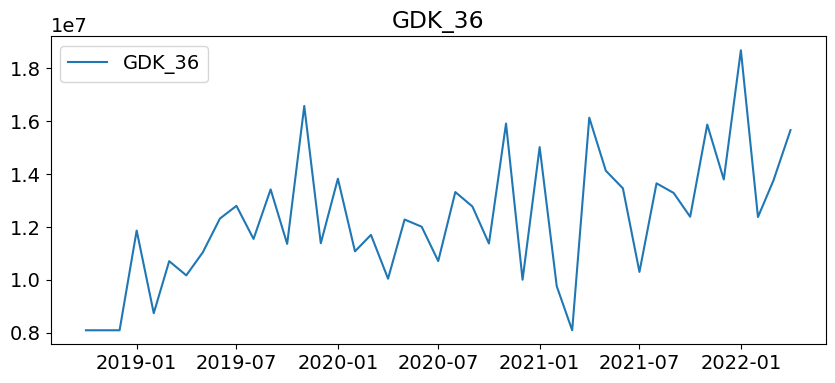

In [68]:
# Create a new figure
plt.figure(figsize=(10, 4)) 

# Plot the 'GDK_3_Lag2' (legend label) column from the 'df_gdk_3' DataFrame
plt.plot(df_gdk_3['GDK_3_Lag2'], label=column)
# Add a title
plt.title(column)
plt.legend()
plt.show()

## 4.2 Treating Market Indexes

In [69]:
# check the fist five rows of 'market2'
market2.head()

1,CHN_MC_EL_PROD,CHN_MC_EL_SHIP,FRA_MC_EL_PROD,FRA_MC_EL_SHIP,DEU_MC_EL_PROD,DEU_MC_EL_SHIP,ITA_MC_EL_PROD,ITA_MC_EL_SHIP,JPN_MC_EL_PROD,JPN_MC_EL_SHIP,CHE_MC_EL_PROD,CHE_MC_EL_SHIP,GBR_MC_EL_PROD,GBR_MC_EL_SHIP,USA_MC_EL_PROD,USA_MC_EL_SHIP,EU_MC_EL_PROD,EU_MC_EL_SHIP,WRL_BASE_METAL_PRICE,WRL_ENERGY_PRICE,WRL_METAL_MINERAL_PRICE,WRL_GAS,WRL_AVG_OIL_PRICE,WRL_COPPER_PRICE,USA_EUR_LCU,USA_EE_PRODUCER_PRICE,GBR_EE_PRODUCER_PRICE,ITA_EE_PRODUCER_PRICE,FRA_EE_PRODUCER_PRICE,DEU_EE_PRODUCER_PRICE,CHN_EE_PRODUCER_PRICE,USA_MC_EQ_PROD,WRL_MC_EQ_PROD,CHE_MC_EQ_PROD,GBR_MC_EQ_PROD,ITA_MC_EQ_PROD,JPN_MC_EQ_PROD,FRA_MC_EQ_PROD,DEU_MC_EQ_PROD,USA_EE_PROD,WRL_EE_PROD,CHE_EE_PROD,GBR_EE_PROD,ITA_EE_PROD,JPN_EE_PROD,FRA_EE_PROD,DEU_EE_PROD
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-02-01,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,110.495272,91.221862,89.987275,111.353812,73.601265,107.601400,79.240230,97.122911,80.098530,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.100000,106.191977,116.790276,110.890034,118.274109,80.829010,117.723991,NaN,81.100000,120.706516,141.510864,106.161262,102.077057,85.913200
2004-03-01,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.627480,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,NaN,76.690307,138.309550,152.880234,140.288741,117.225685,97.670815
2004-04-01,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,NaN,93.440903,NaN,103.484955,100.169090,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,NaN,71.552403,115.557330,137.796875,106.271197,105.335777,87.253983
2004-05-01,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.378729,79.598021,110.645200,74.591883,108.425887,87.463813,101.275727,84.485767,51.230356,53.590898,46.468392,99.044520,47.517121,36.278433,1.2007,80.798828,80.757423,93.852425,NaN,93.546127,NaN,103.643944,99.581436,96.391954,105.885359,131.988998,101.990361,116.649750,88.082901,117.899216,NaN,66.414500,119.269534,143.860535,101.608710,96.616508,84.675552
2004-06-01,27.009138,27.009138,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,119.616380,85.134950,79.455239,122.020960,82.343346,110.569933,97.364496,112.057197,96.963294,52.876331,50.799575,47.803913,98.636267,44.967605,35.657380,1.2138,80.913490,80.552711,93.956467,NaN,93.440903,NaN,106.062668,109.277710,98.990373,118.252278,132.988922,122.136575,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.458710,95.401802


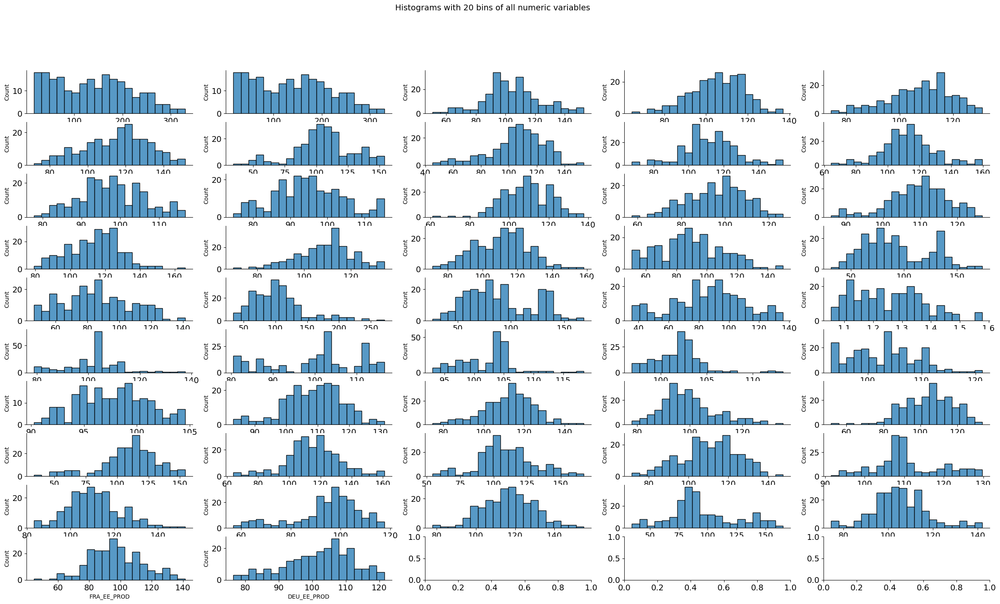

In [70]:
# Initialize a figure with 10 rows and 5 columns of subplots
fig, ax = plt.subplots(10, 5, figsize=(30,16))
# Iterate through each column in 'market2' and its corresponding subplot axis
for var, subplot in zip(market2, ax.flatten()):
    # Create a histogram for each variable and assign it to the its subplot
    g = sns.histplot(data=market2,
                bins=20,
                 x=var,
                 ax=subplot,
                 kde=False)

# Remove the top and right spines --> cleaner visualization
sns.despine()
# Set global customization for font sizes
plt.rc('axes', labelsize=subPlots_label_fontSize)
# Add a title
fig.suptitle("Histograms with 20 bins of all numeric variables", fontsize=plots_Title_fontSize);

Here we are looking at the distribuition and we can see that most indexes have a normal distribuition

In [71]:
# check for missing values on 'market2' DataFrame
market2.isna().sum()

1
CHN_MC_EL_PROD              0
CHN_MC_EL_SHIP              0
FRA_MC_EL_PROD              0
FRA_MC_EL_SHIP              0
DEU_MC_EL_PROD              0
DEU_MC_EL_SHIP              0
ITA_MC_EL_PROD              0
ITA_MC_EL_SHIP              0
JPN_MC_EL_PROD              0
JPN_MC_EL_SHIP              0
CHE_MC_EL_PROD              1
CHE_MC_EL_SHIP              1
GBR_MC_EL_PROD              0
GBR_MC_EL_SHIP             18
USA_MC_EL_PROD              0
USA_MC_EL_SHIP              1
EU_MC_EL_PROD               0
EU_MC_EL_SHIP               0
WRL_BASE_METAL_PRICE        0
WRL_ENERGY_PRICE            0
WRL_METAL_MINERAL_PRICE     0
WRL_GAS                     0
WRL_AVG_OIL_PRICE           0
WRL_COPPER_PRICE            0
USA_EUR_LCU                 0
USA_EE_PRODUCER_PRICE       0
GBR_EE_PRODUCER_PRICE      18
ITA_EE_PRODUCER_PRICE       0
FRA_EE_PRODUCER_PRICE      35
DEU_EE_PRODUCER_PRICE       0
CHN_EE_PRODUCER_PRICE      23
USA_MC_EQ_PROD              0
WRL_MC_EQ_PROD              0
CHE_MC_E

In [72]:
# list of indexes to fill the missing values
indexes_to_fill = ['CHE_MC_EL_PROD', 'CHE_MC_EL_SHIP', 'GBR_MC_EL_SHIP', 'USA_MC_EL_SHIP', 'GBR_EE_PRODUCER_PRICE', 'FRA_EE_PRODUCER_PRICE', 
'CHN_EE_PRODUCER_PRICE', 'CHE_MC_EQ_PROD', 'WRL_EE_PROD', 'CHE_EE_PROD']

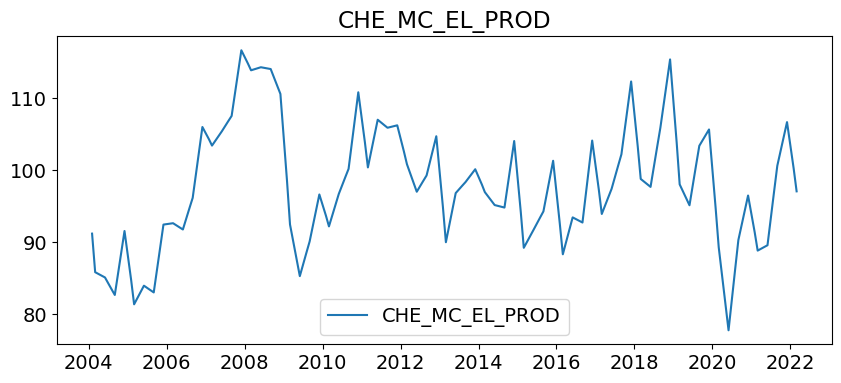

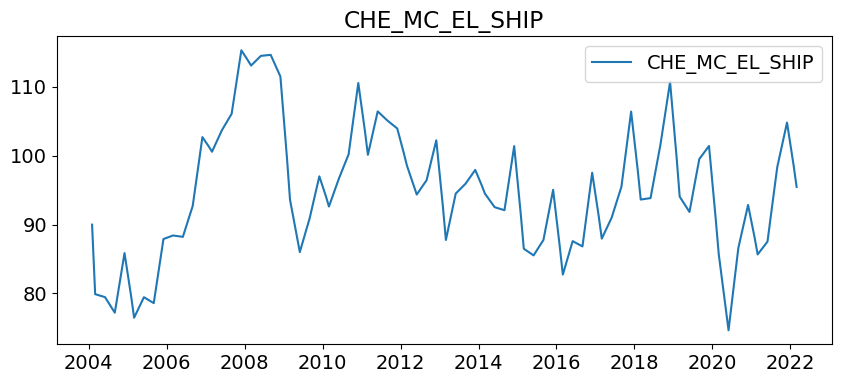

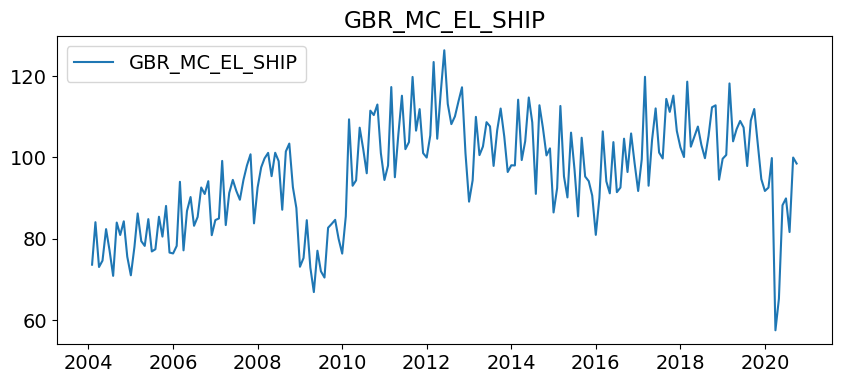

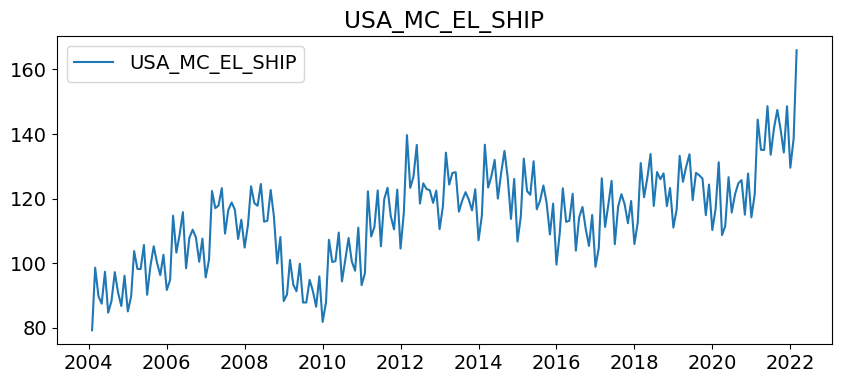

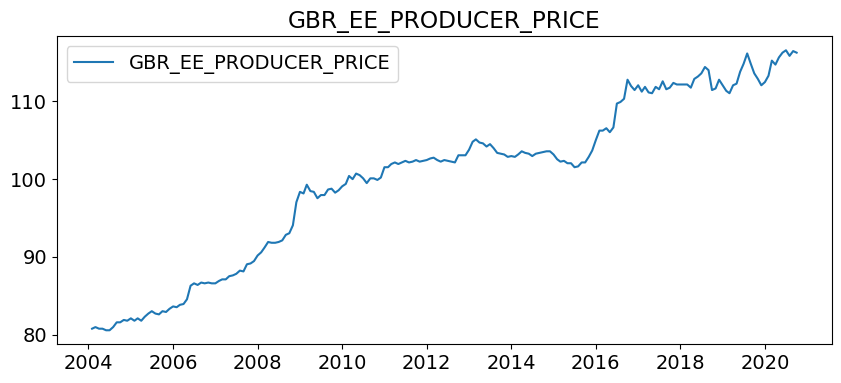

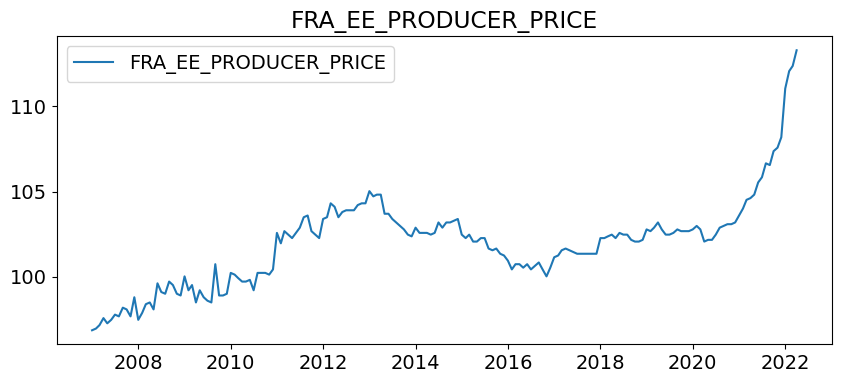

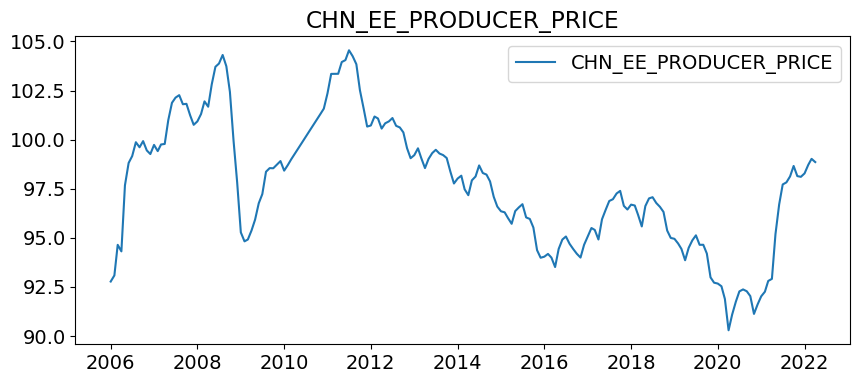

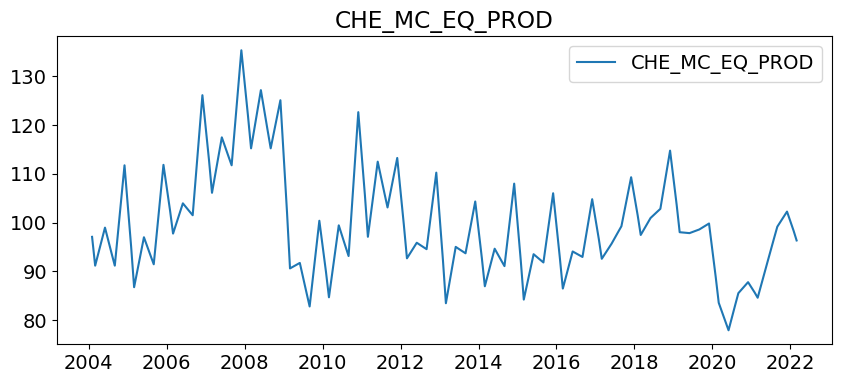

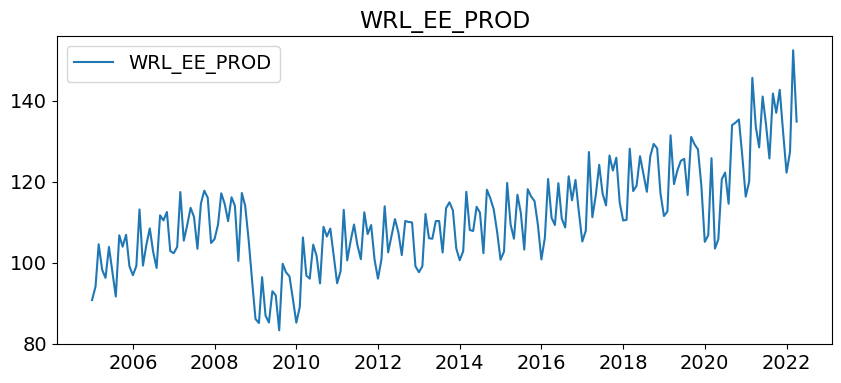

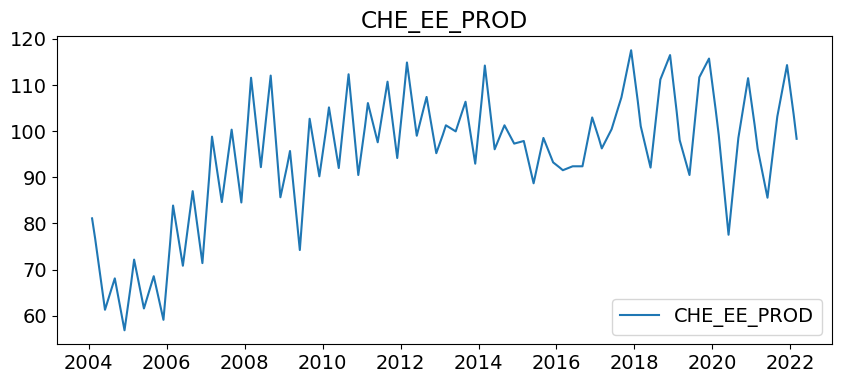

In [73]:
# Iterate through each index on the list 'indexes_to_fill'
for index in indexes_to_fill:
    # Create a new figure for each column
    plt.figure(figsize=(10, 4))
    # Plot the column data, using the index as label --> clarity
    plt.plot(market2[index], label=index)
    # Set title = name of the column
    plt.title(index)
    plt.legend()
    plt.show()

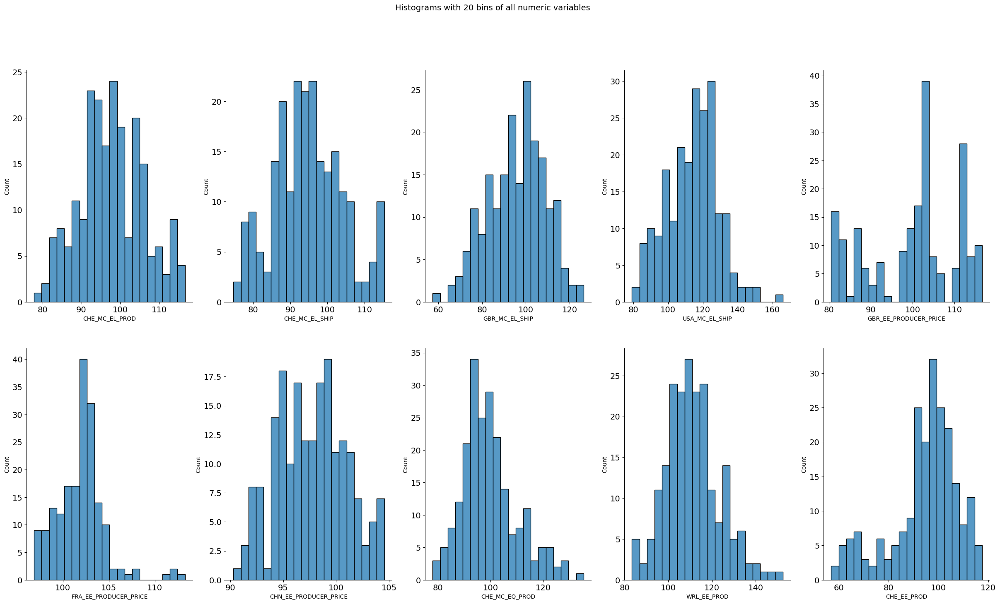

In [74]:
# Initialize a figure with 2 rows and 5 columns of subplots
fig, ax = plt.subplots(2, 5, figsize=(30,16))

# Iterate through each index in 'indexes_to_fill' and the corresponding subplot axis
for var, subplot in zip(market2[indexes_to_fill], ax.flatten()):
    # Create a histogram for each index and assign it to the its subplot
    g = sns.histplot(data=market2,
                bins=20,
                 x=var,
                 ax=subplot,
                 kde=False)

# Remove the top and right spines --> cleaner visualization
sns.despine()
# Set global customization for font sizes
plt.rc('axes', labelsize=subPlots_label_fontSize)
# Add a title
fig.suptitle("Histograms with 20 bins of all numeric variables", fontsize=plots_Title_fontSize);

### 4.2.1 Filling missing values

In [75]:
# Scaling the data to impute missing values for metric features with KNN imputer, inversing the scaling afterwards
# n_neighbors = 10 --> due to the dataset size --> big
# RobustScaler --> robust to outliers
Columns = market2.columns

# Copy the DataFrame to preserve the original one
Market_neighbors = market2.copy()
# Initialize the RobustScaler
scaler = RobustScaler()
# Initialize the KNNImputer with 10 neighbors
imputer = KNNImputer(n_neighbors=10, weights="uniform")

# Scale using RobustScaler
Market_neighbors[Columns] = scaler.fit_transform(Market_neighbors[Columns])  
# Fill missing values with KNNImputer
Market_neighbors[Columns] = imputer.fit_transform(Market_neighbors[Columns])

# Inverse the scaling to return to the original distribution
inverted_data = scaler.inverse_transform(Market_neighbors[Columns])
# Update DataFrame
Market_neighbors[Columns] = inverted_data

# check the number of missing values --> verify imputation
print(Market_neighbors.isna().sum())

1
CHN_MC_EL_PROD             0
CHN_MC_EL_SHIP             0
FRA_MC_EL_PROD             0
FRA_MC_EL_SHIP             0
DEU_MC_EL_PROD             0
DEU_MC_EL_SHIP             0
ITA_MC_EL_PROD             0
ITA_MC_EL_SHIP             0
JPN_MC_EL_PROD             0
JPN_MC_EL_SHIP             0
CHE_MC_EL_PROD             0
CHE_MC_EL_SHIP             0
GBR_MC_EL_PROD             0
GBR_MC_EL_SHIP             0
USA_MC_EL_PROD             0
USA_MC_EL_SHIP             0
EU_MC_EL_PROD              0
EU_MC_EL_SHIP              0
WRL_BASE_METAL_PRICE       0
WRL_ENERGY_PRICE           0
WRL_METAL_MINERAL_PRICE    0
WRL_GAS                    0
WRL_AVG_OIL_PRICE          0
WRL_COPPER_PRICE           0
USA_EUR_LCU                0
USA_EE_PRODUCER_PRICE      0
GBR_EE_PRODUCER_PRICE      0
ITA_EE_PRODUCER_PRICE      0
FRA_EE_PRODUCER_PRICE      0
DEU_EE_PRODUCER_PRICE      0
CHN_EE_PRODUCER_PRICE      0
USA_MC_EQ_PROD             0
WRL_MC_EQ_PROD             0
CHE_MC_EQ_PROD             0
GBR_MC_EQ_PR

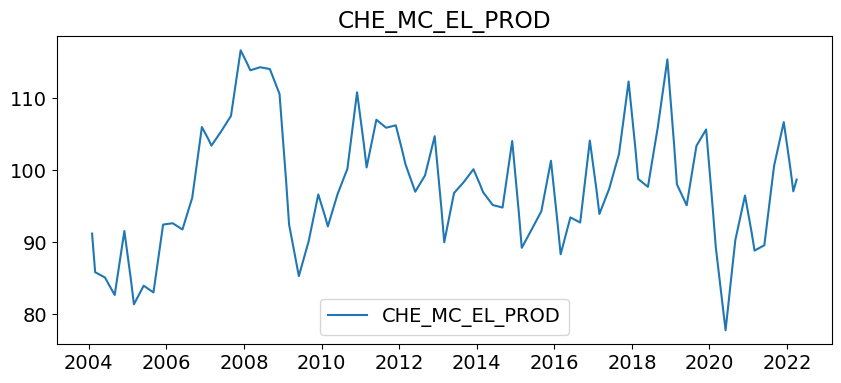

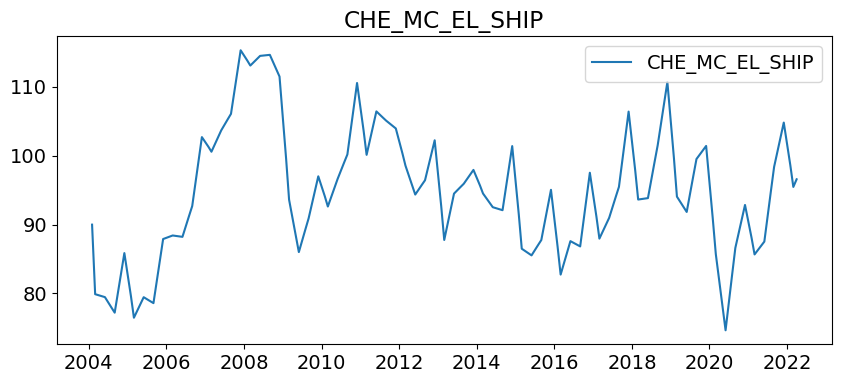

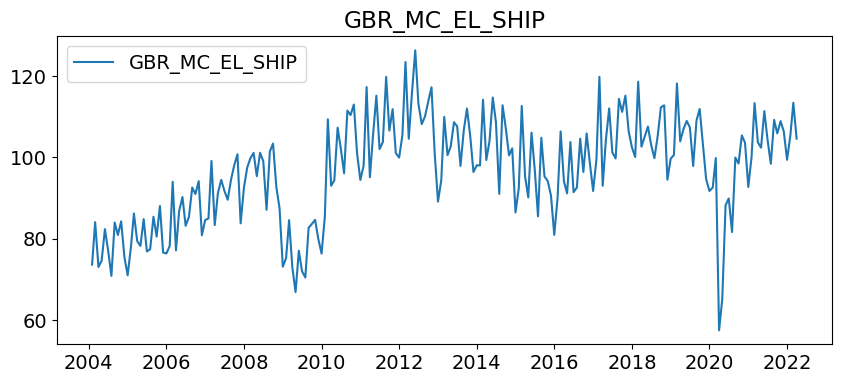

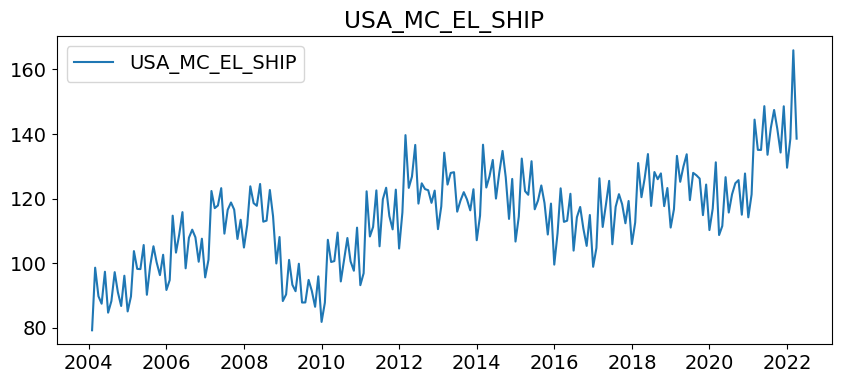

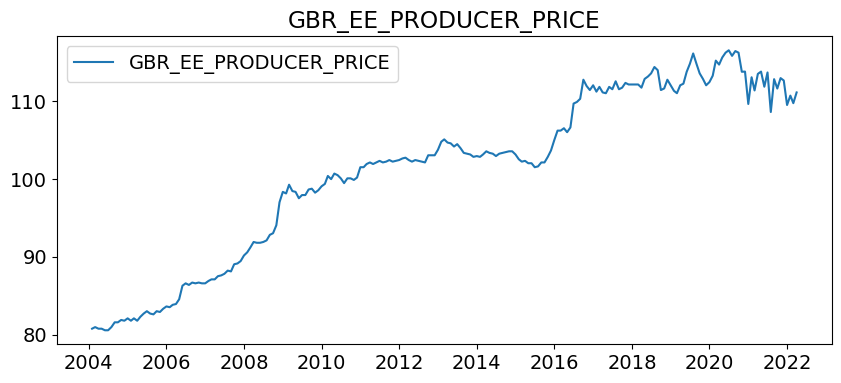

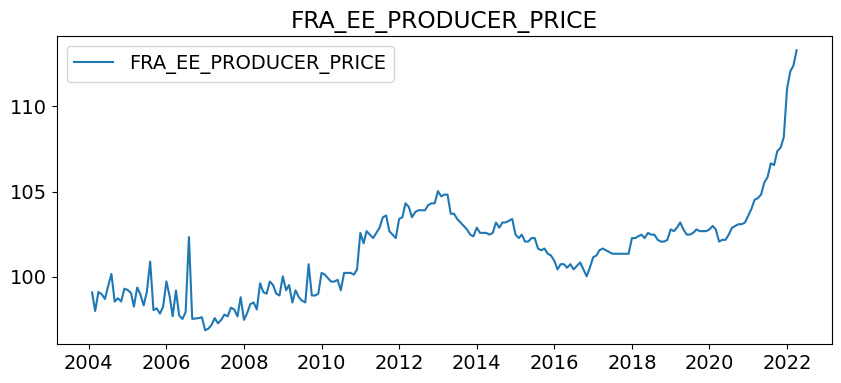

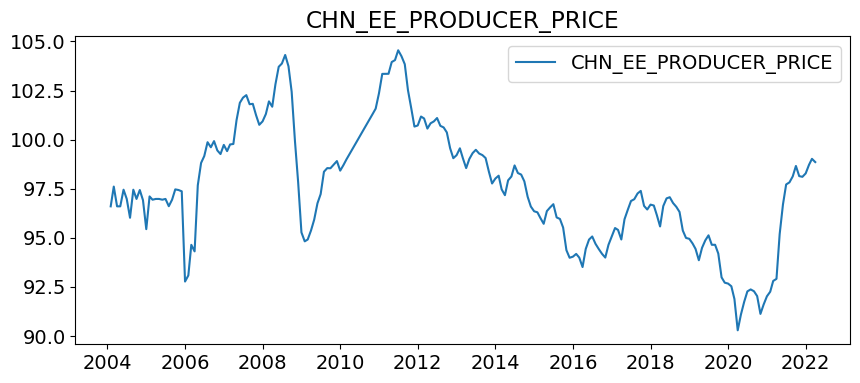

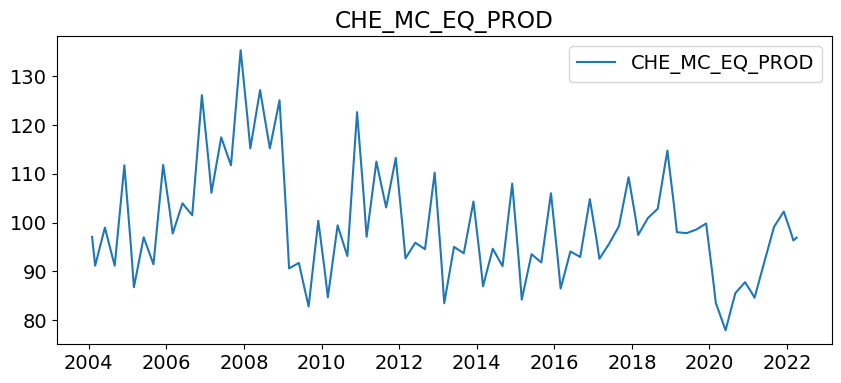

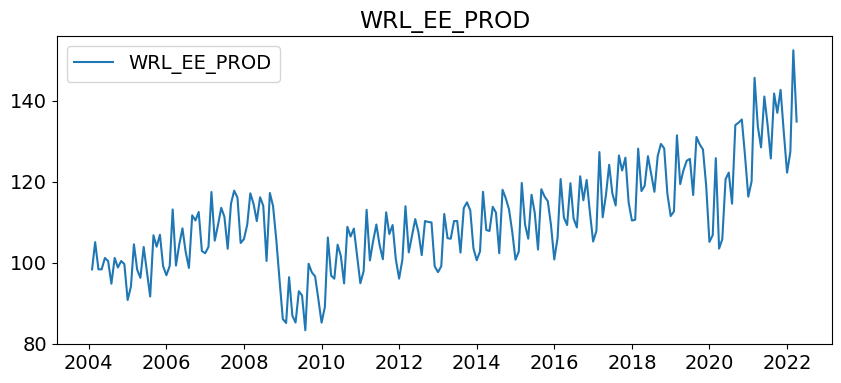

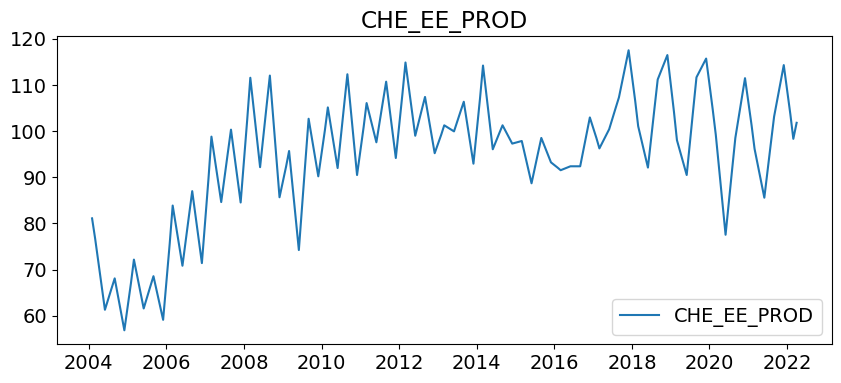

In [76]:
# Iterate through each column on the list: 'indexes_to_fill'
for column in indexes_to_fill:
    # Create a new figure for each column
    plt.figure(figsize=(10, 4))  
    # Plot the column data, using the column name as label --> clarity
    plt.plot(Market_neighbors[column], label=column)
    # Set title = name of the column
    plt.title(column) 
    plt.legend()
    plt.show()

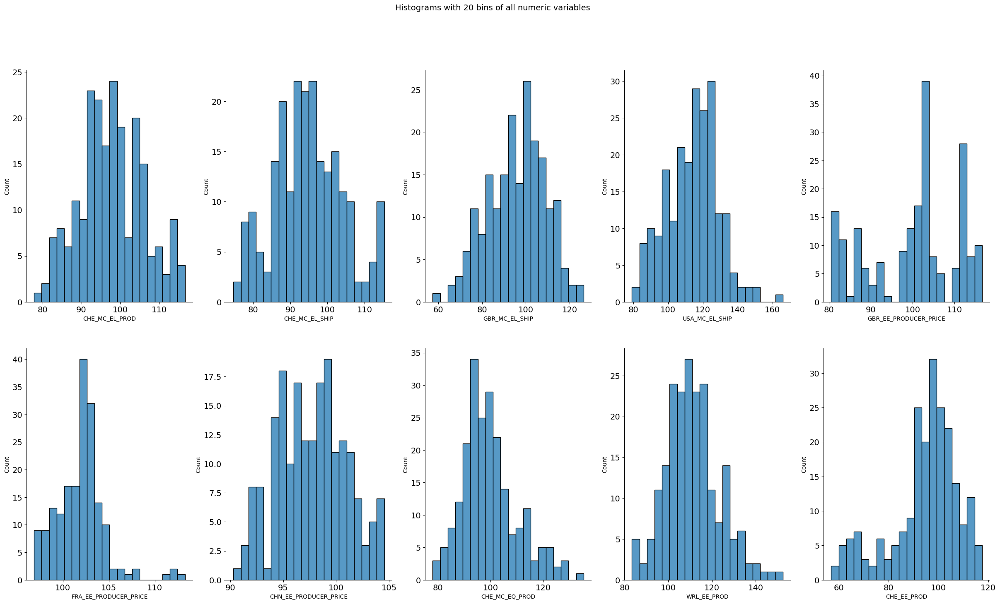

In [77]:
# Initialize a figure with 2 rows and 5 columns of subplots
fig, ax = plt.subplots(2, 5, figsize=(30,16))

# Iterate through each index in 'indexes_to_fill' and the corresponding subplot axis
for var, subplot in zip(Market_neighbors[indexes_to_fill], ax.flatten()):
    # Create a histogram for each index and assign it to the its subplot
    g = sns.histplot(data=market2,
                bins=20,
                 x=var,
                 ax=subplot,
                 kde=False)

# Remove the top and right spines --> cleaner visualization
sns.despine()
# Set global customization for font sizes
plt.rc('axes', labelsize=subPlots_label_fontSize)
# Add a title
fig.suptitle("Histograms with 20 bins of all numeric variables", fontsize=plots_Title_fontSize);

In [78]:
# Update 'market2' --> cleaned and imputed dataset
market2 = Market_neighbors.copy()

In [79]:
# check the first five rows of 'market2'
market2.head()

1,CHN_MC_EL_PROD,CHN_MC_EL_SHIP,FRA_MC_EL_PROD,FRA_MC_EL_SHIP,DEU_MC_EL_PROD,DEU_MC_EL_SHIP,ITA_MC_EL_PROD,ITA_MC_EL_SHIP,JPN_MC_EL_PROD,JPN_MC_EL_SHIP,CHE_MC_EL_PROD,CHE_MC_EL_SHIP,GBR_MC_EL_PROD,GBR_MC_EL_SHIP,USA_MC_EL_PROD,USA_MC_EL_SHIP,EU_MC_EL_PROD,EU_MC_EL_SHIP,WRL_BASE_METAL_PRICE,WRL_ENERGY_PRICE,WRL_METAL_MINERAL_PRICE,WRL_GAS,WRL_AVG_OIL_PRICE,WRL_COPPER_PRICE,USA_EUR_LCU,USA_EE_PRODUCER_PRICE,GBR_EE_PRODUCER_PRICE,ITA_EE_PRODUCER_PRICE,FRA_EE_PRODUCER_PRICE,DEU_EE_PRODUCER_PRICE,CHN_EE_PRODUCER_PRICE,USA_MC_EQ_PROD,WRL_MC_EQ_PROD,CHE_MC_EQ_PROD,GBR_MC_EQ_PROD,ITA_MC_EQ_PROD,JPN_MC_EQ_PROD,FRA_MC_EQ_PROD,DEU_MC_EQ_PROD,USA_EE_PROD,WRL_EE_PROD,CHE_EE_PROD,GBR_EE_PROD,ITA_EE_PROD,JPN_EE_PROD,FRA_EE_PROD,DEU_EE_PROD
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-02-01,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,110.495272,91.221862,89.987275,111.353812,73.601265,107.601400,79.240230,97.122911,80.098530,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,99.087436,93.230453,96.603081,102.491722,97.597374,97.100000,106.191977,116.790276,110.890034,118.274109,80.829010,117.723991,98.353817,81.100000,120.706516,141.510864,106.161262,102.077057,85.913200
2004-03-01,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,97.996433,93.335678,97.608746,105.627480,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,105.073985,76.690307,138.309550,152.880234,140.288741,117.225685,97.670815
2004-04-01,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,99.107829,93.440903,96.603081,103.484955,100.169090,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,98.353817,71.552403,115.557330,137.796875,106.271197,105.335777,87.253983
2004-05-01,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.378729,79.598021,110.645200,74.591883,108.425887,87.463813,101.275727,84.485767,51.230356,53.590898,46.468392,99.044520,47.517121,36.278433,1.2007,80.798828,80.757423,93.852425,98.985473,93.546127,96.603081,103.643944,99.581436,96.391954,105.885359,131.988998,101.990361,116.649750,88.082901,117.899216,98.353817,66.414500,119.269534,143.860535,101.608710,96.616508,84.675552
2004-06-01,27.009138,27.009138,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,119.616380,85.134950,79.455239,122.020960,82.343346,110.569933,97.364496,112.057197,96.963294,52.876331,50.799575,47.803913,98.636267,44.967605,35.657380,1.2138,80.913490,80.552711,93.956467,98.699977,93.440903,97.450006,106.062668,109.277710,98.990373,118.252278,132.988922,122.136575,143.248734,100.978699,119.499107,101.174203,61.276596,128.849416,144.315308,116.655248,118.458710,95.401802


#### Creating a data set with market data for the same period as sales data

In [80]:
# Find the earliest and latest date in 'monthly_sales' index
start_date = monthly_sales.index.min()  
end_date = monthly_sales.index.max()   
# Filter 'market2' data to only include rows that fall within the start and end dates inclusive and store in 'market_filtered'
market_filtered = market2.loc[start_date:end_date]

In [81]:
# check the first five rows of 'market_filtered'
market_filtered.head()

1,CHN_MC_EL_PROD,CHN_MC_EL_SHIP,FRA_MC_EL_PROD,FRA_MC_EL_SHIP,DEU_MC_EL_PROD,DEU_MC_EL_SHIP,ITA_MC_EL_PROD,ITA_MC_EL_SHIP,JPN_MC_EL_PROD,JPN_MC_EL_SHIP,CHE_MC_EL_PROD,CHE_MC_EL_SHIP,GBR_MC_EL_PROD,GBR_MC_EL_SHIP,USA_MC_EL_PROD,USA_MC_EL_SHIP,EU_MC_EL_PROD,EU_MC_EL_SHIP,WRL_BASE_METAL_PRICE,WRL_ENERGY_PRICE,WRL_METAL_MINERAL_PRICE,WRL_GAS,WRL_AVG_OIL_PRICE,WRL_COPPER_PRICE,USA_EUR_LCU,USA_EE_PRODUCER_PRICE,GBR_EE_PRODUCER_PRICE,ITA_EE_PRODUCER_PRICE,FRA_EE_PRODUCER_PRICE,DEU_EE_PRODUCER_PRICE,CHN_EE_PRODUCER_PRICE,USA_MC_EQ_PROD,WRL_MC_EQ_PROD,CHE_MC_EQ_PROD,GBR_MC_EQ_PROD,ITA_MC_EQ_PROD,JPN_MC_EQ_PROD,FRA_MC_EQ_PROD,DEU_MC_EQ_PROD,USA_EE_PROD,WRL_EE_PROD,CHE_EE_PROD,GBR_EE_PROD,ITA_EE_PROD,JPN_EE_PROD,FRA_EE_PROD,DEU_EE_PROD
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-01,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.793250,109.077781,104.594781,113.659322,112.318030,111.902540,127.808839,124.391967,130.989253,86.102586,100.222169,79.354986,89.570796,97.072264,82.545082,1.1484,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.893450,129.389221,131.503786,114.720810,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233
2018-11-01,220.519655,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,123.289888,112.241491,107.656238,115.088417,112.801011,110.880401,117.675874,123.070091,132.934130,83.841374,84.436807,77.500875,97.362468,78.841167,82.230939,1.1367,110.994026,111.668373,105.297836,102.064743,109.224838,95.370118,109.737129,129.976456,110.792831,112.119922,117.990173,127.880755,104.873100,132.987915,113.145294,128.236176,114.736013,120.467019,84.133400,111.907535,91.155960,117.163727
2018-12-01,241.846854,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,124.508413,115.405201,110.717696,101.556108,94.503733,106.257796,123.280134,113.858005,131.261348,82.733389,74.898746,76.071705,94.406578,68.268564,80.630361,1.1384,111.162231,112.794266,105.297836,102.166710,109.330063,94.994885,103.448280,124.202469,114.768725,99.446384,99.191734,128.125679,104.974617,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122
2019-01-01,175.668147,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,106.303946,109.621788,105.164427,101.799754,99.659210,107.510808,111.043755,106.418002,113.057565,81.251093,76.204771,75.774153,80.055366,71.587526,78.822478,1.1416,111.386055,112.077789,105.505936,102.778488,109.750961,94.950134,106.506844,112.175400,109.196212,98.833149,106.991089,110.200941,95.228432,104.432930,109.499725,111.522202,110.354610,107.174933,81.556343,95.957352,81.908257,105.406097
2019-02-01,175.668147,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,114.996302,103.838375,99.611158,103.495768,100.589459,109.817608,116.736921,110.429590,117.704727,84.681739,80.086039,80.117198,69.545042,77.344049,83.618770,1.1351,111.561142,111.361313,105.297836,102.676529,109.856194,94.712204,109.303719,116.603294,103.623699,99.548590,113.790520,117.976532,100.101524,112.838226,110.835655,112.666725,104.208038,110.647640,83.451233,107.309956,80.322929,103.652771


### 4.2.2 Feature Engineering for market features

In [82]:
# List all the column names in 'market_filtered'
_col = market_filtered.columns

# Iterate through each column in the list
for col in _col:
    # Create a new column name: appending '_Rolling_Mean_3' to the original column name
    rolling_mean_col_name = f'{col}_Rolling_Mean_3'
    # Calculate a rolling mean with a window size of 3 for the current column and assign it to the new column
    market_filtered[rolling_mean_col_name] = market_filtered[col].rolling(window=3).mean()
    # Backfill NaN values that may have been generated
    market_filtered[rolling_mean_col_name].fillna(method='bfill', inplace=True)
    
    # Create a new column name: appending '_%Delta' to the original column name
    pct_change_col_name = f'{col}_%Delta'
    # Calculate the percentage change from the previous row to the current row
    market_filtered[pct_change_col_name] = market_filtered[col].pct_change().mul(100)
    # Backfill NaN values that may have been generated
    market_filtered[pct_change_col_name].fillna(method='bfill', inplace=True)

In [83]:
# Identify duplicate columns in the 'market_filtered' DataFrame
duplicate_columns = market_filtered.columns[market_filtered.columns.duplicated()]

# Show the duplicate columns names
print(duplicate_columns)

Index([], dtype='object', name=1)


In [84]:
# check the first five rows of 'market_filtered'
market_filtered.head()

1,CHN_MC_EL_PROD,CHN_MC_EL_SHIP,FRA_MC_EL_PROD,FRA_MC_EL_SHIP,DEU_MC_EL_PROD,DEU_MC_EL_SHIP,ITA_MC_EL_PROD,ITA_MC_EL_SHIP,JPN_MC_EL_PROD,JPN_MC_EL_SHIP,CHE_MC_EL_PROD,CHE_MC_EL_SHIP,GBR_MC_EL_PROD,GBR_MC_EL_SHIP,USA_MC_EL_PROD,USA_MC_EL_SHIP,EU_MC_EL_PROD,EU_MC_EL_SHIP,WRL_BASE_METAL_PRICE,WRL_ENERGY_PRICE,WRL_METAL_MINERAL_PRICE,WRL_GAS,WRL_AVG_OIL_PRICE,WRL_COPPER_PRICE,USA_EUR_LCU,USA_EE_PRODUCER_PRICE,GBR_EE_PRODUCER_PRICE,ITA_EE_PRODUCER_PRICE,FRA_EE_PRODUCER_PRICE,DEU_EE_PRODUCER_PRICE,CHN_EE_PRODUCER_PRICE,USA_MC_EQ_PROD,WRL_MC_EQ_PROD,CHE_MC_EQ_PROD,GBR_MC_EQ_PROD,ITA_MC_EQ_PROD,JPN_MC_EQ_PROD,FRA_MC_EQ_PROD,DEU_MC_EQ_PROD,USA_EE_PROD,WRL_EE_PROD,CHE_EE_PROD,GBR_EE_PROD,ITA_EE_PROD,JPN_EE_PROD,FRA_EE_PROD,DEU_EE_PROD,CHN_MC_EL_PROD_Rolling_Mean_3,CHN_MC_EL_PROD_%Delta,CHN_MC_EL_SHIP_Rolling_Mean_3,CHN_MC_EL_SHIP_%Delta,FRA_MC_EL_PROD_Rolling_Mean_3,FRA_MC_EL_PROD_%Delta,FRA_MC_EL_SHIP_Rolling_Mean_3,FRA_MC_EL_SHIP_%Delta,DEU_MC_EL_PROD_Rolling_Mean_3,DEU_MC_EL_PROD_%Delta,DEU_MC_EL_SHIP_Rolling_Mean_3,DEU_MC_EL_SHIP_%Delta,ITA_MC_EL_PROD_Rolling_Mean_3,ITA_MC_EL_PROD_%Delta,ITA_MC_EL_SHIP_Rolling_Mean_3,ITA_MC_EL_SHIP_%Delta,JPN_MC_EL_PROD_Rolling_Mean_3,JPN_MC_EL_PROD_%Delta,JPN_MC_EL_SHIP_Rolling_Mean_3,JPN_MC_EL_SHIP_%Delta,CHE_MC_EL_PROD_Rolling_Mean_3,CHE_MC_EL_PROD_%Delta,CHE_MC_EL_SHIP_Rolling_Mean_3,CHE_MC_EL_SHIP_%Delta,GBR_MC_EL_PROD_Rolling_Mean_3,GBR_MC_EL_PROD_%Delta,GBR_MC_EL_SHIP_Rolling_Mean_3,GBR_MC_EL_SHIP_%Delta,USA_MC_EL_PROD_Rolling_Mean_3,USA_MC_EL_PROD_%Delta,USA_MC_EL_SHIP_Rolling_Mean_3,USA_MC_EL_SHIP_%Delta,EU_MC_EL_PROD_Rolling_Mean_3,EU_MC_EL_PROD_%Delta,EU_MC_EL_SHIP_Rolling_Mean_3,EU_MC_EL_SHIP_%Delta,WRL_BASE_METAL_PRICE_Rolling_Mean_3,WRL_BASE_METAL_PRICE_%Delta,WRL_ENERGY_PRICE_Rolling_Mean_3,WRL_ENERGY_PRICE_%Delta,WRL_METAL_MINERAL_PRICE_Rolling_Mean_3,WRL_METAL_MINERAL_PRICE_%Delta,WRL_GAS_Rolling_Mean_3,WRL_GAS_%Delta,WRL_AVG_OIL_PRICE_Rolling_Mean_3,WRL_AVG_OIL_PRICE_%Delta,WRL_COPPER_PRICE_Rolling_Mean_3,WRL_COPPER_PRICE_%Delta,USA_EUR_LCU_Rolling_Mean_3,USA_EUR_LCU_%Delta,USA_EE_PRODUCER_PRICE_Rolling_Mean_3,USA_EE_PRODUCER_PRICE_%Delta,GBR_EE_PRODUCER_PRICE_Rolling_Mean_3,GBR_EE_PRODUCER_PRICE_%Delta,ITA_EE_PRODUCER_PRICE_Rolling_Mean_3,ITA_EE_PRODUCER_PRICE_%Delta,FRA_EE_PRODUCER_PRICE_Rolling_Mean_3,FRA_EE_PRODUCER_PRICE_%Delta,DEU_EE_PRODUCER_PRICE_Rolling_Mean_3,DEU_EE_PRODUCER_PRICE_%Delta,CHN_EE_PRODUCER_PRICE_Rolling_Mean_3,CHN_EE_PRODUCER_PRICE_%Delta,USA_MC_EQ_PROD_Rolling_Mean_3,USA_MC_EQ_PROD_%Delta,WRL_MC_EQ_PROD_Rolling_Mean_3,WRL_MC_EQ_PROD_%Delta,CHE_MC_EQ_PROD_Rolling_Mean_3,CHE_MC_EQ_PROD_%Delta,GBR_MC_EQ_PROD_Rolling_Mean_3,GBR_MC_EQ_PROD_%Delta,ITA_MC_EQ_PROD_Rolling_Mean_3,ITA_MC_EQ_PROD_%Delta,JPN_MC_EQ_PROD_Rolling_Mean_3,JPN_MC_EQ_PROD_%Delta,FRA_MC_EQ_PROD_Rolling_Mean_3,FRA_MC_EQ_PROD_%Delta,DEU_MC_EQ_PROD_Rolling_Mean_3,DEU_MC_EQ_PROD_%Delta,USA_EE_PROD_Rolling_Mean_3,USA_EE_PROD_%Delta,WRL_EE_PROD_Rolling_Mean_3,WRL_EE_PROD_%Delta,CHE_EE_PROD_Rolling_Mean_3,CHE_EE_PROD_%Delta,GBR_EE_PROD_Rolling_Mean_3,GBR_EE_PROD_%Delta,ITA_EE_PROD_Rolling_Mean_3,ITA_EE_PROD_%Delta,JPN_EE_PROD_Rolling_Mean_3,JPN_EE_PROD_%Delta,FRA_EE_PROD_Rolling_Mean_3,FRA_EE_PROD_%Delta,DEU_EE_PROD_Rolling_Mean_3,DEU_EE_PROD_%Delta
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-01,211.955755,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,124.793250,109.077781,104.594781,113.659322,112.318030,111.902540,127.808839,124.391967,130.989253,86.102586,100.222169,79.354986,89.570796,97.072264,82.545082,1.1484,110.700409,111.463669,105.297836,102.064743,109.119614,96.318329,111.422638,131.340118,106.816937,110.893450,129.389221,131.503786,114.720810,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,224.774088,4.040419,224.774088,4.040419,100.869277,-7.982682,117.846137,-5.302925,124.050192,2.556795,1

#### Creating a dataset for each product including market features

In [85]:
df_gdk_1 = pd.concat([df_gdk_1, market_filtered], axis=1)
df_gdk_3 = pd.concat([df_gdk_3, market_filtered], axis=1)
df_gdk_4 = pd.concat([df_gdk_4, market_filtered], axis=1)
df_gdk_5 = pd.concat([df_gdk_5, market_filtered], axis=1)
df_gdk_6 = pd.concat([df_gdk_6, market_filtered], axis=1)
df_gdk_8 = pd.concat([df_gdk_8, market_filtered], axis=1)
df_gdk_9 = pd.concat([df_gdk_9, market_filtered], axis=1)
df_gdk_11 = pd.concat([df_gdk_11, market_filtered], axis=1)
df_gdk_12 = pd.concat([df_gdk_12, market_filtered], axis=1)
df_gdk_13 = pd.concat([df_gdk_13, market_filtered], axis=1)
df_gdk_14 = pd.concat([df_gdk_14, market_filtered], axis=1)
df_gdk_16 = pd.concat([df_gdk_16, market_filtered], axis=1)
df_gdk_20 = pd.concat([df_gdk_20, market_filtered], axis=1)
df_gdk_36 = pd.concat([df_gdk_36, market_filtered], axis=1)

In [86]:
# Identify duplicate columns in the 'df_gdk_1' DataFrame created above
duplicate_columns = df_gdk_1.columns[df_gdk_1.columns.duplicated()]

# Show the duplicate columns names
print(duplicate_columns)

Index([], dtype='object')


# 5. Feature selection

## 5.1 Spliting each product's data set in training and validation

In [87]:
# Define a date to split the data
split_date = pd.Timestamp('2022-01-01')

In [88]:
# Initialize the StandardScaler
scaler = StandardScaler()

### Feature Selection GDK 1 

In [89]:
# Define train and validation data of 'df_gdk_1', based on the split date
train = df_gdk_1[df_gdk_1.index < split_date]
validation = df_gdk_1[df_gdk_1.index >= split_date]

X_train_GDK_1 = train.drop(['GDK_1'], axis=1)  #input features for training (excluding target and date)
y_train_GDK_1 = train['GDK_1']  #target variable for training

X_val_GDK_1 = validation.drop(['GDK_1'], axis=1)  #input features for validation
y_val_GDK_1 = validation['GDK_1']  #target variable for validation

In [90]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_1.columns

X_train_GDK_1[variables_train] = scaler.fit_transform(X_train_GDK_1[variables_train]) #scale using StandardScaler
X_train_GDK_1[variables_train] = imputer.fit_transform(X_train_GDK_1[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_1.columns
X_val_GDK_1[variables_val] = scaler.transform(X_val_GDK_1[variables_val]) #scale using StandardScaler
X_val_GDK_1[variables_val]  = imputer.transform(X_val_GDK_1[variables_val]) #input missing values

In [91]:
# check the first five rows of the train data
X_train_GDK_1.head()

,Quarter,Month,GDK_1_Rolling_Mean_3,GDK_1_Growth_Rate,CHN_MC_EL_PROD,CHN_MC_EL_SHIP,FRA_MC_EL_PROD,FRA_MC_EL_SHIP,DEU_MC_EL_PROD,DEU_MC_EL_SHIP,ITA_MC_EL_PROD,ITA_MC_EL_SHIP,JPN_MC_EL_PROD,JPN_MC_EL_SHIP,CHE_MC_EL_PROD,CHE_MC_EL_SHIP,GBR_MC_EL_PROD,GBR_MC_EL_SHIP,USA_MC_EL_PROD,USA_MC_EL_SHIP,EU_MC_EL_PROD,EU_MC_EL_SHIP,WRL_BASE_METAL_PRICE,WRL_ENERGY_PRICE,WRL_METAL_MINERAL_PRICE,WRL_GAS,WRL_AVG_OIL_PRICE,WRL_COPPER_PRICE,USA_EUR_LCU,USA_EE_PRODUCER_PRICE,GBR_EE_PRODUCER_PRICE,ITA_EE_PRODUCER_PRICE,FRA_EE_PRODUCER_PRICE,DEU_EE_PRODUCER_PRICE,CHN_EE_PRODUCER_PRICE,USA_MC_EQ_PROD,WRL_MC_EQ_PROD,CHE_MC_EQ_PROD,GBR_MC_EQ_PROD,ITA_MC_EQ_PROD,JPN_MC_EQ_PROD,FRA_MC_EQ_PROD,DEU_MC_EQ_PROD,USA_EE_PROD,WRL_EE_PROD,CHE_EE_PROD,GBR_EE_PROD,ITA_EE_PROD,JPN_EE_PROD,FRA_EE_PROD,DEU_EE_PROD,CHN_MC_EL_PROD_Rolling_Mean_3,CHN_MC_EL_PROD_%Delta,CHN_MC_EL_SHIP_Rolling_Mean_3,CHN_MC_EL_SHIP_%Delta,FRA_MC_EL_PROD_Rolling_Mean_3,FRA_MC_EL_PROD_%Delta,FRA_MC_EL_SHIP_Rolling_Mean_3,FRA_MC_EL_SHIP_%Delta,DEU_MC_EL_PROD_Rolling_Mean_3,DEU_MC_EL_PROD_%Delta,DEU_MC_EL_SHIP_Rolling_Mean_3,DEU_MC_EL_SHIP_%Delta,ITA_MC_EL_PROD_Rolling_Mean_3,ITA_MC_EL_PROD_%Delta,ITA_MC_EL_SHIP_Rolling_Mean_3,ITA_MC_EL_SHIP_%Delta,JPN_MC_EL_PROD_Rolling_Mean_3,JPN_MC_EL_PROD_%Delta,JPN_MC_EL_SHIP_Rolling_Mean_3,JPN_MC_EL_SHIP_%Delta,CHE_MC_EL_PROD_Rolling_Mean_3,CHE_MC_EL_PROD_%Delta,CHE_MC_EL_SHIP_Rolling_Mean_3,CHE_MC_EL_SHIP_%Delta,GBR_MC_EL_PROD_Rolling_Mean_3,GBR_MC_EL_PROD_%Delta,GBR_MC_EL_SHIP_Rolling_Mean_3,GBR_MC_EL_SHIP_%Delta,USA_MC_EL_PROD_Rolling_Mean_3,USA_MC_EL_PROD_%Delta,USA_MC_EL_SHIP_Rolling_Mean_3,USA_MC_EL_SHIP_%Delta,EU_MC_EL_PROD_Rolling_Mean_3,EU_MC_EL_PROD_%Delta,EU_MC_EL_SHIP_Rolling_Mean_3,EU_MC_EL_SHIP_%Delta,WRL_BASE_METAL_PRICE_Rolling_Mean_3,WRL_BASE_METAL_PRICE_%Delta,WRL_ENERGY_PRICE_Rolling_Mean_3,WRL_ENERGY_PRICE_%Delta,WRL_METAL_MINERAL_PRICE_Rolling_Mean_3,WRL_METAL_MINERAL_PRICE_%Delta,WRL_GAS_Rolling_Mean_3,WRL_GAS_%Delta,WRL_AVG_OIL_PRICE_Rolling_Mean_3,WRL_AVG_OIL_PRICE_%Delta,WRL_COPPER_PRICE_Rolling_Mean_3,WRL_COPPER_PRICE_%Delta,USA_EUR_LCU_Rolling_Mean_3,USA_EUR_LCU_%Delta,USA_EE_PRODUCER_PRICE_Rolling_Mean_3,USA_EE_PRODUCER_PRICE_%Delta,GBR_EE_PRODUCER_PRICE_Rolling_Mean_3,GBR_EE_PRODUCER_PRICE_%Delta,ITA_EE_PRODUCER_PRICE_Rolling_Mean_3,ITA_EE_PRODUCER_PRICE_%Delta,FRA_EE_PRODUCER_PRICE_Rolling_Mean_3,FRA_EE_PRODUCER_PRICE_%Delta,DEU_EE_PRODUCER_PRICE_Rolling_Mean_3,DEU_EE_PRODUCER_PRICE_%Delta,CHN_EE_PRODUCER_PRICE_Rolling_Mean_3,CHN_EE_PRODUCER_PRICE_%Delta,USA_MC_EQ_PROD_Rolling_Mean_3,USA_MC_EQ_PROD_%Delta,WRL_MC_EQ_PROD_Rolling_Mean_3,WRL_MC_EQ_PROD_%Delta,CHE_MC_EQ_PROD_Rolling_Mean_3,CHE_MC_EQ_PROD_%Delta,GBR_MC_EQ_PROD_Rolling_Mean_3,GBR_MC_EQ_PROD_%Delta,ITA_MC_EQ_PROD_Rolling_Mean_3,ITA_MC_EQ_PROD_%Delta,JPN_MC_EQ_PROD_Rolling_Mean_3,JPN_MC_EQ_PROD_%Delta,FRA_MC_EQ_PROD_Rolling_Mean_3,FRA_MC_EQ_PROD_%Delta,DEU_MC_EQ_PROD_Rolling_Mean_3,DEU_MC_EQ_PROD_%Delta,USA_EE_PROD_Rolling_Mean_3,USA_EE_PROD_%Delta,WRL_EE_PROD_Rolling_Mean_3,WRL_EE_PROD_%Delta,CHE_EE_PROD_Rolling_Mean_3,CHE_EE_PROD_%Delta,GBR_EE_PROD_Rolling_Mean_3,GBR_EE_PROD_%Delta,ITA_EE_PROD_Rolling_Mean_3,ITA_EE_PROD_%Delta,JPN_EE_PROD_Rolling_Mean_3,JPN_EE_PROD_%Delta,FRA_EE_PROD_Rolling_Mean_3,FRA_EE_PROD_%Delta,DEU_EE_PROD_Rolling_Mean_3,DEU_EE_PROD_%Delta
2018-10-01,1.208081,0.892430,-1.003550,-1.677547,-0.742658,-0.742658,1.262548,0.864730,1.451149,0.810882,1.103296,0.451630,0.933829,0.757268,1.436344,1.350159,0.891967,1.005719,1.063032,0.104347,1.118868,0.494685,-0.349554,1.160656,-0.583251,0.189256,1.368141,-0.547702,0.020788,-0.721950,-0.995622,-0.537960,-0.925182,-1.251965,0.978778,0.986702,0.861913,1.424175,1.212007,1.185588,1.014892,1.119551,1.121075,1.109031,0.393186,1.149696,0.054600,0.829667,0.660276,1.509824,1.698775,-0.560223,0.033972,-0.560223,0.033972,1.138279,-0.438230,0.893845,-0.387346,1.914098,0.174831,1.561343,0.195055,0.607676,-0.394052,0.914771,-0.218557,1.309431,-0.209364,1.209196,-0.160578,1.789339,0.821481,1.725912,0.809776,0.79404

In [92]:
# check for duplicate columns in the train data
duplicate_columns = X_train_GDK_1.columns[X_train_GDK_1.columns.duplicated()]
print(duplicate_columns)

Index([], dtype='object')


In [93]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_1, y_train_GDK_1)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_1.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_1[selected_features], y_train_GDK_1, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 14  13   1   1  31  88  11   1   1  21   1   1  24   5  23  75  26  39
  22  25 109   8   1  20  18 103  79  47  48  32  10 117  73  40 122  71
  41  84 130  67 133 135  94  70  35   7  34  19   9   1 124  33  56 119
 125 127  72  52  30  17 105 102 106  44  92  15  43  42 111 113  16  85
   1 118 120  38  77 107  61 129   6 131   1  89  96 132 134  91  86 100
   4  64  66  98  12  62  28 123  57 110  69 112  83  81  49  80   3  27
  29 126  54  78  99  36 101 108  51  82  50  45 121  93 128 116 104 114
   2 115  95  74  58  90  63  65  53  60  87  46  68  59  76  97  37  55
 136]
Selected Features:  Index(['GDK_1_Rolling_Mean_3', 'GDK_1_Growth_Rate', 'FRA_MC_EL_SHIP',
       'DEU_MC_EL_PROD', 'ITA_MC_EL_PROD', 'ITA_MC_EL_SHIP',
       'WRL_BASE_METAL_PRICE', 'FRA_EE_PROD', 'CHE_MC_EL_PROD_%Delta',
       'USA_MC_EL_SHIP_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [-4.83334283e+13 -1.22948814e+13 -3.39863404e+12 -2.61308871e+12

In [94]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_1.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_1_Rolling_Mean_3                       True
GDK_1_Growth_Rate                          True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                             True
DEU_MC_EL_PROD                             True
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                             True
ITA_MC_EL_SHIP                             True
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                            False
EU_MC_EL_PROD                           

In [95]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_1, y_train_GDK_1)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_1.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

USA_MC_EL_SHIP_Rolling_Mean_3             0.362518
CHE_MC_EL_SHIP_%Delta                     0.341910
CHE_MC_EQ_PROD_%Delta                     0.318329
CHE_MC_EL_PROD_%Delta                     0.295924
WRL_MC_EQ_PROD                            0.287186
CHE_EE_PROD_%Delta                        0.271967
EU_MC_EL_SHIP                             0.249054
GDK_1_Rolling_Mean_3                      0.230263
FRA_EE_PRODUCER_PRICE_Rolling_Mean_3      0.227671
DEU_MC_EL_SHIP                            0.213231
USA_MC_EQ_PROD_%Delta                     0.200029
Month                                     0.196558
FRA_MC_EL_PROD_%Delta                     0.196084
JPN_MC_EL_SHIP_%Delta                     0.192781
GDK_1_Growth_Rate                         0.185895
Quarter                                   0.185737
ITA_MC_EL_SHIP_%Delta                     0.175872
GBR_EE_PROD_Rolling_Mean_3                0.175132
FRA_MC_EQ_PROD_%Delta                     0.166538
WRL_BASE_METAL_PRICE_Rolling_Me

Lasso picked 3 variables and eliminated the other 142 variables


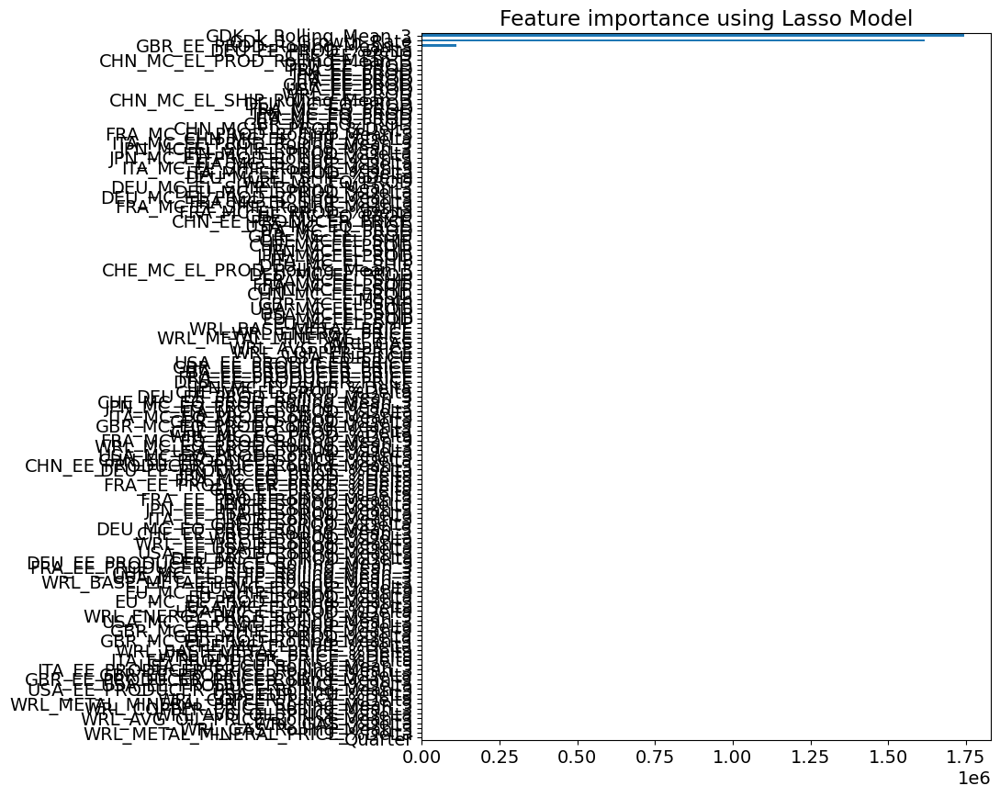

In [96]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data
reg.fit(X_train_GDK_1, y_train_GDK_1)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_1.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [97]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_1, y_train_GDK_1))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_1.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 587115.958346
Best score using built-in LassoCV: 0.711094


GDK_1_Rolling_Mean_3                      1.744754e+06
GDK_1_Growth_Rate                         1.617757e+06
GBR_EE_PROD_Rolling_Mean_3                1.108436e+05
Quarter                                   0.000000e+00
USA_EUR_LCU_%Delta                        0.000000e+00
WRL_GAS_%Delta                            0.000000e+00
WRL_AVG_OIL_PRICE_Rolling_Mean_3          0.000000e+00
WRL_AVG_OIL_PRICE_%Delta                  0.000000e+00
WRL_COPPER_PRICE_Rolling_Mean_3           0.000000e+00
WRL_COPPER_PRICE_%Delta                   0.000000e+00
USA_EUR_LCU_Rolling_Mean_3                0.000000e+00
USA_EE_PRODUCER_PRICE_Rolling_Mean_3      0.000000e+00
WRL_METAL_MINERAL_PRICE_%Delta            0.000000e+00
USA_EE_PRODUCER_PRICE_%Delta              0.000000e+00
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3      0.000000e+00
GBR_EE_PRODUCER_PRICE_%Delta              0.000000e+00
ITA_EE_PRODUCER_PRICE_Rolling_Mean_3      0.000000e+00
ITA_EE_PRODUCER_PRICE_%Delta              0.000000e+00
FRA_EE_PRO

### Feature Selection GDK 3

In [98]:
# Define train and validation data of 'df_gdk_3', based on the split date
train = df_gdk_3[df_gdk_3.index < split_date]
validation = df_gdk_3[df_gdk_3.index >= split_date]

X_train_GDK_3 = train.drop(['GDK_3'], axis=1) #input features for training (excluding target and date)
y_train_GDK_3 = train['GDK_3'] #target variable for training

X_val_GDK_3 = validation.drop(['GDK_3'], axis=1) #input features for validation
y_val_GDK_3 = validation['GDK_3'] #target variable for validation

In [99]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_3.columns
X_train_GDK_3[variables_train] = scaler.fit_transform(X_train_GDK_3[variables_train]) #scale using StandardScaler
X_train_GDK_3[variables_train] = imputer.fit_transform(X_train_GDK_3[variables_train])  #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_3.columns
X_val_GDK_3[variables_val] = scaler.transform(X_val_GDK_3[variables_val]) #scale using StandardScaler
X_val_GDK_3[variables_val] = imputer.transform(X_val_GDK_3[variables_val])  #input missing values

In [100]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_3, y_train_GDK_3)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_3.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_3[selected_features], y_train_GDK_3, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 13  11   1   1  24  14  89  19  49   4  79   5   2  37  29  28  61 111
 112 104  32  18  26  66  87  22   8   6  82   1 102  70 107 106   7  72
  51 125 126 121 128 127  75  58  68 133   1  10  74  76  12  16  30  38
 115 117  67   9  56  80 131   1  35  96  53   1  84  15  27   1  52 135
 137 136 134 132 130  42 124  64  59  39  90   1 120 122 123  62  60  20
 119  46  77  63  71  43  65  17 110  36  57  41 103  86  93  45 118   3
  92  31  99 100 105  48 108  33 113 114  50  73  78  54 109  95  34 129
  98  40 116  23  55  44  25  94  47   1  88  81  91 101  83  69  85  97
  21   1]
Selected Features:  Index(['GDK_3_Rolling_Mean_3', 'GDK_3_Growth_Rate', 'USA_EUR_LCU',
       'CHE_EE_PROD', 'DEU_MC_EL_PROD_%Delta', 'ITA_MC_EL_PROD_%Delta',
       'JPN_MC_EL_PROD_%Delta', 'USA_MC_EL_SHIP_%Delta', 'CHE_EE_PROD_%Delta',
       'DEU_EE_PROD_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [-5.14824094e+12 -5.61731213e+11 -2.30971281e+1

In [101]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_3.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_3_Rolling_Mean_3                       True
GDK_3_Growth_Rate                          True
GDK_3_Lag2                                False
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                          

In [102]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_3, y_train_GDK_3)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_3.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_3_Rolling_Mean_3                      0.360734
GDK_3_Growth_Rate                         0.239275
FRA_MC_EQ_PROD_%Delta                     0.234267
JPN_MC_EL_PROD_%Delta                     0.223737
FRA_MC_EL_SHIP_%Delta                     0.213332
CHE_MC_EQ_PROD                            0.205539
ITA_MC_EL_SHIP_%Delta                     0.197256
ITA_EE_PROD_Rolling_Mean_3                0.184875
WRL_EE_PROD                               0.175416
ITA_EE_PROD_%Delta                        0.175409
DEU_MC_EQ_PROD                            0.172815
DEU_EE_PROD                               0.168157
USA_EE_PRODUCER_PRICE                     0.158615
GBR_MC_EQ_PROD_%Delta                     0.157511
EU_MC_EL_PROD                             0.149599
DEU_MC_EQ_PROD_Rolling_Mean_3             0.149194
JPN_MC_EL_SHIP_%Delta                     0.148248
ITA_MC_EL_PROD_%Delta                     0.144140
USA_EE_PRODUCER_PRICE_%Delta              0.143233
EU_MC_EL_SHIP_%Delta           

Lasso picked 12 variables and eliminated the other 134 variables


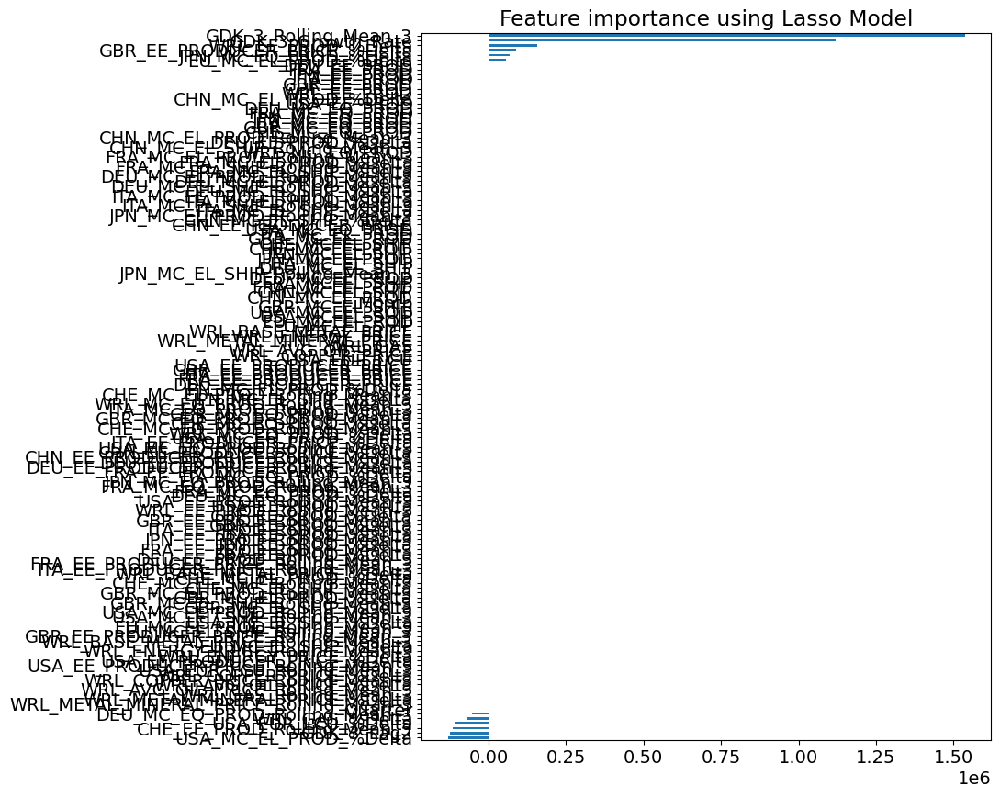

In [103]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data 
reg.fit(X_train_GDK_3, y_train_GDK_3)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_3.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [104]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_3, y_train_GDK_3))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_3.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 113342.269849
Best score using built-in LassoCV: 0.898477


GDK_3_Rolling_Mean_3                      1.538522e+06
GDK_3_Growth_Rate                         1.119067e+06
WRL_EE_PROD_%Delta                        1.561747e+05
USA_MC_EL_PROD_%Delta                     1.315640e+05
GDK_3_Lag2                                1.231633e+05
CHE_EE_PROD_Rolling_Mean_3                1.150273e+05
USA_EUR_LCU_%Delta                        1.093456e+05
GBR_EE_PRODUCER_PRICE_%Delta              8.751170e+04
WRL_GAS_%Delta                            6.839516e+04
JPN_MC_EQ_PROD_%Delta                     6.658459e+04
EU_MC_EL_PROD_%Delta                      5.502897e+04
DEU_MC_EQ_PROD_Rolling_Mean_3             5.336360e+04
WRL_COPPER_PRICE_Rolling_Mean_3           0.000000e+00
WRL_AVG_OIL_PRICE_Rolling_Mean_3          0.000000e+00
WRL_AVG_OIL_PRICE_%Delta                  0.000000e+00
WRL_GAS_Rolling_Mean_3                    0.000000e+00
Quarter                                   0.000000e+00
USA_EUR_LCU_Rolling_Mean_3                0.000000e+00
WRL_COPPER

### Feature Selection GDK 4

In [105]:
# Define train and validation data of 'df_gdk_4', based on the split date
train = df_gdk_4[df_gdk_4.index < split_date]
validation = df_gdk_4[df_gdk_4.index >= split_date]

X_train_GDK_4 = train.drop(['GDK_4'], axis=1)  #input features for training (excluding target and date)
y_train_GDK_4 = train['GDK_4'] #target variable for training

X_val_GDK_4 = validation.drop(['GDK_4'], axis=1) #input features for validation
y_val_GDK_4 = validation['GDK_4'] #target variable for validation

In [106]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_4.columns
X_train_GDK_4[variables_train] = scaler.fit_transform(X_train_GDK_4[variables_train]) #scale using StandardScaler
X_train_GDK_4[variables_train] = imputer.fit_transform(X_train_GDK_4[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_4.columns
X_val_GDK_4[variables_val] = scaler.transform(X_val_GDK_4[variables_val]) #scale using StandardScaler
X_val_GDK_4[variables_val] = imputer.transform(X_val_GDK_4[variables_val]) #input missing values

In [107]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_4, y_train_GDK_4)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_4.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_4[selected_features], y_train_GDK_4, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 17  32   1   1  22 100  25  13   3  50  54  58  19  95  55 112  20 121
  26  60 122 124   1  42  47   1  21  91  33  37  16  89  38  67  52   6
  78  97 116  88 118  27  71  14  48  85  31  66  49  44  62  24  83 134
 123  81   1  72  64 111  10   1 130 114  40  39   8  96 126 127  59 135
  90 131 120  56  65  51   7 113  15   1  41 129  93  98  82 103  34 107
   1  63   5  84  45  99   1 110  61  23  68 133  12  79  35 132  75  46
   1  18  43 119 117 115  86  77 128 125  87  30  76 109 108  92  28  70
   9 106  73 102  29  57  69   4  36  53  11 101 104   2  74 105  94  80
 136]
Selected Features:  Index(['GDK_4_Rolling_Mean_3', 'GDK_4_Growth_Rate', 'WRL_BASE_METAL_PRICE',
       'WRL_GAS', 'FRA_MC_EL_PROD_%Delta', 'DEU_MC_EL_SHIP_Rolling_Mean_3',
       'USA_MC_EL_SHIP_Rolling_Mean_3', 'WRL_ENERGY_PRICE_%Delta',
       'WRL_AVG_OIL_PRICE_%Delta', 'FRA_EE_PRODUCER_PRICE_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [-2.85840140

In [108]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_4.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_4_Rolling_Mean_3                       True
GDK_4_Growth_Rate                          True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                            False
EU_MC_EL_PROD                           

In [109]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_4, y_train_GDK_4)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_4.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_4_Rolling_Mean_3                      0.346991
ITA_MC_EL_SHIP                            0.190007
FRA_MC_EL_PROD                            0.181748
GBR_MC_EQ_PROD_Rolling_Mean_3             0.175547
FRA_MC_EL_PROD_Rolling_Mean_3             0.165491
WRL_GAS                                   0.163034
DEU_EE_PROD_Rolling_Mean_3                0.161544
WRL_MC_EQ_PROD_Rolling_Mean_3             0.149740
USA_EE_PRODUCER_PRICE_%Delta              0.148279
GDK_4_Growth_Rate                         0.148129
FRA_EE_PRODUCER_PRICE_%Delta              0.144512
FRA_MC_EL_SHIP                            0.142880
FRA_MC_EQ_PROD_Rolling_Mean_3             0.138430
DEU_EE_PROD                               0.123675
EU_MC_EL_SHIP_Rolling_Mean_3              0.123401
GBR_MC_EQ_PROD                            0.122244
WRL_AVG_OIL_PRICE_Rolling_Mean_3          0.120490
DEU_MC_EL_PROD                            0.115783
CHN_EE_PRODUCER_PRICE                     0.112017
WRL_GAS_Rolling_Mean_3         

Lasso picked 6 variables and eliminated the other 139 variables


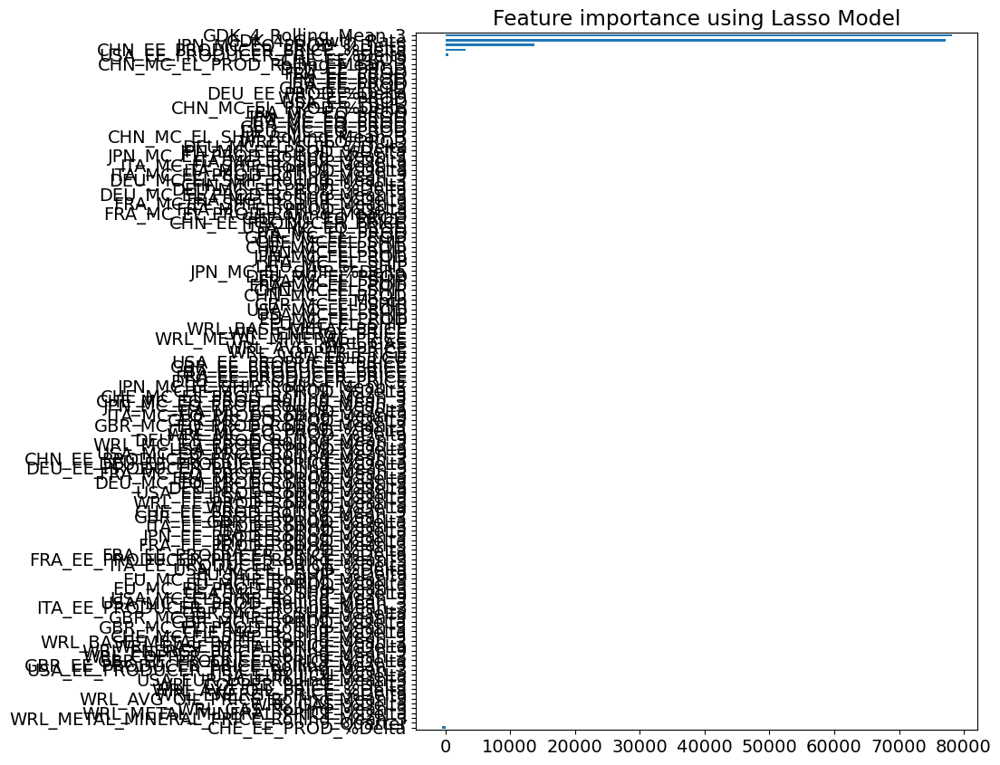

In [110]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data
reg.fit(X_train_GDK_4, y_train_GDK_4)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_4.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [111]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_4, y_train_GDK_4))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_4.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 18623.733755
Best score using built-in LassoCV: 0.768774


GDK_4_Rolling_Mean_3                      78216.045849
GDK_4_Growth_Rate                         77142.506331
JPN_MC_EQ_PROD_%Delta                     13754.968577
CHN_EE_PRODUCER_PRICE_%Delta               3062.212688
CHE_EE_PROD_%Delta                          556.410469
USA_EE_PRODUCER_PRICE_%Delta                431.184618
Quarter                                       0.000000
WRL_GAS_%Delta                                0.000000
WRL_AVG_OIL_PRICE_Rolling_Mean_3              0.000000
WRL_AVG_OIL_PRICE_%Delta                      0.000000
WRL_COPPER_PRICE_Rolling_Mean_3               0.000000
WRL_COPPER_PRICE_%Delta                       0.000000
USA_EE_PRODUCER_PRICE_Rolling_Mean_3          0.000000
USA_EUR_LCU_Rolling_Mean_3                    0.000000
USA_EUR_LCU_%Delta                            0.000000
WRL_METAL_MINERAL_PRICE_%Delta                0.000000
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3          0.000000
GBR_EE_PRODUCER_PRICE_%Delta                  0.000000
ITA_EE_PRO

### Feature Selection GDK 5

In [112]:
# Define train and validation data of 'df_gdk_5', based on the split date
train = df_gdk_5[df_gdk_5.index < split_date]
validation = df_gdk_5[df_gdk_5.index >= split_date]

X_train_GDK_5 = train.drop(['GDK_5'], axis=1) #input features for training (excluding target and date)
y_train_GDK_5 = train['GDK_5'] #target variable for training

X_val_GDK_5 = validation.drop(['GDK_5'], axis=1) #input features for validation
y_val_GDK_5 = validation['GDK_5'] #target variable for validation

In [113]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_5.columns 
X_train_GDK_5[variables_train] = scaler.fit_transform(X_train_GDK_5[variables_train]) #scale using StandardScaler
X_train_GDK_5[variables_train] = imputer.fit_transform(X_train_GDK_5[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_5.columns
X_val_GDK_5[variables_val] = scaler.transform(X_val_GDK_5[variables_val]) #scale using StandardScaler
X_val_GDK_5[variables_val] = imputer.transform(X_val_GDK_5[variables_val]) #input missing values

In [114]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_5, y_train_GDK_5)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_5.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_5[selected_features], y_train_GDK_5, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 16  14   1   1  11   5  92  13  47  35  52  28  21   2  81  36  48 113
   9  88  38 106  91  53  74   8  27  45  86  39  54   1 114  78 117  40
  87 124  41 128  65 132  64 136 135 115 100  31  32   6  23  30  61  75
 125 129  69  25   1  33 104  10  97 118  72  85 111   1  34  37 119   1
 137  60 134 112 110  24  80  82 105  67  59   1 126  12 130   1 133  20
 131  26 127 123 101   4  57  76  49  63  93  17  68  83  70  56  66  73
  29   1   3  71 121  58  96 122 108  15  51  22 109  44 107 116  46 102
 103  95  89  77 120  18  90  19  43  62  55  94  42  84   7  98  99   1
  79  50]
Selected Features:  Index(['GDK_5_Rolling_Mean_3', 'GDK_5_Growth_Rate', 'GBR_EE_PRODUCER_PRICE',
       'FRA_MC_EL_SHIP_Rolling_Mean_3', 'ITA_MC_EL_SHIP_%Delta',
       'JPN_MC_EL_SHIP_%Delta', 'USA_MC_EL_SHIP_%Delta',
       'EU_MC_EL_SHIP_%Delta', 'FRA_EE_PRODUCER_PRICE_%Delta',
       'FRA_EE_PROD_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [-6

In [115]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_5.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_5_Rolling_Mean_3                       True
GDK_5_Growth_Rate                          True
GDK_5_Lag6                                False
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                          

In [116]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_5, y_train_GDK_5)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_5.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

FRA_EE_PROD_%Delta                        0.407013
EU_MC_EL_PROD_%Delta                      0.362729
GDK_5_Growth_Rate                         0.282392
DEU_MC_EL_PROD_%Delta                     0.261144
EU_MC_EL_SHIP_%Delta                      0.257022
FRA_EE_PROD                               0.236039
WRL_MC_EQ_PROD_%Delta                     0.232456
FRA_MC_EQ_PROD_%Delta                     0.212097
DEU_EE_PROD_%Delta                        0.208266
JPN_MC_EQ_PROD_%Delta                     0.176532
FRA_MC_EL_PROD_%Delta                     0.163091
WRL_EE_PROD_%Delta                        0.161377
GBR_EE_PROD_%Delta                        0.152369
GDK_5_Rolling_Mean_3                      0.149421
FRA_MC_EL_SHIP_%Delta                     0.137432
WRL_BASE_METAL_PRICE                      0.135368
DEU_MC_EL_SHIP_%Delta                     0.131859
GBR_MC_EL_PROD_%Delta                     0.130713
USA_MC_EL_PROD_%Delta                     0.130505
JPN_MC_EL_PROD_%Delta          

Lasso picked 21 variables and eliminated the other 125 variables


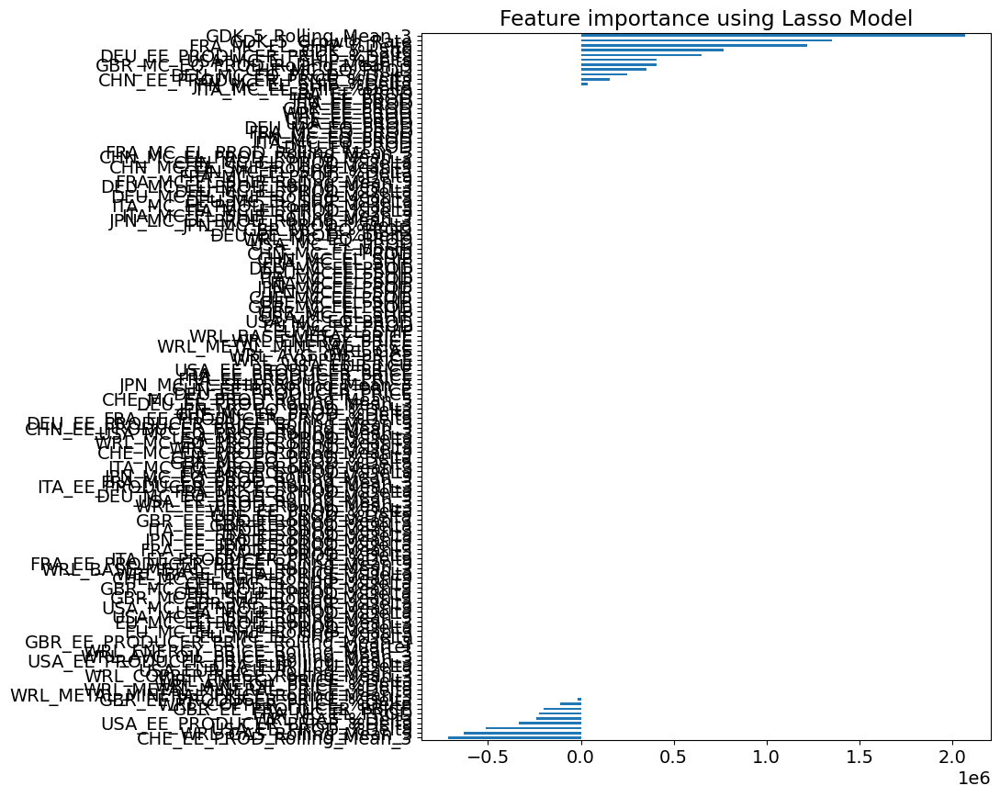

In [117]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data
reg.fit(X_train_GDK_5, y_train_GDK_5)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_5.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [118]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_5, y_train_GDK_5))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_5.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 111032.898071
Best score using built-in LassoCV: 0.902066


GDK_5_Rolling_Mean_3                      2.069932e+06
GDK_5_Growth_Rate                         1.349986e+06
FRA_MC_EL_SHIP_%Delta                     1.219777e+06
GDK_5_Lag6                                7.679398e+05
CHE_EE_PROD_Rolling_Mean_3                7.162736e+05
DEU_EE_PRODUCER_PRICE_%Delta              6.519799e+05
WRL_GAS_Rolling_Mean_3                    6.282819e+05
USA_EE_PROD_%Delta                        5.141514e+05
USA_MC_EL_SHIP_%Delta                     4.085658e+05
GBR_MC_EQ_PROD_Rolling_Mean_3             4.076732e+05
CHE_MC_EQ_PROD                            3.538344e+05
USA_EE_PRODUCER_PRICE_%Delta              3.361211e+05
DEU_MC_EQ_PROD_%Delta                     2.515565e+05
WRL_GAS_%Delta                            2.406771e+05
FRA_MC_EL_PROD                            2.246940e+05
GBR_EE_PRODUCER_PRICE                     1.989259e+05
CHN_EE_PRODUCER_PRICE_%Delta              1.531813e+05
WRL_COPPER_PRICE_%Delta                   1.104969e+05
JPN_MC_EL_

### Feature Selection GDK 6

In [119]:
# Define train and validation data of 'df_gdk_6', based on the split date
train = df_gdk_6[df_gdk_6.index < split_date]
validation = df_gdk_6[df_gdk_6.index >= split_date]

X_train_GDK_6 = train.drop(['GDK_6'], axis=1) #input features for training (excluding target and date)
y_train_GDK_6 = train['GDK_6'] #target variable for training

X_val_GDK_6 = validation.drop(['GDK_6'], axis=1) #input features for validation
y_val_GDK_6 = validation['GDK_6'] #target variable for validation

In [120]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_6.columns
X_train_GDK_6[variables_train] = scaler.fit_transform(X_train_GDK_6[variables_train]) #scale using StandardScaler
X_train_GDK_6[variables_train] = imputer.fit_transform(X_train_GDK_6[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_6.columns
X_val_GDK_6[variables_val] = scaler.transform(X_val_GDK_6[variables_val]) #scale using StandardScaler
X_val_GDK_6[variables_val] = imputer.transform(X_val_GDK_6[variables_val]) #input missing values

In [121]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_6, y_train_GDK_6)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_6.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_6[selected_features], y_train_GDK_6, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [  7   6   1   1   9 108  11  24  28   5  34  63   1 115  13  79  55   4
  35   3  92 121  32  31 129   2  90  86  42  67  52  14  96  81  41 103
  83 116  91 118 119  53  60   1  40  30  74  50 127   1   1  20   1 135
 124  72  48  19  99 109   1  69  93  77  71   1  10  58  36  85 131  21
   8 104  27 112  89 120  51  18  39  98  54 117  22 107  70  17  15 128
  49 126  57  78  37  59  46 105 114  26  16  97  45 102  62 133  65 132
  25 130  68 122  76 134  82 136  84  66  88 101  44  64  43 110  23  61
  95  73  87 123  56  12 125  38  29 106  47  94  75  80 111 100  33 113
   1]
Selected Features:  Index(['GDK_6_Rolling_Mean_3', 'GDK_6_Growth_Rate', 'JPN_MC_EL_PROD',
       'USA_EE_PROD', 'FRA_EE_PROD', 'DEU_EE_PROD', 'CHN_MC_EL_PROD_%Delta',
       'DEU_MC_EL_PROD_%Delta', 'ITA_MC_EL_SHIP_Rolling_Mean_3',
       'DEU_EE_PROD_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [-6.96406020e+10 -6.62825498e+10 -1.91568775e+10 -9.05443

In [122]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_6.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_6_Rolling_Mean_3                       True
GDK_6_Growth_Rate                          True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                             True
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                            False
EU_MC_EL_PROD                           

In [123]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_6, y_train_GDK_6)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_6.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

FRA_EE_PRODUCER_PRICE_Rolling_Mean_3      0.330451
DEU_EE_PROD_%Delta                        0.299958
WRL_GAS                                   0.290306
WRL_ENERGY_PRICE_Rolling_Mean_3           0.266476
DEU_EE_PROD                               0.251081
FRA_EE_PRODUCER_PRICE                     0.236394
WRL_BASE_METAL_PRICE_Rolling_Mean_3       0.232955
WRL_METAL_MINERAL_PRICE_Rolling_Mean_3    0.221941
USA_EE_PRODUCER_PRICE                     0.214336
USA_EE_PRODUCER_PRICE_Rolling_Mean_3      0.197023
WRL_COPPER_PRICE_Rolling_Mean_3           0.195894
WRL_GAS_Rolling_Mean_3                    0.180337
CHE_MC_EL_PROD                            0.173443
CHE_MC_EL_SHIP_%Delta                     0.172160
CHE_MC_EL_SHIP                            0.171817
DEU_EE_PRODUCER_PRICE_Rolling_Mean_3      0.169093
WRL_AVG_OIL_PRICE_Rolling_Mean_3          0.166828
WRL_MC_EQ_PROD                            0.166699
GDK_6_Growth_Rate                         0.163779
CHE_MC_EQ_PROD_Rolling_Mean_3  

Lasso picked 6 variables and eliminated the other 139 variables


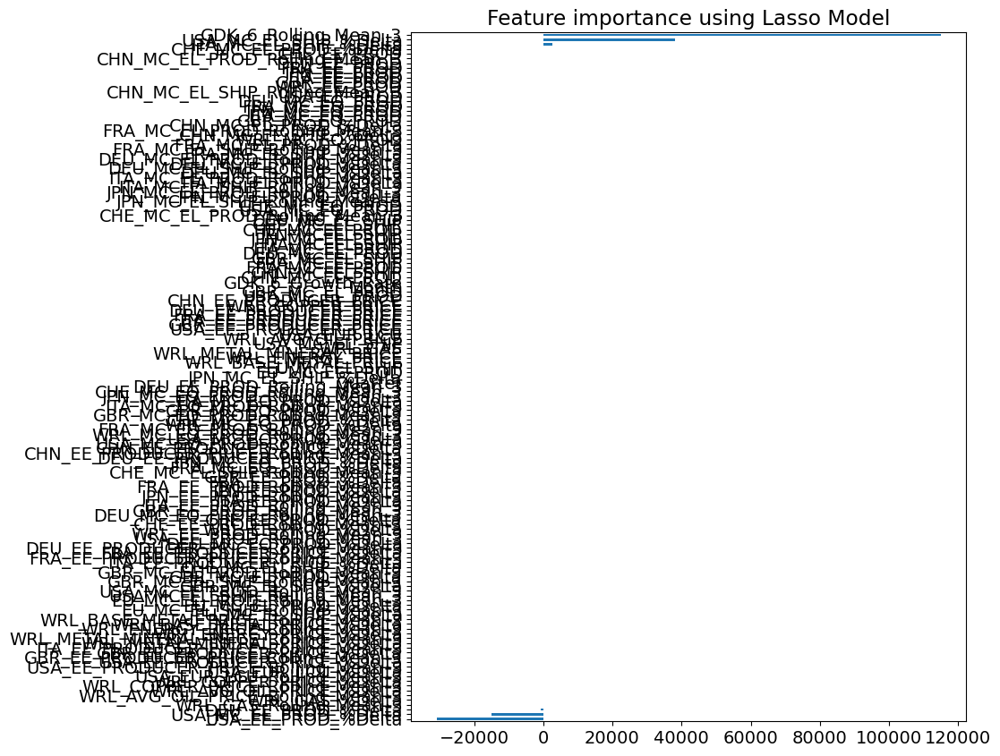

In [124]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data  
reg.fit(X_train_GDK_6, y_train_GDK_6)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_6.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [125]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_6, y_train_GDK_6))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_6.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 31920.978530
Best score using built-in LassoCV: 0.493783


GDK_6_Rolling_Mean_3                      115083.683501
USA_MC_EL_SHIP_%Delta                      38013.201081
USA_EE_PROD_%Delta                         30839.568258
USA_MC_EL_PROD_%Delta                      14954.854175
ITA_MC_EL_SHIP_%Delta                       2631.620729
DEU_EE_PROD_%Delta                           717.007737
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3           0.000000
GBR_EE_PRODUCER_PRICE_%Delta                   0.000000
ITA_EE_PRODUCER_PRICE_Rolling_Mean_3           0.000000
USA_EE_PRODUCER_PRICE_%Delta                   0.000000
WRL_METAL_MINERAL_PRICE_%Delta                 0.000000
USA_EE_PRODUCER_PRICE_Rolling_Mean_3           0.000000
USA_EUR_LCU_%Delta                             0.000000
USA_EUR_LCU_Rolling_Mean_3                     0.000000
WRL_COPPER_PRICE_%Delta                        0.000000
WRL_COPPER_PRICE_Rolling_Mean_3                0.000000
ITA_EE_PRODUCER_PRICE_%Delta                   0.000000
WRL_AVG_OIL_PRICE_%Delta                       0

### Feature Selection GDK 8

In [126]:
# Define train and validation data of 'df_gdk_8', based on the split date
train = df_gdk_8[df_gdk_8.index < split_date]
validation = df_gdk_8[df_gdk_8.index >= split_date]

X_train_GDK_8 = train.drop(['GDK_8'], axis=1) #input features for training (excluding target and date)
y_train_GDK_8 = train['GDK_8'] #target variable for training

X_val_GDK_8 = validation.drop(['GDK_8'], axis=1) #input features for validation
y_val_GDK_8 = validation['GDK_8'] #target variable for validation

In [127]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_8.columns
X_train_GDK_8[variables_train] = scaler.fit_transform(X_train_GDK_8[variables_train]) #scale using StandardScaler
X_train_GDK_8[variables_train] = imputer.fit_transform(X_train_GDK_8[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_8.columns
X_val_GDK_8[variables_val] = scaler.transform(X_val_GDK_8[variables_val]) #scale using StandardScaler
X_val_GDK_8[variables_val] = imputer.transform(X_val_GDK_8[variables_val]) #input missing values

In [128]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_8, y_train_GDK_8)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_8.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_8[selected_features], y_train_GDK_8, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 16  11   1   1   9   1  20 102   2  10   4  83  49  47  25  90  13  80
  36  64  14   1  37   8  18  23  76  12  74  30  81  15  38 136  72  97
 131  26  69 138 117  75 121   7 134  40  65  46   5  54  33  89  71  35
  22 105 110   1  39 120  66  51  91  44  31  53  43  28   1  63 135   3
 127  85  42 130 132  57   1 137  78 118  62 109  61 115 103 116  99  73
  19 124  29  41  67  93   1  94  17  77  27  79   6 122   1  48  55 125
  52  98  88 114  70 133  24  56  86  92 108 106 112   1  58 129 126 123
  50 119 104 100  21 113  82  95 101  59  87  32  84 107  96  68  45 111
  34 128  60]
Selected Features:  Index(['GDK_8_Rolling_Mean_3', 'GDK_8_Growth_Rate', 'GDK_8_Lag3',
       'USA_MC_EL_SHIP', 'FRA_MC_EL_PROD_Rolling_Mean_3',
       'ITA_MC_EL_SHIP_%Delta', 'GBR_MC_EL_PROD_%Delta', 'WRL_GAS_%Delta',
       'USA_EE_PRODUCER_PRICE_%Delta', 'GBR_MC_EQ_PROD_Rolling_Mean_3'],
      dtype='object')
Cross-validation scores (with selected features):  [-8.99086879e+10 -2

In [129]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_8.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_8_Rolling_Mean_3                       True
GDK_8_Growth_Rate                          True
GDK_8_Lag2                                False
GDK_8_Lag3                                 True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                          

In [130]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_8, y_train_GDK_8)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_8.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_8_Rolling_Mean_3                      0.534605
GDK_8_Growth_Rate                         0.346892
USA_MC_EL_SHIP_Rolling_Mean_3             0.337523
WRL_COPPER_PRICE                          0.317126
DEU_EE_PRODUCER_PRICE_Rolling_Mean_3      0.274658
FRA_EE_PRODUCER_PRICE                     0.274370
DEU_EE_PRODUCER_PRICE                     0.270502
USA_EE_PRODUCER_PRICE_Rolling_Mean_3      0.260522
CHE_MC_EL_PROD_Rolling_Mean_3             0.256109
USA_EE_PRODUCER_PRICE_%Delta              0.229633
GBR_EE_PRODUCER_PRICE_%Delta              0.227017
WRL_COPPER_PRICE_Rolling_Mean_3           0.224662
FRA_EE_PROD_%Delta                        0.223670
USA_MC_EL_SHIP_%Delta                     0.217798
ITA_MC_EL_PROD_Rolling_Mean_3             0.216409
USA_EE_PRODUCER_PRICE                     0.214320
CHN_MC_EL_PROD_Rolling_Mean_3             0.213841
CHN_MC_EL_SHIP_Rolling_Mean_3             0.213841
CHE_MC_EQ_PROD_Rolling_Mean_3             0.210371
JPN_MC_EL_PROD_%Delta          

Lasso picked 14 variables and eliminated the other 133 variables


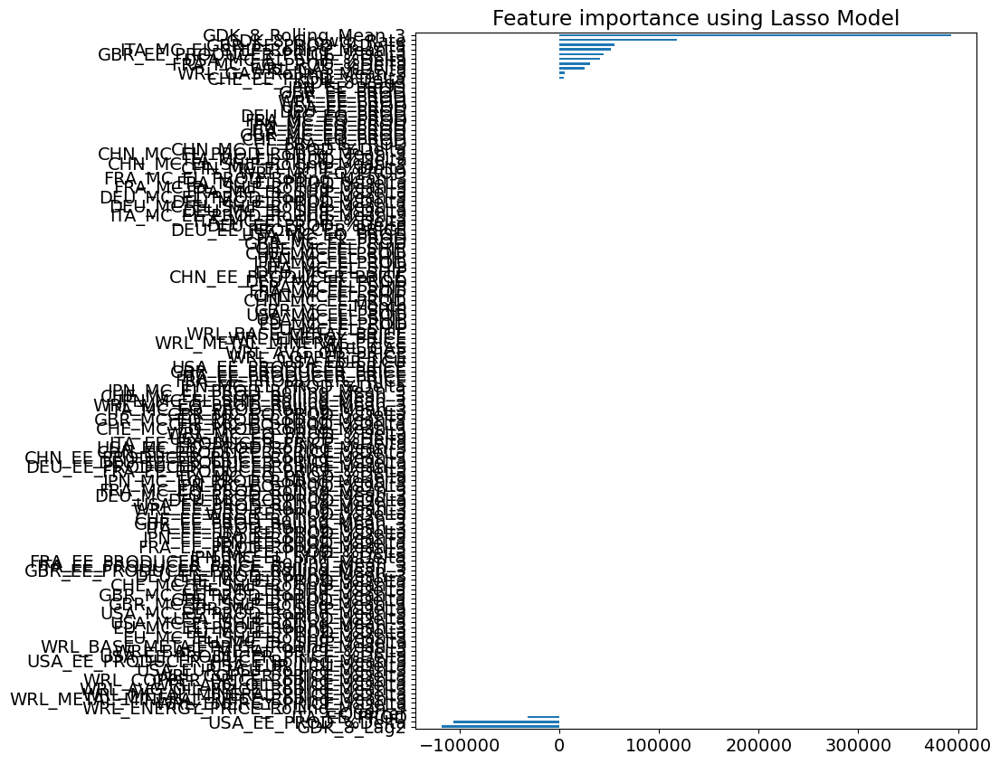

In [131]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data  
reg.fit(X_train_GDK_8, y_train_GDK_8)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_8.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [132]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_8, y_train_GDK_8))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_8.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 22780.370225
Best score using built-in LassoCV: 0.907530


GDK_8_Rolling_Mean_3                      393442.595838
GDK_8_Lag2                                118517.856732
GDK_8_Growth_Rate                         117679.920990
USA_EE_PROD_%Delta                        106565.618766
GBR_EE_PROD_%Delta                         55312.018034
ITA_MC_EL_SHIP_Rolling_Mean_3              51242.562466
GBR_EE_PRODUCER_PRICE_%Delta               44417.858354
USA_MC_EL_SHIP_%Delta                      40435.726535
ITA_EE_PROD                                31543.476498
FRA_MC_EQ_PROD_%Delta                      31184.438106
WRL_GAS_%Delta                             25675.391480
WRL_GAS_Rolling_Mean_3                      5647.005590
CHE_EE_PROD_%Delta                          4192.459893
GDK_8_Lag3                                   305.650696
USA_EE_PRODUCER_PRICE_Rolling_Mean_3           0.000000
WRL_METAL_MINERAL_PRICE_%Delta                 0.000000
USA_EE_PRODUCER_PRICE_%Delta                   0.000000
USA_EUR_LCU_%Delta                             0

### Feature Selection GDK 9

In [133]:
# Define train and validation data of 'df_gdk_9', based on the split date
train = df_gdk_9[df_gdk_9.index < split_date]
validation = df_gdk_9[df_gdk_9.index >= split_date]

X_train_GDK_9 = train.drop(['GDK_9'], axis=1) #input features for training (excluding target and date)
y_train_GDK_9 = train['GDK_9'] #target variable for training

X_val_GDK_9 = validation.drop(['GDK_9'], axis=1) #input features for validation
y_val_GDK_9 = validation['GDK_9']  #target variable for validation

In [134]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_9.columns
X_train_GDK_9[variables_train] = scaler.fit_transform(X_train_GDK_9[variables_train]) #scale using StandardScaler
X_train_GDK_9[variables_train] = imputer.fit_transform(X_train_GDK_9[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_9.columns
X_val_GDK_9[variables_val] = scaler.transform(X_val_GDK_9[variables_val]) #scale using StandardScaler
X_val_GDK_9[variables_val] = imputer.transform(X_val_GDK_9[variables_val]) #input missing values

In [135]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_9, y_train_GDK_9)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_9.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_9[selected_features], y_train_GDK_9, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 10  21   1   1  30  12  93   1  11   1  16   2  22  63   1   5  91  57
  60  35   1  31  77  54  62  59  48  36 127  37   3  33 120  25  84  64
  61  79 114  14  49  26  53  67  23 121   4  19 108  86  69  27  55  65
 129 130  20 135 137  68   1   7 100  44 106   9 109  87  17  34 123 131
  85  73 111 119  78  13 122  76  75  83 110  51 105  90 128 126 118  38
 113   1  99  43  98  82 112 116 117  24  89  39  72   1  96   6 101  29
  46   8  40  28  70  32 132  15 134 136 133 115  94  58 102 103  74 124
 125  47  45  52 107  42  95  88  80  92   1  66  81  50 104  41  71  97
  56  18]
Selected Features:  Index(['GDK_9_Rolling_Mean_3', 'GDK_9_Growth_Rate', 'FRA_MC_EL_PROD',
       'DEU_MC_EL_PROD', 'JPN_MC_EL_SHIP', 'USA_MC_EL_SHIP',
       'DEU_MC_EL_PROD_Rolling_Mean_3', 'WRL_ENERGY_PRICE_%Delta',
       'USA_EE_PRODUCER_PRICE_%Delta', 'GBR_EE_PROD_Rolling_Mean_3'],
      dtype='object')
Cross-validation scores (with selected features):  [-4.77812104e+07 -3.0087151

In [136]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_9.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_9_Rolling_Mean_3                       True
GDK_9_Growth_Rate                          True
GDK_9_Lag11                               False
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                             True
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                             True
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                             True
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                          

In [137]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_9, y_train_GDK_9)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_9.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_9_Rolling_Mean_3                      0.352006
WRL_EE_PROD_Rolling_Mean_3                0.226397
ITA_EE_PRODUCER_PRICE_%Delta              0.201983
GBR_MC_EL_PROD_%Delta                     0.191014
WRL_EE_PROD                               0.168054
DEU_EE_PRODUCER_PRICE_%Delta              0.163374
USA_EE_PROD                               0.154553
GBR_EE_PROD_Rolling_Mean_3                0.152929
DEU_MC_EQ_PROD_Rolling_Mean_3             0.144538
DEU_MC_EL_PROD_Rolling_Mean_3             0.142312
DEU_EE_PROD                               0.139910
USA_MC_EL_SHIP_%Delta                     0.134057
DEU_MC_EL_PROD_%Delta                     0.129454
ITA_MC_EL_SHIP_Rolling_Mean_3             0.129076
WRL_MC_EQ_PROD_%Delta                     0.122462
JPN_MC_EL_SHIP                            0.104931
EU_MC_EL_PROD                             0.098945
EU_MC_EL_SHIP                             0.098421
ITA_MC_EL_SHIP                            0.097547
FRA_MC_EL_SHIP_Rolling_Mean_3  

Lasso picked 6 variables and eliminated the other 140 variables


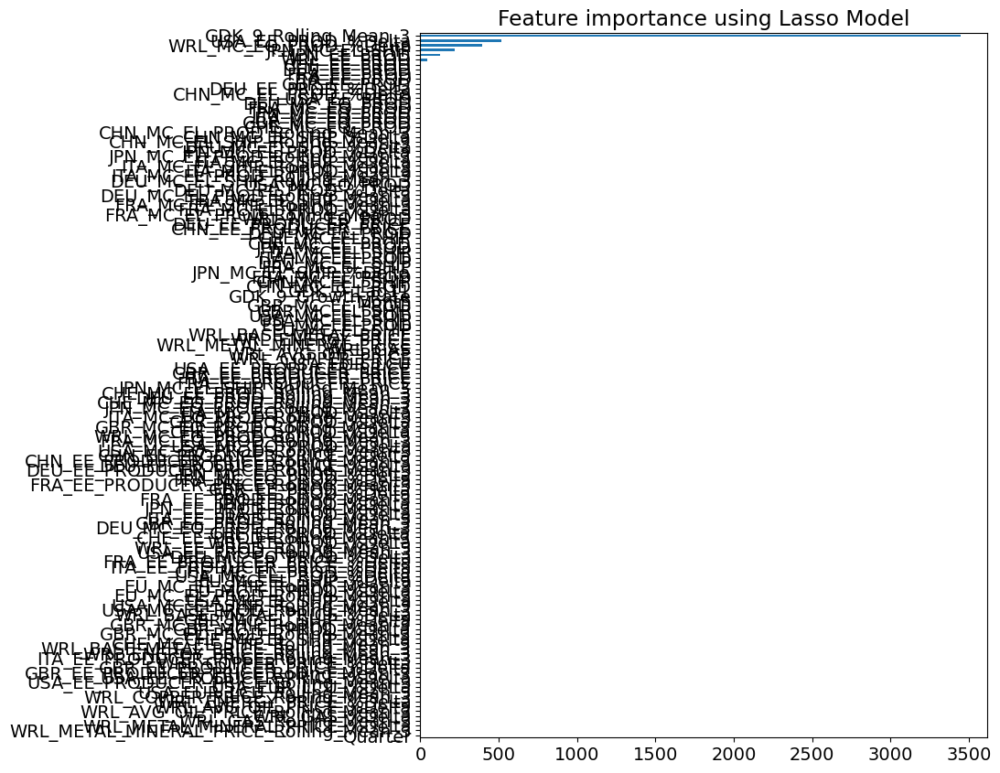

In [138]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data
reg.fit(X_train_GDK_9, y_train_GDK_9)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_9.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [139]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_9, y_train_GDK_9))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_9.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 1191.922538
Best score using built-in LassoCV: 0.456577


GDK_9_Rolling_Mean_3                      3447.663675
USA_EE_PROD_%Delta                         516.762415
WRL_MC_EQ_PROD_%Delta                      392.317821
JPN_MC_EL_SHIP                             221.484081
JPN_EE_PROD                                125.196054
WRL_EE_PROD                                 43.456143
Quarter                                      0.000000
WRL_COPPER_PRICE_%Delta                      0.000000
WRL_GAS_%Delta                               0.000000
WRL_AVG_OIL_PRICE_Rolling_Mean_3             0.000000
WRL_AVG_OIL_PRICE_%Delta                     0.000000
WRL_COPPER_PRICE_Rolling_Mean_3              0.000000
USA_EUR_LCU_%Delta                           0.000000
USA_EUR_LCU_Rolling_Mean_3                   0.000000
WRL_METAL_MINERAL_PRICE_%Delta               0.000000
USA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
USA_EE_PRODUCER_PRICE_%Delta                 0.000000
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
GBR_EE_PRODUCER_PRICE_%Delta

### Feature Selection GDK 11

In [140]:
# Define train and validation data of 'df_gdk_11', based on the split date
train = df_gdk_11[df_gdk_11.index < split_date]
validation = df_gdk_11[df_gdk_11.index >= split_date]

X_train_GDK_11 = train.drop(['GDK_11'], axis=1) #input features for training (excluding target and date)
y_train_GDK_11 = train['GDK_11'] #target variable for training

X_val_GDK_11 = validation.drop(['GDK_11'], axis=1) #input features for validation
y_val_GDK_11 = validation['GDK_11'] #target variable for validation

In [141]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_11.columns
X_train_GDK_11[variables_train] = scaler.fit_transform(X_train_GDK_11[variables_train]) #scale using StandardScaler
X_train_GDK_11[variables_train] = imputer.fit_transform(X_train_GDK_11[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_11.columns
X_val_GDK_11[variables_val] = scaler.transform(X_val_GDK_11[variables_val]) #scale using StandardScaler
X_val_GDK_11[variables_val] = imputer.transform(X_val_GDK_11[variables_val]) #input missing values

In [142]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_11, y_train_GDK_11)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_11.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_11[selected_features], y_train_GDK_11, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 12   9   1   1  30 106  69  33   2  18  11  17  67  40   6  48  89  31
  59   4  95 109  55  52  54   7  94 113  19  35  45   5  26  90  29  15
  73 101   8  72 129  66  97  80 114 115  22  83  98  27  96  50  57 125
 126   1   1   1  21  13 120 123 124  60  10  41  56  76  62 131  78  14
  20 111  42  25  85 118  23 121  75  68  49 130 132  74 134  46  34 119
  61  51 105 102  16 133  64  58   1  81  79  36  84 103  91   1  92  39
   3 107  70 110 122 108  32 136 135  63   1 128  71  77 116 117  47  53
   1  44  99 104  24  93 100  37  65  88  82  28   1  87  38 112  86 127
  43]
Selected Features:  Index(['GDK_11_Rolling_Mean_3', 'GDK_11_Growth_Rate',
       'FRA_MC_EL_PROD_Rolling_Mean_3', 'FRA_MC_EL_PROD_%Delta',
       'FRA_MC_EL_SHIP_Rolling_Mean_3', 'WRL_COPPER_PRICE_%Delta',
       'ITA_EE_PRODUCER_PRICE_Rolling_Mean_3', 'CHE_MC_EQ_PROD_%Delta',
       'FRA_MC_EQ_PROD_%Delta', 'ITA_EE_PROD_%Delta'],
      dtype='object')
Cross-validation scores (with selecte

In [143]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_11.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_11_Rolling_Mean_3                      True
GDK_11_Growth_Rate                         True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                            False
EU_MC_EL_PROD                           

In [144]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_11, y_train_GDK_11)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_11.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

WRL_EE_PROD_%Delta                        0.321407
FRA_MC_EL_SHIP_Rolling_Mean_3             0.263175
ITA_MC_EQ_PROD_%Delta                     0.252673
ITA_MC_EL_PROD_%Delta                     0.241789
DEU_MC_EL_SHIP                            0.211771
EU_MC_EL_SHIP_Rolling_Mean_3              0.200343
FRA_EE_PROD_%Delta                        0.182618
GDK_11_Rolling_Mean_3                     0.172989
JPN_EE_PROD_%Delta                        0.153139
WRL_MC_EQ_PROD_%Delta                     0.142163
JPN_MC_EQ_PROD_%Delta                     0.136698
CHE_MC_EL_PROD_%Delta                     0.126017
GBR_EE_PROD_%Delta                        0.123311
DEU_MC_EQ_PROD                            0.119071
GBR_MC_EL_PROD_%Delta                     0.116722
CHE_MC_EL_SHIP_%Delta                     0.116301
JPN_MC_EL_PROD_%Delta                     0.116030
GBR_MC_EQ_PROD_%Delta                     0.111570
FRA_EE_PROD_Rolling_Mean_3                0.110690
DEU_MC_EL_PROD                 

Lasso picked 13 variables and eliminated the other 132 variables


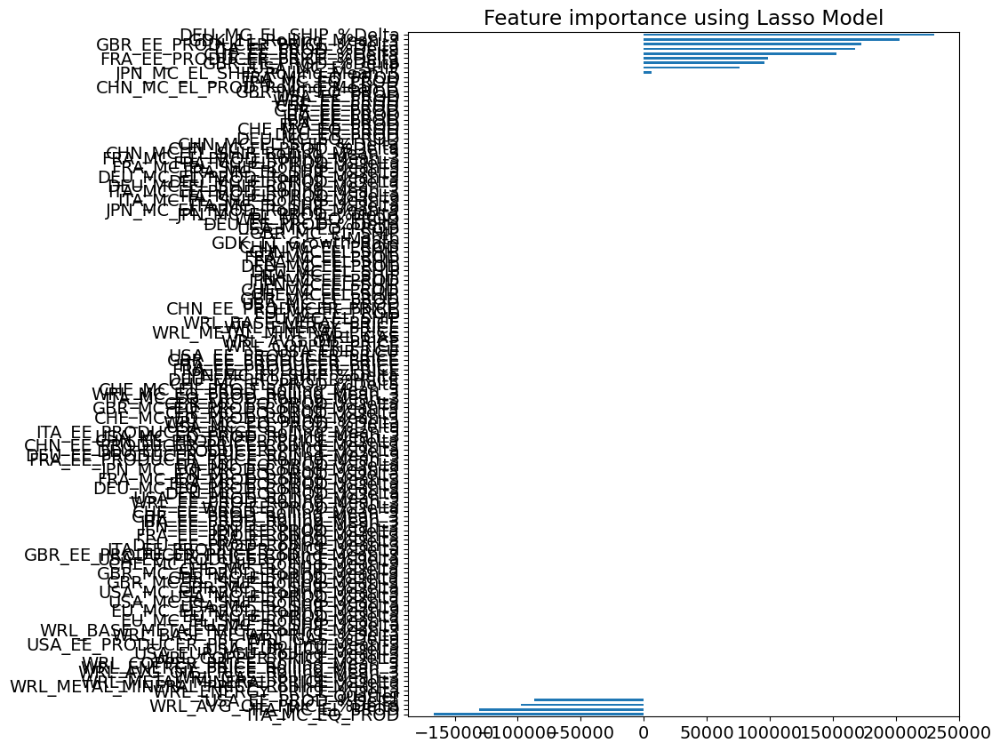

In [145]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data
reg.fit(X_train_GDK_11, y_train_GDK_11)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_11.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [146]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_11, y_train_GDK_11))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_11.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 80963.094157
Best score using built-in LassoCV: 0.640945


DEU_MC_EL_SHIP_%Delta                     230735.189601
GDK_11_Rolling_Mean_3                     203283.608198
GBR_EE_PRODUCER_PRICE_%Delta              172353.909589
ITA_EE_PROD_%Delta                        168076.466488
ITA_MC_EQ_PROD                            166847.246578
CHE_EE_PROD_%Delta                        152763.009854
ITA_MC_EL_PROD                            130564.877911
FRA_EE_PRODUCER_PRICE_%Delta               98650.719112
WRL_AVG_OIL_PRICE_%Delta                   97352.232162
GBR_EE_PROD_%Delta                         95812.351268
USA_EE_PROD_%Delta                         87217.559300
USA_MC_EL_SHIP                             75973.543641
JPN_MC_EL_SHIP_Rolling_Mean_3               5936.918664
WRL_AVG_OIL_PRICE_Rolling_Mean_3               0.000000
WRL_COPPER_PRICE_Rolling_Mean_3                0.000000
WRL_COPPER_PRICE_%Delta                        0.000000
USA_EE_PRODUCER_PRICE_%Delta                   0.000000
USA_EUR_LCU_Rolling_Mean_3                     0

### Feature Selection GDK 12

In [147]:
# Define train and validation data of 'df_gdk_12', based on the split date
train = df_gdk_12[df_gdk_12.index < split_date]
validation = df_gdk_12[df_gdk_12.index >= split_date]

X_train_GDK_12 = train.drop(['GDK_12'], axis=1) #input features for training (excluding target and date)
y_train_GDK_12 = train['GDK_12']  #target variable for training

X_val_GDK_12 = validation.drop(['GDK_12'], axis=1) #input features for validation
y_val_GDK_12 = validation['GDK_12'] #target variable for validation

In [148]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_12.columns
X_train_GDK_12[variables_train] = scaler.fit_transform(X_train_GDK_12[variables_train])  #scale using StandardScaler
X_train_GDK_12[variables_train] = imputer.fit_transform(X_train_GDK_12[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_12.columns
X_val_GDK_12[variables_val] = scaler.transform(X_val_GDK_12[variables_val])  #scale using StandardScaler
X_val_GDK_12[variables_val] = imputer.transform(X_val_GDK_12[variables_val]) #input missing values

In [149]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_12, y_train_GDK_12)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_12.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_12[selected_features], y_train_GDK_12, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 11  17   1   1  10  28   1  14  99   1  24  68  47  62  42  18  93  38
  16  67 116  55  27  86 123  29  25  39 128  91  90  48  35  61 129 131
 122  87 137  41   4  26 101  77  70  54  97  76  49   1  53   9  15  84
  43   2 105 118  65   1  92  51  82  21  73  12 120   8 124  22  72  59
  85  66 130 134 135 136 132  33 133 113 115  44  88   1  83 100 121   5
 107  13  20  40 110  57 114  56  36  64 102 103  30   1  32  37  63  78
   1  74  23  81  69  34  52 138 139  50  95 117 125   7  80 126 119 111
 127  46  31  79 109 106 112   3 104 108  94  71   1  45   6  89  19  96
  98  75  58  60]
Selected Features:  Index(['GDK_12_Rolling_Mean_3', 'GDK_12_Growth_Rate', 'GDK_12_Lag3',
       'FRA_MC_EL_PROD', 'GBR_EE_PROD', 'FRA_MC_EL_PROD_%Delta',
       'USA_MC_EL_SHIP_%Delta', 'USA_EUR_LCU_%Delta',
       'ITA_EE_PRODUCER_PRICE_Rolling_Mean_3', 'GBR_EE_PROD_Rolling_Mean_3'],
      dtype='object')
Cross-validation scores (with selected features):  [-4.01792093e+10 -1.1

In [150]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_12.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_12_Rolling_Mean_3                      True
GDK_12_Growth_Rate                         True
GDK_12_Lag1                               False
GDK_12_Lag2                               False
GDK_12_Lag3                                True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                             True
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                          

In [151]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_12, y_train_GDK_12)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_12.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_12_Rolling_Mean_3                     0.785906
DEU_EE_PRODUCER_PRICE_Rolling_Mean_3      0.603676
DEU_EE_PRODUCER_PRICE                     0.492132
USA_EE_PROD_Rolling_Mean_3                0.449862
WRL_BASE_METAL_PRICE_Rolling_Mean_3       0.430431
USA_MC_EL_PROD_Rolling_Mean_3             0.430421
USA_EUR_LCU_Rolling_Mean_3                0.423704
GBR_MC_EQ_PROD_Rolling_Mean_3             0.407057
GDK_12_Lag3                               0.401922
CHE_MC_EL_SHIP_Rolling_Mean_3             0.346265
FRA_MC_EQ_PROD_Rolling_Mean_3             0.342187
GBR_EE_PROD_Rolling_Mean_3                0.339660
CHN_EE_PRODUCER_PRICE_Rolling_Mean_3      0.338480
USA_MC_EQ_PROD_Rolling_Mean_3             0.334530
FRA_MC_EL_PROD_Rolling_Mean_3             0.333740
CHE_MC_EL_PROD_Rolling_Mean_3             0.323990
USA_EE_PRODUCER_PRICE_%Delta              0.322323
WRL_ENERGY_PRICE_Rolling_Mean_3           0.316395
DEU_MC_EQ_PROD_Rolling_Mean_3             0.313266
ITA_EE_PROD_Rolling_Mean_3     

Lasso picked 24 variables and eliminated the other 124 variables


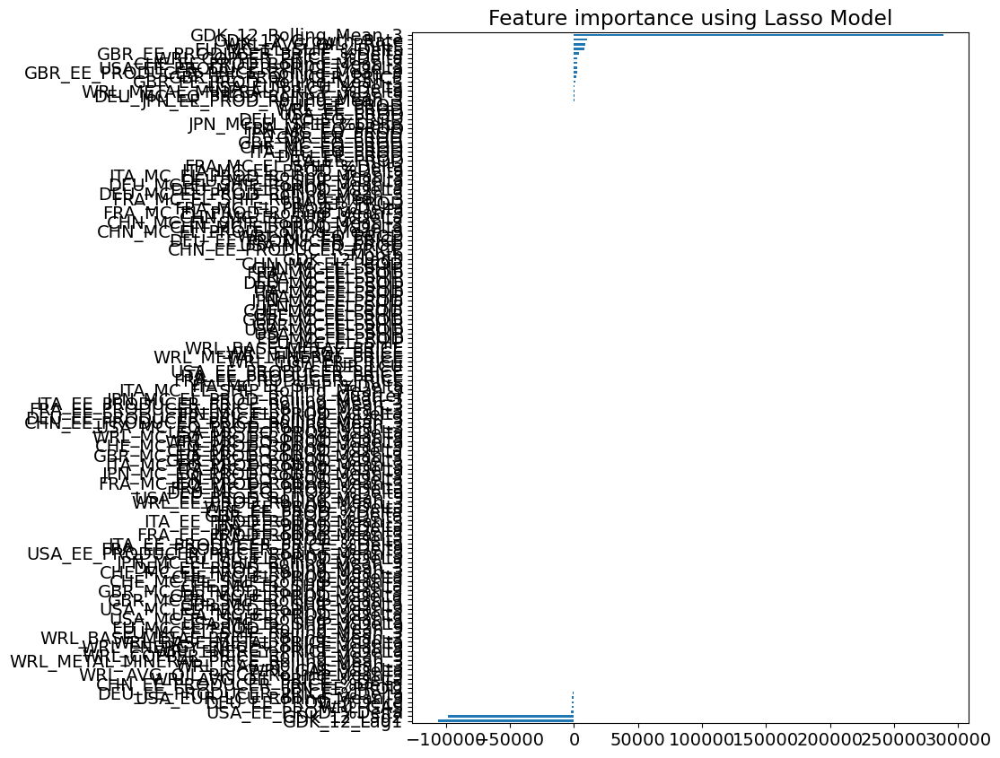

In [152]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data
reg.fit(X_train_GDK_12, y_train_GDK_12)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_12.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [153]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_12, y_train_GDK_12))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_12.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 742.092515
Best score using built-in LassoCV: 0.995913


GDK_12_Rolling_Mean_3                     288690.846759
GDK_12_Lag1                               106413.556012
GDK_12_Lag2                                98421.158724
GDK_12_Growth_Rate                         10134.359241
WRL_AVG_OIL_PRICE                           8989.107467
EU_MC_EL_SHIP_%Delta                        8119.336860
GBR_EE_PRODUCER_PRICE_%Delta                3929.239323
WRL_COPPER_PRICE_%Delta                     2825.221901
CHE_EE_PROD_Rolling_Mean_3                  2787.723030
USA_EE_PRODUCER_PRICE_%Delta                2575.706394
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3        2565.882440
USA_EE_PROD_%Delta                          2117.472394
WRL_GAS                                     2066.129599
DEU_EE_PROD_%Delta                          1715.153099
USA_EUR_LCU_Rolling_Mean_3                  1561.046026
GBR_EE_PRODUCER_PRICE                       1456.014611
DEU_EE_PRODUCER_PRICE_%Delta                1132.037610
GBR_EE_PROD_Rolling_Mean_3                   946

### Feature Selection GDK 13

In [154]:
# Define train and validation data of 'df_gdk_13', based on the split date
train = df_gdk_13[df_gdk_13.index < split_date]
validation = df_gdk_13[df_gdk_13.index >= split_date]

X_train_GDK_13 = train.drop(['GDK_13'], axis=1) #input features for training (excluding target and date)
y_train_GDK_13 = train['GDK_13'] #target variable for training

X_val_GDK_13 = validation.drop(['GDK_13'], axis=1) #input features for validation
y_val_GDK_13 = validation['GDK_13'] #target variable for validation

In [155]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_13.columns
X_train_GDK_13[variables_train] = scaler.fit_transform(X_train_GDK_13[variables_train]) #scale using StandardScaler
X_train_GDK_13[variables_train] = imputer.fit_transform(X_train_GDK_13[variables_train])  #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_13.columns
X_val_GDK_13[variables_val] = scaler.transform(X_val_GDK_13[variables_val]) #scale using StandardScaler
X_val_GDK_13[variables_val] = imputer.transform(X_val_GDK_13[variables_val])  #input missing values

In [156]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_13, y_train_GDK_13)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_13.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_13[selected_features], y_train_GDK_13, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance

print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [  9  26   4   1  22 108  11  49  25  60  27  72  64  80 102  16 100   1
  18   1  15  88   5  41  94 107  67 118  71   1  33  85 105  91 115  76
  78  55  81   1  96  93  66   2 130   1  35 106  28  36  48  31  50 125
 127  45  34 135  51  86  23 103  95  21  46  92  13  42  68  70  47  62
  59  56 133  24  44 136  84  97  63  77  32 113  52 123  12 116  65  82
  29  73 131 114  30 132  40 101   6  89 134 104  75   1  79  98  43   3
   1   7  99 121   1 126  53  57  61 110  83  17 128 119  74 129  58   8
 120  90 124 122  19  39  38  20 117  37  14  10  87  54 109 111 112  69
   1]
Selected Features:  Index(['GDK_13_Growth_Rate', 'GBR_MC_EL_SHIP', 'USA_MC_EL_SHIP',
       'USA_EE_PRODUCER_PRICE', 'ITA_MC_EQ_PROD', 'CHE_EE_PROD',
       'GBR_EE_PRODUCER_PRICE_Rolling_Mean_3', 'FRA_EE_PRODUCER_PRICE_%Delta',
       'CHN_EE_PRODUCER_PRICE_%Delta', 'DEU_EE_PROD_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [-4.88043604e+08 -1.74592020

In [157]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_13.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_13_Rolling_Mean_3                     False
GDK_13_Growth_Rate                         True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                             True
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                             True
EU_MC_EL_PROD                           

In [158]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_13, y_train_GDK_13)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_13.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

ITA_MC_EL_PROD_Rolling_Mean_3             0.315373
ITA_MC_EQ_PROD_Rolling_Mean_3             0.212484
ITA_EE_PRODUCER_PRICE_%Delta              0.210825
JPN_MC_EL_SHIP                            0.203760
ITA_EE_PROD_Rolling_Mean_3                0.190857
GBR_MC_EL_PROD_Rolling_Mean_3             0.176478
JPN_MC_EL_PROD                            0.172083
USA_MC_EQ_PROD_Rolling_Mean_3             0.162570
ITA_MC_EL_PROD_%Delta                     0.145179
GBR_EE_PROD_Rolling_Mean_3                0.142060
JPN_MC_EQ_PROD                            0.132629
CHN_EE_PRODUCER_PRICE_%Delta              0.128700
ITA_MC_EQ_PROD_%Delta                     0.123459
GBR_MC_EQ_PROD                            0.122654
USA_MC_EL_PROD_Rolling_Mean_3             0.121680
USA_MC_EL_PROD                            0.121429
CHE_EE_PROD                               0.121347
DEU_EE_PROD_Rolling_Mean_3                0.120592
GDK_13_Growth_Rate                        0.116499
JPN_MC_EL_PROD_Rolling_Mean_3  

Lasso picked 4 variables and eliminated the other 141 variables


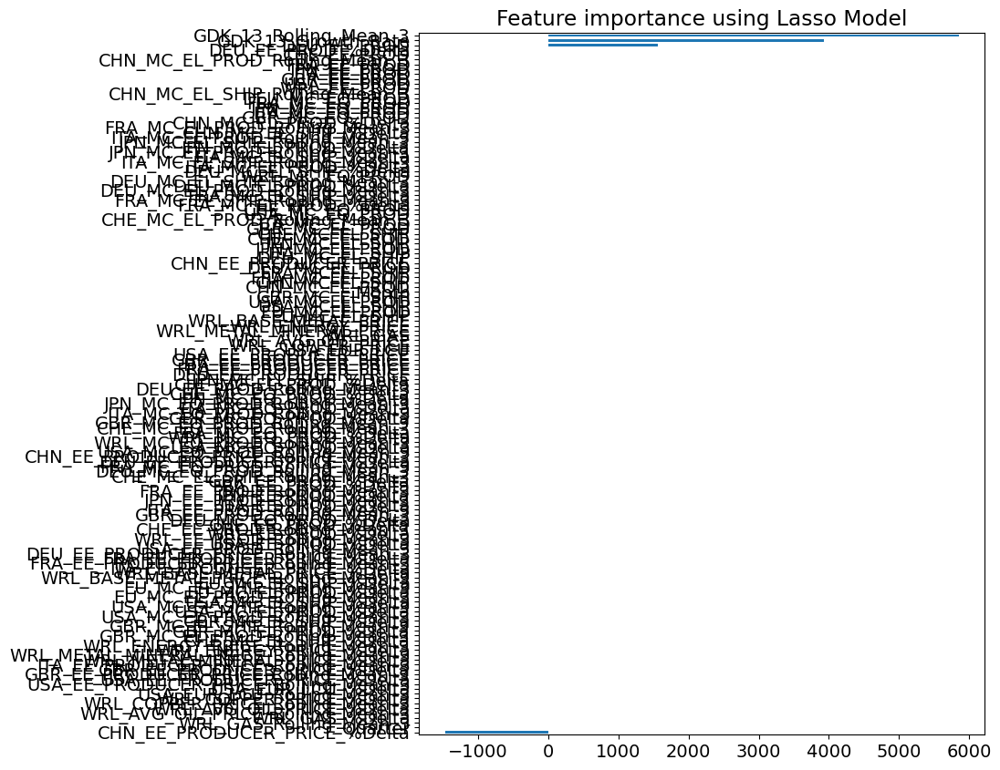

In [159]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data 
reg.fit(X_train_GDK_13, y_train_GDK_13)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_13.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [160]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_13, y_train_GDK_13))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_13.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 2861.946144
Best score using built-in LassoCV: 0.477214


GDK_13_Rolling_Mean_3                     5860.883210
GDK_13_Growth_Rate                        3924.540771
DEU_EE_PROD                               1565.496308
CHN_EE_PRODUCER_PRICE_%Delta              1476.709335
Quarter                                      0.000000
USA_EUR_LCU_Rolling_Mean_3                   0.000000
WRL_GAS_%Delta                               0.000000
WRL_AVG_OIL_PRICE_Rolling_Mean_3             0.000000
WRL_AVG_OIL_PRICE_%Delta                     0.000000
WRL_COPPER_PRICE_Rolling_Mean_3              0.000000
WRL_COPPER_PRICE_%Delta                      0.000000
USA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
USA_EUR_LCU_%Delta                           0.000000
WRL_METAL_MINERAL_PRICE_%Delta               0.000000
USA_EE_PRODUCER_PRICE_%Delta                 0.000000
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
GBR_EE_PRODUCER_PRICE_%Delta                 0.000000
ITA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
ITA_EE_PRODUCER_PRICE_%Delta

### Feature Selection GDK 14

In [161]:
# Define train and validation data of 'df_gdk_14', based on the split date
train = df_gdk_14[df_gdk_14.index < split_date]
validation = df_gdk_14[df_gdk_14.index >= split_date]

X_train_GDK_14 = train.drop(['GDK_14'], axis=1)  #input features for training (excluding target and date)
y_train_GDK_14 = train['GDK_14'] #target variable for training

X_val_GDK_14 = validation.drop(['GDK_14'], axis=1) #input features for validation
y_val_GDK_14 = validation['GDK_14'] #target variable for validation

In [162]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_14.columns
X_train_GDK_14[variables_train] = scaler.fit_transform(X_train_GDK_14[variables_train]) #scale using StandardScaler
X_train_GDK_14[variables_train] = imputer.fit_transform(X_train_GDK_14[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_14.columns
X_val_GDK_14[variables_val] = scaler.transform(X_val_GDK_14[variables_val]) #scale using StandardScaler
X_val_GDK_14[variables_val] = imputer.transform(X_val_GDK_14[variables_val]) #input missing values

In [163]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_14, y_train_GDK_14)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_14.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_14[selected_features], y_train_GDK_14, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 36   8   4   1  30  94   1  31  34   7  15  61   1 111  12 117 101  86
  14  47  26 104  11   5  74  42  43  68  18   1  13  44  25 113  28  80
   1 130  21  45  83  29  81  33  82  62  23  48  37  54 114  40  35 116
 115 107   1  50  51  77 128  57  58 119  89  59  65  38   1 131 133  53
  46 110 126  69  93 132   6  78  19  63  52 109  91 102  16 123 124 125
 127   1  20 122  56  84  87 112   2  88   3 134  39 135  71  92  24  66
  55  70  10 118   1 121  41 136  76 103 108  75   9   1 100 120  99  98
 129  73 106  90  27  79  22  95  96  17  67  97  72  60  64  32 105  49
  85]
Selected Features:  Index(['GDK_14_Growth_Rate', 'FRA_MC_EL_PROD', 'JPN_MC_EL_PROD',
       'USA_EE_PRODUCER_PRICE', 'WRL_MC_EQ_PROD', 'FRA_MC_EL_PROD_%Delta',
       'JPN_MC_EL_PROD_%Delta', 'WRL_METAL_MINERAL_PRICE_Rolling_Mean_3',
       'CHN_EE_PRODUCER_PRICE_%Delta', 'ITA_MC_EQ_PROD_Rolling_Mean_3'],
      dtype='object')
Cross-validation scores (with selected features):  [-6.68168718

In [164]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_14.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_14_Rolling_Mean_3                     False
GDK_14_Growth_Rate                         True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                             True
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                             True
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                            False
EU_MC_EL_PROD                           

In [165]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_14, y_train_GDK_14)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_14.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

JPN_MC_EL_PROD_%Delta                     0.342836
JPN_MC_EQ_PROD_%Delta                     0.310064
JPN_MC_EL_SHIP_%Delta                     0.257383
ITA_EE_PRODUCER_PRICE_%Delta              0.223256
JPN_MC_EQ_PROD                            0.217462
GDK_14_Growth_Rate                        0.208759
USA_MC_EL_SHIP                            0.205957
DEU_MC_EL_SHIP_%Delta                     0.198377
EU_MC_EL_SHIP_%Delta                      0.183932
JPN_EE_PROD_%Delta                        0.175068
GBR_MC_EL_PROD_Rolling_Mean_3             0.168274
ITA_MC_EL_PROD                            0.168249
GBR_EE_PROD_Rolling_Mean_3                0.162211
DEU_MC_EL_PROD_%Delta                     0.161790
USA_EUR_LCU_%Delta                        0.155042
GBR_EE_PROD_%Delta                        0.146019
ITA_EE_PROD_Rolling_Mean_3                0.141718
CHN_EE_PRODUCER_PRICE_%Delta              0.135537
EU_MC_EL_PROD                             0.130867
WRL_MC_EQ_PROD_%Delta          

Lasso picked 4 variables and eliminated the other 141 variables


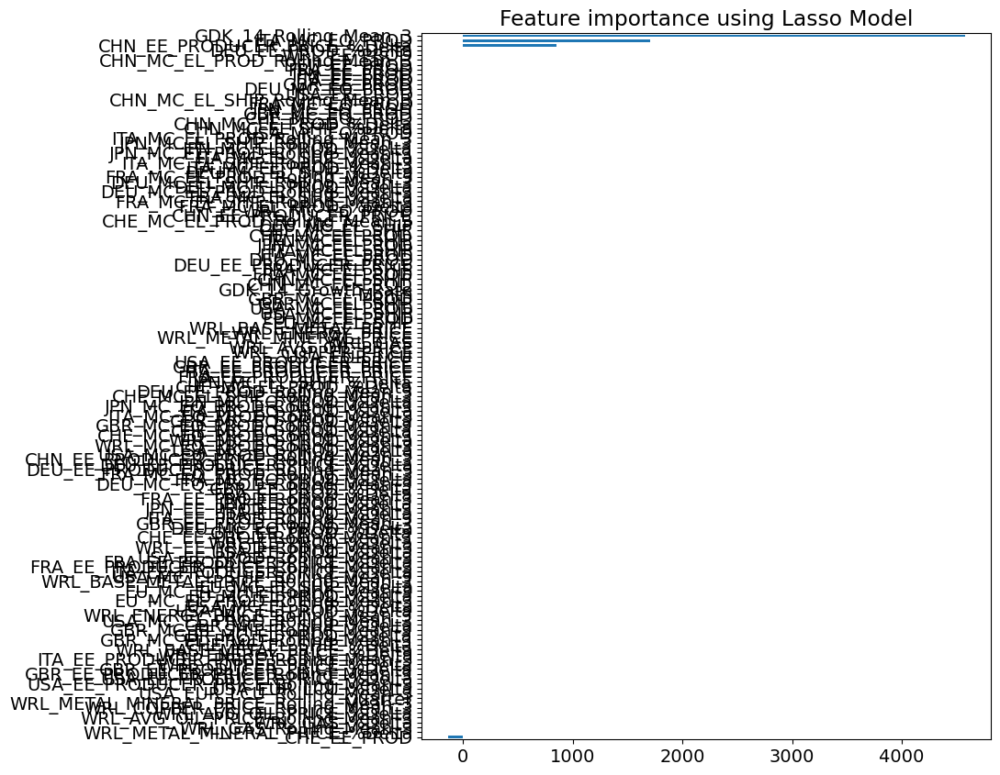

In [166]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data  
reg.fit(X_train_GDK_14, y_train_GDK_14)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_14.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [167]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_14, y_train_GDK_14))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_14.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 2817.821661
Best score using built-in LassoCV: 0.276793


GDK_14_Rolling_Mean_3                     4580.253717
ITA_MC_EQ_PROD                            1706.843836
CHN_EE_PRODUCER_PRICE_%Delta               855.508643
CHE_EE_PROD                                138.461772
ITA_EE_PRODUCER_PRICE_%Delta                 0.000000
FRA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
ITA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
GBR_EE_PRODUCER_PRICE_%Delta                 0.000000
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
WRL_GAS_Rolling_Mean_3                       0.000000
USA_EE_PRODUCER_PRICE_%Delta                 0.000000
USA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
USA_EUR_LCU_%Delta                           0.000000
USA_EUR_LCU_Rolling_Mean_3                   0.000000
WRL_COPPER_PRICE_%Delta                      0.000000
WRL_COPPER_PRICE_Rolling_Mean_3              0.000000
WRL_AVG_OIL_PRICE_%Delta                     0.000000
WRL_AVG_OIL_PRICE_Rolling_Mean_3             0.000000
WRL_GAS_%Delta              

### Feature Selection GDK 16

In [168]:
# Define train and validation data of 'df_gdk_16', based on the split date
train = df_gdk_16[df_gdk_16.index < split_date]
validation = df_gdk_16[df_gdk_16.index >= split_date]

X_train_GDK_16 = train.drop(['GDK_16'], axis=1) #input features for training (excluding target and date)
y_train_GDK_16 = train['GDK_16'] #target variable for training

X_val_GDK_16 = validation.drop(['GDK_16'], axis=1) #input features for validation
y_val_GDK_16 = validation['GDK_16'] #target variable for validation

In [169]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_16.columns
X_train_GDK_16[variables_train] = scaler.fit_transform(X_train_GDK_16[variables_train]) #scale using StandardScaler
X_train_GDK_16[variables_train] = imputer.fit_transform(X_train_GDK_16[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_16.columns
X_val_GDK_16[variables_val] = scaler.transform(X_val_GDK_16[variables_val]) #scale using StandardScaler
X_val_GDK_16[variables_val] = imputer.transform(X_val_GDK_16[variables_val]) #input missing values

In [170]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_16, y_train_GDK_16)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_16.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_16[selected_features], y_train_GDK_16, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [  4  19   1   1  25   6  96   1   1  59  63  54 103  21  56  47  75   1
  67  92  10 121  31  45  49   2  41  80 135   1  79   8  46 127   1   5
  38  84 109 111  40 116 115 110  30   1  85  64  93 123 104  12  17  18
 114 132  39 133 112  14  24 117 118  72  26  22  74  52   9 125  60  90
  29  13  51   7 106  62 108  89  91  37  32  28  97   1  71 120 128  76
 129  65  42 126 124  27 122  36  73  66  16  33   1  83  35  57 136  70
  61  78 105  87  53  50 130  20 100 119  95  94  88  11 131  81  34 107
 101 102  23 134  48  43 113  58  69  98   3  15  86  68  44  99  55  82
  77 137]
Selected Features:  Index(['GDK_16_Rolling_Mean_3', 'GDK_16_Growth_Rate', 'FRA_MC_EL_PROD',
       'FRA_MC_EL_SHIP', 'GBR_MC_EL_PROD', 'USA_EUR_LCU',
       'DEU_EE_PRODUCER_PRICE', 'WRL_EE_PROD', 'EU_MC_EL_PROD_%Delta',
       'USA_EE_PRODUCER_PRICE_Rolling_Mean_3'],
      dtype='object')
Cross-validation scores (with selected features):  [-7.66374235e+10 -1.15375855e+10 -8.98815382e+

In [171]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_16.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_16_Rolling_Mean_3                      True
GDK_16_Growth_Rate                         True
GDK_16_Lag1                               False
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                             True
FRA_MC_EL_SHIP                             True
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                             True
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                          

In [172]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_16, y_train_GDK_16)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_16.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_16_Growth_Rate                        0.453223
GDK_16_Rolling_Mean_3                     0.440050
USA_EUR_LCU                               0.339147
USA_EUR_LCU_Rolling_Mean_3                0.337574
DEU_EE_PRODUCER_PRICE_Rolling_Mean_3      0.316526
WRL_COPPER_PRICE                          0.313110
CHE_MC_EQ_PROD_%Delta                     0.298039
CHE_MC_EQ_PROD_Rolling_Mean_3             0.296351
JPN_MC_EL_SHIP_Rolling_Mean_3             0.270917
ITA_EE_PRODUCER_PRICE                     0.270223
CHE_MC_EL_PROD_Rolling_Mean_3             0.266577
ITA_MC_EQ_PROD_Rolling_Mean_3             0.265727
CHE_MC_EL_SHIP_Rolling_Mean_3             0.258028
DEU_MC_EQ_PROD_Rolling_Mean_3             0.245494
DEU_MC_EQ_PROD                            0.241543
USA_MC_EL_PROD_Rolling_Mean_3             0.228416
WRL_EE_PROD                               0.223629
CHE_MC_EL_PROD                            0.213846
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3      0.213645
ITA_EE_PRODUCER_PRICE_Rolling_M

Lasso picked 5 variables and eliminated the other 141 variables


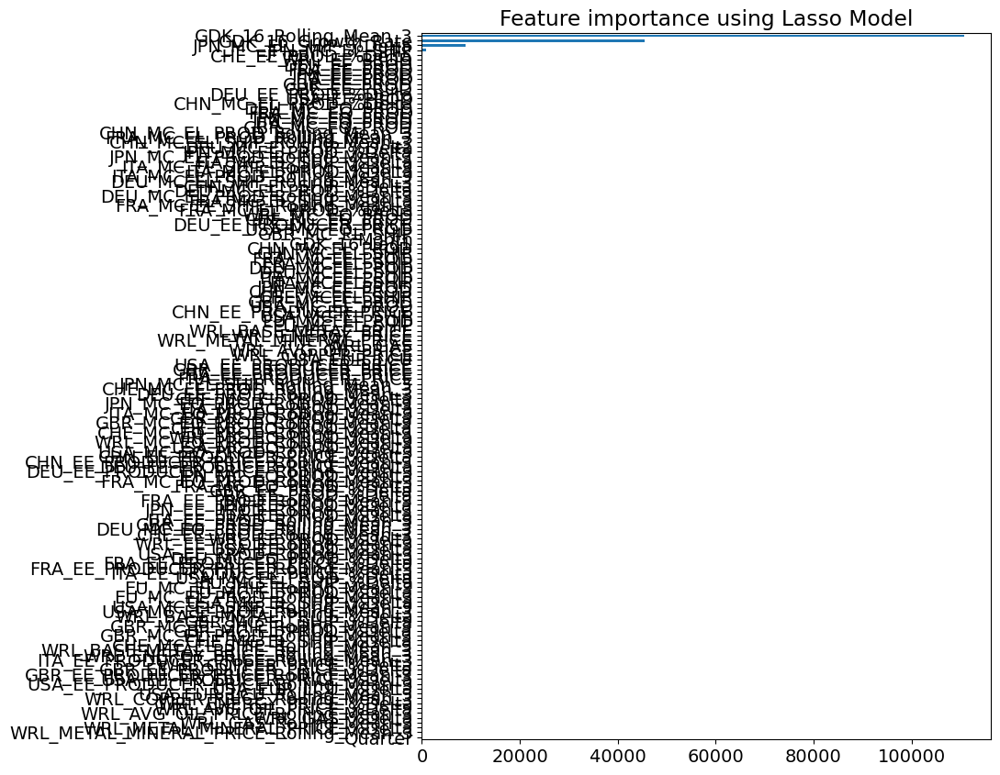

In [173]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data   
reg.fit(X_train_GDK_16, y_train_GDK_16)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_16.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [174]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_16, y_train_GDK_16))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_16.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 15980.967999
Best score using built-in LassoCV: 0.731407


GDK_16_Rolling_Mean_3                     110751.442478
GDK_16_Growth_Rate                         45436.309528
JPN_MC_EL_SHIP_%Delta                       8960.484581
JPN_MC_EL_SHIP                               910.351690
CHE_EE_PROD_%Delta                           176.489755
Quarter                                        0.000000
WRL_GAS_Rolling_Mean_3                         0.000000
WRL_GAS_%Delta                                 0.000000
WRL_AVG_OIL_PRICE_Rolling_Mean_3               0.000000
WRL_AVG_OIL_PRICE_%Delta                       0.000000
WRL_COPPER_PRICE_Rolling_Mean_3                0.000000
WRL_COPPER_PRICE_%Delta                        0.000000
USA_EUR_LCU_%Delta                             0.000000
USA_EUR_LCU_Rolling_Mean_3                     0.000000
WRL_METAL_MINERAL_PRICE_Rolling_Mean_3         0.000000
USA_EE_PRODUCER_PRICE_Rolling_Mean_3           0.000000
USA_EE_PRODUCER_PRICE_%Delta                   0.000000
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3           0

### Feature Selection GDK 2O

In [175]:
# Define train and validation data of 'df_gdk_20', based on the split date
train = df_gdk_20[df_gdk_20.index < split_date]
validation = df_gdk_20[df_gdk_20.index >= split_date]

X_train_GDK_20 = train.drop(['GDK_20'], axis=1) #input features for training (excluding target and date)
y_train_GDK_20 = train['GDK_20'] #target variable for training

X_val_GDK_20 = validation.drop(['GDK_20'], axis=1) #input features for validation
y_val_GDK_20 = validation['GDK_20'] #target variable for validation

In [176]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_20.columns
X_train_GDK_20[variables_train] = scaler.fit_transform(X_train_GDK_20[variables_train]) #scale using StandardScaler
X_train_GDK_20[variables_train] = imputer.fit_transform(X_train_GDK_20[variables_train]) #input missing values

# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_20.columns
X_val_GDK_20[variables_val] = scaler.transform(X_val_GDK_20[variables_val]) #scale using StandardScaler
X_val_GDK_20[variables_val] = imputer.transform(X_val_GDK_20[variables_val]) #input missing values

In [177]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_20, y_train_GDK_20)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_20.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_20[selected_features], y_train_GDK_20, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [ 12   9   1   1   1  87   8  22  14  13  48  32  58 111  56  73  80   1
  46  35   6  68  99  57  66   5  74  52  82  75  25  17  60  53  51  79
 106 108 112   1 116 118  55  65  41   1  33  44  18  63  10  50  38 102
 101  76  26 124 123 122  11  98  83  43  61 115  84  27  31 131 133 135
  49  97  91  71   2  85  16 121  24  15 103 110 104 105 107  59  78 130
  40 129  45 119  64 120  47 127  42 100  29  77  36   1  21   1  54  81
  34   1  62 113   4 134 114 125 126 136  30  28   3 132  95  39 128  69
  96  67 117 109  23  93  88   7  89  19   1  90  92  20  70  94  72  86
  37]
Selected Features:  Index(['GDK_20_Rolling_Mean_3', 'GDK_20_Growth_Rate', 'CHN_MC_EL_PROD',
       'GBR_MC_EL_SHIP', 'ITA_MC_EQ_PROD', 'CHE_EE_PROD',
       'GBR_EE_PRODUCER_PRICE_Rolling_Mean_3',
       'ITA_EE_PRODUCER_PRICE_Rolling_Mean_3',
       'DEU_EE_PRODUCER_PRICE_Rolling_Mean_3', 'GBR_EE_PROD_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [ -18

In [178]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_20.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_20_Rolling_Mean_3                      True
GDK_20_Growth_Rate                         True
CHN_MC_EL_PROD                             True
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                            False
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                             True
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                            False
EU_MC_EL_PROD                           

In [179]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_20, y_train_GDK_20)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_20.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_20_Rolling_Mean_3                     0.242059
GBR_MC_EL_SHIP_%Delta                     0.210597
WRL_COPPER_PRICE_Rolling_Mean_3           0.202634
WRL_BASE_METAL_PRICE                      0.195076
GDK_20_Growth_Rate                        0.192612
WRL_METAL_MINERAL_PRICE                   0.188286
GBR_EE_PROD_%Delta                        0.169205
GBR_MC_EL_PROD                            0.161538
GBR_MC_EQ_PROD                            0.160092
WRL_EE_PROD                               0.157394
WRL_EE_PROD_Rolling_Mean_3                0.153180
USA_EUR_LCU                               0.151589
ITA_EE_PRODUCER_PRICE_%Delta              0.138353
JPN_EE_PROD_Rolling_Mean_3                0.131956
WRL_BASE_METAL_PRICE_Rolling_Mean_3       0.131244
USA_EUR_LCU_Rolling_Mean_3                0.116580
USA_EE_PRODUCER_PRICE_%Delta              0.103062
FRA_EE_PROD_Rolling_Mean_3                0.102880
FRA_EE_PRODUCER_PRICE                     0.102372
GBR_MC_EL_SHIP                 

Lasso picked 4 variables and eliminated the other 141 variables


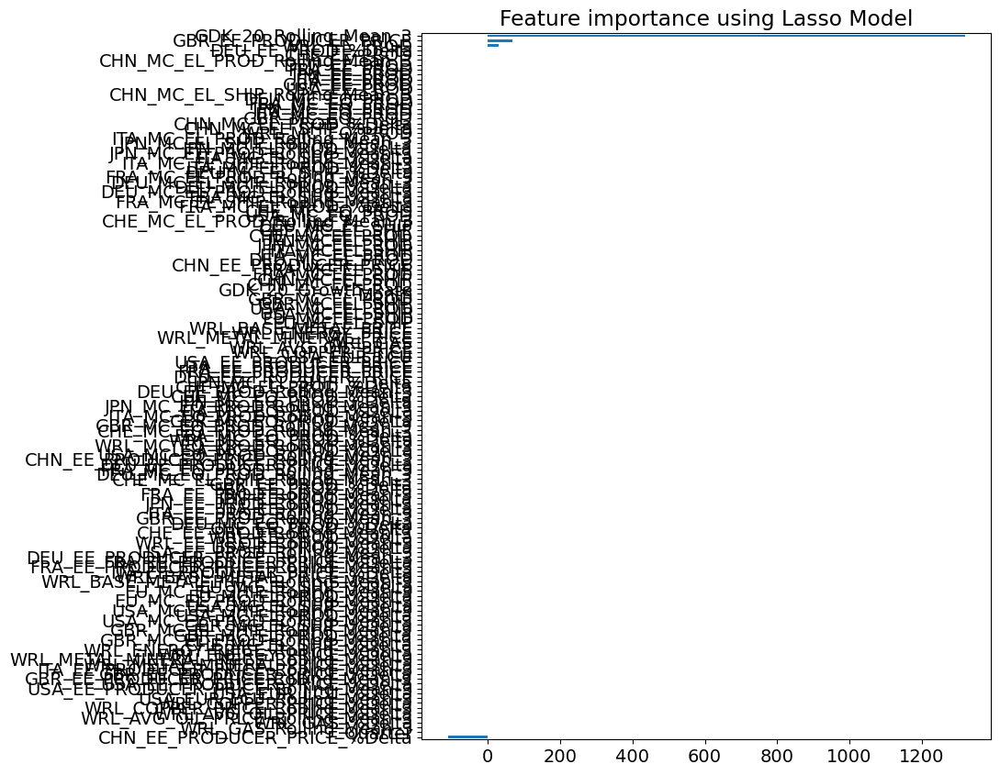

In [180]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()    
reg = LassoCV()
# Fit the LassoCV model on the train data
reg.fit(X_train_GDK_20, y_train_GDK_20)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_20.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [181]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_20, y_train_GDK_20))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_20.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 327.501143
Best score using built-in LassoCV: 0.535412


GDK_20_Rolling_Mean_3                     1321.155965
CHN_EE_PRODUCER_PRICE_%Delta               111.213076
GBR_EE_PRODUCER_PRICE                       67.278471
WRL_EE_PROD                                 30.270022
USA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
WRL_AVG_OIL_PRICE_Rolling_Mean_3             0.000000
WRL_AVG_OIL_PRICE_%Delta                     0.000000
WRL_COPPER_PRICE_Rolling_Mean_3              0.000000
WRL_COPPER_PRICE_%Delta                      0.000000
USA_EUR_LCU_Rolling_Mean_3                   0.000000
USA_EUR_LCU_%Delta                           0.000000
Quarter                                      0.000000
USA_EE_PRODUCER_PRICE_%Delta                 0.000000
WRL_GAS_Rolling_Mean_3                       0.000000
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
GBR_EE_PRODUCER_PRICE_%Delta                 0.000000
ITA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
ITA_EE_PRODUCER_PRICE_%Delta                 0.000000
WRL_GAS_%Delta              

### Feature Selection GDK 36

In [182]:
# Define train and validation data of 'df_gdk_36', based on the split date
train = df_gdk_36[df_gdk_36.index < split_date]
validation = df_gdk_36[df_gdk_36.index >= split_date]

X_train_GDK_36 = train.drop(['GDK_36'], axis=1) #input features for training (excluding target and date)
y_train_GDK_36 = train['GDK_36'] #target variable for training

X_val_GDK_36 = validation.drop(['GDK_36'], axis=1) #input features for validation
y_val_GDK_36 = validation['GDK_36'] #target variable for validation

In [183]:
# Get the columns of the train data and store in 'variables_train'
variables_train = X_train_GDK_36.columns
X_train_GDK_36[variables_train] = scaler.fit_transform(X_train_GDK_36[variables_train]) #scale using StandardScaler
X_train_GDK_36[variables_train] = imputer.fit_transform(X_train_GDK_36[variables_train]) #input missing values
 
# Get the columns of the validation data and store in 'variables_val'
variables_val = X_val_GDK_36.columns
X_val_GDK_36[variables_val] = scaler.transform(X_val_GDK_36[variables_val]) #scale using StandardScaler
X_val_GDK_36[variables_val] = imputer.transform(X_val_GDK_36[variables_val]) #input missing values

In [184]:
# Initialize XGBoost regressor model 
# 'n_estimators = 100' specifies the number of trees in the ensemble
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100)

# Initialize RFE with the XGBoost model as the estimator
# 'n_features_to_select=10' --> select the top 10 features
rfe = RFE(estimator=xgb, n_features_to_select=10, step=1)

# Fit the RFE model to the training data
rfe.fit(X_train_GDK_36, y_train_GDK_36)

# Print the ranking of features
feature_ranking = rfe.ranking_
print("Feature Ranking: ", feature_ranking)

# Select features based on RFE
selected_features = X_train_GDK_36.columns[rfe.support_]
print("Selected Features: ", selected_features)

# Optionally, evaluate the model with the selected features using cross validation
tscv = TimeSeriesSplit(n_splits=5)
scores = cross_val_score(xgb, X_train_GDK_36[selected_features], y_train_GDK_36, cv=tscv, scoring='neg_mean_squared_error')
# Print the cross-validation scores to evaluate the model performance
print("Cross-validation scores (with selected features): ", scores)

Feature Ranking:  [  8  42   1   1   9 104  13  62   1  19  14  98  81  25  40  72   7  60
  58   5   1  68   1  11   1  36  10   4   1   6  20 131 100  31  17  95
 108 101  90  65 106  97 123  93  22  52   3   1  46 122  66  30  83 118
 119   2  26 124  21 126  96  16  77  53  24 102 127  49  23  84  78  37
  39  82 115 128  51  43  33  15  50  38  28  48  88 116  71 114  12 132
  18 129   1  34  56 135 107 121  57 105  94  91  64  27   1 125  76  89
  59 134  74 109  63 103  47  87 117  61 113  80  55  70  32  86 111 133
 130 112 120  29  45  67  41  35 110  92  85  99  54  75  73  79  44  69
 136]
Selected Features:  Index(['GDK_36_Rolling_Mean_3', 'GDK_36_Growth_Rate', 'DEU_MC_EL_PROD',
       'EU_MC_EL_PROD', 'WRL_BASE_METAL_PRICE', 'WRL_METAL_MINERAL_PRICE',
       'USA_EUR_LCU', 'ITA_EE_PROD', 'WRL_METAL_MINERAL_PRICE_%Delta',
       'GBR_EE_PRODUCER_PRICE_%Delta'],
      dtype='object')
Cross-validation scores (with selected features):  [-1.09142313e+08 -9.55795656e+07 -1.80523

In [185]:
# Identify which features were chosen by RFE
selected_features = pd.Series(rfe.support_, index = X_train_GDK_36.columns)
selected_features

Quarter                                   False
Month                                     False
GDK_36_Rolling_Mean_3                      True
GDK_36_Growth_Rate                         True
CHN_MC_EL_PROD                            False
CHN_MC_EL_SHIP                            False
FRA_MC_EL_PROD                            False
FRA_MC_EL_SHIP                            False
DEU_MC_EL_PROD                             True
DEU_MC_EL_SHIP                            False
ITA_MC_EL_PROD                            False
ITA_MC_EL_SHIP                            False
JPN_MC_EL_PROD                            False
JPN_MC_EL_SHIP                            False
CHE_MC_EL_PROD                            False
CHE_MC_EL_SHIP                            False
GBR_MC_EL_PROD                            False
GBR_MC_EL_SHIP                            False
USA_MC_EL_PROD                            False
USA_MC_EL_SHIP                            False
EU_MC_EL_PROD                           

In [186]:
# Compute the mutual information between each feature in the train data and the target
mutual_info = mutual_info_regression(X_train_GDK_36, y_train_GDK_36)

# Convert the array of mutual information scores into a pandas Series --> associate each score with the corresponding feature name
mutual_info = pd.Series(mutual_info)
# Assign the column names as the index of the Series
mutual_info.index = X_train_GDK_36.columns

# Sort the Series in descending order to prioritize features with higher mutual information scores
# higher mutual information scores --> features that share more information with the target variable
mutual_info.sort_values(ascending=False)
#https://guhanesvar.medium.com/feature-selection-based-on-mutual-information-gain-for-classification-and-regression-d0f86ea5262a

GDK_36_Growth_Rate                        0.283021
FRA_EE_PROD                               0.202976
EU_MC_EL_PROD                             0.154528
GBR_MC_EL_PROD                            0.147101
DEU_EE_PROD                               0.143730
CHE_EE_PROD                               0.134020
FRA_MC_EL_SHIP_Rolling_Mean_3             0.124440
CHE_MC_EQ_PROD_Rolling_Mean_3             0.111055
CHE_MC_EQ_PROD_%Delta                     0.109339
USA_MC_EL_SHIP_%Delta                     0.103995
GDK_36_Rolling_Mean_3                     0.101641
WRL_METAL_MINERAL_PRICE_%Delta            0.099294
JPN_MC_EL_SHIP_Rolling_Mean_3             0.088878
DEU_MC_EQ_PROD                            0.087095
WRL_COPPER_PRICE_%Delta                   0.086233
GBR_EE_PROD_%Delta                        0.085223
WRL_COPPER_PRICE                          0.080776
ITA_MC_EQ_PROD_Rolling_Mean_3             0.079006
WRL_MC_EQ_PROD                            0.077698
GBR_EE_PROD                    

Lasso picked 8 variables and eliminated the other 137 variables


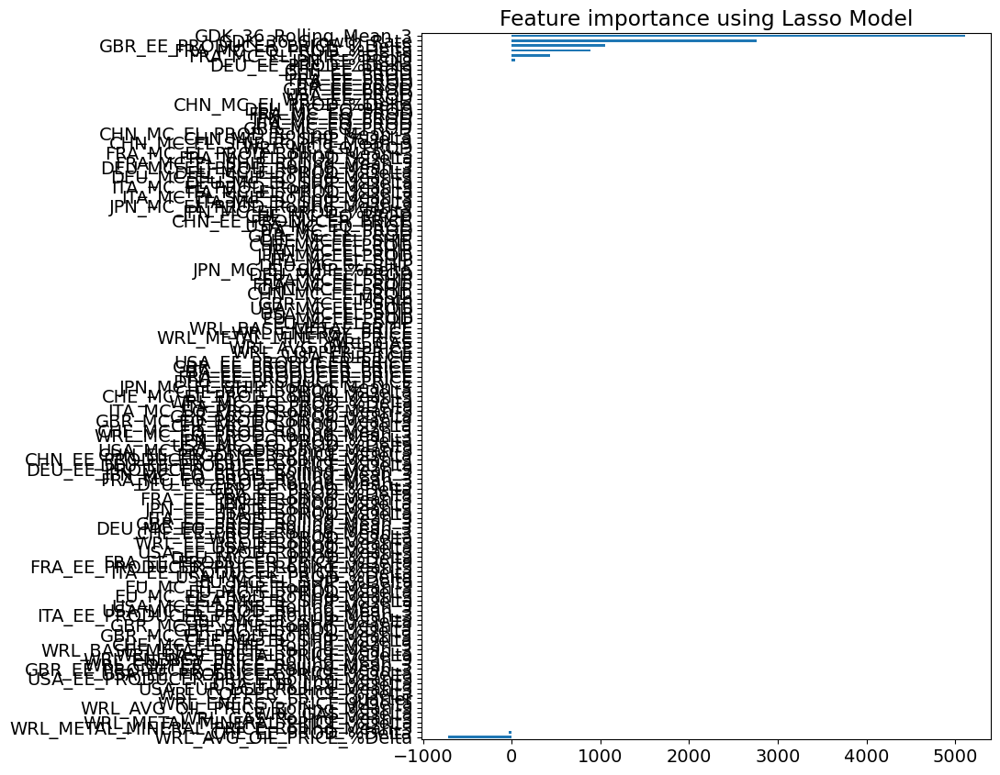

In [187]:
# Function to plot feature importance
def plot_importance(coef,name):
    # Sort the coefficients for the features
    imp_coef = coef.sort_values()
    # Set the figure size for the plot
    plt.figure(figsize=(8,10))
    # Plot the sorted coefficients as a horizontal bar chart
    imp_coef.plot(kind = "barh")
    # Add a title
    plt.title("Feature importance using " + name + " Model")
    plt.show()

# Initialize LassoCV()
reg = LassoCV()
# Fit the LassoCV model on the train data  
reg.fit(X_train_GDK_36, y_train_GDK_36)
# Extract the coefficients of the fitted model and associate them with their corresponding feature names
coef = pd.Series(reg.coef_, index = X_train_GDK_36.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

# Visualization
coef.sort_values()
plot_importance(coef,'Lasso')

In [188]:
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X_train_GDK_36, y_train_GDK_36))

# Create a panda Series where each coefficient value is mapped to its corresponding feature name
coef = pd.Series(reg.coef_, index = X_train_GDK_36.columns)
# Sort the values in descending order --> highlight the higher values --> most important features
abs(coef).sort_values(ascending=False)

Best alpha using built-in LassoCV: 1947.766956
Best score using built-in LassoCV: 0.491167


GDK_36_Rolling_Mean_3                     5113.522244
GDK_36_Growth_Rate                        2763.296658
GBR_EE_PRODUCER_PRICE_%Delta              1052.067616
FRA_MC_EQ_PROD_%Delta                      883.328860
WRL_AVG_OIL_PRICE_%Delta                   720.293464
FRA_MC_EL_SHIP_%Delta                      430.790408
CHE_EE_PROD_%Delta                          36.608781
JPN_EE_PROD                                 34.200020
WRL_GAS_Rolling_Mean_3                       0.000000
WRL_GAS_%Delta                               0.000000
WRL_AVG_OIL_PRICE_Rolling_Mean_3             0.000000
WRL_COPPER_PRICE_Rolling_Mean_3              0.000000
WRL_COPPER_PRICE_%Delta                      0.000000
USA_EUR_LCU_%Delta                           0.000000
USA_EUR_LCU_Rolling_Mean_3                   0.000000
USA_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
USA_EE_PRODUCER_PRICE_%Delta                 0.000000
GBR_EE_PRODUCER_PRICE_Rolling_Mean_3         0.000000
ITA_EE_PRODUCER_PRICE_Rollin

## 5.2 Final features for each product

In [189]:
GDK_1_features = [
    "GDK_1_Rolling_Mean_3",
    "GDK_1_Growth_Rate",
    "CHE_MC_EL_PROD_%Delta"
]

GDK_3_features = [
    "GDK_3_Rolling_Mean_3",
    "GDK_3_Growth_Rate",
    "JPN_MC_EL_PROD_%Delta"
]

GDK_4_features = [
    "GDK_4_Rolling_Mean_3",
    "GDK_4_Growth_Rate",
    "USA_EE_PRODUCER_PRICE_%Delta"
]

GDK_5_features = [
    "GDK_5_Rolling_Mean_3",
    "GDK_5_Growth_Rate",
    "GBR_EE_PRODUCER_PRICE",
    "ITA_MC_EL_SHIP_%Delta",
    "JPN_MC_EL_SHIP_%Delta",
    "USA_MC_EL_SHIP_%Delta",
    "EU_MC_EL_SHIP_%Delta",
    "FRA_EE_PROD_%Delta"
]

GDK_6_features = [
    "GDK_6_Rolling_Mean_3",
    "DEU_EE_PROD",
    "DEU_EE_PROD_%Delta"
]

GDK_8_features = [
    "GDK_8_Rolling_Mean_3",
    "GDK_8_Growth_Rate",
    "GDK_8_Lag3",
    "WRL_GAS_%Delta",
    "USA_EE_PRODUCER_PRICE_%Delta"
]

GDK_9_features = [
    "GDK_9_Rolling_Mean_3",
    "DEU_MC_EL_PROD_Rolling_Mean_3",
    "GBR_EE_PROD_Rolling_Mean_3",
    "WRL_EE_PROD",
    "JPN_MC_EL_SHIP"
]

GDK_11_features = [
    "GDK_11_Rolling_Mean_3",
    "FRA_MC_EL_SHIP_Rolling_Mean_3",
    "ITA_EE_PROD_%Delta"
]

GDK_12_features = [
    "GDK_12_Rolling_Mean_3",
    "GDK_12_Growth_Rate",
    "GDK_12_Lag3",
    "GBR_EE_PROD_Rolling_Mean_3",
    "USA_EUR_LCU_Rolling_Mean_3"
]

GDK_13_features = [
    "GDK_13_Growth_Rate",
    "CHN_EE_PRODUCER_PRICE_%Delta"
]

GDK_14_features = [
    "GDK_14_Growth_Rate",
    "JPN_MC_EL_PROD_%Delta",
    "CHN_EE_PRODUCER_PRICE_%Delta"
]

GDK_16_features = [
    "GDK_16_Rolling_Mean_3",
    "GDK_16_Growth_Rate",
    "USA_EUR_LCU"
]

GDK_20_features = [
    "GDK_20_Rolling_Mean_3",
    "GDK_20_Growth_Rate",
    "GBR_EE_PROD_%Delta",
    "WRL_EE_PROD"
]

GDK_36_features = [
    "GDK_36_Rolling_Mean_3",
    "GDK_36_Growth_Rate",
    "EU_MC_EL_PROD",
    "GBR_EE_PRODUCER_PRICE_%Delta"
]

# 6. Forecasting selected features 

In [190]:
market_features_to_predict = [
    "CHE_MC_EL_PROD_%Delta",
    "JPN_MC_EL_PROD_%Delta",
    "USA_EE_PRODUCER_PRICE_%Delta",
    "GBR_EE_PRODUCER_PRICE",
    "ITA_MC_EL_SHIP_%Delta",
    "JPN_MC_EL_SHIP_%Delta",
    "USA_MC_EL_SHIP_%Delta",
    "EU_MC_EL_SHIP_%Delta",
    "FRA_EE_PROD_%Delta",
    "DEU_EE_PROD",
    "DEU_EE_PROD_%Delta",
    "WRL_GAS_%Delta",
    "USA_EE_PRODUCER_PRICE_%Delta",
    "DEU_MC_EL_PROD_Rolling_Mean_3",
    "GBR_EE_PROD_Rolling_Mean_3",
    "WRL_EE_PROD",
    "JPN_MC_EL_SHIP",
    "FRA_MC_EL_SHIP_Rolling_Mean_3",
    "ITA_EE_PROD_%Delta",
    "GBR_EE_PROD_Rolling_Mean_3",
    "USA_EUR_LCU_Rolling_Mean_3",
    "CHN_EE_PRODUCER_PRICE_%Delta",
    "CHN_EE_PRODUCER_PRICE_%Delta",
    "USA_EUR_LCU",
    "GBR_EE_PROD_%Delta",
    "EU_MC_EL_PROD",
    "GBR_EE_PRODUCER_PRICE_%Delta"
]

gdk_features_to_predict = [
    "GDK_1_Rolling_Mean_3",
    "GDK_1_Growth_Rate",
    "GDK_3_Rolling_Mean_3",
    "GDK_3_Growth_Rate",
    "GDK_4_Rolling_Mean_3",
    "GDK_4_Growth_Rate",
    "GDK_5_Rolling_Mean_3",
    "GDK_5_Growth_Rate",
    "GDK_6_Rolling_Mean_3",
    "GDK_8_Rolling_Mean_3",
    "GDK_8_Growth_Rate",
    "GDK_8_Lag3",
    "GDK_9_Rolling_Mean_3",
    "GDK_11_Rolling_Mean_3",
    "GDK_12_Rolling_Mean_3",
    "GDK_12_Growth_Rate",
    "GDK_12_Lag3",
    "GDK_13_Growth_Rate",
    "GDK_14_Growth_Rate",
    "GDK_16_Rolling_Mean_3",
    "GDK_16_Growth_Rate",
    "GDK_20_Rolling_Mean_3",
    "GDK_20_Growth_Rate",
    "GDK_36_Rolling_Mean_3",
    "GDK_36_Growth_Rate"
]

GDK_features_list = [
    GDK_1_features,
    GDK_3_features,
    GDK_4_features,
    GDK_5_features,
    GDK_6_features,
    GDK_8_features,
    GDK_9_features,
    GDK_11_features,
    GDK_12_features,
    GDK_13_features,
    GDK_14_features,
    GDK_16_features,
    GDK_20_features,
    GDK_36_features
]


In [191]:
market_data_copy = market_filtered.copy()
products_data_copy = products.copy()

In [192]:
# check the first five rows of 'products_data_copy' DataFrame
products_data_copy.head()

,GDK_1,Quarter,Month,GDK_1_Rolling_Mean_3,GDK_1_Growth_Rate,GDK_3,GDK_3_Rolling_Mean_3,GDK_3_Growth_Rate,GDK_3_Lag2,GDK_4,GDK_4_Rolling_Mean_3,GDK_4_Growth_Rate,GDK_5,GDK_5_Rolling_Mean_3,GDK_5_Growth_Rate,GDK_5_Lag6,GDK_6,GDK_6_Rolling_Mean_3,GDK_6_Growth_Rate,GDK_8,GDK_8_Rolling_Mean_3,GDK_8_Growth_Rate,GDK_8_Lag2,GDK_8_Lag3,GDK_9,GDK_9_Rolling_Mean_3,GDK_9_Growth_Rate,GDK_9_Lag11,GDK_11,GDK_11_Rolling_Mean_3,GDK_11_Growth_Rate,GDK_12,GDK_12_Rolling_Mean_3,GDK_12_Growth_Rate,GDK_12_Lag1,GDK_12_Lag2,GDK_12_Lag3,GDK_13,GDK_13_Rolling_Mean_3,GDK_13_Growth_Rate,GDK_14,GDK_14_Rolling_Mean_3,GDK_14_Growth_Rate,GDK_16,GDK_16_Rolling_Mean_3,GDK_16_Growth_Rate,GDK_16_Lag1,GDK_20,GDK_20_Rolling_Mean_3,GDK_20_Growth_Rate,GDK_36,GDK_36_Rolling_Mean_3,GDK_36_Growth_Rate
month_year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-01,36098918.79,4.0,10.0,3.372299e+07,-24.705687,8089465.96,9.563109e+06,46.647524,8089465.96,397760.69,399728.023333,-6.646778,2499061.19,6.146838e+06,259.892910,10062206.72,369231.60,613917.083333,28.116597,586052.74,461278.740000,-10.197029,586052.74,586052.74,3219.32,1698.740000,-41.729931,7131.444688,1021303.50,1.382090e+06,85.923655,28686.33,15878.976667,-96.270000,28686.33,28686.33,28686.33,27666.10,37167.093333,146.438782,5770.0,7633.666667,196.880416,427701.760698,427701.760698,0.0,427701.760698,4563.14,3759.976667,27.064697,6474.60,14005.576667,233.883329
2018-11-01,27180432.94,4.0,11.0,3.372299e+07,-24.705687,11863001.51,9.563109e+06,46.647524,8089465.96,371322.42,399728.023333,-6.646778,8993944.04,6.146838e+06,259.892910,10062206.72,473046.96,613917.083333,28.116597,526292.77,461278.740000,-10.197029,586052.74,586052.74,1875.90,1698.740000,-41.729931,7131.444688,1898844.80,1.382090e+06,85.923655,1070.00,15878.976667,-96.270000,28686.33,28686.33,28686.33,68180.00,37167.093333,146.438782,17130.0,7633.666667,196.880416,427701.760698,427701.760698,0.0,427701.760698,5798.14,3759.976667,27.064697,21617.61,14005.576667,233.883329
2018-12-01,37889612.12,4.0,12.0,3.372299e+07,39.400326,8736859.39,9.563109e+06,-26.352033,8089465.96,430100.96,399728.023333,15.829515,6947507.31,6.146838e+06,-22.753496,10062206.72,999472.69,613917.083333,111.284032,271490.71,461278.740000,-48.414509,586052.74,586052.74,1.00,1698.740000,-99.946692,7131.444688,1226122.00,1.382090e+06,-35.428003,17880.60,15878.976667,1571.084112,1070.00,28686.33,28686.33,15655.18,37167.093333,-77.038457,1.0,7633.666667,-99.994162,427701.760698,427701.760698,0.0,427701.760698,918.65,3759.976667,-84.156126,13924.52,14005.576667,-35.587144
2019-01-01,27728148.35,1.0,1.0,3.093273e+07,-26.818601,10705300.63,1.043505e+07,22.530307,11863001.51,484173.88,428532.420000,12.572146,8233205.07,8.058219e+06,18.505886,10062206.72,598874.10,690464.583333,-40.080994,381400.15,393061.210000,40.483684,526292.77,586052.74,1487.00,1121.300000,148600.000000,7131.444688,2216391.74,1.780453e+06,80.764373,21484.00,13478.200000,20.152568,17880.60,1070.00,28686.33,27198.29,37011.156667,73.733486,1686.4,6272.466667,168540.000000,427701.760698,427701.760698,0.0,427701.760698,2398.04,3038.276667,161.039569,15444.39,16995.506667,10.915062
2019-02-01,34793163.53,1.0,2.0,3.347031e+07,25.479578,10167796.86,9.869986e+06,-5.020912,8736859.39,620031.80,511435.546667,28.059738,6879250.99,7.353321e+06,-16.445043,10062206.72,542037.52,713461.436667,-9.490572,368475.57,340455.476667,-3.388719,271490.71,526292.77,3234.28,1574.093333,117.503699,7131.444688,610456.60,1.350990e+06,-72.457188,34214.74,24526.446667,59.256842,21484.00,17880.60,1070.00,32638.63,25164.033333,20.002508,19196.3,6961.233333,1038.300522,427701.760698,427701.760698,0.0,427701.760698,620.66,1312.450000,-74.118030,8051.15,12473.353333,-47.870068


In [193]:
# Initialize an empty DataFrame to hold future feature values: 'future_features'
future_features = pd.DataFrame()
# Create a copy of 'products_data_copy' to work with --> original data remains unchanged
df = products_data_copy.copy()

# Iterate through each column in 'gdk_features_to_predict'
for column in gdk_features_to_predict:
    # Isolate the current column into a new DataFrame 'df1'
    df1 = df[[column]].copy()
    # Reset the index of 'df1' and rename columns to fit Prophet's expected format
    data = (df1.reset_index() \
        .rename(columns={'month_year':'ds',
                        f'{column}':'y'}))
    # Initialize Prophet
    model = Prophet()
    # Fit the model to the data
    model.fit(data)
    
    # Create a DataFrame representing future dates to make predictions
    # 'periods=10' is the number of future points to predict and 'freq='MS' sets the frequency to monthly start
    future = model.make_future_dataframe(periods=10, freq='MS')

    # Forecast future dates
    forecast_Production_Index = model.predict(future)
    # Keep only the 'ds' (date) and 'yhat' (predicted value) columns --> simplicity
    forecast_Production_Index  = forecast_Production_Index[['ds', 'yhat']]
    # Set the date column as the index
    forecast_Production_Index= forecast_Production_Index.set_index('ds')
    # Add the forecasted values to the 'future_features' DataFrame
    future_features[column] = forecast_Production_Index['yhat'].values

# Reset the index to use date as a regular column
forecast_Production_Index.reset_index(inplace=True)
# Add the date column to 'future_features' --> keep track of the forecast dates
future_features['ds'] = forecast_Production_Index['ds'].values
# Set date as the index of 'future_features' --> facilitate time series analysis
future_features.set_index('ds', inplace = True)

23:18:29 - cmdstanpy - INFO - Chain [1] start processing
23:18:30 - cmdstanpy - INFO - Chain [1] done processing
23:18:30 - cmdstanpy - INFO - Chain [1] start processing
23:18:31 - cmdstanpy - INFO - Chain [1] done processing
23:18:31 - cmdstanpy - INFO - Chain [1] start processing
23:18:31 - cmdstanpy - INFO - Chain [1] done processing
23:18:32 - cmdstanpy - INFO - Chain [1] start processing
23:18:32 - cmdstanpy - INFO - Chain [1] done processing
23:18:32 - cmdstanpy - INFO - Chain [1] start processing
23:18:33 - cmdstanpy - INFO - Chain [1] done processing
23:18:33 - cmdstanpy - INFO - Chain [1] start processing
23:18:33 - cmdstanpy - INFO - Chain [1] done processing
23:18:34 - cmdstanpy - INFO - Chain [1] start processing
23:18:34 - cmdstanpy - INFO - Chain [1] done processing
23:18:35 - cmdstanpy - INFO - Chain [1] start processing
23:18:35 - cmdstanpy - INFO - Chain [1] done processing
23:18:35 - cmdstanpy - INFO - Chain [1] start processing
23:18:35 - cmdstanpy - INFO - Chain [1]

In [194]:
# check the first five rows of 'future_features' DataFrame
future_features.head()

,GDK_1_Rolling_Mean_3,GDK_1_Growth_Rate,GDK_3_Rolling_Mean_3,GDK_3_Growth_Rate,GDK_4_Rolling_Mean_3,GDK_4_Growth_Rate,GDK_5_Rolling_Mean_3,GDK_5_Growth_Rate,GDK_6_Rolling_Mean_3,GDK_8_Rolling_Mean_3,GDK_8_Growth_Rate,GDK_8_Lag3,GDK_9_Rolling_Mean_3,GDK_11_Rolling_Mean_3,GDK_12_Rolling_Mean_3,GDK_12_Growth_Rate,GDK_12_Lag3,GDK_13_Growth_Rate,GDK_14_Growth_Rate,GDK_16_Rolling_Mean_3,GDK_16_Growth_Rate,GDK_20_Rolling_Mean_3,GDK_20_Growth_Rate,GDK_36_Rolling_Mean_3,GDK_36_Growth_Rate
ds,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-01,3.624568e+07,-3.805687,1.059478e+07,-0.230083,367114.713611,-41.580027,9.344165e+06,70.704196,599653.629370,361851.589727,-75.942204,259710.529986,3488.967143,1.785301e+06,-4888.620150,136.096992,-28038.246338,155.183414,70910.357501,517904.633686,-45.486634,2596.425636,-2151.500840,10089.902782,-72.106994
2018-11-01,3.617528e+07,-14.899762,1.150048e+07,40.579530,375274.545945,83.834888,8.639036e+06,99.038887,544010.907139,378325.610780,239.426321,277103.365555,6205.351773,1.436212e+06,59260.411189,1093.749607,-72082.507678,63.600149,77928.133094,458491.938568,0.607296,2710.652101,-3097.901438,11132.279727,467.636562
2018-12-01,3.561100e+07,11.144195,1.035965e+07,-18.823446,327179.613625,-3.346798,7.773902e+06,51.773446,531207.363997,325605.716725,11.957883,771351.777634,5860.987670,9.220921e+05,63482.885614,678.561143,94028.829059,53.066365,71641.650806,378465.007336,-35.347239,2830.214658,-786.998971,10023.431151,101.908311
2019-01-01,3.325582e+07,-11.991662,1.062673e+07,18.250079,333889.576912,7.526782,7.432263e+06,20.975810,456432.759442,388043.137261,-12.239306,-84973.732724,5715.220721,1.124314e+06,75970.638753,140.075560,-16780.859364,60.738825,223181.880015,388878.265752,160.270902,2048.454324,12659.922980,12108.880632,-16.329710
2019-02-01,3.348818e+07,8.413209,9.782146e+06,15.526509,348617.042501,58.794632,7.898742e+06,184.814766,544738.053541,365505.467851,55.538626,283435.903540,2214.198659,1.016129e+06,74900.262133,184.805121,142111.017487,38.754329,27176.704106,349629.470079,-25.812288,1265.630022,29421.741516,12511.492827,65.287457


In [195]:
# Create a copy of 'market_data_copy' to work with --> original data remains unchanged
df = market_data_copy.copy()

# Iterate through each column in 'market_features_to_predict'
for column in market_features_to_predict:
    # Isolate the current column into a new DataFrame 'df1'
    df1 = df[[column]].copy()
    # Reset the index of 'df1' and rename columns to fit Prophet's expected format
    data = (df1.reset_index() \
        .rename(columns={'DATE':'ds',
                        f'{column}':'y'}))
    # Initialize Prophet
    model = Prophet()
    # Fit the model to the data
    model.fit(data)
    
    # Create a DataFrame representing future dates to make predictions
    # 'periods=10' is the number of future points to predict and 'freq='MS' sets the frequency to monthly start
    future = model.make_future_dataframe(periods=10, freq='MS')
    
    # Forecast future dates
    forecast_Production_Index = model.predict(future)
    # Keep only the 'ds' (date) and 'yhat' (predicted value) columns --> simplicity
    forecast_Production_Index  = forecast_Production_Index[['ds', 'yhat']]
    # Set the date column as the index
    forecast_Production_Index= forecast_Production_Index.set_index('ds')
    # Add the forecasted values to the 'future_features' DataFrame
    future_features[column] = forecast_Production_Index['yhat'].values

23:18:48 - cmdstanpy - INFO - Chain [1] start processing
23:18:49 - cmdstanpy - INFO - Chain [1] done processing
23:18:49 - cmdstanpy - INFO - Chain [1] start processing
23:18:49 - cmdstanpy - INFO - Chain [1] done processing
23:18:50 - cmdstanpy - INFO - Chain [1] start processing
23:18:50 - cmdstanpy - INFO - Chain [1] done processing
23:18:50 - cmdstanpy - INFO - Chain [1] start processing
23:18:51 - cmdstanpy - INFO - Chain [1] done processing
23:18:51 - cmdstanpy - INFO - Chain [1] start processing
23:18:52 - cmdstanpy - INFO - Chain [1] done processing
23:18:52 - cmdstanpy - INFO - Chain [1] start processing
23:18:52 - cmdstanpy - INFO - Chain [1] done processing
23:18:53 - cmdstanpy - INFO - Chain [1] start processing
23:18:53 - cmdstanpy - INFO - Chain [1] done processing
23:18:53 - cmdstanpy - INFO - Chain [1] start processing
23:18:54 - cmdstanpy - INFO - Chain [1] done processing
23:18:54 - cmdstanpy - INFO - Chain [1] start processing
23:18:54 - cmdstanpy - INFO - Chain [1]

In [196]:
# check the first five rows of 'future_features' DataFrame
future_features.head()

,GDK_1_Rolling_Mean_3,GDK_1_Growth_Rate,GDK_3_Rolling_Mean_3,GDK_3_Growth_Rate,GDK_4_Rolling_Mean_3,GDK_4_Growth_Rate,GDK_5_Rolling_Mean_3,GDK_5_Growth_Rate,GDK_6_Rolling_Mean_3,GDK_8_Rolling_Mean_3,GDK_8_Growth_Rate,GDK_8_Lag3,GDK_9_Rolling_Mean_3,GDK_11_Rolling_Mean_3,GDK_12_Rolling_Mean_3,GDK_12_Growth_Rate,GDK_12_Lag3,GDK_13_Growth_Rate,GDK_14_Growth_Rate,GDK_16_Rolling_Mean_3,GDK_16_Growth_Rate,GDK_20_Rolling_Mean_3,GDK_20_Growth_Rate,GDK_36_Rolling_Mean_3,GDK_36_Growth_Rate,CHE_MC_EL_PROD_%Delta,JPN_MC_EL_PROD_%Delta,USA_EE_PRODUCER_PRICE_%Delta,GBR_EE_PRODUCER_PRICE,ITA_MC_EL_SHIP_%Delta,JPN_MC_EL_SHIP_%Delta,USA_MC_EL_SHIP_%Delta,EU_MC_EL_SHIP_%Delta,FRA_EE_PROD_%Delta,DEU_EE_PROD,DEU_EE_PROD_%Delta,WRL_GAS_%Delta,DEU_MC_EL_PROD_Rolling_Mean_3,GBR_EE_PROD_Rolling_Mean_3,WRL_EE_PROD,JPN_MC_EL_SHIP,FRA_MC_EL_SHIP_Rolling_Mean_3,ITA_EE_PROD_%Delta,USA_EUR_LCU_Rolling_Mean_3,CHN_EE_PRODUCER_PRICE_%Delta,USA_EUR_LCU,GBR_EE_PROD_%Delta,EU_MC_EL_PROD,GBR_EE_PRODUCER_PRICE_%Delta
ds,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-01,3.624568e+07,-3.805687,1.059478e+07,-0.230083,367114.713611,-41.580027,9.344165e+06,70.704196,599653.629370,361851.589727,-75.942204,259710.529986,3488.967143,1.785301e+06,-4888.620150,136.096992,-28038.246338,155.183414,70910.357501,517904.633686,-45.486634,2596.425636,-2151.500840,10089.902782,-72.106994,1.366627,-8.648528,-0.250911,111.899449,1.017104,-9.868679,-3.758853,-2.010377,0.939851,115.797752,-0.418509,4.713664,121.865585,116.385115,130.533029,119.727671,115.269244,-1.266167,1.142647,-0.735249,1.147354,-1.420298,124.933690,-0.463703
2018-11-01,3.617528e+07,-14.899762,1.150048e+07,40.579530,375274.545945,83.834888,8.639036e+06,99.038887,544010.907139,378325.610780,239.426321,277103.365555,6205.351773,1.436212e+06,59260.411189,1093.749607,-72082.507678,63.600149,77928.133094,458491.938568,0.607296,2710.652101,-3097.901438,11132.279727,467.636562,1.403084,-0.392831,-0.283663,111.829406,-2.057235,0.497003,-8.329351,1.929959,-9.013424,114.985100,-0.657975,-0.633332,125.358765,119.723806,130.789371,120.088892,120.809461,-8.864124,1.140337,-1.355355,1.139304,2.008556,124.106795,-0.005552
2018-12-01,3.561100e+07,11.144195,1.035965e+07,-18.823446,327179.613625,-3.346798,7.773902e+06,51.773446,531207.363997,325605.716725,11.957883,771351.777634,5860.987670,9.220921e+05,63482.885614,678.561143,94028.829059,53.066365,71641.650806,378465.007336,-35.347239,2830.214658,-786.998971,10023.431151,101.908311,1.341622,7.679734,-0.382966,111.911000,9.972278,8.603532,7.304753,1.870814,-11.821782,92.775522,-20.186264,-6.465106,125.112525,117.296606,120.632559,129.289624,122.243602,-22.518910,1.139768,-0.546078,1.141943,-8.837259,118.051492,0.146114
2019-01-01,3.325582e+07,-11.991662,1.062673e+07,18.250079,333889.576912,7.526782,7.432263e+06,20.975810,456432.759442,388043.137261,-12.239306,-84973.732724,5715.220721,1.124314e+06,75970.638753,140.075560,-16780.859364,60.738825,223181.880015,388878.265752,160.270902,2048.454324,12659.922980,12108.880632,-16.329710,-4.932800,-13.877960,-0.049341,110.956681,-34.558890,-15.160926,-11.992905,-19.024975,0.027564,104.179101,13.116111,-17.014810,119.378679,113.615457,109.873185,110.602844,116.576331,17.046852,1.139877,-0.326101,1.142391,-1.798746,105.357950,-0.761318
2019-02-01,3.348818e+07,8.413209,9.782146e+06,15.526509,348617.042501,58.794632,7.898742e+06,184.814766,544738.053541,365505.467851,55.538626,283435.903540,2214.198659,1.016129e+06,74900.262133,184.805121,142111.017487,38.754329,27176.704106,349629.470079,-25.812288,1265.630022,29421.741516,12511.492827,65.287457,-5.312040,4.743441,-0.296286,111.818424,11.654351,5.881233,4.913480,5.240893,-1.750487,106.107805,1.737938,-9.937662,114.487223,109.582963,111.580642,116.996980,113.809898,5.504888,1.138824,-0.417724,1.132039,1.794627,110.898862,0.888148


## Creating a data set with the predicted feature values for the desired forecasting period

In [197]:
# Assign data from May 1, 2022 until February 1, 2023 in a new DataFrame: 'future_features_predicted'
future_features_predicted = future_features.loc['2022-05-01':'2023-02-01']

In [198]:
future_features_predicted

,GDK_1_Rolling_Mean_3,GDK_1_Growth_Rate,GDK_3_Rolling_Mean_3,GDK_3_Growth_Rate,GDK_4_Rolling_Mean_3,GDK_4_Growth_Rate,GDK_5_Rolling_Mean_3,GDK_5_Growth_Rate,GDK_6_Rolling_Mean_3,GDK_8_Rolling_Mean_3,GDK_8_Growth_Rate,GDK_8_Lag3,GDK_9_Rolling_Mean_3,GDK_11_Rolling_Mean_3,GDK_12_Rolling_Mean_3,GDK_12_Growth_Rate,GDK_12_Lag3,GDK_13_Growth_Rate,GDK_14_Growth_Rate,GDK_16_Rolling_Mean_3,GDK_16_Growth_Rate,GDK_20_Rolling_Mean_3,GDK_20_Growth_Rate,GDK_36_Rolling_Mean_3,GDK_36_Growth_Rate,CHE_MC_EL_PROD_%Delta,JPN_MC_EL_PROD_%Delta,USA_EE_PRODUCER_PRICE_%Delta,GBR_EE_PRODUCER_PRICE,ITA_MC_EL_SHIP_%Delta,JPN_MC_EL_SHIP_%Delta,USA_MC_EL_SHIP_%Delta,EU_MC_EL_SHIP_%Delta,FRA_EE_PROD_%Delta,DEU_EE_PROD,DEU_EE_PROD_%Delta,WRL_GAS_%Delta,DEU_MC_EL_PROD_Rolling_Mean_3,GBR_EE_PROD_Rolling_Mean_3,WRL_EE_PROD,JPN_MC_EL_SHIP,FRA_MC_EL_SHIP_Rolling_Mean_3,ITA_EE_PROD_%Delta,USA_EUR_LCU_Rolling_Mean_3,CHN_EE_PRODUCER_PRICE_%Delta,USA_EUR_LCU,GBR_EE_PROD_%Delta,EU_MC_EL_PROD,GBR_EE_PRODUCER_PRICE_%Delta
ds,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-05-01,3.821599e+07,-5.100974,1.448253e+07,-11.527557,369326.541338,31.336144,1.096767e+07,56.146731,457758.114761,1.508212e+06,25.358711,1.339193e+06,13147.117835,1.741677e+06,371356.816391,-100.708343,407053.141567,-158.882766,825348.179825,47071.100032,98.909035,1753.177311,10823.576900,21851.446705,199.305603,-0.368438,-3.467369,1.578080,111.433162,23.718374,-2.052871,3.709080,6.148013,3.799479,108.057967,2.465364,13.205913,108.376133,120.226092,136.070255,116.552821,118.685575,25.489426,1.094055,1.835851,1.085005,3.133879,119.480085,-0.034979
2022-06-01,3.890510e+07,-0.139838,1.454405e+07,-0.543714,363658.373426,-7.713141,1.171887e+07,3.337076,382261.227035,1.499466e+06,49.424874,1.351270e+06,9927.563401,1.659878e+06,380096.540177,-58.982185,369647.377963,668.692405,-169278.638666,22016.285511,20.705395,1398.342809,7396.760151,25617.113215,116.631115,-0.326329,16.447789,1.032667,111.655580,7.366082,17.612695,7.937165,8.887887,18.544491,106.720440,-0.335034,8.952998,104.664958,117.341558,143.650745,134.380955,120.817586,-0.011509,1.088610,1.430185,1.084665,10.250513,125.021288,0.000590
2022-07-01,3.803414e+07,2.798937,1.474886e+07,-1.611023,374709.319757,43.487274,1.275405e+07,-65.168671,461878.368825,1.528787e+06,7.375522,1.243990e+06,8085.645512,1.635556e+06,371897.442068,-63.004415,382477.392212,-63.202141,-148167.301405,36866.206663,-8.190480,300.616735,4465.753916,26847.477220,51.222608,4.596076,-0.894144,1.547916,112.576400,6.128234,-1.247055,-8.559028,-2.765878,1.176288,113.782186,8.058005,17.727514,107.582142,121.530718,142.916342,132.308672,121.062186,11.047960,1.081423,1.203252,1.070459,0.140529,124.530385,0.631621
2022-08-01,3.815887e+07,2.000425,1.470683e+07,-22.404681,334496.862362,-31.049432,1.309084e+07,-5.550067,428417.283203,1.597552e+06,19.611690,1.178587e+06,8035.633645,2.040232e+06,336733.807188,57.390555,379794.627861,-52.563179,-115387.603329,111493.392325,157.706301,540.253328,3094.144807,23405.919751,-49.411941,4.659338,-13.334641,1.247895,111.591506,-36.920153,-11.038984,8.328463,-11.482365,-24.313727,107.289037,-5.586786,20.530402,105.573764,123.039129,135.281250,119.067239,117.839695,-47.597141,1.073129,0.443353,1.062205,-4.696256,106.534003,-1.092049
2022-09-01,3.902090e+07,6.049484,1.599835e+07,30.117718,359929.959326,69.598145,1.352359e+07,14.401252,479538.756181,1.863157e+06,141.382890,1.321540e+06,9780.452239,2.956779e+06,379536.693699,1073.478354,365299.511585,-23.311869,-99497.231793,179676.686458,-1.734597,690.243038,3106.970007,23328.156146,734.115079,4.740408,26.782720,1.675115,112.041620,65.916523,25.256782,3.112881,27.900968,46.270454,118.156367,11.772949,30.764888,107.757484,125.955573,151.831380,144.530683,116.271864,100.404740,1.060745,0.778944,1.047672,13.166189,133.067304,0.169667
2022-10-01,3.936094e+07,-2.001721,1.511759e+07,-15.525206,317810.185570,-39.634055,1.236592e+07,23.706061,375878.181592,1.770544e+06,-40.862328,1.464171e+06,9041.790923,2.

## DF with future values for each product

In [199]:
GDK_features_list = [
    GDK_1_features,
    GDK_3_features,
    GDK_4_features,
    GDK_5_features,
    GDK_6_features,
    GDK_8_features,
    GDK_9_features,
    GDK_11_features,
    GDK_12_features,
    GDK_13_features,
    GDK_14_features,
    GDK_16_features,
    GDK_20_features,
    GDK_36_features
]

In [200]:
# List of GDK numbers
numbers = [1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 20, 36]
# Create an empty list
dataframes_predicted_freatures = []

# Loop through each number in the list 'numbers'
for num in numbers:
    # Create a DataFrame which contains the index 'ds' from 'future_features_predicted'
    df = pd.DataFrame({'ds': future_features_predicted.index})
    df.set_index('ds', inplace = True)
    
    # Create a variable name for the DataFrame that includes the GDK number --> uniquely identifier
    df_name = f'GDK_{num}_predicted_features'
    
    # Dinamically create a variable with the name stored in 'df_name'
    globals()[df_name] = df
    
    # Add the reference to the newly created DataFrame to the list 'dataframes_predicted_freatures'
    # This list ('dataframes_predicted_freatures') will contain all the DataFrames created by the loop
    dataframes_predicted_freatures.append(globals()[df_name])

In [201]:
dataframes_predicted_features = [
    GDK_1_predicted_features,
    GDK_3_predicted_features,
    GDK_4_predicted_features,
    GDK_5_predicted_features,
    GDK_6_predicted_features,
    GDK_8_predicted_features,
    GDK_9_predicted_features,
    GDK_11_predicted_features,
    GDK_12_predicted_features,
    GDK_13_predicted_features,
    GDK_14_predicted_features,
    GDK_16_predicted_features,
    GDK_20_predicted_features,
    GDK_36_predicted_features
]

In [202]:
# 'zip' combines two collections so that they can be looped over in parallel
for dataframe, products_feature in zip(dataframes_predicted_features, GDK_features_list):
    # Iterate through each feature name in the list 'products_feature' associated with the current GDK number
    for feature in products_feature:
        # Copy its predicted values from 'future_features_predicted' into the current DataFrame
        dataframe[feature] = future_features_predicted[feature].values

In [203]:
GDK_1_predicted_features

,GDK_1_Rolling_Mean_3,GDK_1_Growth_Rate,CHE_MC_EL_PROD_%Delta
ds,,,
2022-05-01,3.821599e+07,-5.100974,-0.368438
2022-06-01,3.890510e+07,-0.139838,-0.326329
2022-07-01,3.803414e+07,2.798937,4.596076
2022-08-01,3.815887e+07,2.000425,4.659338
2022-09-01,3.902090e+07,6.049484,4.740408
2022-10-01,3.936094e+07,-2.001721,3.535664
2022-11-01,3.928764e+07,-13.095796,3.572121
2022-12-01,3.872056e+07,12.948160,3.510658
2023-01-01,3.636249e+07,-10.187696,-2.763763


# 7. Modelling

### Products datasets

In [204]:
# List of GDK numbers
numbers = [1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 20, 36]

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Create the dataset name based on the current number
    dataset_name = f"df_gdk_{num}"
    # Acess the features for the current dataset
    features = globals()[f"GDK_{num}_features"]
    # Filter the dataset to only include the specified features
    globals()[dataset_name] = globals()[dataset_name][[f'GDK_{num}'] + features]

## 7.1 Prophet - train & validation models for every product

In [205]:
# Train and Validation datasets for Prophet preparation

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Create the dataset name based on the current number
    dataset_name = f"df_gdk_{num}"
    # Create the name that will be used with Prophet
    prophet_dataset_name = f"prophet_gdk_{num}"
    # Copy the original dataset to the Prophet dataset --> preserve the original
    globals()[prophet_dataset_name] = globals()[dataset_name].copy()
    
    # Define the date which will be used to split the data into training and validation
    split_date = '2021-07'
    # Create the training set: before and equal to the split date
    train_set = globals()[prophet_dataset_name][globals()[prophet_dataset_name].index <= split_date].copy()
    # Create the test set: after the split date
    test_set = globals()[prophet_dataset_name][globals()[prophet_dataset_name].index > split_date].copy()
    
    # Reset the indexes, rename the index column 'ds' and the target variable column 'y' in the train and test sets
    train_set = train_set.reset_index().rename(columns={'index':'ds', f'GDK_{num}':'y'})
    test_set = test_set.reset_index().rename(columns={'index':'ds', f'GDK_{num}':'y'})
    
    # Store the prepared train and test sets
    globals()[f"prophet_gdk_{num}_train"] = train_set
    globals()[f"prophet_gdk_{num}_test"] = test_set

23:19:12 - cmdstanpy - INFO - Chain [1] start processing
23:19:13 - cmdstanpy - INFO - Chain [1] done processing


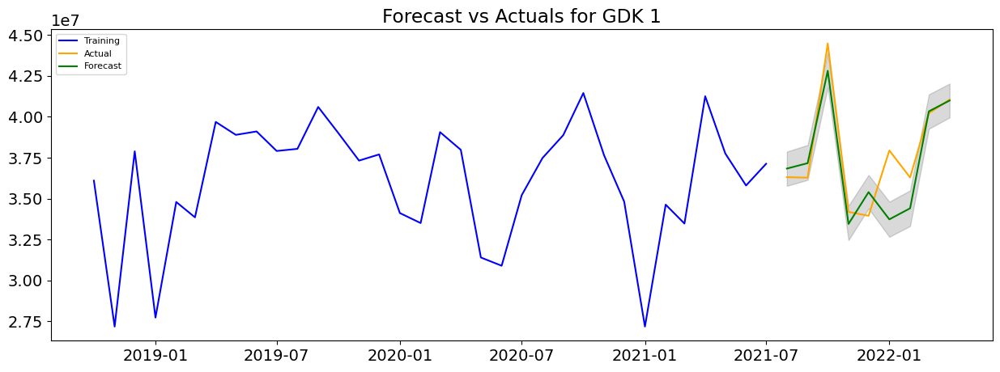

Root Mean Squared Error for GDK_1: 1756845.82
Mean Absolute Percentage Error for GDK_1: 3.42 %


23:19:14 - cmdstanpy - INFO - Chain [1] start processing
23:19:15 - cmdstanpy - INFO - Chain [1] done processing


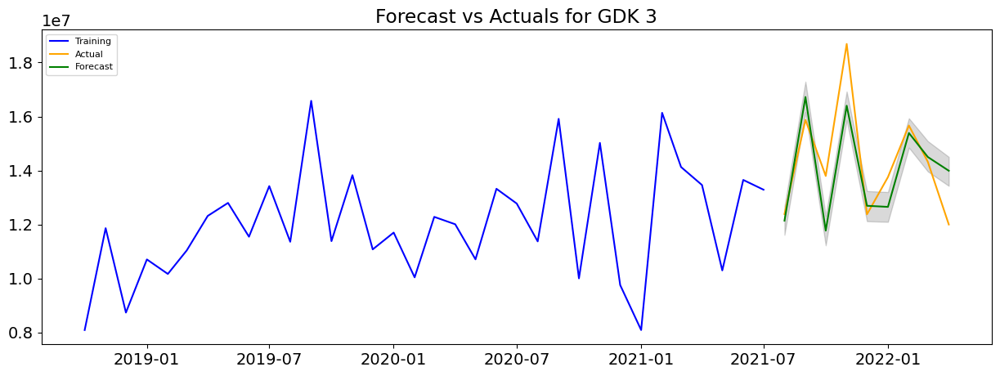

Root Mean Squared Error for GDK_3: 1312025.92
Mean Absolute Percentage Error for GDK_3: 7.15 %


23:19:16 - cmdstanpy - INFO - Chain [1] start processing
23:19:17 - cmdstanpy - INFO - Chain [1] done processing


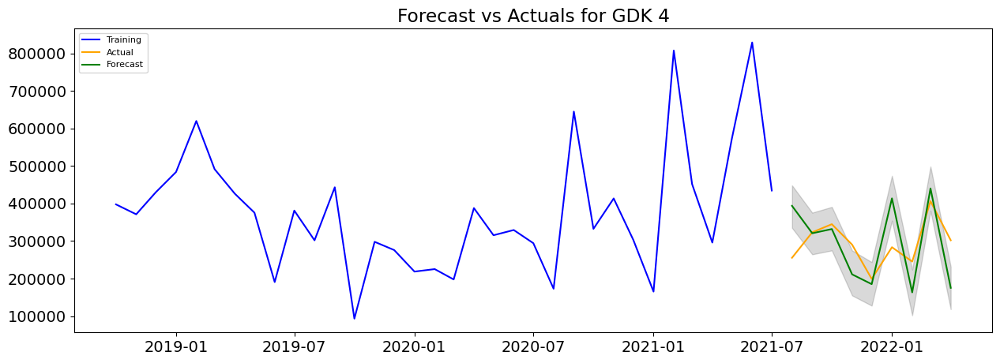

Root Mean Squared Error for GDK_4: 86107.16
Mean Absolute Percentage Error for GDK_4: 24.75 %


23:19:19 - cmdstanpy - INFO - Chain [1] start processing
23:19:20 - cmdstanpy - INFO - Chain [1] done processing


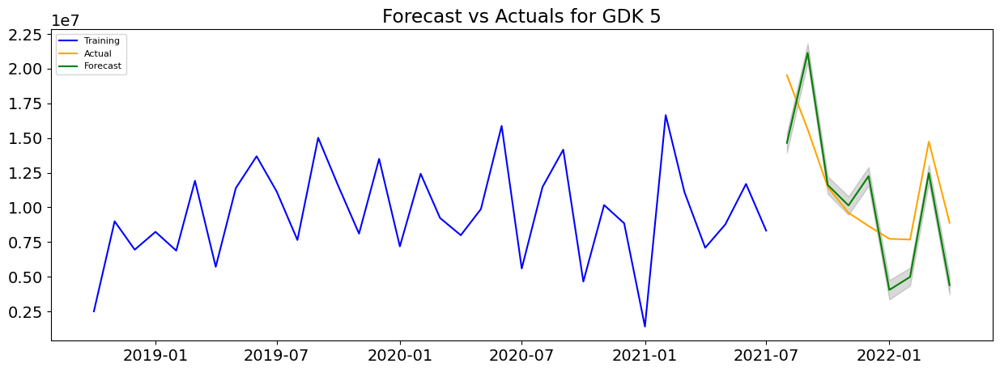

Root Mean Squared Error for GDK_5: 3553411.91
Mean Absolute Percentage Error for GDK_5: 28.59 %


23:19:21 - cmdstanpy - INFO - Chain [1] start processing
23:19:22 - cmdstanpy - INFO - Chain [1] done processing


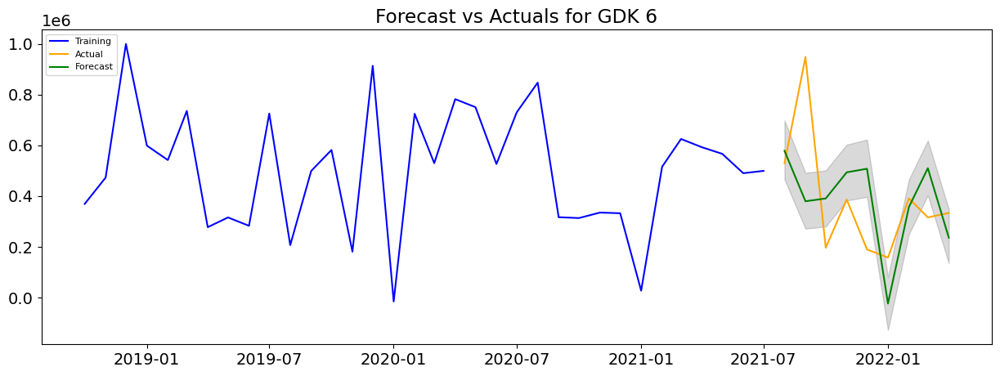

Root Mean Squared Error for GDK_6: 248636.14
Mean Absolute Percentage Error for GDK_6: 64.11 %


23:19:23 - cmdstanpy - INFO - Chain [1] start processing
23:19:23 - cmdstanpy - INFO - Chain [1] done processing


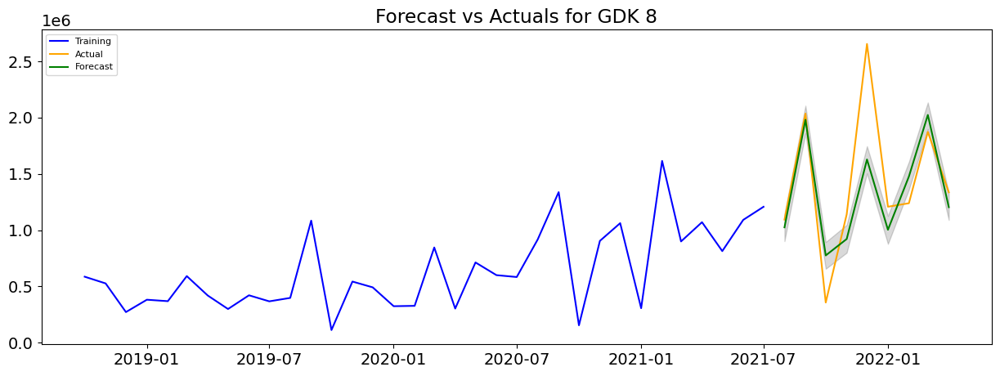

Root Mean Squared Error for GDK_8: 397826.27
Mean Absolute Percentage Error for GDK_8: 26.5 %


23:19:24 - cmdstanpy - INFO - Chain [1] start processing
23:19:25 - cmdstanpy - INFO - Chain [1] done processing


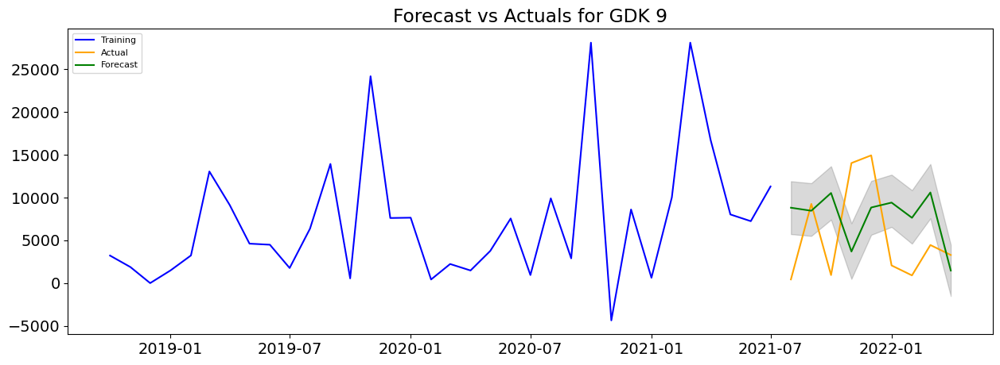

Root Mean Squared Error for GDK_9: 7051.52
Mean Absolute Percentage Error for GDK_9: 487.12 %


23:19:26 - cmdstanpy - INFO - Chain [1] start processing
23:19:26 - cmdstanpy - INFO - Chain [1] done processing


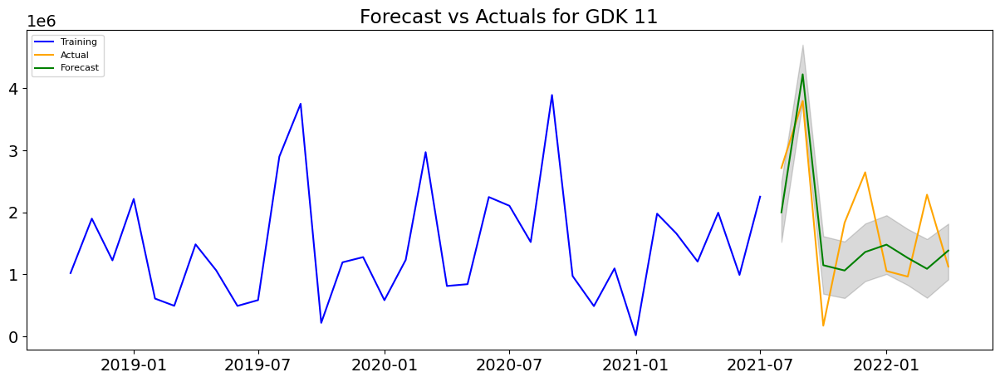

23:19:27 - cmdstanpy - INFO - Chain [1] start processing


Root Mean Squared Error for GDK_11: 792597.41
Mean Absolute Percentage Error for GDK_11: 92.85 %


23:19:27 - cmdstanpy - INFO - Chain [1] done processing


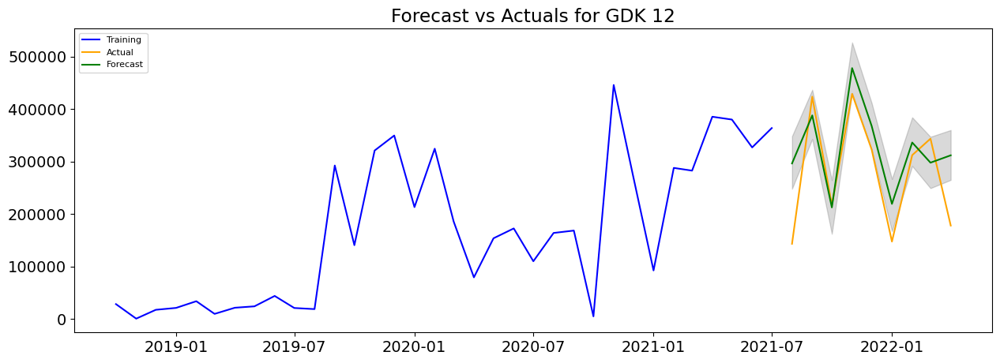

Root Mean Squared Error for GDK_12: 78016.31
Mean Absolute Percentage Error for GDK_12: 31.9 %


23:19:28 - cmdstanpy - INFO - Chain [1] start processing
23:19:29 - cmdstanpy - INFO - Chain [1] done processing


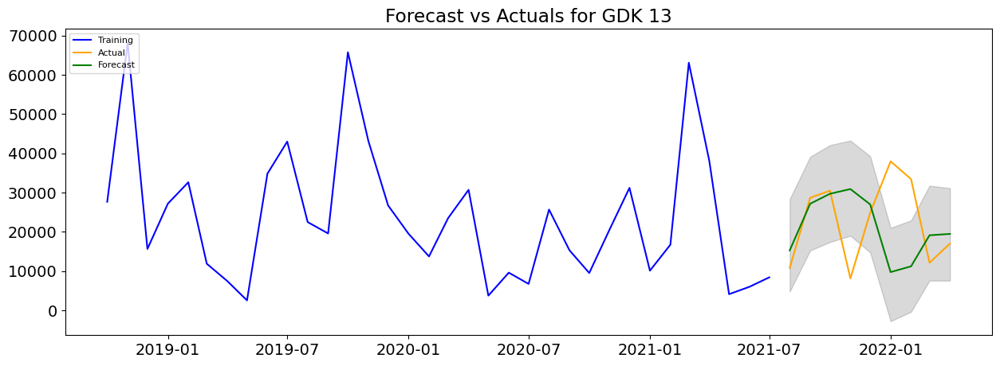

Root Mean Squared Error for GDK_13: 14495.51
Mean Absolute Percentage Error for GDK_13: 61.16 %


23:19:30 - cmdstanpy - INFO - Chain [1] start processing
23:19:30 - cmdstanpy - INFO - Chain [1] done processing


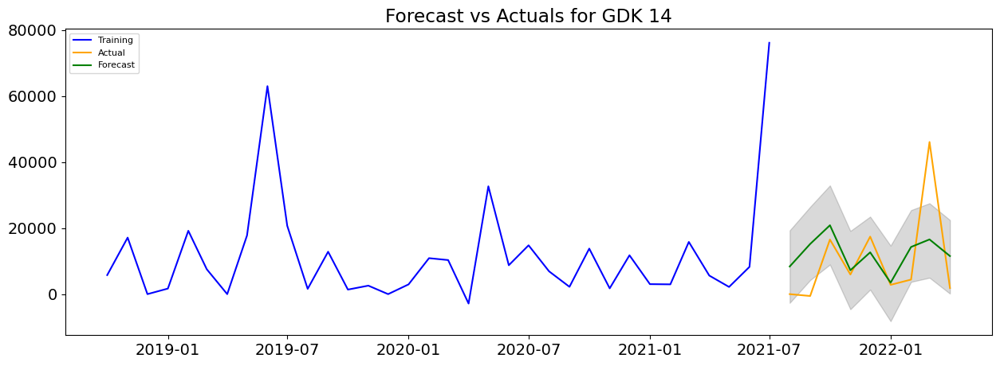

Root Mean Squared Error for GDK_14: 12586.24
Mean Absolute Percentage Error for GDK_14: 93545.49 %


23:19:31 - cmdstanpy - INFO - Chain [1] start processing
23:19:32 - cmdstanpy - INFO - Chain [1] done processing


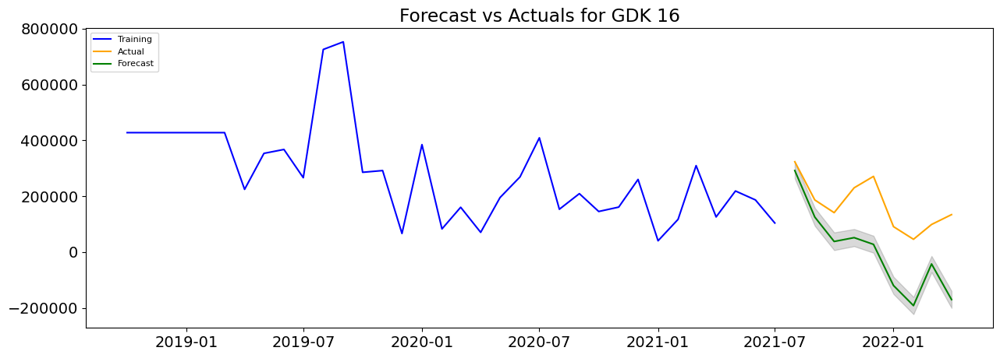

Root Mean Squared Error for GDK_16: 188620.15
Mean Absolute Percentage Error for GDK_16: 156.12 %


23:19:33 - cmdstanpy - INFO - Chain [1] start processing
23:19:33 - cmdstanpy - INFO - Chain [1] done processing


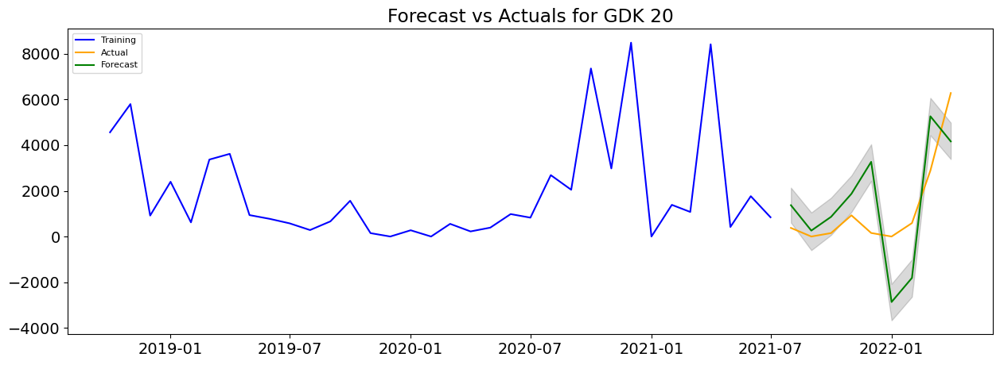

Root Mean Squared Error for GDK_20: 2006.94
Mean Absolute Percentage Error for GDK_20: 35095.57 %


23:19:34 - cmdstanpy - INFO - Chain [1] start processing
23:19:35 - cmdstanpy - INFO - Chain [1] done processing


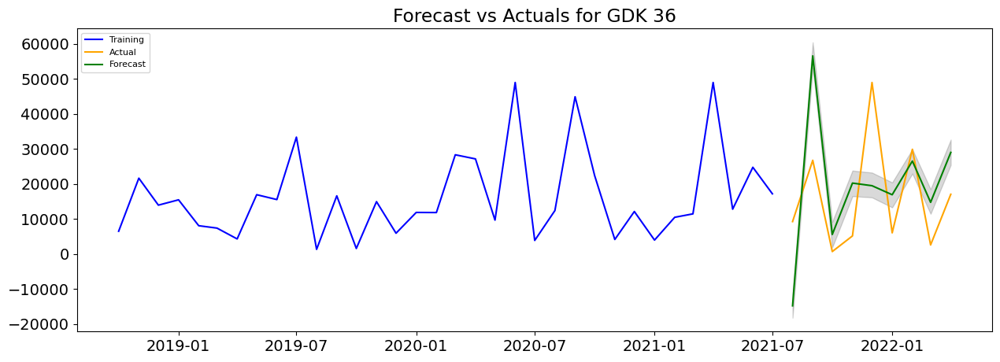

Root Mean Squared Error for GDK_36: 18274.62
Mean Absolute Percentage Error for GDK_36: 242.95 %


In [206]:
from sklearn.metrics import mean_absolute_error

def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Initialize Prophet
    model = Prophet()
    # Dinamically get the list of features for the current dataset
    features = globals()[f"GDK_{num}_features"]
    # Add each feature in the list as a regressor to the Prophet model
    for feature in features:
        model.add_regressor(feature)
        
    # Fit the model to the train data
    model.fit(globals()[f"prophet_gdk_{num}_train"])
    # Use the trained model to make forecasts on the test data
    prophet_gdk_forecast = model.predict(globals()[f"prophet_gdk_{num}_test"])
    
    # Compute the performance metrics: MSE, MAPE, and RMSE between the actual values and the forecasted ones
    mse = mean_squared_error(y_true=globals()[f"prophet_gdk_{num}_test"]['y'],
                             y_pred=prophet_gdk_forecast['yhat'])
    mape = mean_absolute_percentage_error(y_true=globals()[f"prophet_gdk_{num}_test"]['y'],
                                          y_pred=prophet_gdk_forecast['yhat'])
    rmse = np.sqrt(mse)
    
    # Set visualization
    f, ax = plt.subplots(1)
    f.set_figheight(5)
    f.set_figwidth(15)
    
    # Plot train data
    ax.plot(globals()[f"prophet_gdk_{num}_train"]['ds'], globals()[f"prophet_gdk_{num}_train"]['y'], color='blue', label='Training')
    # Plot test data and forecast
    ax.plot(globals()[f"prophet_gdk_{num}_test"]['ds'], globals()[f"prophet_gdk_{num}_test"]['y'], color='orange', label='Actual')
    ax.plot(prophet_gdk_forecast['ds'], prophet_gdk_forecast['yhat'], color='green', label='Forecast')
    ax.fill_between(prophet_gdk_forecast['ds'], prophet_gdk_forecast['yhat_lower'], prophet_gdk_forecast['yhat_upper'], color='k', alpha=0.15)
    
    # Add title and legend
    ax.set_title(f'Forecast vs Actuals for GDK {num}')
    ax.legend(loc='upper left', fontsize=8)
    plt.show()
   
    # Print RMSE and MAPE metrics
    print(f'Root Mean Squared Error for GDK_{num}:', round(rmse, 2))
    print(f'Mean Absolute Percentage Error for GDK_{num}:', round(mape, 2), '%')

## 7.2 XGBoost - train & validation for every product

In [207]:
# Train and Validation datasets for XGBoost preparation

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Create the dataset name based on the current number
    dataset_name = f"df_gdk_{num}"
    # Create the name that will be used with XGBoost
    xgboost_dataset_name = f"xgboost_gdk_{num}"
    # Copy the original dataset to the XGBoost dataset --> preserve the original
    globals()[xgboost_dataset_name] = globals()[dataset_name].copy()
    
    # Define the date which will be used to split the data into training and validation
    split_date = '2021-07'
    # Create the training set: before and equal to the split date
    train_set = globals()[xgboost_dataset_name][globals()[xgboost_dataset_name].index <= split_date].copy()
    # Create the test set: after the split date
    test_set = globals()[xgboost_dataset_name][globals()[xgboost_dataset_name].index > split_date].copy()
    
    # Define the target variable column name
    target=[f"GDK_{num}"]
    # Extract the target variable for train and test and drop it after --> isolate the feature sets
    y_train = train_set[f"GDK_{num}"]
    x_train = train_set.drop(columns= target)  
    y_test = test_set[f"GDK_{num}"]
    x_test = test_set.drop(columns= target)  

    # Initialize a scaler for data normalization
    scaler = StandardScaler()
    # Scale the feature sets
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(x_test)
    # Convert scaled data back to DataFrame --> compatibility with XGBoost
    scaled_data_train = pd.DataFrame(x_train_scaled, index=x_train.index, columns=x_train.columns)
    scaled_data_test = pd.DataFrame(x_test_scaled, index=x_test.index, columns=x_test.columns)

    # Ensure target data is in DataFrame format --> consistency
    if isinstance(y_test, pd.Series):
        y_test = y_test.to_frame()
    if isinstance(y_train, pd.Series):
        y_train = y_train.to_frame()

    # Store the prepared data
    globals()[f"xgboost_gdk_{num}_train_x_scaled"] = scaled_data_train
    globals()[f"xgboost_gdk_{num}_test_x_scaled"] = scaled_data_test
    globals()[f"xgboost_gdk_{num}_train_x"] = x_train 
    globals()[f"xgboost_gdk_{num}_test_x"] = x_test
    globals()[f"xgboost_gdk_{num}_train_y"] = y_train
    globals()[f"xgboost_gdk_{num}_test_y"] = y_test

Test RMSE for GDK_1: 2259849.49
Test MAPE for GDK_1: 4.69%


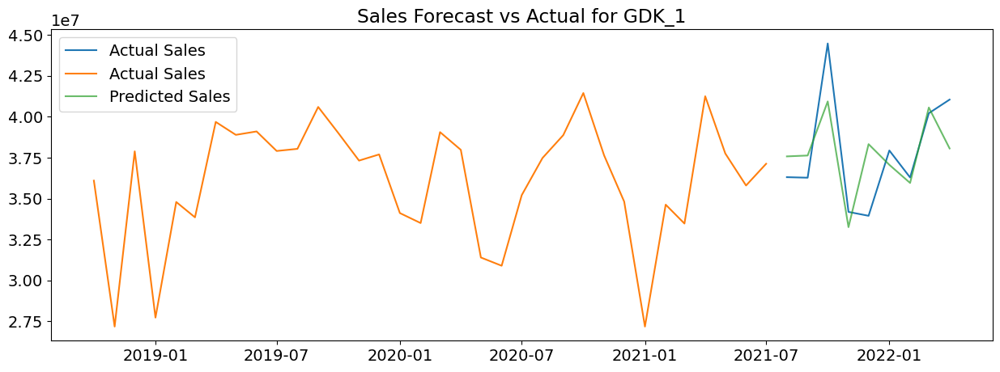

Test RMSE for GDK_3: 2001356.59
Test MAPE for GDK_3: 9.40%


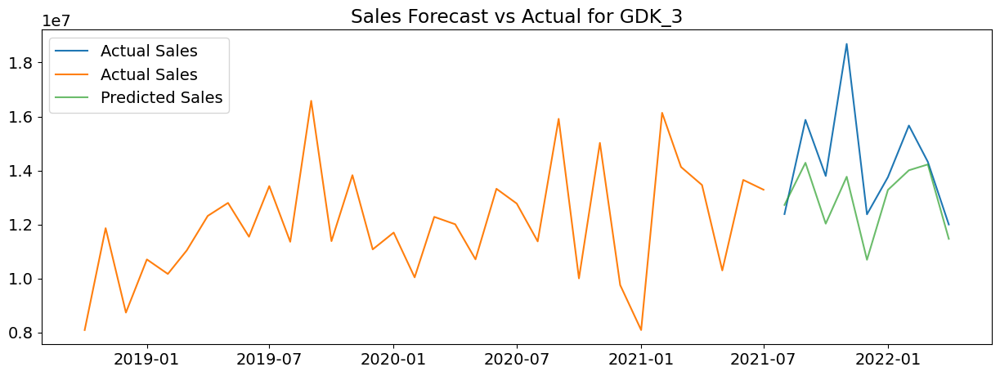

Test RMSE for GDK_4: 67682.54
Test MAPE for GDK_4: 17.38%


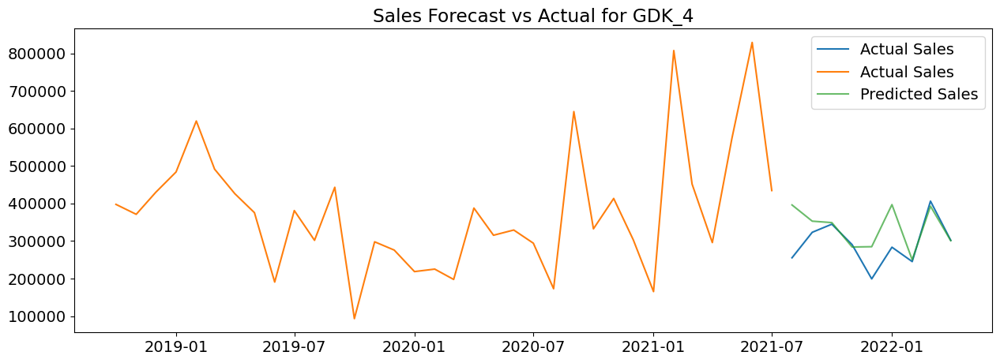

Test RMSE for GDK_5: 4105563.53
Test MAPE for GDK_5: 19.33%


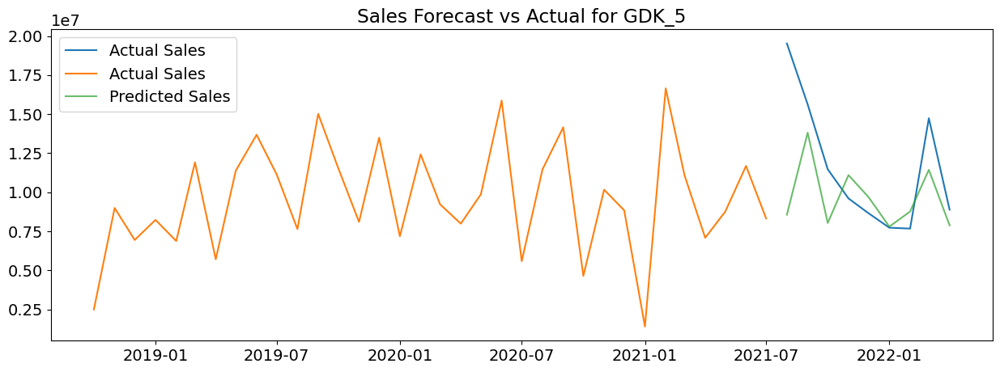

Test RMSE for GDK_6: 193028.20
Test MAPE for GDK_6: 56.78%


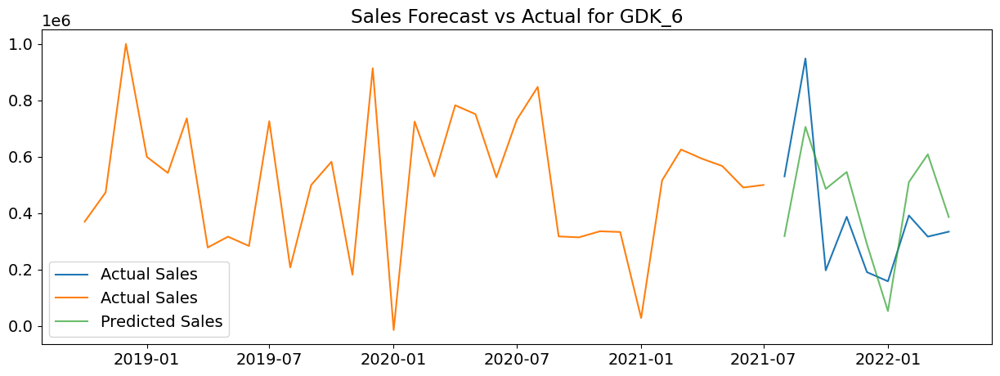

Test RMSE for GDK_8: 527526.53
Test MAPE for GDK_8: 36.73%


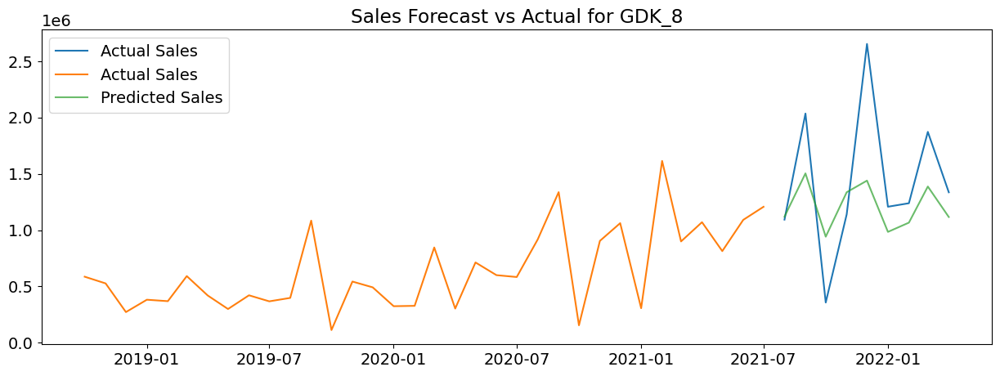

Test RMSE for GDK_9: 6605.21
Test MAPE for GDK_9: 425.43%


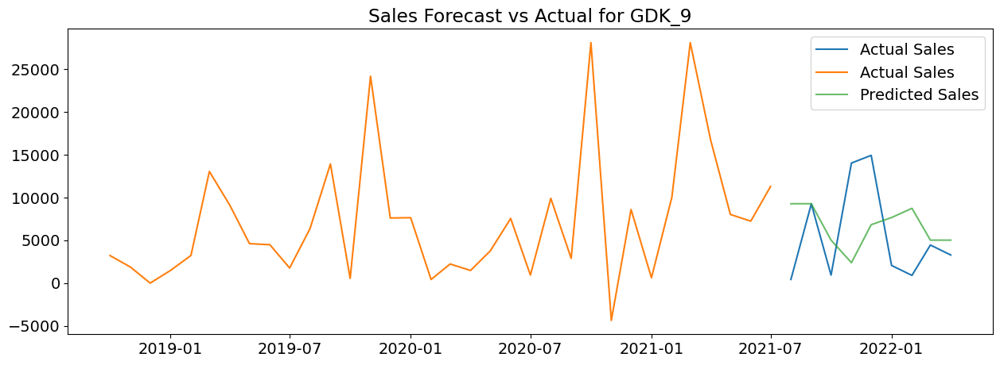

Test RMSE for GDK_11: 882826.47
Test MAPE for GDK_11: 70.32%


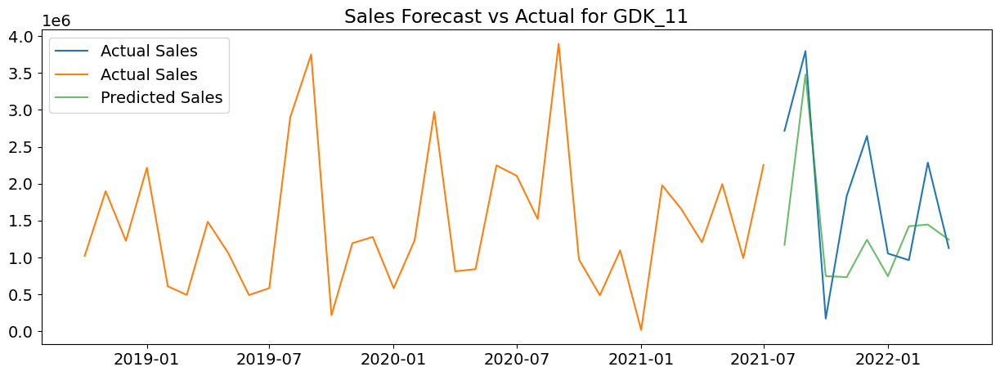

Test RMSE for GDK_12: 50310.34
Test MAPE for GDK_12: 15.54%


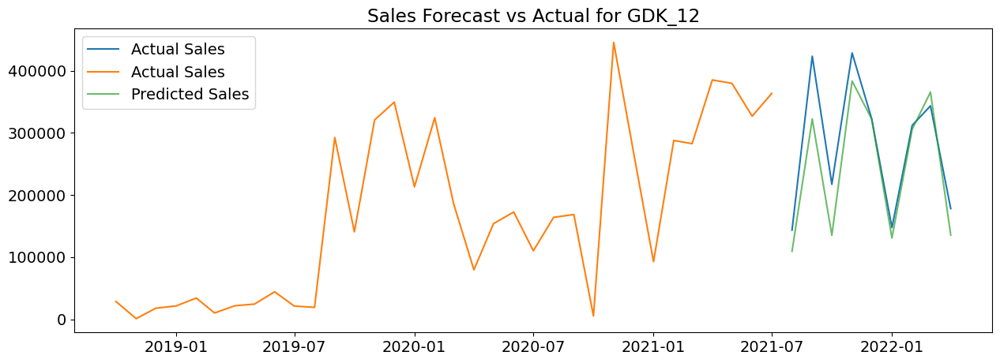

Test RMSE for GDK_13: 11622.46
Test MAPE for GDK_13: 67.95%


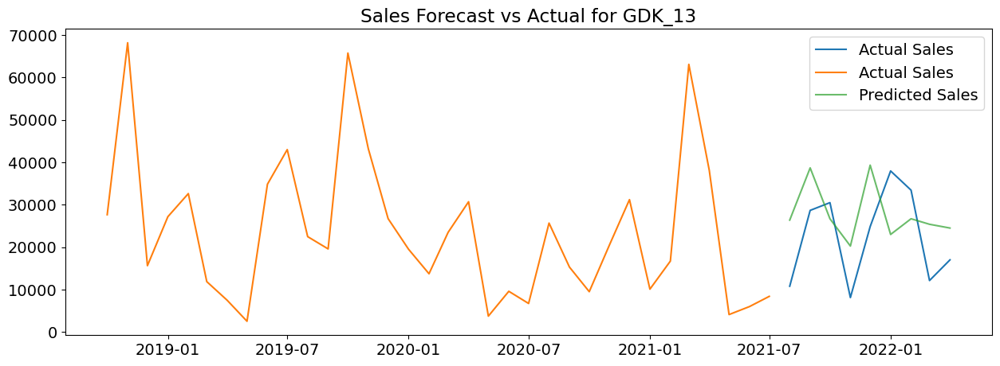

Test RMSE for GDK_14: 13710.92
Test MAPE for GDK_14: 34143.79%


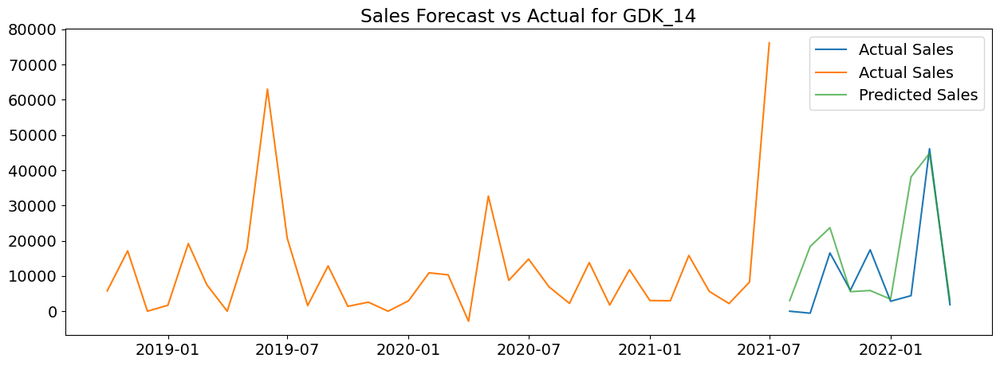

Test RMSE for GDK_16: 48145.72
Test MAPE for GDK_16: 21.83%


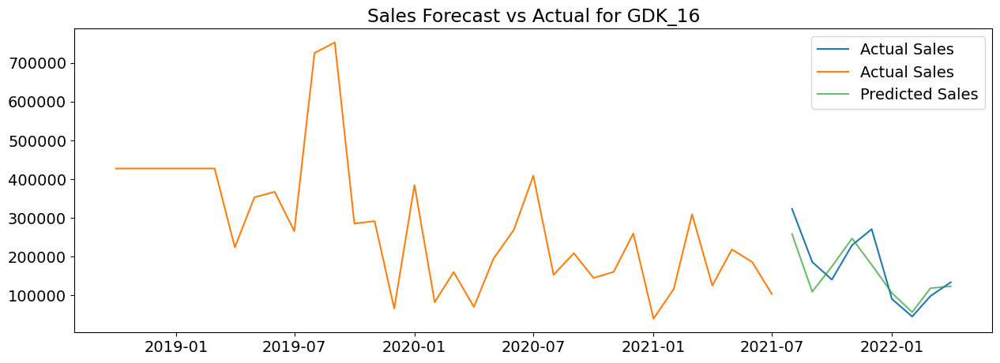

Test RMSE for GDK_20: 1093.75
Test MAPE for GDK_20: 6637.44%


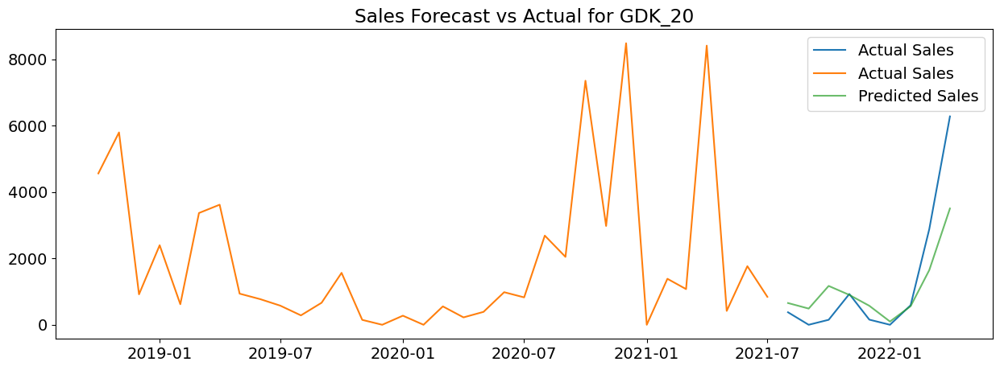

Test RMSE for GDK_36: 7775.59
Test MAPE for GDK_36: 84.94%


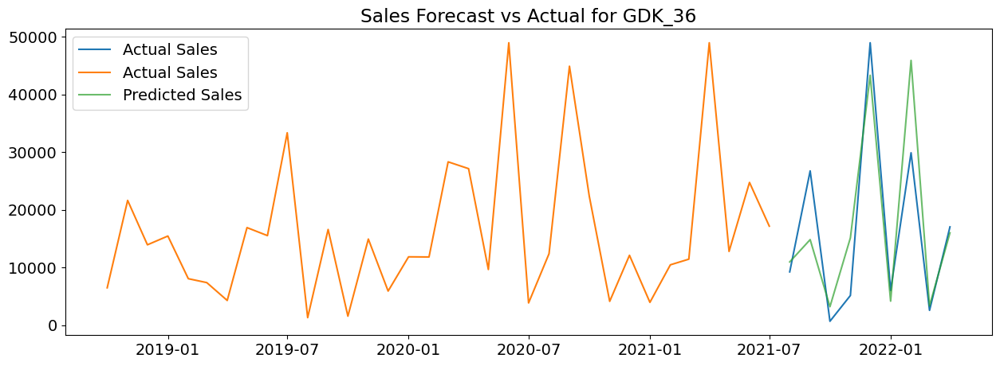

In [208]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Load scaled train and testing feature data, along with their corresponding target values
    train_x_scaled = globals()[f'xgboost_gdk_{num}_train_x_scaled']
    test_x_scaled = globals()[f'xgboost_gdk_{num}_test_x_scaled']
    train_y = globals()[f'xgboost_gdk_{num}_train_y']
    test_y = globals()[f'xgboost_gdk_{num}_test_y']

    # Prepare DMatrix for XGBoost
    dtrain = xgb.DMatrix(train_x_scaled, label=train_y)
    dtest = xgb.DMatrix(test_x_scaled, label=test_y)

    # Define model parameters
    params = {
        'max_depth': 5,
        'eta': 0.1,
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse'
    }
    num_round = 100

    # Train the model with early stopping if the test RMSE doesn't improve for 10 rounds
    model = xgb.train(params, dtrain, num_round, evals=[(dtest, "Test")], early_stopping_rounds=10, verbose_eval=False)

    # Make predictions for the test set
    y_pred_test = model.predict(dtest)

    # Add predictions to the scaled test DataFrame
    globals()[f'xgboost_gdk_{num}_test_x_scaled'][f'{num}_Prediction'] = y_pred_test

    # Evaluate performance on the test set: MSE, RMSE and MAPE metrics
    mse_test = mean_squared_error(test_y, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    mape_test = mean_absolute_percentage_error(test_y, y_pred_test) * 100

    # Show performance metrics results
    print(f'Test RMSE for GDK_{num}: {rmse_test:.2f}')
    print(f'Test MAPE for GDK_{num}: {mape_test:.2f}%')

    # Plot the actual vs. predicted values --> visually access model performance
    plt.figure(figsize=(15, 5))
    plt.plot(test_y.index, test_y, label='Actual Sales')
    plt.plot(train_y.index, train_y, label='Actual Sales')
    plt.plot(test_y.index, y_pred_test, label='Predicted Sales', alpha=0.7)
    plt.title(f'Sales Forecast vs Actual for GDK_{num}')
    plt.legend()
    plt.show()

    # Optionally: Making predictions for the future period if "X_future" is defined for each product
    # Ensure "X_future" is prepared similarly to how "train_x_scaled" and "test_x_scaled" are prepared
    # X_future = globals()[f'xgboost_gdk_{num}_future_x_scaled'] # Assuming this exists

## 7.3 SARIMAX train & validation models for every product

In [209]:
# Train and Validation datasets preparation for ARIMA 

import pmdarima as pm

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Create the dataset name based on the current number
    dataset_name = f"df_gdk_{num}"
    # Create the name that will be used with ARIMA
    arima_dataset_name = f"arima_gdk_{num}"
    # Copy the original dataset to the ARIMA dataset --> preserve the original
    globals()[arima_dataset_name] = globals()[dataset_name].copy()
    
    # Define the date which will be used to split the data into training and validation
    split_date = '2021-07'
    # Create the training set: before and equal to the split date
    train_set = globals()[arima_dataset_name][globals()[arima_dataset_name].index <= split_date].copy()
    # Create the test set: after the split date
    test_set = globals()[arima_dataset_name][globals()[arima_dataset_name].index > split_date].copy()
    
    # Store the prepared train and test sets
    globals()[f"arima_gdk_{num}_train"] = train_set
    globals()[f"arima_gdk_{num}_test"] = test_set

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=678.340, Time=0.35 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=706.868, Time=0.05 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=683.348, Time=0.62 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=678.712, Time=0.31 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=679.179, Time=0.11 sec
 ARIMA(1,2,1)(1,1,1)[12]             : AIC=680.229, Time=0.71 sec
 ARIMA(1,2,1)(0,1,2)[12]             : AIC=680.208, Time=0.76 sec
 ARIMA(1,2,1)(1,1,0)[12]             : AIC=678.709, Time=0.29 sec
 ARIMA(1,2,1)(1,1,2)[12]             : AIC=682.139, Time=1.30 sec
 ARIMA(1,2,0)(0,1,1)[12]             : AIC=682.737, Time=0.25 sec
 ARIMA(2,2,1)(0,1,1)[12]             : AIC=678.994, Time=0.55 sec
 ARIMA(1,2,2)(0,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(0,2,0)(0,1,1)[12]             : AIC=695.050, Time=0.14 sec
 ARIMA(0,2,2)(0,1,1)[12]             : AIC=679.397, Time=0.33 sec
 ARIMA(2,2,0)(0,1,1)[12]             

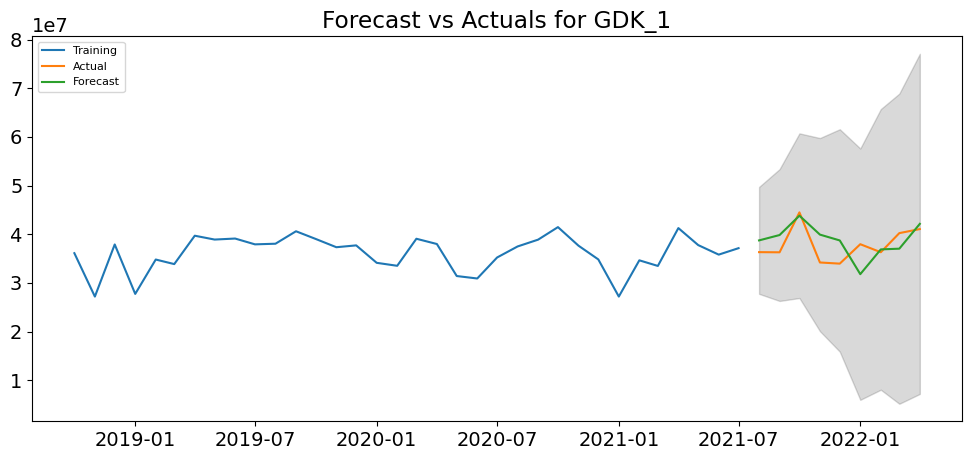

RMSE for GDK_1 with number 1: 3712102.1
MAPE for GDK_1 with number 1: 8.57%
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=688.849, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=688.556, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=687.322, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=686.853, Time=0.21 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=686.343, Time=0.02 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=687.080, Time=0.15 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=688.266, Time=0.09 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=686.384, Time=0.09 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept   : AIC=687.813, Time=0.09 sec

Best model:  ARIMA(0,1,1)(0,1,0)[12]          
Total fit time: 2.574 seconds


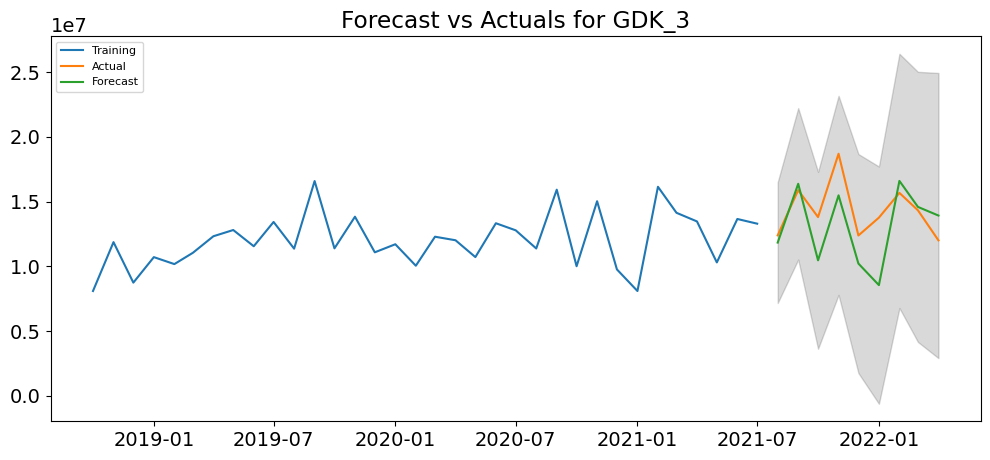

RMSE for GDK_3 with number 3: 2548446.27
MAPE for GDK_3 with number 3: 14.23%
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=582.499, Time=0.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=586.942, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=584.532, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=580.649, Time=0.27 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=581.235, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=582.594, Time=0.31 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=582.585, Time=0.47 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=580.801, Time=0.17 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=584.581, Time=0.79 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=585.200, Time=0.12 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=582.484, Time=0.67 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=584.331, Time=0.27 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=583.435, Time=0.77 sec
 ARIMA(0,1,1)(0,1,1)[

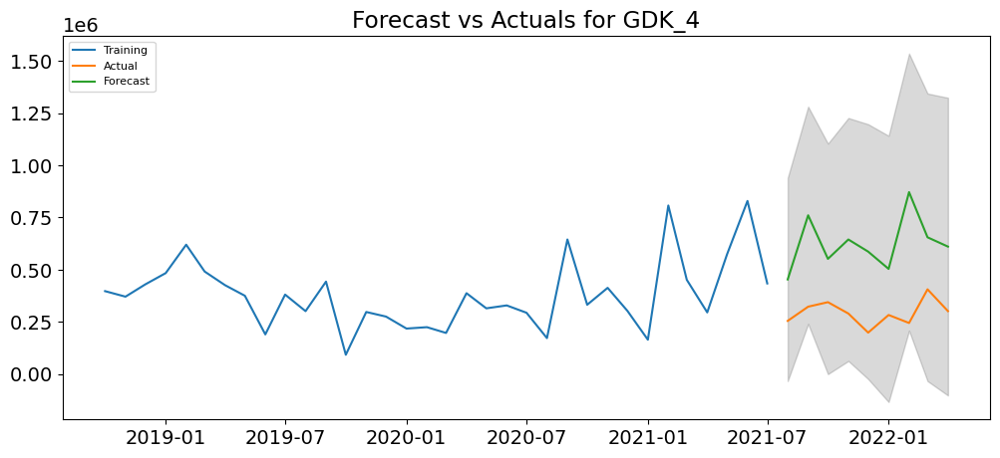

RMSE for GDK_4 with number 4: 357156.75
MAPE for GDK_4 with number 4: 120.7%
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=710.163, Time=0.36 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=723.148, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=711.596, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=709.582, Time=0.26 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=713.428, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=711.405, Time=0.43 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=711.401, Time=0.55 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=710.038, Time=0.12 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=713.397, Time=0.49 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=718.769, Time=0.13 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=709.584, Time=0.26 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=711.628, Time=0.27 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=711.502, Time=0.33 sec
 ARIMA(0,1,1)(0,1,1)[1

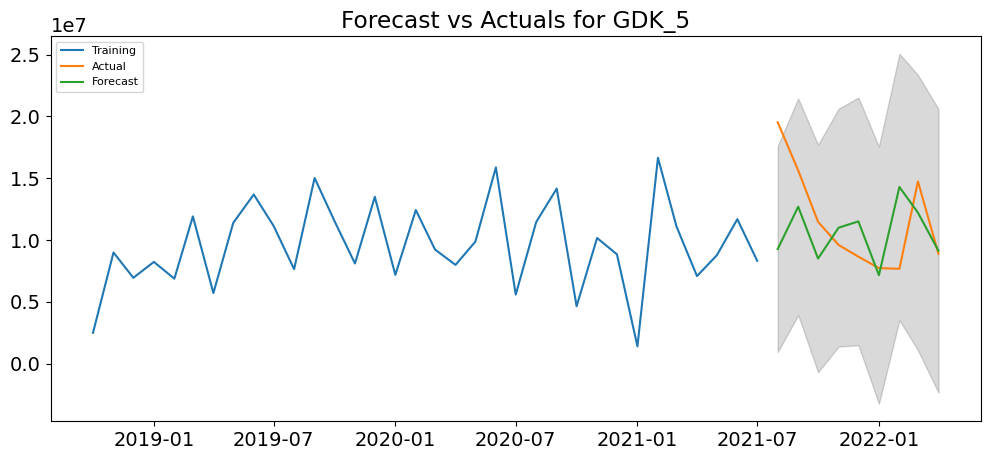

RMSE for GDK_5 with number 5: 4511660.37
MAPE for GDK_5 with number 5: 28.68%
Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=571.296, Time=0.39 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=608.400, Time=0.05 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=582.275, Time=0.24 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=582.826, Time=0.29 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=572.633, Time=0.12 sec
 ARIMA(1,2,1)(1,1,1)[12]             : AIC=573.287, Time=0.63 sec
 ARIMA(1,2,1)(0,1,2)[12]             : AIC=573.280, Time=0.74 sec
 ARIMA(1,2,1)(1,1,0)[12]             : AIC=572.481, Time=0.44 sec
 ARIMA(1,2,1)(1,1,2)[12]             : AIC=575.068, Time=0.99 sec
 ARIMA(1,2,0)(0,1,1)[12]             : AIC=581.914, Time=0.22 sec
 ARIMA(2,2,1)(0,1,1)[12]             : AIC=572.650, Time=0.57 sec
 ARIMA(1,2,2)(0,1,1)[12]             : AIC=570.709, Time=0.59 sec
 ARIMA(1,2,2)(0,1,0)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(1,2,2)(1,1,1)[12] 

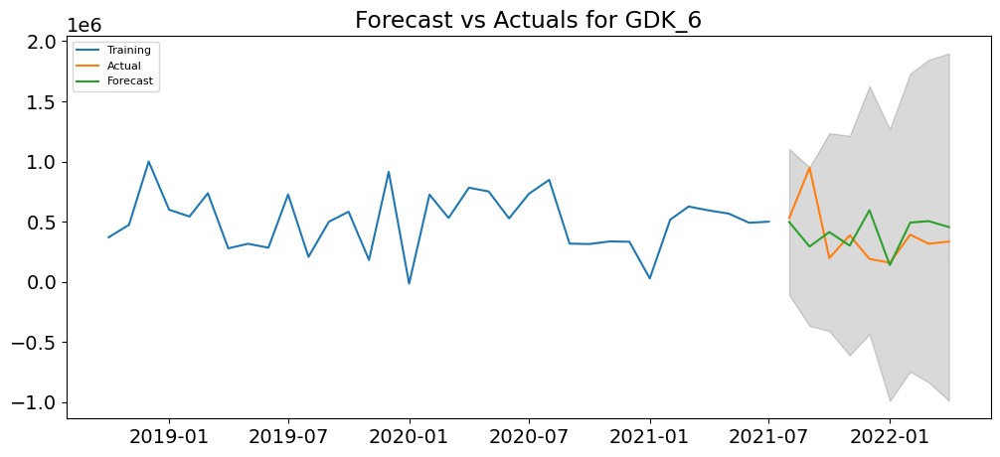

RMSE for GDK_6 with number 6: 280786.59
MAPE for GDK_6 with number 6: 61.63%
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=599.386, Time=0.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=618.342, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=602.785, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=601.832, Time=0.27 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=597.768, Time=0.08 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=599.430, Time=0.37 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=600.311, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=600.821, Time=0.06 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=600.033, Time=0.14 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=599.594, Time=0.13 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=inf, Time=0.07 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=599.065, Time=0.10 sec
 ARIMA(2,1,2)(0,1,0)[12]      

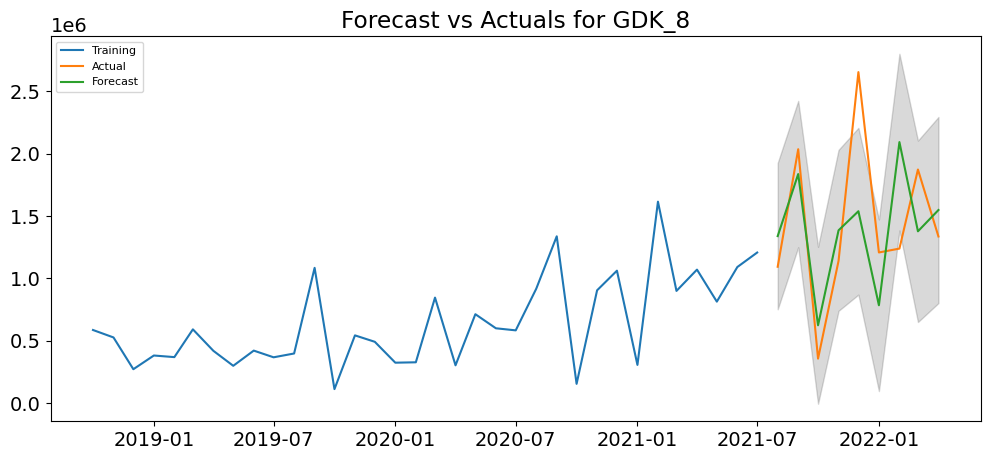

RMSE for GDK_8 with number 8: 545438.77
MAPE for GDK_8 with number 8: 35.25%
Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=448.406, Time=0.33 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=477.697, Time=0.06 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=inf, Time=1.44 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=460.206, Time=0.21 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(1,2,1)(1,1,1)[12]             : AIC=446.008, Time=1.23 sec
 ARIMA(1,2,1)(1,1,0)[12]             : AIC=444.040, Time=0.95 sec
 ARIMA(1,2,1)(2,1,0)[12]             : AIC=446.190, Time=1.63 sec
 ARIMA(1,2,1)(2,1,1)[12]             : AIC=448.082, Time=2.37 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(2,2,1)(1,1,0)[12]             : AIC=446.296, Time=1.43 sec
 ARIMA(1,2,2)(1,1,0)[12]             : AIC=444.860, Time=1.34 sec
 ARIMA(0,2,0)(1,1,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,2,2)(1,1,0)[12]             :

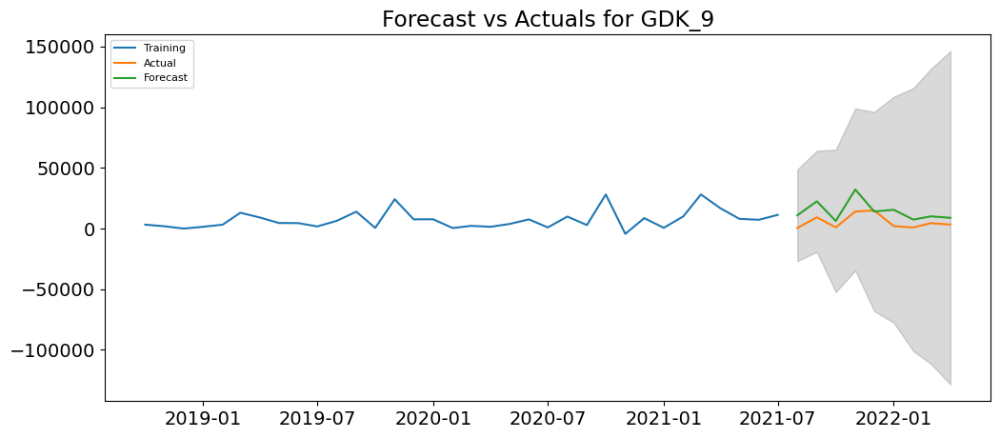

RMSE for GDK_9 with number 9: 10164.22
MAPE for GDK_9 with number 9: 549.28%
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=654.189, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=665.630, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=657.461, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=652.339, Time=0.36 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=653.852, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=654.335, Time=0.46 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=654.333, Time=0.61 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=652.492, Time=0.22 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=656.320, Time=1.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=659.063, Time=0.12 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=652.469, Time=0.57 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=657.582, Time=0.17 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=652.378, Time=0.39 sec
 ARIMA(0,1,1)(0,1,1)[1

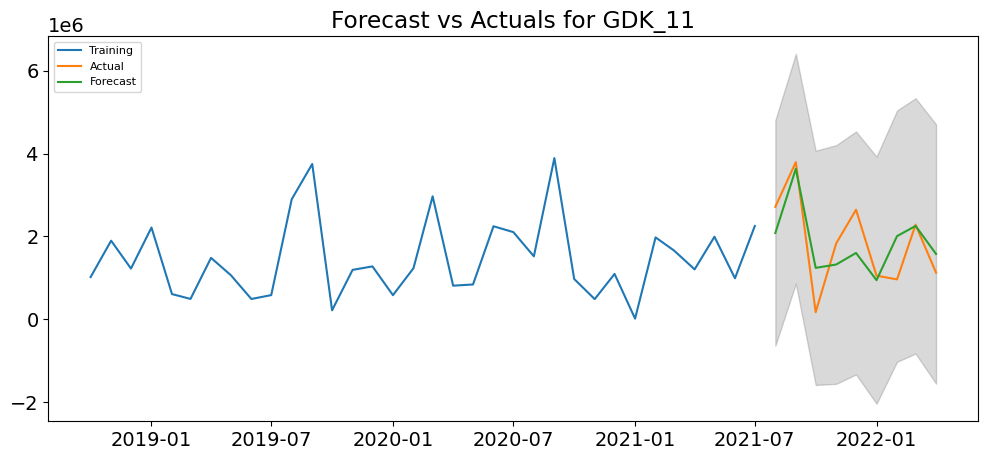

RMSE for GDK_11 with number 11: 684899.79
MAPE for GDK_11 with number 11: 96.66%
Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=539.035, Time=0.31 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=551.312, Time=0.03 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=547.508, Time=0.17 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=537.429, Time=0.27 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=535.636, Time=0.04 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=537.444, Time=0.25 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=539.426, Time=0.32 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=537.390, Time=0.06 sec
 ARIMA(0,2,2)(0,1,0)[12]             : AIC=538.314, Time=0.23 sec
 ARIMA(1,2,0)(0,1,0)[12]             : AIC=545.863, Time=0.05 sec
 ARIMA(1,2,2)(0,1,0)[12]             : AIC=537.337, Time=0.31 sec
 ARIMA(0,2,1)(0,1,0)[12] intercept   : AIC=537.645, Time=0.08 sec

Best model:  ARIMA(0,2,1)(0,1,0)[12]          
Total fit time: 2.163 seconds


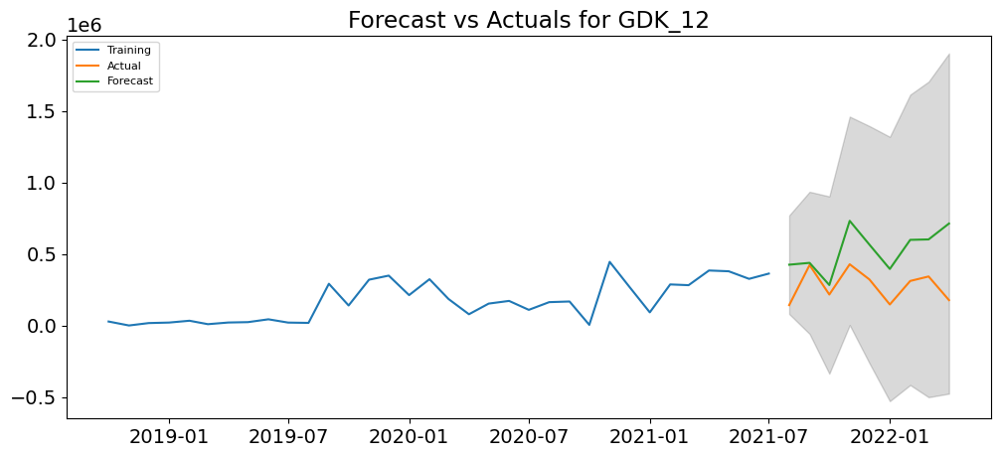

RMSE for GDK_12 with number 12: 285457.27
MAPE for GDK_12 with number 12: 112.57%
Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=469.915, Time=0.31 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=488.906, Time=0.05 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=479.710, Time=0.19 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=468.501, Time=0.26 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=469.315, Time=0.07 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=470.498, Time=0.45 sec
 ARIMA(0,2,1)(0,1,2)[12]             : AIC=470.497, Time=0.51 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=469.288, Time=0.30 sec
 ARIMA(0,2,1)(1,1,2)[12]             : AIC=472.430, Time=0.78 sec
 ARIMA(0,2,0)(0,1,1)[12]             : AIC=481.080, Time=0.15 sec
 ARIMA(0,2,2)(0,1,1)[12]             : AIC=469.997, Time=0.38 sec
 ARIMA(1,2,0)(0,1,1)[12]             : AIC=478.202, Time=0.26 sec
 ARIMA(1,2,2)(0,1,1)[12]             : AIC=472.094, Time=0.59 sec
 ARIMA(0,2,1)(0,1

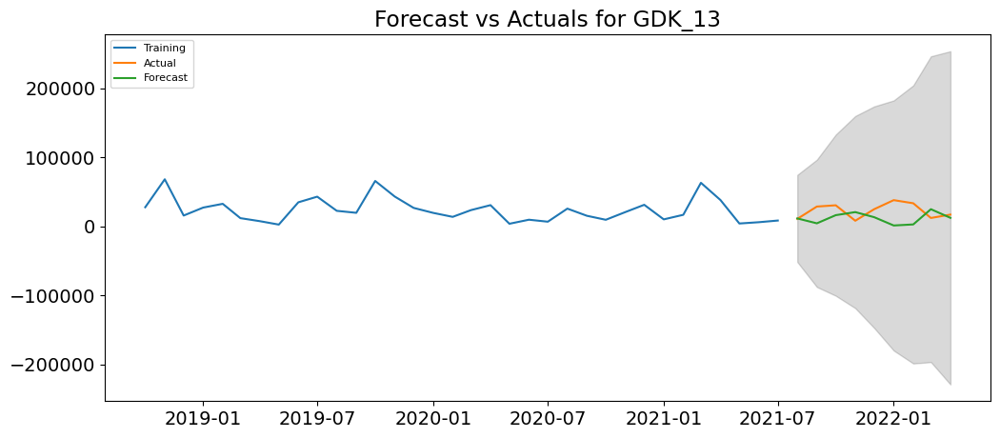

RMSE for GDK_13 with number 13: 19882.31
MAPE for GDK_13 with number 13: 73.15%
Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=471.265, Time=0.31 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=488.347, Time=0.06 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=478.770, Time=0.30 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=471.242, Time=0.27 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=471.879, Time=0.11 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=473.226, Time=0.37 sec
 ARIMA(0,2,1)(0,1,2)[12]             : AIC=473.210, Time=0.43 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=472.077, Time=0.31 sec
 ARIMA(0,2,1)(1,1,2)[12]             : AIC=475.008, Time=0.68 sec
 ARIMA(0,2,0)(0,1,1)[12]             : AIC=481.552, Time=0.14 sec
 ARIMA(0,2,2)(0,1,1)[12]             : AIC=469.512, Time=0.24 sec
 ARIMA(0,2,2)(0,1,0)[12]             : AIC=469.475, Time=0.15 sec
 ARIMA(0,2,2)(1,1,0)[12]             : AIC=469.538, Time=0.30 sec
 ARIMA(0,2,2)(1,1,1

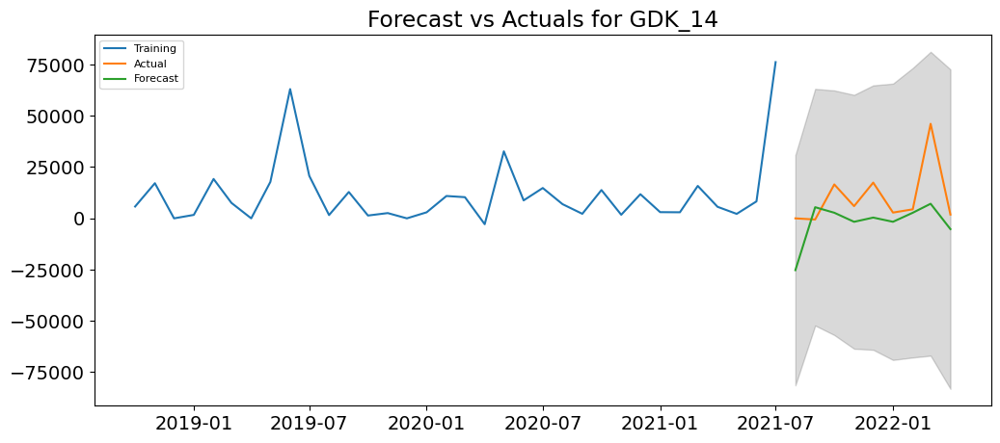

RMSE for GDK_14 with number 14: 17656.99
MAPE for GDK_14 with number 14: 280849.58%
Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=561.095, Time=0.31 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=584.997, Time=0.06 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=561.440, Time=0.43 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=564.475, Time=0.15 sec
 ARIMA(1,2,1)(1,1,1)[12]             : AIC=561.511, Time=0.51 sec
 ARIMA(1,2,1)(0,1,2)[12]             : AIC=561.951, Time=0.44 sec
 ARIMA(1,2,1)(1,1,0)[12]             : AIC=559.533, Time=0.28 sec
 ARIMA(1,2,1)(2,1,0)[12]             : AIC=561.511, Time=0.61 sec
 ARIMA(1,2,1)(2,1,1)[12]             : AIC=563.511, Time=1.18 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=559.560, Time=0.43 sec
 ARIMA(2,2,1)(1,1,0)[12]             : AIC=561.035, Time=0.42 sec
 ARIMA(1,2,2)(1,1,0)[12]             : AIC=559.460, Time=0.44 sec
 ARIMA(1,2,2)(0,1,0

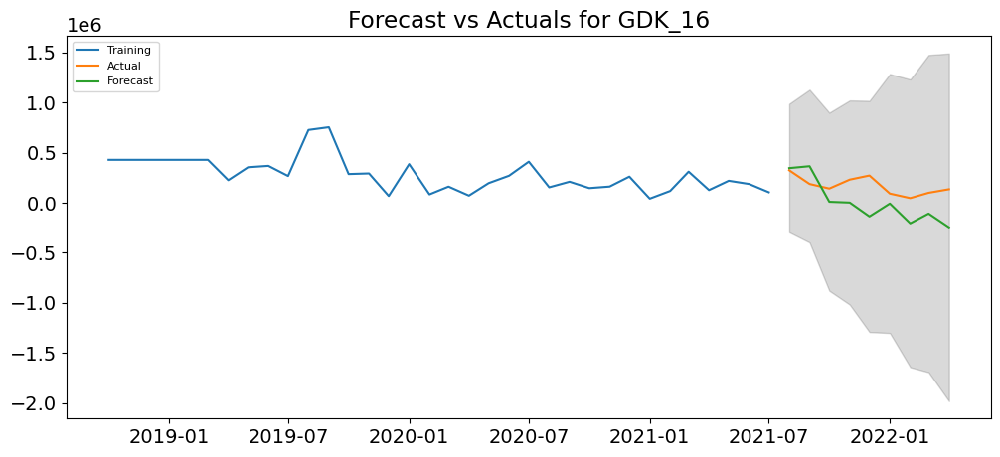

RMSE for GDK_16 with number 16: 242779.74
MAPE for GDK_16 with number 16: 177.94%
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=408.894, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=393.937, Time=0.56 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=401.829, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=395.832, Time=0.87 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=395.833, Time=0.75 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.75 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=410.111, Time=0.41 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=394.988, Time=0.71 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=390.474, Time=0.77 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=403.068, Time=0.11 sec
 ARIMA(1,1,1)(2,1,0)[12]         

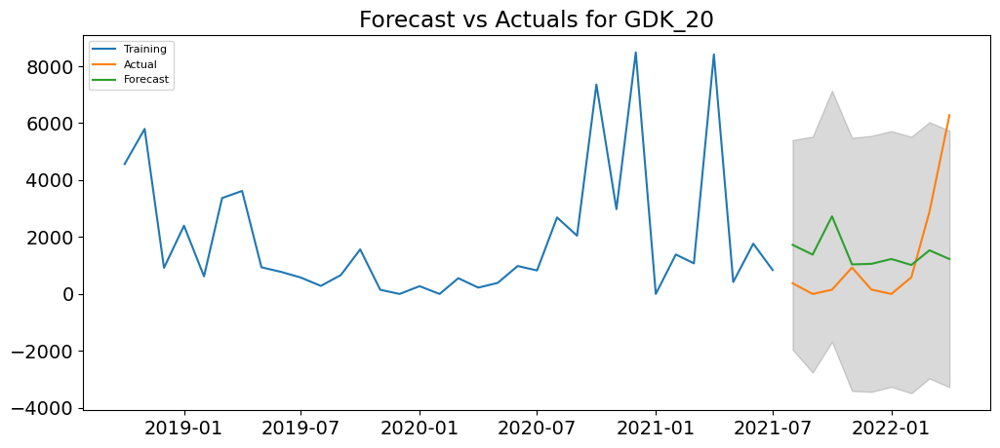

RMSE for GDK_20 with number 20: 2114.92
MAPE for GDK_20 with number 20: 29329.75%
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=477.339, Time=0.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=489.458, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=481.530, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=475.578, Time=0.32 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=475.936, Time=0.05 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=477.570, Time=0.42 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=477.565, Time=0.47 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=475.935, Time=0.25 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=479.554, Time=1.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=486.158, Time=0.20 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=476.622, Time=0.34 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=481.126, Time=0.18 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=477.749, Time=0.52 sec
 ARIMA(0,1,1)(0,1

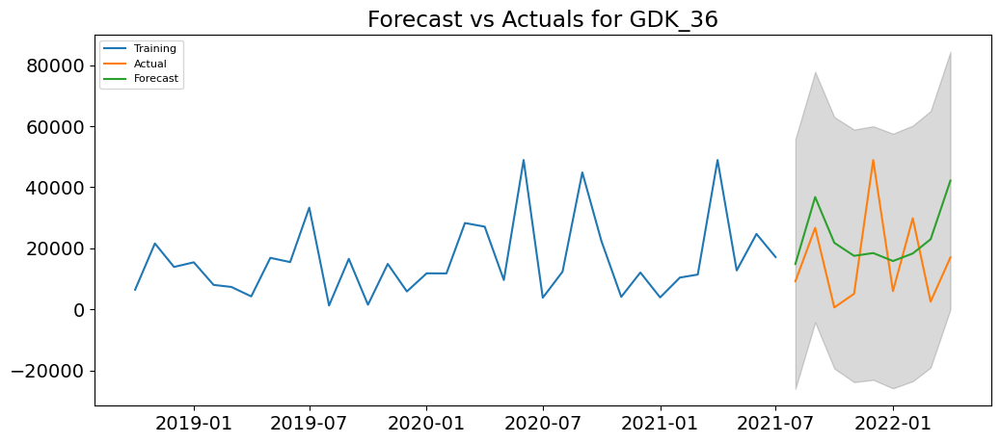

RMSE for GDK_36 with number 36: 18083.38
MAPE for GDK_36 with number 36: 521.03%


In [210]:
from pmdarima import auto_arima

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Load train and test datasets for the current dataset
    train_data = globals()[f"arima_gdk_{num}_train"]
    test_data = globals()[f"arima_gdk_{num}_test"]
    # Load feature names for the current dataset
    features = globals()[f"GDK_{num}_features"]
    
    # Auto-ARIMA model fitting
    sxmodel = auto_arima(train_data[[f'GDK_{num}']], exogenous=train_data[features],
                         start_p=1, start_q=1,
                         test='adf',
                         max_p=3, max_q=3, m=12,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,
                         error_action='ignore',
                         suppress_warnings=True,
                         stepwise=True)

    # Forecasts
    forecast_results = sxmodel.predict(n_periods=len(test_data),
                                       exogenous=test_data[features],
                                       return_conf_int=True)
    fc, conf = forecast_results
    
    #Index for plotting
    index_of_fc = test_data.index
    # Create series for plotting
    fc_series = pd.Series(fc, index=index_of_fc)
    lower_series = pd.Series(conf[:, 0], index=index_of_fc)
    upper_series = pd.Series(conf[:, 1], index=index_of_fc)

    # Plot
    # Visualizes train data, actual test data, forecast, and confidence intervals
    plt.figure(figsize=(12, 5), dpi=100)
    plt.plot(train_data[f'GDK_{num}'], label='Training')  # Ensure this plots the training set
    plt.plot(test_data[f'GDK_{num}'], label='Actual')  # Ensure this plots the testing set correctly
    plt.plot(fc_series, label='Forecast')
    plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=0.15)
    plt.title(f'Forecast vs Actuals for GDK_{num}')
    plt.legend(loc='upper left', fontsize=8)
    plt.show()

    # Calculate Accuracy metrics
    actual_values = test_data[f'GDK_{num}'].values
    def forecast_accuracy(forecast, actual):
        # Ensure that forecast and actual are NumPy arrays for the operations below
        forecast = forecast.values if isinstance(forecast, pd.Series) else forecast
        actual = actual.values if isinstance(actual, pd.Series) else actual
        rmse = np.sqrt(np.mean((forecast - actual) ** 2))  # RMSE
        mape = np.mean(np.abs(forecast - actual) / np.abs(actual) * 100)  # MAPE
        return {'rmse': rmse, 'mape': mape}

    forecast_accuracy(fc, test_data[f'GDK_{num}'].values)

    # Show RMSE and MAPE rounded to 2 decimal places
    result = forecast_accuracy(fc, test_data[f'GDK_{num}'].values)
    print(f"RMSE for GDK_{num} with number {num}: {round(result['rmse'], 2)}")
    print(f"MAPE for GDK_{num} with number {num}: {round(result['mape'], 2)}%")

# Accuracy metrics for training set
   # actual_values_train = train_data[f'GDK_{num}'].values
    #train_fc = sxmodel.predict(n_periods=len(train_data), exogenous=train_data[features])
    #result_train = forecast_accuracy(train_fc, actual_values_train)
    #print(f"Train RMSE for GDK_{num} with number {num}: {round(result_train['rmse'], 2)}")
    #print(f"Train MAPE for GDK_{num} with number {num}: {round(result_train['mape'], 2)}%")

## 7.4 Linear regression - train & validation models for every product

In [211]:
# Train and Validation datasets preparation for Linear Regression 

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Create the dataset name based on the current number
    dataset_name = f"df_gdk_{num}"
    # Create the name that will be used with Linear Regression
    reg_dataset_name = f"df_gdk_{num}"
    # Copy the original dataset --> preserve the original
    globals()[reg_dataset_name] = globals()[dataset_name].copy()
    
    # Define the date which will be used to split the data into training and validation
    split_date = '2021-07'
    # Create the training set: before and equal to the split date
    train_set = globals()[reg_dataset_name][globals()[reg_dataset_name].index <= split_date].copy()
    # Create the test set: after the split date
    test_set = globals()[reg_dataset_name][globals()[reg_dataset_name].index > split_date].copy()

    # Define the target variable column name
    target=[f"GDK_{num}"]
    # Extract the target variable for train and test and drop it after --> isolate the feature sets
    y_train = train_set[f"GDK_{num}"]
    x_train = train_set.drop(columns= target)  
    y_test = test_set[f"GDK_{num}"]
    x_test = test_set.drop(columns= target)  

    # Initialize a scaler for data normalization
    scaler = StandardScaler()
    # Scale the feature sets
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(x_test)
    # Convert scaled data back to DataFrame --> retain column names and index
    scaled_data_train = pd.DataFrame(x_train_scaled, index=x_train.index, columns=x_train.columns)
    scaled_data_test = pd.DataFrame(x_test_scaled, index=x_test.index, columns=x_test.columns)

    # Store the prepared data
    globals()[f"reg_gdk_{num}_train_x_scaled"] = scaled_data_train
    globals()[f"reg_gdk_{num}_test_x_scaled"] = scaled_data_test
    globals()[f"reg_gdk_{num}_train_x"] = x_train 
    globals()[f"reg_gdk_{num}_test_x"] = x_test
    globals()[f"reg_gdk_{num}_train_y"] = y_train
    globals()[f"reg_gdk_{num}_test_y"] = y_test

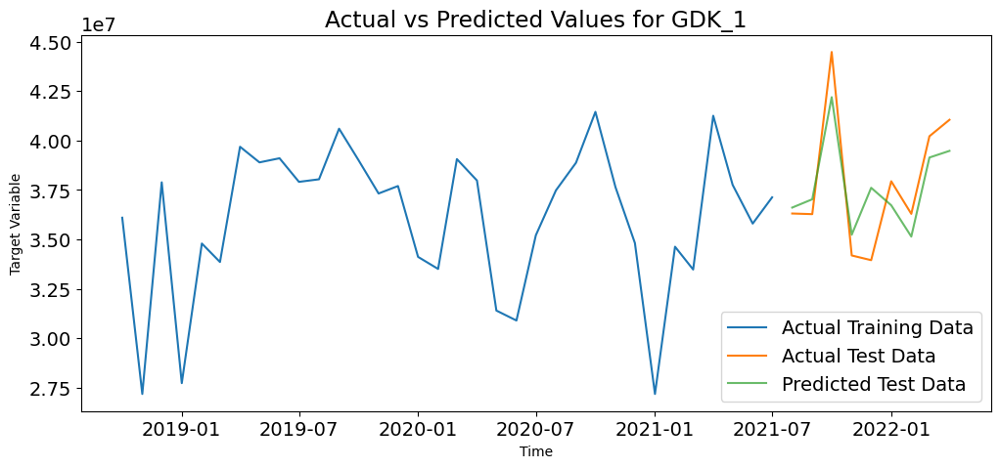

Test MAPE for GDK_1: 3.86 %
Test RMSE for GDK_1: 1726766.81
Train MAPE for GDK_1: 4.21 %
Train RMSE for GDK_1: 1790419.91


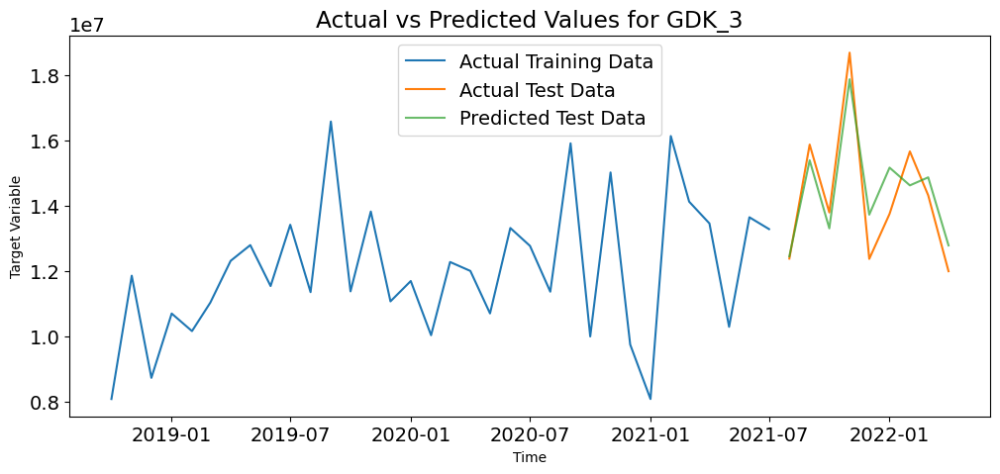

Test MAPE for GDK_3: 5.53 %
Test RMSE for GDK_3: 880732.96
Train MAPE for GDK_3: 6.0 %
Train RMSE for GDK_3: 893803.1


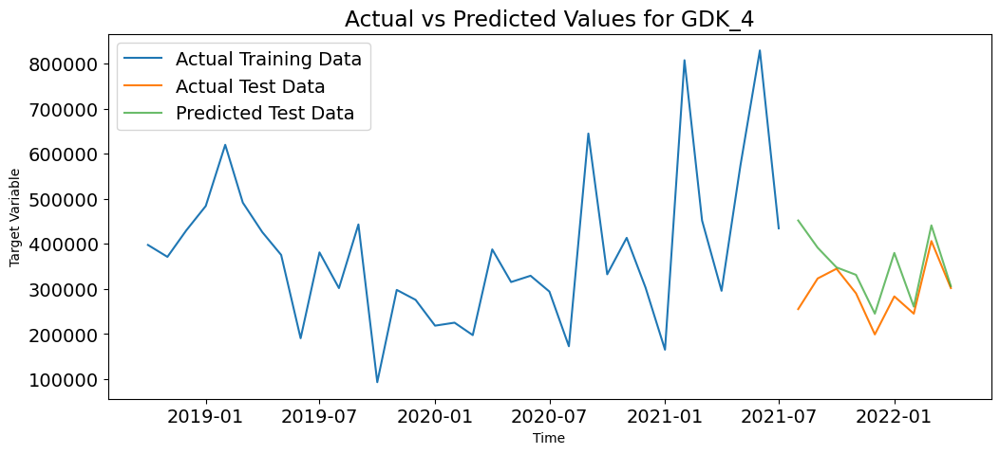

Test MAPE for GDK_4: 20.73 %
Test RMSE for GDK_4: 80243.92
Train MAPE for GDK_4: 15.46 %
Train RMSE for GDK_4: 72368.8


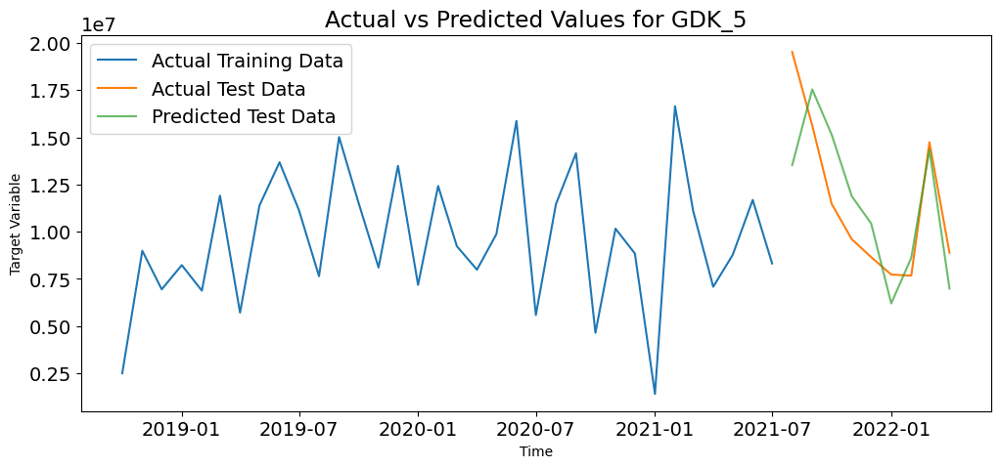

Test MAPE for GDK_5: 19.49 %
Test RMSE for GDK_5: 2757638.52
Train MAPE for GDK_5: 24.49 %
Train RMSE for GDK_5: 1763278.71


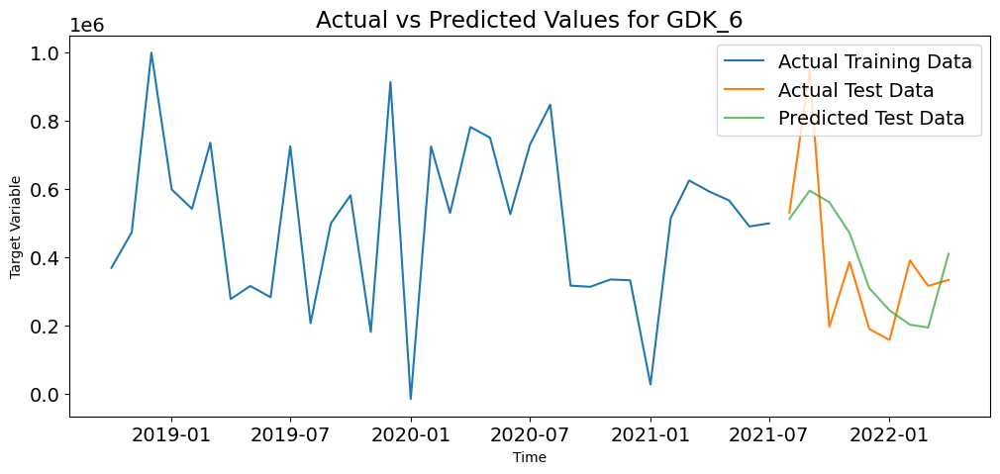

Test MAPE for GDK_6: 52.86 %
Test RMSE for GDK_6: 195225.34
Train MAPE for GDK_6: 108.87 %
Train RMSE for GDK_6: 178999.71


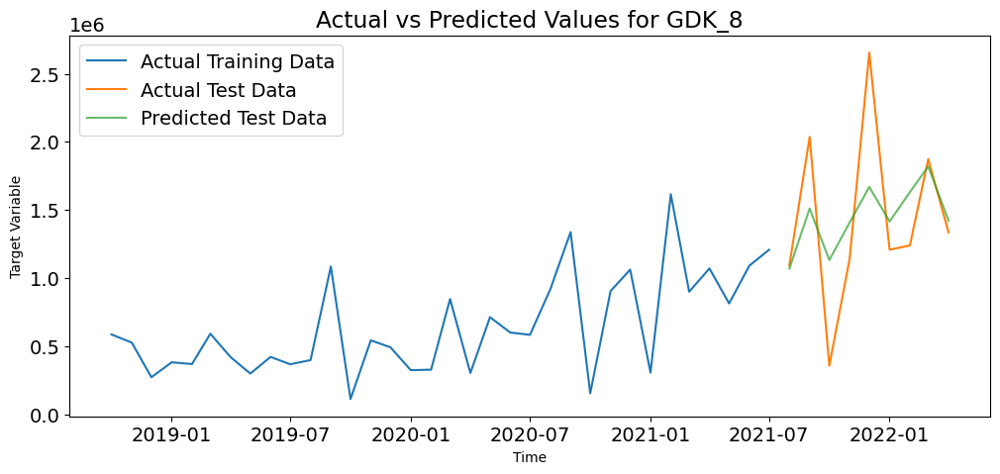

Test MAPE for GDK_8: 40.47 %
Test RMSE for GDK_8: 486231.62
Train MAPE for GDK_8: 35.4 %
Train RMSE for GDK_8: 196837.03


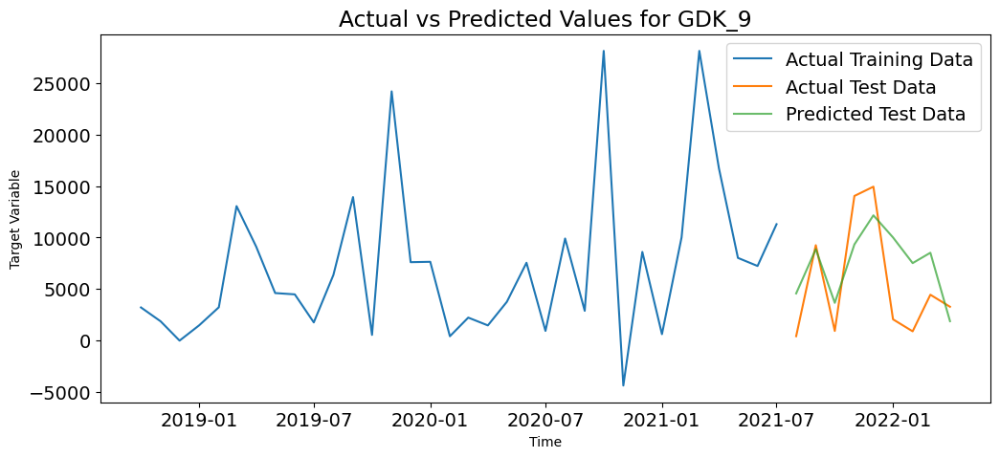

Test MAPE for GDK_9: 284.51 %
Test RMSE for GDK_9: 4473.23
Train MAPE for GDK_9: 2823.08 %
Train RMSE for GDK_9: 5307.88


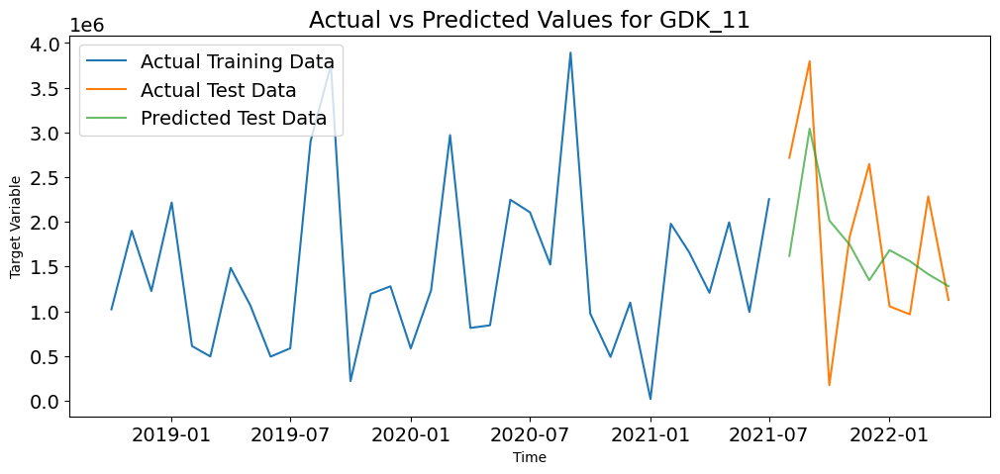

Test MAPE for GDK_11: 149.63 %
Test RMSE for GDK_11: 965508.54
Train MAPE for GDK_11: 201.5 %
Train RMSE for GDK_11: 801337.79


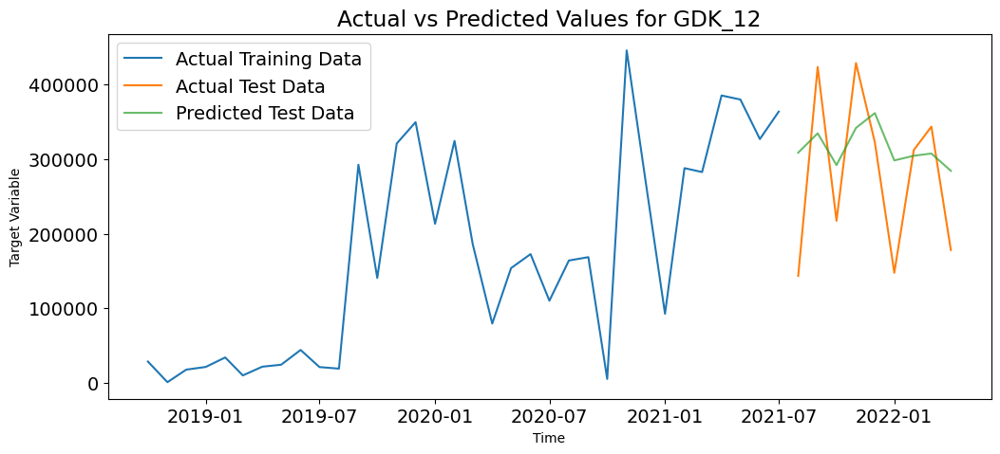

Test MAPE for GDK_12: 41.94 %
Test RMSE for GDK_12: 97272.71
Train MAPE for GDK_12: 133.87 %
Train RMSE for GDK_12: 54815.89


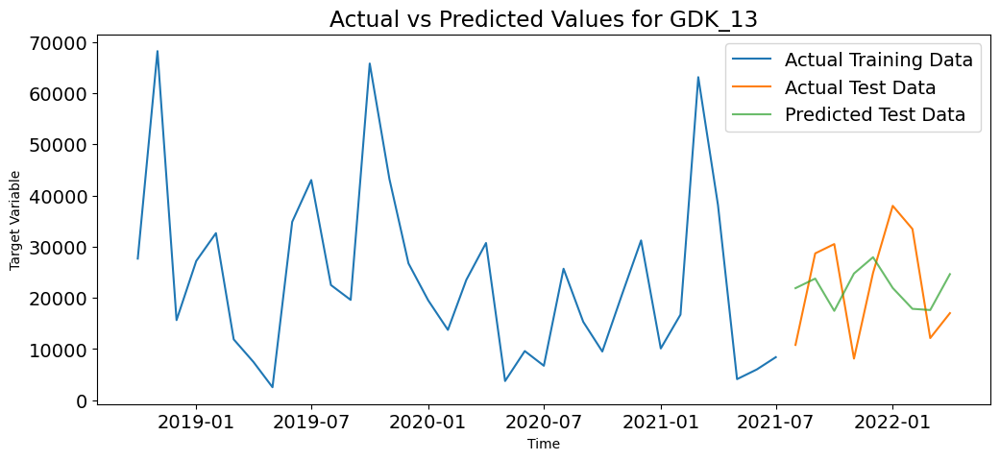

Test MAPE for GDK_13: 61.95 %
Test RMSE for GDK_13: 11503.46
Train MAPE for GDK_13: 74.83 %
Train RMSE for GDK_13: 14324.87


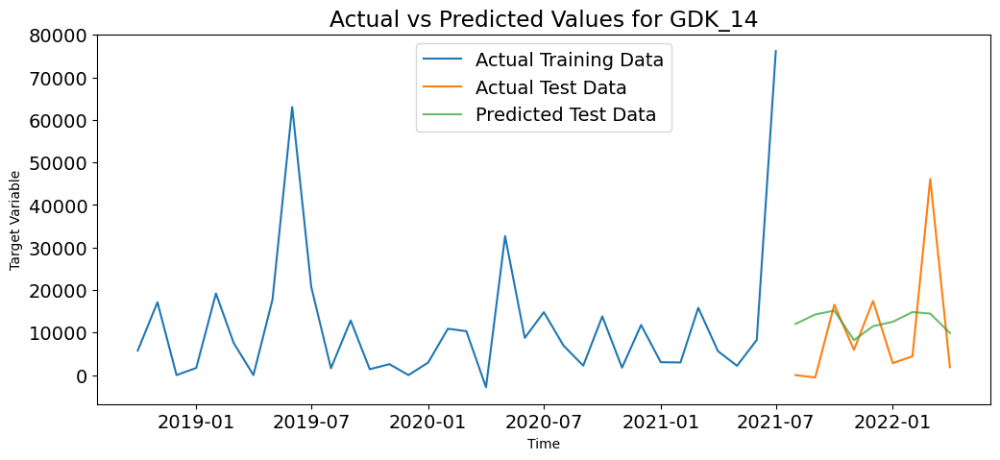

Test MAPE for GDK_14: 134158.8 %
Test RMSE for GDK_14: 13641.5
Train MAPE for GDK_14: 76063.99 %
Train RMSE for GDK_14: 15390.23


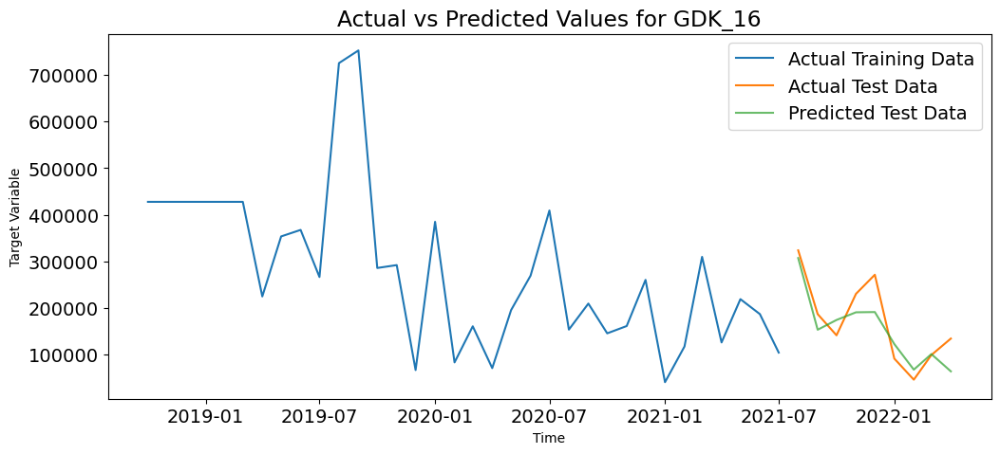

Test MAPE for GDK_16: 25.47 %
Test RMSE for GDK_16: 43319.29
Train MAPE for GDK_16: 28.42 %
Train RMSE for GDK_16: 85211.87


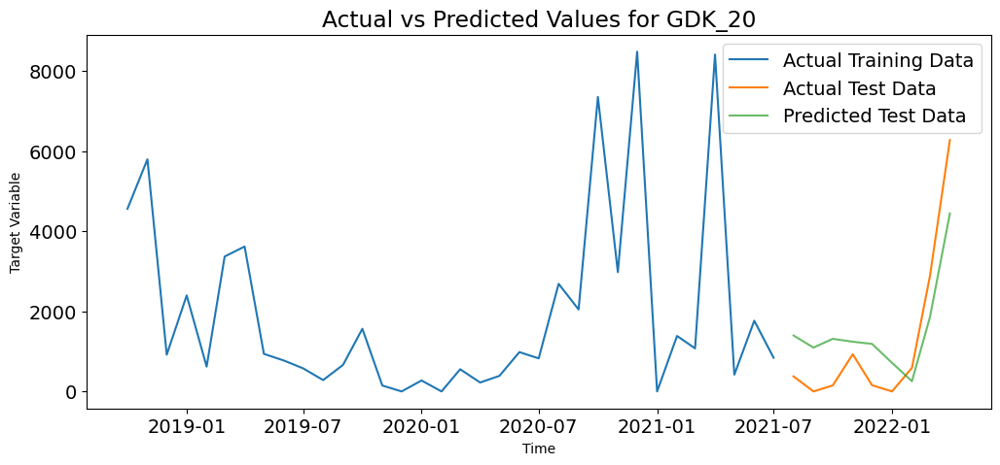

Test MAPE for GDK_20: 20322.33 %
Test RMSE for GDK_20: 1043.58
Train MAPE for GDK_20: 13773.27 %
Train RMSE for GDK_20: 1569.09


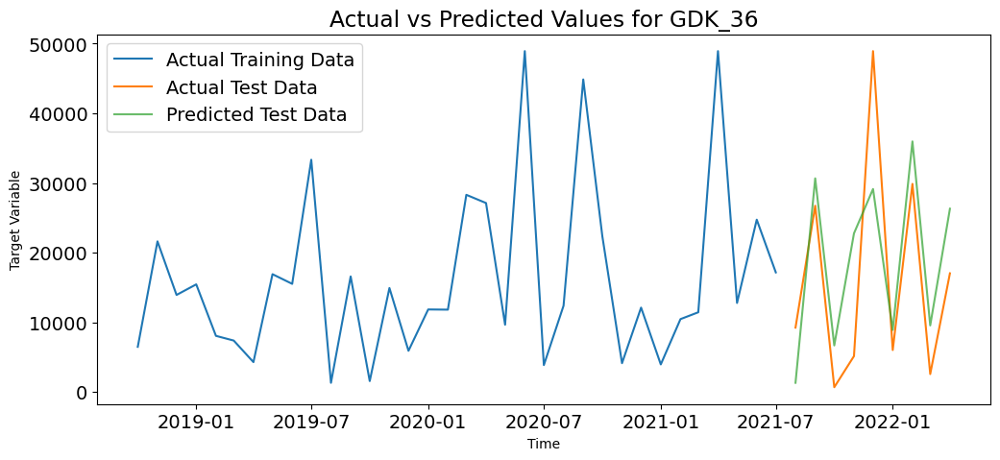

Test MAPE for GDK_36: 196.61 %
Test RMSE for GDK_36: 10525.52
Train MAPE for GDK_36: 92.89 %
Train RMSE for GDK_36: 8680.82


In [212]:
# Define a function to calculate the Mean Absolute Percentage Error (MAPE)
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Calculate MAPE
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Iterate through each number in the list 'numbers'
for num in numbers:
    # Load scaled train and test data for features and target variables
    train_x_scaled = globals()[f"reg_gdk_{num}_train_x_scaled"]
    test_x_scaled = globals()[f"reg_gdk_{num}_test_x_scaled"]
    train_y = globals()[f"reg_gdk_{num}_train_y"]
    test_y = globals()[f"reg_gdk_{num}_test_y"]
    
    # Initialize Linear Regression model
    model = LinearRegression()
    # Train the model with scaled training data
    model.fit(train_x_scaled, train_y)
    # Make predictions on train and test sets
    train_predictions_scaled = model.predict(train_x_scaled)
    test_predictions_scaled = model.predict(test_x_scaled)

    # Extract the index to use as a time axis in plots from train and test datasets
    time_train = train_x_scaled.index
    time_test = test_x_scaled.index

    # Plot actual vs. predicted values
    plt.figure(figsize=(12, 5))
    plt.plot(time_train, train_y, label='Actual Training Data')
    plt.plot(time_test, test_y, label='Actual Test Data')
    plt.plot(time_test, test_predictions_scaled, label='Predicted Test Data', alpha=0.7)
    plt.title(f'Actual vs Predicted Values for GDK_{num}')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

    # Calculate error metrics for both train and test sets: MAPE and RMSE
    test_mape = mean_absolute_percentage_error(test_y, test_predictions_scaled)
    test_rmse = np.sqrt(mean_squared_error(test_y, test_predictions_scaled))
    train_mape = mean_absolute_percentage_error(train_y, train_predictions_scaled)
    train_rmse = np.sqrt(mean_squared_error(train_y, train_predictions_scaled))
    # Show metrics results
    print(f"Test MAPE for GDK_{num}:", round(test_mape, 2), "%")
    print(f"Test RMSE for GDK_{num}:", round(test_rmse, 2))
    print(f"Train MAPE for GDK_{num}:", round(train_mape, 2), "%")
    print(f"Train RMSE for GDK_{num}:", round(train_rmse, 2))

# 8. Predictions on test data for the products

In [213]:
# Define a function to map month names to their correspondent numbers
def map_month(mon):
    # Dictionary mapping month names to numbers
    month_mapping = {
        'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04', 'Mai': '05', 'Jun': '06',
        'Jul': '07', 'Aug': '08', 'Sep': '09', 'Okt': '10', 'Nov': '11', 'Dez': '12'
    }
    # Return the corresponding number for the given month
    return month_mapping.get(mon[:3], 'NaN')

# Extract the month number using the 'map_month' function
test_data_template['Month'] = test_data_template['Month Year'].apply(map_month)
# Extract the year from the 'Month Year' column and add '20' to form a four-digit year
test_data_template['Year'] = '20' + test_data_template['Month Year'].str[-2:]

# Concatenate 'Year', 'Month', and '01' to form the desired format
test_data_template['Date'] = test_data_template['Year'] + '-' + test_data_template['Month'] + '-01'

# Convert the 'Date' column to datetime
test_data_template['Date'] = pd.to_datetime(test_data_template['Date'])

# Drop the columns: 'Year', 'Month', and 'Month Year' --> no longer needed
test_data_template = test_data_template.drop(['Year', 'Month', 'Month Year'], axis=1)
# Set 'Date' column as the index
test_data_template.set_index('Date', inplace=True)

### 8.1 Products 1, 3, 5, 9, 13, 16, 20 --> Linear Regression

In [214]:
import statsmodels.api as sm

# Subset of dataset identifiers selected for regression analysis
numbers_reg = [1,3,5,9,13,16,20]

# Dictionary to store model summaries
model_summaries = {}

# Iterate through each number in the list 'numbers_reg'
for num in numbers_reg:
    # Extract the target variable 'y' and features 'x' from the dataset
    y_train = globals()[f"df_gdk_{num}"][f'GDK_{num}']
    x_train = globals()[f"df_gdk_{num}"].drop(columns=f'GDK_{num}')
    
    # Add a constant to the model (it's required for OLS regression in statsmodels)
    x_train_with_const = sm.add_constant(x_train)

    # Fit the OLS regression model with the train data
    ols_model = sm.OLS(y_train, x_train_with_const).fit()

    # Store the model summary in the dictionary
    model_summaries[f"GDK_{num}"] = ols_model.summary()

    # Prepare the test dataset for predictions
    y_test = test_data_template[test_data_template['Mapped_GCK'] == f'#{num}'].rename(columns={'Sales_EUR': f'GDK_{num}'})
    y_test.drop(columns=['Mapped_GCK'], inplace=True)
    
     # Scaling the feature data for both train and test datasets using StandardScaler
    scaler = StandardScaler()
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(globals()[f"GDK_{num}_predicted_features"])
    scaled_data_train = pd.DataFrame(x_train_scaled, index=x_train.index, columns=x_train.columns)
    scaled_data_test = pd.DataFrame(x_test_scaled, index=globals()[f"GDK_{num}_predicted_features"].index, columns=globals()[f"GDK_{num}_predicted_features"].columns)

    # Ensure y_test is a DataFrame and fill NaN values with 0
    if isinstance(y_test, pd.Series):
        y_test = y_test.to_frame()
    y_test = y_test.fillna(0)

    # Store processed datasets
    globals()[f"reg_gdk_{num}_train_x_scaled"] = scaled_data_train
    globals()[f"reg_gdk_{num}_test_x_scaled"] = scaled_data_test
    globals()[f"reg_gdk_{num}_train_x"] = x_train 
    globals()[f"reg_gdk_{num}_test_x"] = globals()[f"GDK_{num}_predicted_features"]
    globals()[f"reg_gdk_{num}_train_y"] = y_train.to_frame()
    globals()[f"reg_gdk_{num}_test_y"] = y_test

In [215]:
# Model Summaries --> great source for interpretations

# Iterate through each number in the list 'numbers_reg'
for num in numbers_reg:
    # Show results
    print(f"Summary for GDK_{num}:")
    print(model_summaries[f"GDK_{num}"])
    print("\n")

Summary for GDK_1:
                            OLS Regression Results                            
Dep. Variable:                  GDK_1   R-squared:                       0.771
Model:                            OLS   Adj. R-squared:                  0.753
Method:                 Least Squares   F-statistic:                     43.70
Date:                Wed, 10 Apr 2024   Prob (F-statistic):           1.51e-12
Time:                        23:22:12   Log-Likelihood:                -679.45
No. Observations:                  43   AIC:                             1367.
Df Residuals:                      39   BIC:                             1374.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const      

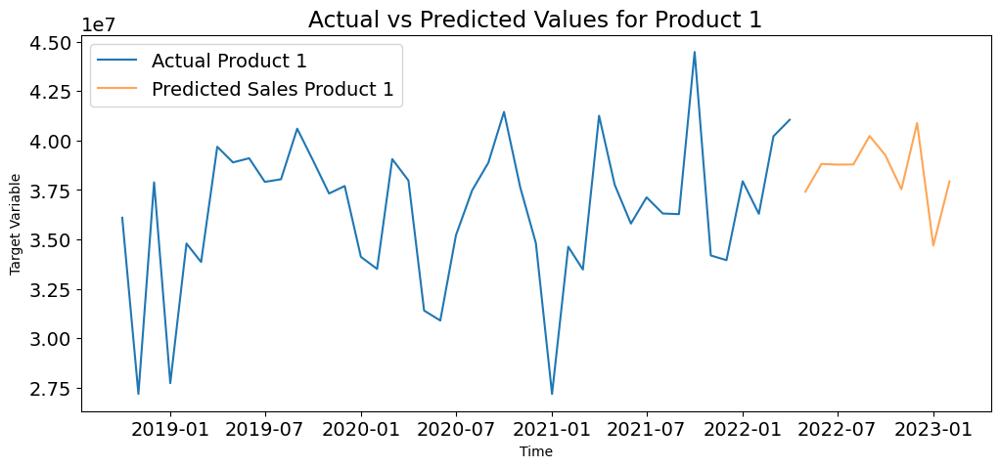

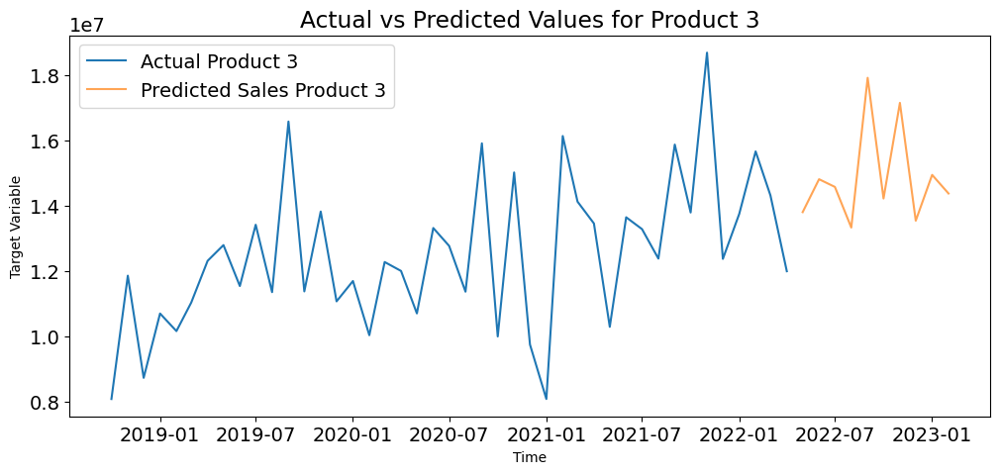

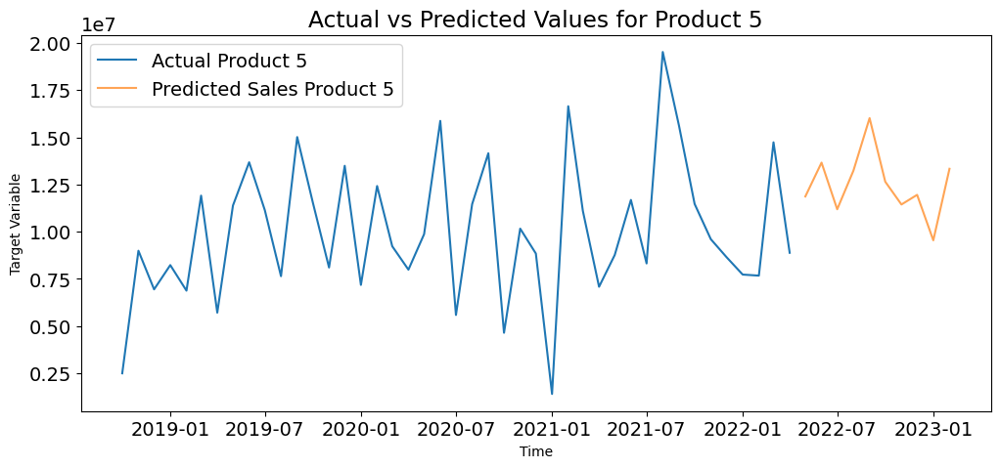

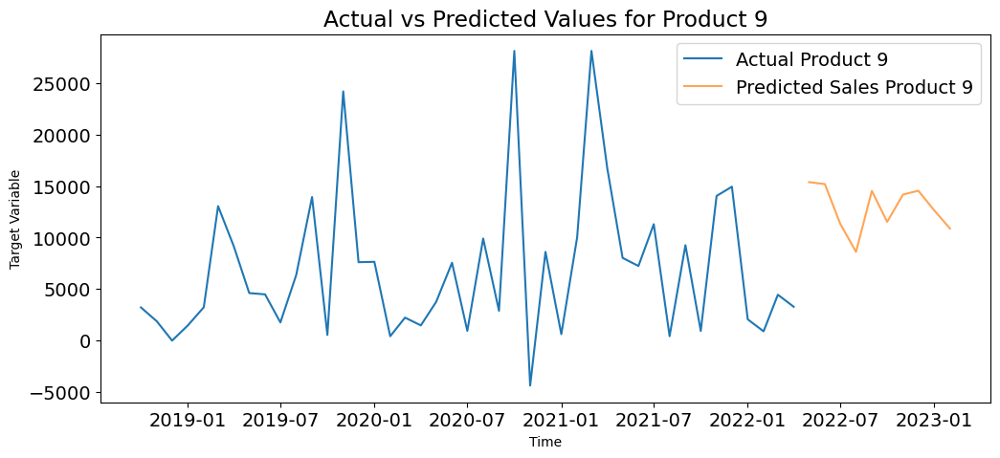

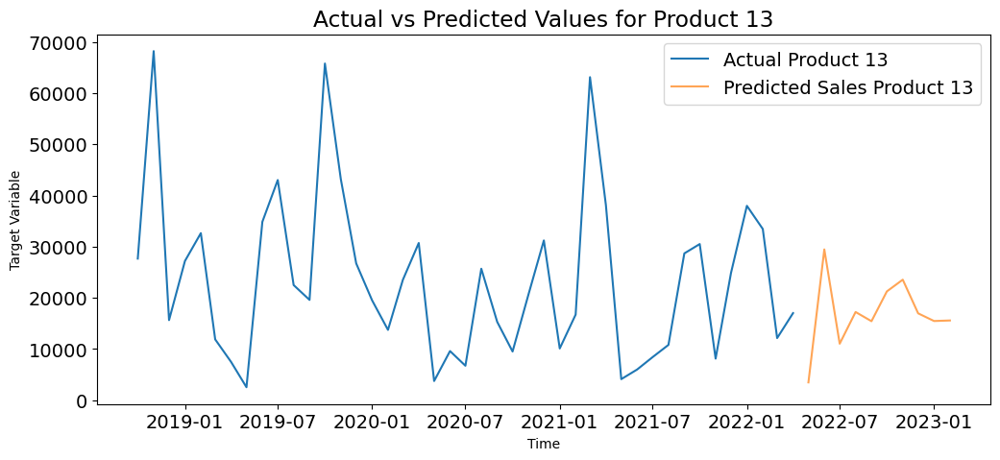

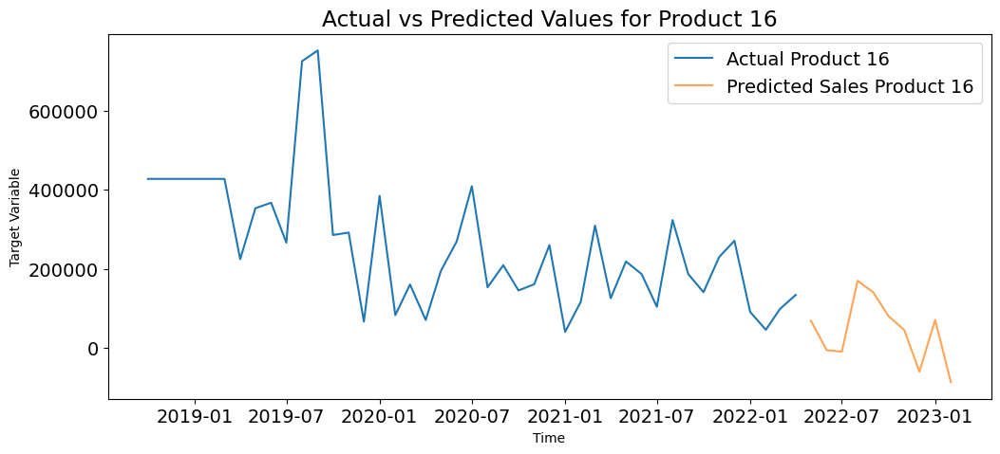

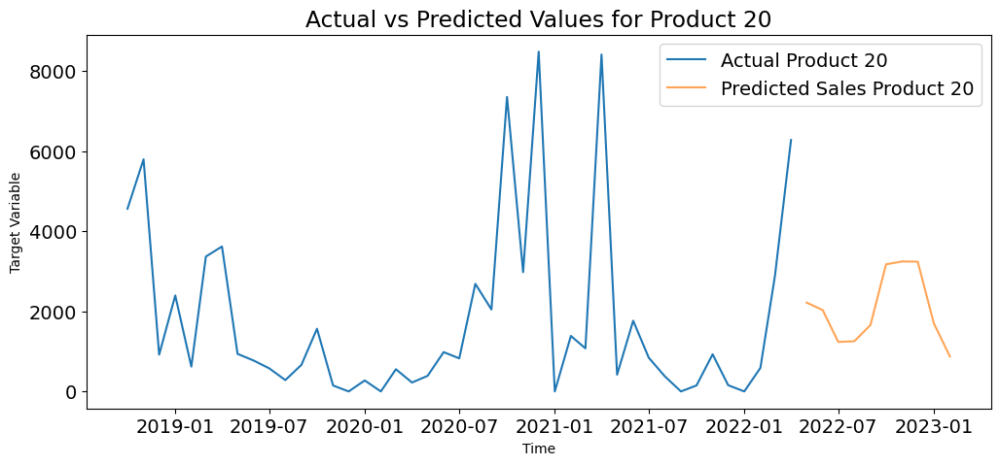

In [216]:
# Iterate through each number in the list 'numbers_reg'
for num in numbers_reg:
    # Load the preprocessed and scaled train and test feature datasets for the current product
    train_x_scaled = globals()[f"reg_gdk_{num}_train_x_scaled"]
    test_x_scaled = globals()[f"reg_gdk_{num}_test_x_scaled"]
    # Load the target data for train and test
    train_y = globals()[f"reg_gdk_{num}_train_y"]
    test_y = globals()[f"reg_gdk_{num}_test_y"]
    
    # Initialize Linear Regression model
    model = LinearRegression()
    # Fit the model to the scaled train data
    model.fit(train_x_scaled, train_y)
    # Make predictions on the train data
    train_predictions_scaled = model.predict(train_x_scaled)
    # Make predictions on the test data and store them
    globals()[f"y_pred_reg_{num}"] = model.predict(test_x_scaled)

    # Extract the index to use as a time axis in plots from train and test datasets
    time_train = train_x_scaled.index
    time_test = test_x_scaled.index

    # Plot actual vs. predicted values
    plt.figure(figsize=(12, 5))
    plt.plot(time_train, train_y, label=f'Actual Product {num}',)
    plt.plot(time_test, globals()[f"y_pred_reg_{num}"], label=f'Predicted Sales Product {num}', alpha=0.7)
    plt.title(f'Actual vs Predicted Values for Product {num}')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

### 8.2 Products 4, 6, 12, 36 --> XGBoost

In [217]:
# XGBoost datasets preparation

# Subset of dataset identifiers selected for XGBoost model training
numbers_XGboost = [4, 6, 12, 36]

# Iterate through each number in the list 'numbers_XGboost'
for num in numbers_XGboost:
    # Extract the test target data
    y_test = test_data_template[test_data_template['Mapped_GCK'] == f'#{num}'].rename(columns={'Sales_EUR': f'GDK_{num}'})
    # Drop the 'Mapped_GCK' column --> no longer needed after filtering
    y_test.drop(columns=['Mapped_GCK'], inplace=True)

    # Extract training data for specific GDK number
    y_train = globals()[f"df_gdk_{num}"][f'GDK_{num}']
    x_train = globals()[f"df_gdk_{num}"].drop(columns=f'GDK_{num}')

    # Initialize the scaler
    scaler = StandardScaler()
    # Scale the training feature data
    x_train_scaled = scaler.fit_transform(x_train)
    # Scale the test feature data
    x_test_scaled = scaler.transform(globals()[f"GDK_{num}_predicted_features"])
    # Convert scaled arrays back to DataFram
    scaled_data_train = pd.DataFrame(x_train_scaled, index=x_train.index, columns=x_train.columns)
    scaled_data_test = pd.DataFrame(x_test_scaled, index=globals()[f"GDK_{num}_predicted_features"].index, columns=globals()[f"GDK_{num}_predicted_features"].columns)

    # Ensure y_test is a DataFrame and fill NaN values with 0
    if isinstance(y_test, pd.Series):
        y_test = y_test.to_frame()
    y_test = y_test.fillna(0)

    # Assign the prepared datasets to global variables --> easy access
    globals()[f"xgb_scaled_data_train_{num}"] = scaled_data_train
    globals()[f"xgb_scaled_data_test_{num}"] = scaled_data_test
    globals()[f"xgb_y_train_{num}"] = y_train.to_frame()
    globals()[f"xgb_y_test_{num}"] = y_test

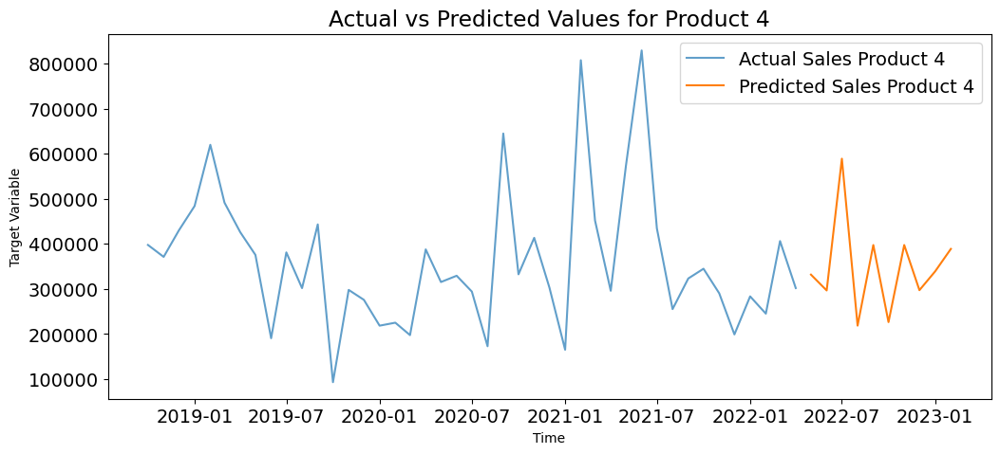

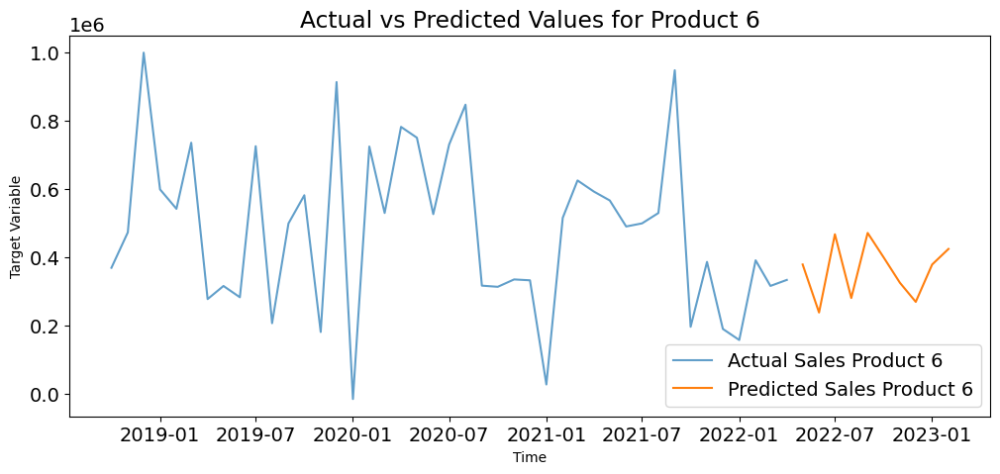

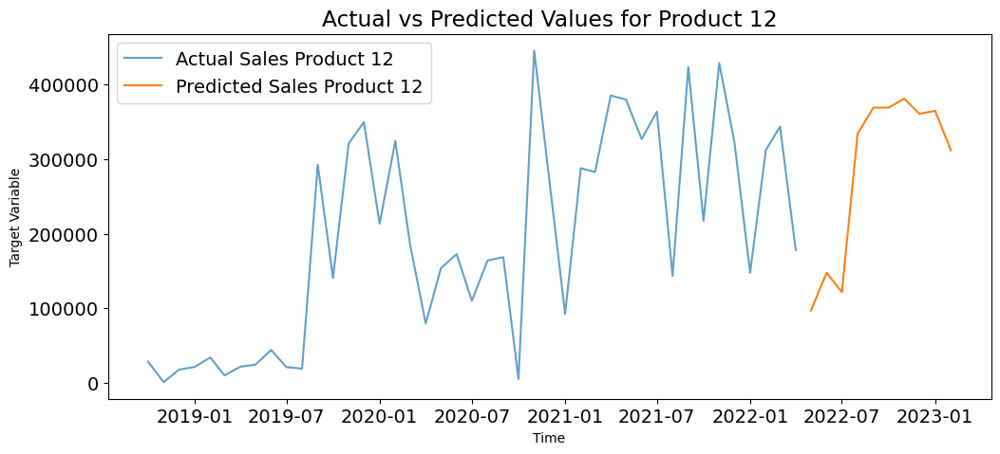

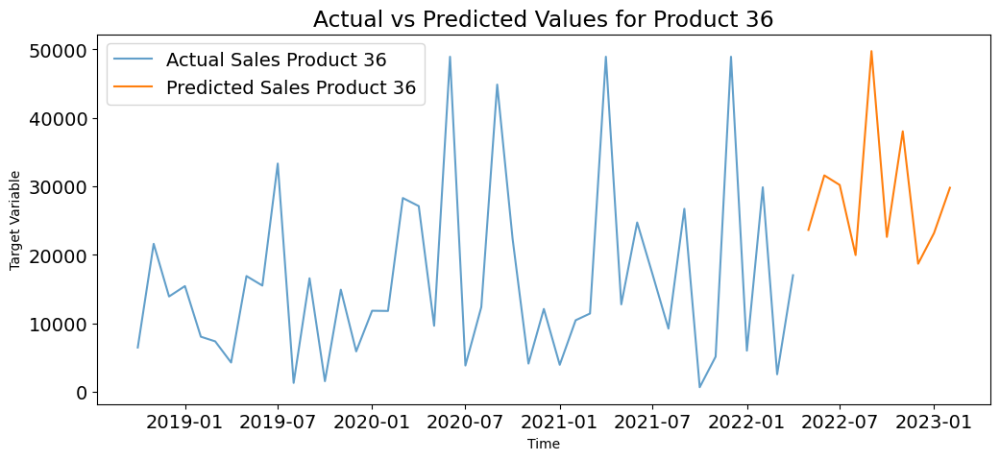

In [218]:
# Iterate through each number (i) in the list 'numbers_XGboost'
for i in numbers_XGboost:
    # Retriev scaled training data for the current product
    xgb_scaled_data_train = globals()[f'xgb_scaled_data_train_{i}']
    xgb_y_train = globals()[f'xgb_y_train_{i}']
    xgb_scaled_data_test = globals()[f'xgb_scaled_data_test_{i}']

    # Convert data to DMatrix format
    dtrain = xgb.DMatrix(xgb_scaled_data_train, label=xgb_y_train)

    # Define model parameters
    params = {
        'max_depth': 5,
        'eta': 0.1,
        'objective': 'reg:squarederror',
    }

    # Number of training iterations
    num_round = 100

    # Train the model
    model = xgb.train(params, dtrain, num_round)
    # Make predictions on the train dataset
    dfuture = xgb.DMatrix(xgb_scaled_data_train)
    y_pred_future = model.predict(dfuture)
    # Make predictions on the test dataset
    dtest = xgb.DMatrix(xgb_scaled_data_test)
    globals()[f'y_pred_xgb_{i}'] = model.predict(dtest)

    # Extract the index to use as a time axis in plots from train and test datasets
    time_train = xgb_scaled_data_train.index
    time_test = xgb_scaled_data_test.index
    
    # Plot actual vs predicted values
    plt.figure(figsize=(12, 5))
    plt.plot(time_train, xgb_y_train, label=f'Actual Sales Product {i}', alpha=0.7)
    plt.plot(time_test, globals()[f'y_pred_xgb_{i}'], label=f'Predicted Sales Product {i}')
    plt.title(f'Actual vs Predicted Values for Product {i}')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

### 8.3 Products 8, 14 --> Prophet

In [219]:
# Subset of dataset identifiers selected for Prophet model training
numbers_prophet=[8,14]

# Iterate through each number in the list 'numbers_prophet'
for num in numbers_prophet:
    # Extract the test target data
    y_test = test_data_template[test_data_template['Mapped_GCK'] == f'#{num}'].rename(columns={'Sales_EUR': f'GDK_{num}'})
    # Drop the 'Mapped_GCK' column --> no longer needed after filtering
    y_test.drop(columns=['Mapped_GCK'], inplace=True)
    
    # Create the dataset name based on the current number
    dataset_name = f"df_gdk_{num}"
    # Create the name that will be used with Prophet
    prophet_dataset_name = f"prophet_gdk_{num}"
    # Copy the original dataset --> preserve the original
    train_set = globals()[dataset_name].copy()

    # Merge test target data with predicted features on date
    test_set=pd.merge(y_test, globals()[f"GDK_{num}_predicted_features"], left_on='Date', right_on='ds', how='inner')
    # Set the same index --> consistency
    test_set.set_index(GDK_8_predicted_features.index, inplace=True)
    
    # Prepare the train and test sets: reset index and rename columns --> Prophet compatibility
    train_set = train_set.reset_index().rename(columns={'index':'ds', f'GDK_{num}':'y'})
    test_set = test_set.reset_index().rename(columns={'index':'ds', f'GDK_{num}':'y'})
    
    # Store prepared datasets
    globals()[f"prophet_data_train_{num}"] = train_set
    globals()[f"prophet_data_test_{num}"] = test_set

23:22:21 - cmdstanpy - INFO - Chain [1] start processing
23:22:22 - cmdstanpy - INFO - Chain [1] done processing


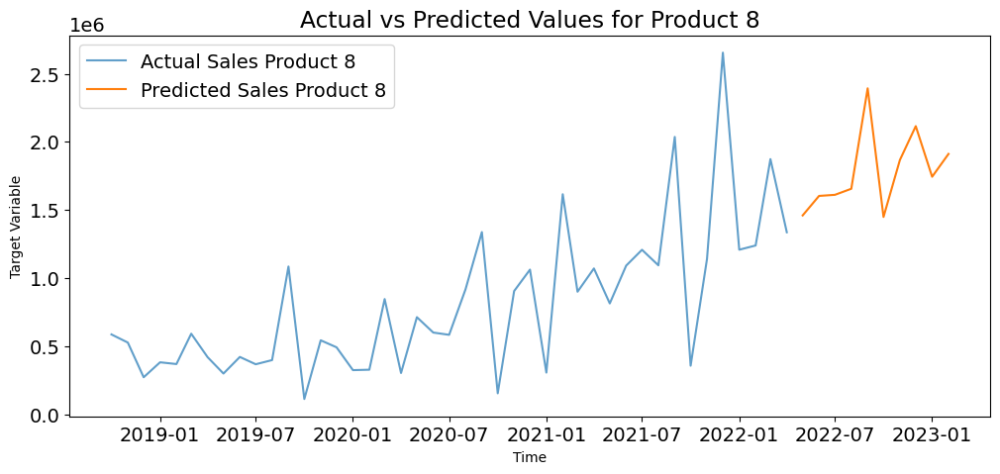

23:22:23 - cmdstanpy - INFO - Chain [1] start processing
23:22:24 - cmdstanpy - INFO - Chain [1] done processing


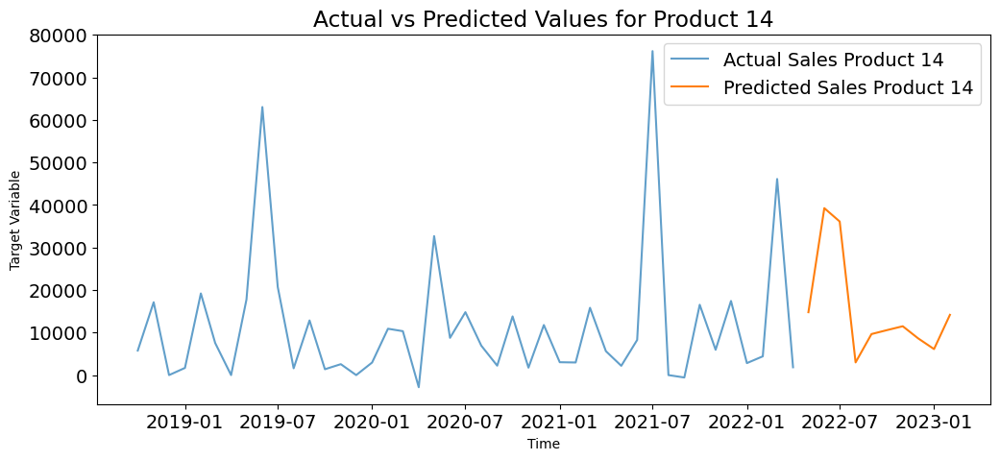

In [220]:
# Iterate through each number in the list 'numbers_prophet'
for num in numbers_prophet:
    # Initialize Prophet model
    model = Prophet()
    # Extract the list of features to be used as additional regressors in the model
    features = globals()[f"GDK_{num}_features"]
    # Add each feature as a regressor to the Prophet model
    for feature in features:
        model.add_regressor(feature)    

    # Fit the model to the prepared train data
    model.fit(globals()[f"prophet_data_train_{num}"])
    # Make predictions on the test dataset
    globals()[f"y_pred_prophet_{num}"] = model.predict(globals()[f"prophet_data_test_{num}"])

    # Extract the index to use as a time axis in plots from train and test datasets
    time_train = globals()[f"prophet_data_train_{num}"]['ds']
    time_test = globals()[f"prophet_data_test_{num}"]['ds']
    
    # Extract the column with the predicted values
    globals()[f"y_pred_prophet_{num}"] = globals()[f"y_pred_prophet_{num}"]['yhat']
    
    # Plot actual vs predicted values
    plt.figure(figsize=(12, 5))
    plt.plot(time_train, globals()[f"prophet_data_train_{num}"]['y'], label=f'Actual Sales Product {num}', alpha=0.7)
    plt.plot(time_test, globals()[f"y_pred_prophet_{num}"], label=f'Predicted Sales Product {num}')
    plt.title(f'Actual vs Predicted Values for Product {num}')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

### 8.4 Product 11 --> SARIMAX

In [221]:
# Dataset identifier selected for ARIMA model training
numbers_sar=[11]

# Iterate through each number in the list 'numbers_sar'
for num in numbers_sar:
    # Extract test target data
    y_test = test_data_template[test_data_template['Mapped_GCK'] == f'#{num}'].rename(columns={'Sales_EUR': f'GDK_{num}'})
    # Drop the 'Mapped_GCK' column --> no longer needed after filtering
    y_test.drop(columns=['Mapped_GCK'], inplace=True)
    
    # Create the dataset name based on the current number
    dataset_name = f"df_gdk_{num}"
    # Create the name that will be used with ARIMA
    sarimax_dataset_name = f"sarimax_gdk_{num}"
    # Copy the original dataset --> preserve the original
    train_set = globals()[dataset_name].copy() 

    # Merge test target data with predicted features on date
    test_set=pd.merge(y_test, globals()[f"GDK_{num}_predicted_features"], left_on='Date', right_on='ds', how='inner')
    test_set.set_index(GDK_8_predicted_features.index, inplace=True)
    
    # Store the prepared datasets
    globals()[f"sarimax_data_train_{num}"] = train_set
    globals()[f"sarimax_data_test_{num}"] = test_set

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=907.663, Time=0.53 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=943.769, Time=0.05 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=927.651, Time=0.16 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=909.042, Time=0.38 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(1,2,1)(1,1,1)[12]             : AIC=908.836, Time=0.72 sec
 ARIMA(1,2,1)(0,1,2)[12]             : AIC=908.783, Time=0.60 sec
 ARIMA(1,2,1)(1,1,0)[12]             : AIC=906.973, Time=0.37 sec
 ARIMA(1,2,1)(2,1,0)[12]             : AIC=908.809, Time=0.70 sec
 ARIMA(1,2,1)(2,1,1)[12]             : AIC=910.754, Time=1.28 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=908.123, Time=0.25 sec
 ARIMA(2,2,1)(1,1,0)[12]             : AIC=896.569, Time=0.50 sec
 ARIMA(2,2,1)(0,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(2,2,1)(2,1,0)[12]             : AIC=896.997, Time=1.08 sec
 ARIMA(2,2,1)(1,1,1)[12]             : AI

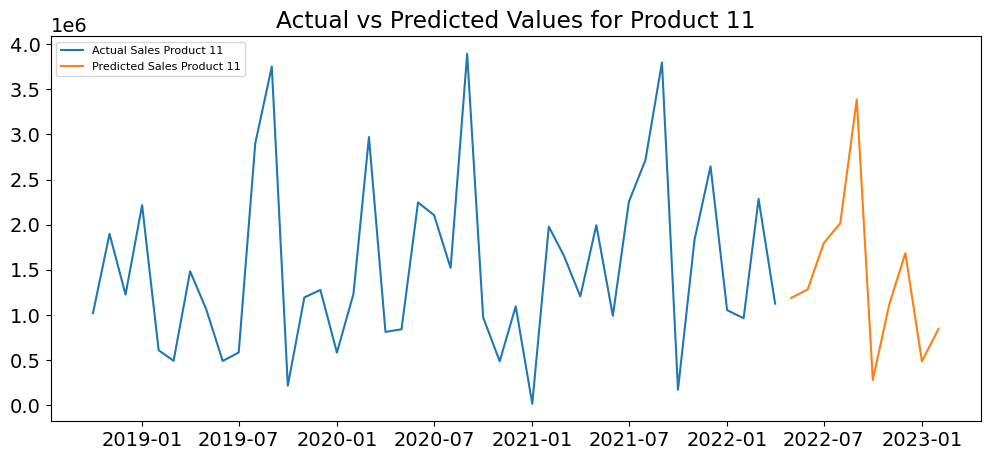

In [222]:
# Iterate through each number in the list 'numbers_sar'
for num in numbers_sar:
    # Retrieve the train and test datasets specific to the product
    train_data = globals()[f"sarimax_data_train_{num}"]
    test_data = globals()[f"sarimax_data_test_{num}"]
    # Extract features specific to the product
    features = globals()[f"GDK_{num}_features"]
    
    # Fit the model using auto arima --> automatically determines the best ARIMA parameters
    sxmodel = auto_arima(train_data[[f'GDK_{num}']], exogenous=train_data[features],
                         start_p=1, start_q=1,
                         test='adf',
                         max_p=3, max_q=3, m=12,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,
                         error_action='ignore',
                         suppress_warnings=True,
                         stepwise=True)

    # Forecast using the fitted model over the test dataset
    forecast_results = sxmodel.predict(n_periods=len(test_data),
                                       exogenous=test_data[features],
                                       return_conf_int=True)
    # Extract forecasted values
    fc, conf = forecast_results
    # Index --> Align forecasted values with their corresponding dates
    index_of_fc = test_data.index

    # Create pandas Series for forecasted values and confidence intervals
    fc_series = pd.Series(fc, index=index_of_fc)
    lower_series = pd.Series(conf[:, 0], index=index_of_fc)
    upper_series = pd.Series(conf[:, 1], index=index_of_fc)

    # Save the forecast series with the desired name
    globals()[f"y_pred_sarimax_{num}"] = fc_series

    # Plot actual vs predicted values
    plt.figure(figsize=(12, 5), dpi=100)
    plt.plot(train_data[f'GDK_{num}'], label=f'Actual Sales Product {num}')  
    #plt.plot(test_data[f'GDK_{num}'], label=f'Predicted Sales Product {num}')  # Ensure this plots the testing set correctly
    plt.plot(fc_series, label=f'Predicted Sales Product {num}')
    #plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=0.15)
    plt.title(f'Actual vs Predicted Values for Product {num}')
    plt.legend(loc='upper left', fontsize=8)
    plt.show()

#### 8.5 Joining predictions to the template

In [223]:
# Create a deep copy of the test data
test_data_trial=test_data_copy.copy()
# Show content of 'test_data_trial'
test_data_trial

,Month Year,Mapped_GCK,Sales_EUR
0,Mai 22,#3,NaN
1,Jun 22,#3,NaN
2,Jul 22,#3,NaN
3,Aug 22,#3,NaN
4,Sep 22,#3,NaN
5,Okt 22,#3,NaN
6,Nov 22,#3,NaN
7,Dez 22,#3,NaN
8,Jan 23,#3,NaN
9,Feb 23,#3,NaN


**THE PREDICTIONS WHERE ADDED MANUALLY TO THE TEST SET TEMPLATE FILE**

In [224]:
print(y_pred_reg_3)

[[13806910.06547048]
 [14814839.13966654]
 [14579234.65104163]
 [13335891.0513743 ]
 [17917531.95269822]
 [14225320.84221758]
 [17150921.50869927]
 [13545721.26460883]
 [14947446.43542083]
 [14378456.61068133]]


In [225]:
print(y_pred_xgb_4)


[331924.6  296793.88 589188.1  218707.58 397633.28 226540.44 397633.28
 297414.38 339114.7  388997.94]


In [226]:
print(y_pred_reg_5)


[[11871548.99619338]
 [13663756.09159791]
 [11191154.92979308]
 [13232798.74047996]
 [16022630.07328795]
 [12652675.41702853]
 [11444510.25893921]
 [11956078.90133647]
 [ 9546451.32879543]
 [13336729.31808859]]


In [227]:
print(y_pred_xgb_6)


[378885.1  238222.38 467469.66 280720.38 471361.12 400308.16 325428.47
 269435.   378836.28 424503.62]


In [228]:
print(y_pred_prophet_8)


0    1.459943e+06
1    1.603171e+06
2    1.611156e+06
3    1.655613e+06
4    2.393062e+06
5    1.448592e+06
6    1.867051e+06
7    2.115476e+06
8    1.743890e+06
9    1.911500e+06
Name: yhat, dtype: float64


In [229]:
print(y_pred_reg_9)

[[15375.67284682]
 [15185.45741318]
 [11344.67097785]
 [ 8608.29329042]
 [14527.5771517 ]
 [11521.6596029 ]
 [14170.14962429]
 [14543.64930765]
 [12644.33176802]
 [10872.42768646]]


In [230]:
print(y_pred_sarimax_11)


ds
2022-05-01    1.189659e+06
2022-06-01    1.283828e+06
2022-07-01    1.794442e+06
2022-08-01    2.015814e+06
2022-09-01    3.386322e+06
2022-10-01    2.820747e+05
2022-11-01    1.120989e+06
2022-12-01    1.684837e+06
2023-01-01    4.883520e+05
2023-02-01    8.448640e+05
dtype: float64


In [231]:
print(y_pred_xgb_12)


[ 97101.93 147800.45 121780.34 334046.   368987.2  368987.2  381033.7
 360727.38 364710.38 311952.44]


In [232]:
print(y_pred_reg_13)


[[ 3492.61282531]
 [29458.96693861]
 [11044.21670585]
 [17240.14679506]
 [15439.81759226]
 [21260.67515247]
 [23552.6199043 ]
 [16976.07333575]
 [15478.92885389]
 [15584.56581654]]


In [233]:
print(y_pred_prophet_14)


0    14782.072855
1    39245.223387
2    36106.150418
3     2985.622797
4     9647.009606
5    10568.449330
6    11485.151043
7     8635.092714
8     6116.635451
9    14165.769893
Name: yhat, dtype: float64


In [234]:
print(y_pred_reg_16)


[[ 68695.79688998]
 [ -5790.35113601]
 [ -9694.03462746]
 [169726.04547531]
 [140458.56710043]
 [ 80217.54339217]
 [ 45445.06585627]
 [-60417.49232924]
 [ 70830.24082963]
 [-86897.85787193]]


In [235]:
print(y_pred_reg_20)


[[2219.87992898]
 [2032.67072117]
 [1236.5322634 ]
 [1254.77858023]
 [1660.23291772]
 [3175.86326193]
 [3246.8902898 ]
 [3242.36974734]
 [1703.04204799]
 [ 874.96878651]]


In [236]:
print(y_pred_xgb_36)


[23640.734 31607.697 30207.89  19973.07  49753.434 22621.99  38038.92
 18711.705 23185.348 29799.31 ]


In [237]:
print(y_pred_reg_1)

[[37412143.91813868]
 [38821810.30305327]
 [38786302.08421563]
 [38791488.05669522]
 [40233946.18166809]
 [39266769.26857924]
 [37537407.65453096]
 [40887196.1638575 ]
 [34688863.38256662]
 [37937715.40927891]]
